In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches

import os
import math
import random

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm
from scipy.stats import multivariate_normal

In [2]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [3]:
!pip install xgboost

import xgboost
from xgboost import XGBRegressor, XGBClassifier

You should consider upgrading via the '/home/andres/anaconda3/bin/python -m pip install --upgrade pip' command.


### FUNCTIONS

In [4]:
def XG(X_train, X_test, X_val, Y_train, Y_test, Y_val, n_estimators=500,
        learning_rate=0.1,
        reg_lambda=0.0,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        early_stopping_rounds=50):
    
    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        reg_lambda=reg_lambda,reg_alpha=reg_alpha,
        gamma=gamma,objective='binary:logistic',
        max_depth=max_depth)

    # FIT
    classifier.fit(X_train,Y_train,eval_set=[(X_train, Y_train), (X_val, Y_val)],
            eval_metric='logloss',early_stopping_rounds=early_stopping_rounds,#early stopping
            verbose=True)

    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_test).T[1]


    # ROC
    fpr_xg, tpr_xg, _ = roc_curve(Y_test, y_pred_xg)
    roc_auc_xg = auc(fpr_xg, tpr_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_xg,1-fpr_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.title(r"XGBoost",fontsize=16)
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()
    
    return roc_auc_xg, y_pred_xg

### GAUSSIAN

In [5]:
##############
# PARAMETERS #
##############

# gaussian, mean
epsilon = 0.3

# number of events
N = 3000000

# requested number of ensembles
n_ensembles = 10000

# number of expected background events per ensemble
B_expected = 50000

# ratio S_expected/B_expected (signal ratio)
SB_ratio = 0.01

# number of ML classifiers to do bagging
iterations_ML = 10



# SOME USEFUL DERIVATED PARAMETERS:

# S_expected:
S_expected = 500

# S/\sqrt{B}
SsqrtB = 500/(50000)**0.5




ntrials = 5000

### COMPUTE

In [6]:
store_AUC = []

# eq size with cross-val method to determine Nbin
Z_bins_XG_CV0 = []
Z_bins_XG_CV1 = []
Z_bins_XG_CV2 = []


# cross-val method to determine the random binning
CV0_chi2 = []
CV1_chi2 = []
CV2_chi2 = []

CV0_chi2_N = []
CV1_chi2_N = []
CV2_chi2_N = []

CV0_MSE = []
CV1_MSE = []
CV2_MSE = []

CV0_poiss = []
CV1_poiss = []
CV2_poiss = []


CV0_chi2_eqsize = []
CV1_chi2_eqsize = []
CV2_chi2_eqsize = []

CV0_chi2_N_eqsize = []
CV1_chi2_N_eqsize = []
CV2_chi2_N_eqsize = []

CV0_MSE_eqsize = []
CV1_MSE_eqsize = []
CV2_MSE_eqsize = []

CV0_poiss_eqsize = []
CV1_poiss_eqsize = []
CV2_poiss_eqsize = []


# random with cross-val method to determine Nbin and cross-val method to determine the random binning
Z_bins_XG_CV0_chi2 = []
Z_bins_XG_CV1_chi2 = []
Z_bins_XG_CV2_chi2 = []

Z_bins_XG_CV0_chi2_N = []
Z_bins_XG_CV1_chi2_N = []
Z_bins_XG_CV2_chi2_N = []

Z_bins_XG_CV0_MSE = []
Z_bins_XG_CV1_MSE = []
Z_bins_XG_CV2_MSE = []

Z_bins_XG_CV0_poiss = []
Z_bins_XG_CV1_poiss = []
Z_bins_XG_CV2_poiss = []



# THE SAME but replacin the zeros in the binning
# eq size with cross-val method to determine Nbin
Z_bins_XG_CV0_zeros = []
Z_bins_XG_CV1_zeros = []
Z_bins_XG_CV2_zeros = []



# cross-val method to determine the random binning
CV0_chi2_zeros = []
CV1_chi2_zeros = []
CV2_chi2_zeros = []

CV0_chi2_N_zeros = []
CV1_chi2_N_zeros = []
CV2_chi2_N_zeros = []

CV0_MSE_zeros = []
CV1_MSE_zeros = []
CV2_MSE_zeros = []

CV0_poiss_zeros = []
CV1_poiss_zeros = []
CV2_poiss_zeros = []


CV0_chi2_eqsize_zeros = []
CV1_chi2_eqsize_zeros = []
CV2_chi2_eqsize_zeros = []

CV0_chi2_N_eqsize_zeros = []
CV1_chi2_N_eqsize_zeros = []
CV2_chi2_N_eqsize_zeros = []

CV0_MSE_eqsize_zeros = []
CV1_MSE_eqsize_zeros = []
CV2_MSE_eqsize_zeros = []

CV0_poiss_eqsize_zeros = []
CV1_poiss_eqsize_zeros = []
CV2_poiss_eqsize_zeros = []


# random with cross-val method to determine Nbin and cross-val method to determine the random binning
Z_bins_XG_CV0_chi2_zeros = []
Z_bins_XG_CV1_chi2_zeros = []
Z_bins_XG_CV2_chi2_zeros = []

Z_bins_XG_CV0_chi2_N_zeros = []
Z_bins_XG_CV1_chi2_N_zeros = []
Z_bins_XG_CV2_chi2_N_zeros = []

Z_bins_XG_CV0_MSE_zeros = []
Z_bins_XG_CV1_MSE_zeros = []
Z_bins_XG_CV2_MSE_zeros = []

Z_bins_XG_CV0_poiss_zeros = []
Z_bins_XG_CV1_poiss_zeros = []
Z_bins_XG_CV2_poiss_zeros = []


X_gauss_train :  (2000000, 1)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 1)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 1)
y_gauss_test :  (2000000, 1)



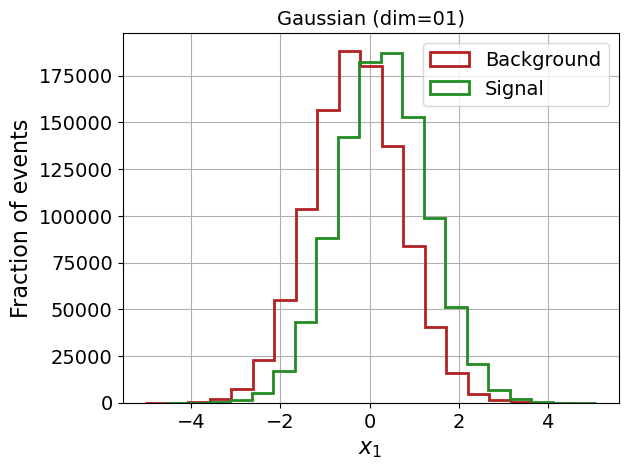

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.68529	validation_1-logloss:0.68529
[1]	validation_0-logloss:0.67891	validation_1-logloss:0.67892
[2]	validation_0-logloss:0.67371	validation_1-logloss:0.67373
[3]	validation_0-logloss:0.66946	validation_1-logloss:0.66948
[4]	validation_0-logloss:0.66598	validation_1-logloss:0.66601
[5]	validation_0-logloss:0.66313	validation_1-logloss:0.66316
[6]	validation_0-logloss:0.66079	validation_1-logloss:0.66082
[7]	validation_0-logloss:0.65887	validation_1-logloss:0.65890
[8]	validation_0-logloss:0.65729	validation_1-logloss:0.65733
[9]	validation_0-logloss:0.65599	validation_1-logloss:0.65603
[10]	validation_0-logloss:0.65492	validation_1-logloss:0.65497
[11]	validation_0-logloss:0.65405	validation_1-logloss:0.65410
[12]	validation_0-logloss:0.65332	validation_1-logloss:0.65339
[13]	validation_0-logloss:0.65273	validation_1-logloss:0.65280
[14]	validation_0-logloss:0.65225	validation_1-logloss:0.65232
[15]	validation_0-logloss:0.65185	validation_1-logloss:0.65193
[1

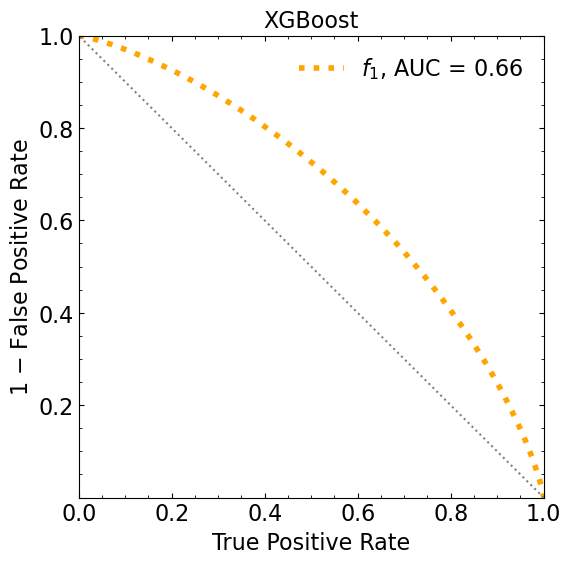

ML iteration 0
[0]	validation_0-logloss:0.68530	validation_1-logloss:0.68538
[1]	validation_0-logloss:0.67891	validation_1-logloss:0.67908


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.67369	validation_1-logloss:0.67394
[3]	validation_0-logloss:0.66939	validation_1-logloss:0.66975
[4]	validation_0-logloss:0.66587	validation_1-logloss:0.66631
[5]	validation_0-logloss:0.66298	validation_1-logloss:0.66349
[6]	validation_0-logloss:0.66058	validation_1-logloss:0.66117
[7]	validation_0-logloss:0.65859	validation_1-logloss:0.65927
[8]	validation_0-logloss:0.65695	validation_1-logloss:0.65771
[9]	validation_0-logloss:0.65557	validation_1-logloss:0.65643
[10]	validation_0-logloss:0.65443	validation_1-logloss:0.65538
[11]	validation_0-logloss:0.65348	validation_1-logloss:0.65452
[12]	validation_0-logloss:0.65271	validation_1-logloss:0.65382
[13]	validation_0-logloss:0.65204	validation_1-logloss:0.65324
[14]	validation_0-logloss:0.65147	validation_1-logloss:0.65276
[15]	validation_0-logloss:0.65099	validation_1-logloss:0.65238
[16]	validation_0-logloss:0.65058	validation_1-logloss:0.65206
[17]	validation_0-logloss:0.65024	validation_1-logloss:0.65180


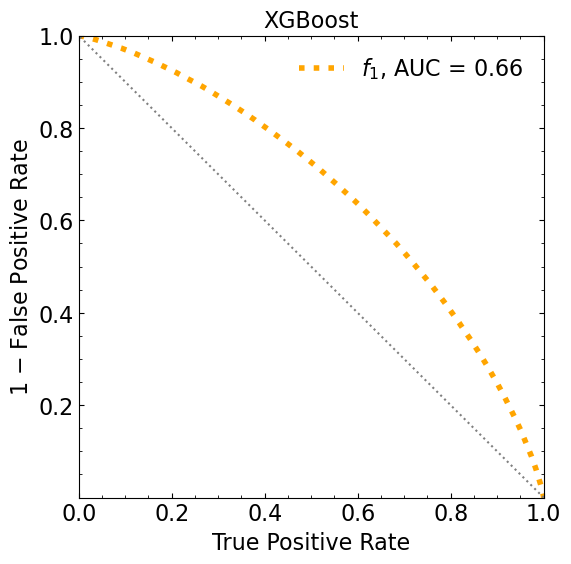

ML iteration  1
[0]	validation_0-logloss:0.68528	validation_1-logloss:0.68537
[1]	validation_0-logloss:0.67887	validation_1-logloss:0.67907


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.67364	validation_1-logloss:0.67393
[3]	validation_0-logloss:0.66936	validation_1-logloss:0.66973
[4]	validation_0-logloss:0.66585	validation_1-logloss:0.66630
[5]	validation_0-logloss:0.66294	validation_1-logloss:0.66349
[6]	validation_0-logloss:0.66055	validation_1-logloss:0.66119
[7]	validation_0-logloss:0.65857	validation_1-logloss:0.65930
[8]	validation_0-logloss:0.65692	validation_1-logloss:0.65774
[9]	validation_0-logloss:0.65555	validation_1-logloss:0.65647
[10]	validation_0-logloss:0.65442	validation_1-logloss:0.65542
[11]	validation_0-logloss:0.65349	validation_1-logloss:0.65455
[12]	validation_0-logloss:0.65270	validation_1-logloss:0.65385
[13]	validation_0-logloss:0.65203	validation_1-logloss:0.65328
[14]	validation_0-logloss:0.65147	validation_1-logloss:0.65280
[15]	validation_0-logloss:0.65099	validation_1-logloss:0.65242
[16]	validation_0-logloss:0.65059	validation_1-logloss:0.65210
[17]	validation_0-logloss:0.65024	validation_1-logloss:0.65184


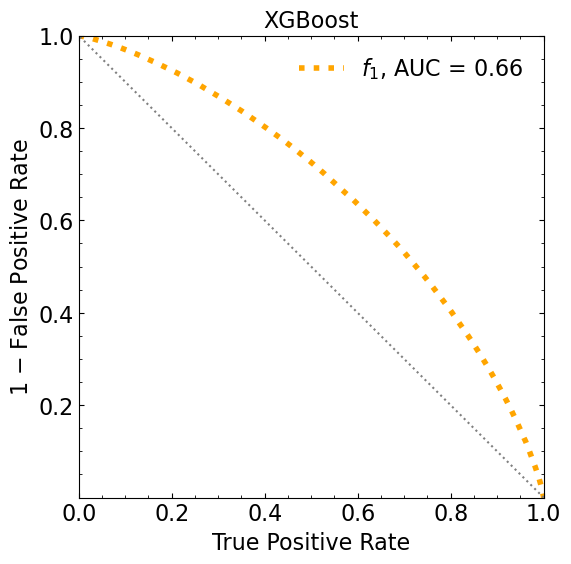

ML iteration  2
[0]	validation_0-logloss:0.68509	validation_1-logloss:0.68526
[1]	validation_0-logloss:0.67854	validation_1-logloss:0.67886


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.67318	validation_1-logloss:0.67366
[3]	validation_0-logloss:0.66880	validation_1-logloss:0.66943
[4]	validation_0-logloss:0.66520	validation_1-logloss:0.66597
[5]	validation_0-logloss:0.66222	validation_1-logloss:0.66315
[6]	validation_0-logloss:0.65976	validation_1-logloss:0.66083
[7]	validation_0-logloss:0.65774	validation_1-logloss:0.65895
[8]	validation_0-logloss:0.65606	validation_1-logloss:0.65740
[9]	validation_0-logloss:0.65467	validation_1-logloss:0.65614
[10]	validation_0-logloss:0.65350	validation_1-logloss:0.65511
[11]	validation_0-logloss:0.65253	validation_1-logloss:0.65427
[12]	validation_0-logloss:0.65172	validation_1-logloss:0.65357
[13]	validation_0-logloss:0.65104	validation_1-logloss:0.65301
[14]	validation_0-logloss:0.65048	validation_1-logloss:0.65256
[15]	validation_0-logloss:0.64999	validation_1-logloss:0.65219
[16]	validation_0-logloss:0.64957	validation_1-logloss:0.65190
[17]	validation_0-logloss:0.64922	validation_1-logloss:0.65165


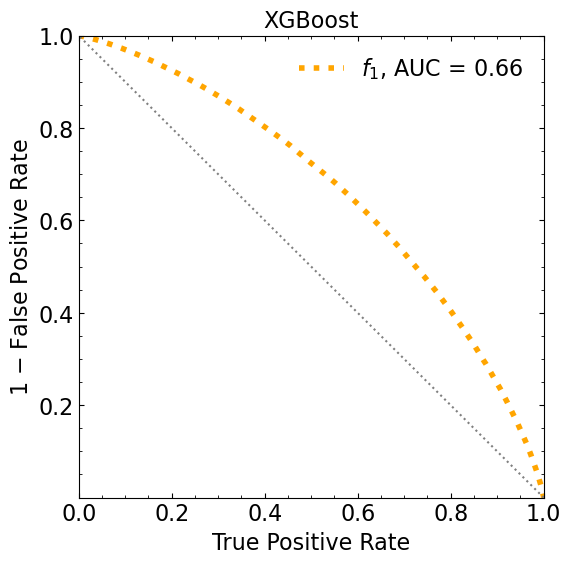

ML iteration  3
[0]	validation_0-logloss:0.68528	validation_1-logloss:0.68540


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.67888	validation_1-logloss:0.67909
[2]	validation_0-logloss:0.67365	validation_1-logloss:0.67396
[3]	validation_0-logloss:0.66937	validation_1-logloss:0.66976
[4]	validation_0-logloss:0.66584	validation_1-logloss:0.66633
[5]	validation_0-logloss:0.66293	validation_1-logloss:0.66351
[6]	validation_0-logloss:0.66054	validation_1-logloss:0.66120
[7]	validation_0-logloss:0.65856	validation_1-logloss:0.65931
[8]	validation_0-logloss:0.65692	validation_1-logloss:0.65777
[9]	validation_0-logloss:0.65557	validation_1-logloss:0.65649
[10]	validation_0-logloss:0.65444	validation_1-logloss:0.65543
[11]	validation_0-logloss:0.65350	validation_1-logloss:0.65458
[12]	validation_0-logloss:0.65271	validation_1-logloss:0.65389
[13]	validation_0-logloss:0.65204	validation_1-logloss:0.65330
[14]	validation_0-logloss:0.65150	validation_1-logloss:0.65283
[15]	validation_0-logloss:0.65103	validation_1-logloss:0.65245
[16]	validation_0-logloss:0.65064	validation_1-logloss:0.65213
[

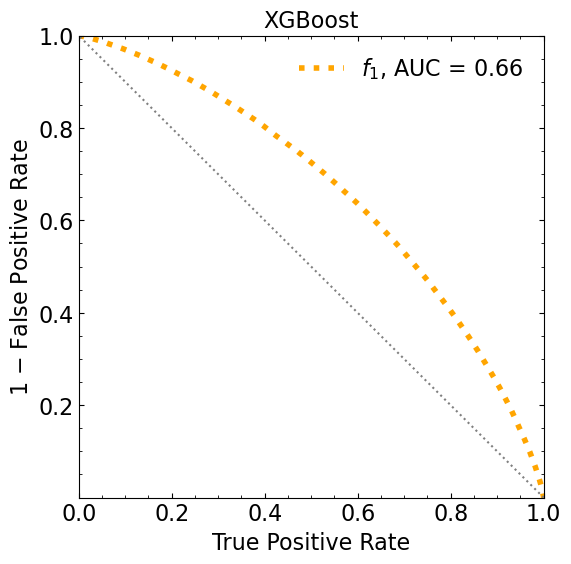

ML iteration  4
[0]	validation_0-logloss:0.68529	validation_1-logloss:0.68537


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.67889	validation_1-logloss:0.67905
[2]	validation_0-logloss:0.67365	validation_1-logloss:0.67390
[3]	validation_0-logloss:0.66936	validation_1-logloss:0.66969
[4]	validation_0-logloss:0.66583	validation_1-logloss:0.66624
[5]	validation_0-logloss:0.66292	validation_1-logloss:0.66342
[6]	validation_0-logloss:0.66051	validation_1-logloss:0.66109
[7]	validation_0-logloss:0.65851	validation_1-logloss:0.65920
[8]	validation_0-logloss:0.65687	validation_1-logloss:0.65763
[9]	validation_0-logloss:0.65550	validation_1-logloss:0.65636
[10]	validation_0-logloss:0.65437	validation_1-logloss:0.65530
[11]	validation_0-logloss:0.65342	validation_1-logloss:0.65444
[12]	validation_0-logloss:0.65262	validation_1-logloss:0.65374
[13]	validation_0-logloss:0.65196	validation_1-logloss:0.65316
[14]	validation_0-logloss:0.65139	validation_1-logloss:0.65269
[15]	validation_0-logloss:0.65092	validation_1-logloss:0.65230
[16]	validation_0-logloss:0.65051	validation_1-logloss:0.65199
[

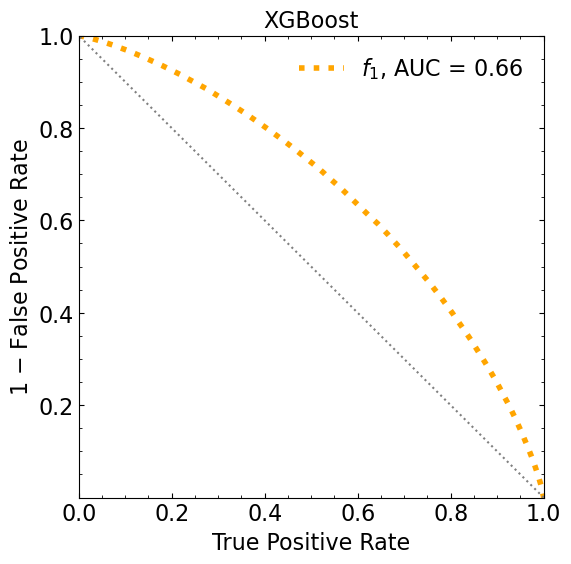

ML iteration  5
[0]	validation_0-logloss:0.68506	validation_1-logloss:0.68528
[1]	validation_0-logloss:0.67849	validation_1-logloss:0.67889


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.67313	validation_1-logloss:0.67372
[3]	validation_0-logloss:0.66872	validation_1-logloss:0.66948
[4]	validation_0-logloss:0.66510	validation_1-logloss:0.66603
[5]	validation_0-logloss:0.66212	validation_1-logloss:0.66321
[6]	validation_0-logloss:0.65966	validation_1-logloss:0.66091
[7]	validation_0-logloss:0.65762	validation_1-logloss:0.65901
[8]	validation_0-logloss:0.65592	validation_1-logloss:0.65745
[9]	validation_0-logloss:0.65451	validation_1-logloss:0.65618
[10]	validation_0-logloss:0.65335	validation_1-logloss:0.65515
[11]	validation_0-logloss:0.65235	validation_1-logloss:0.65429
[12]	validation_0-logloss:0.65155	validation_1-logloss:0.65360
[13]	validation_0-logloss:0.65086	validation_1-logloss:0.65303
[14]	validation_0-logloss:0.65027	validation_1-logloss:0.65258
[15]	validation_0-logloss:0.64978	validation_1-logloss:0.65221
[16]	validation_0-logloss:0.64934	validation_1-logloss:0.65191
[17]	validation_0-logloss:0.64898	validation_1-logloss:0.65166


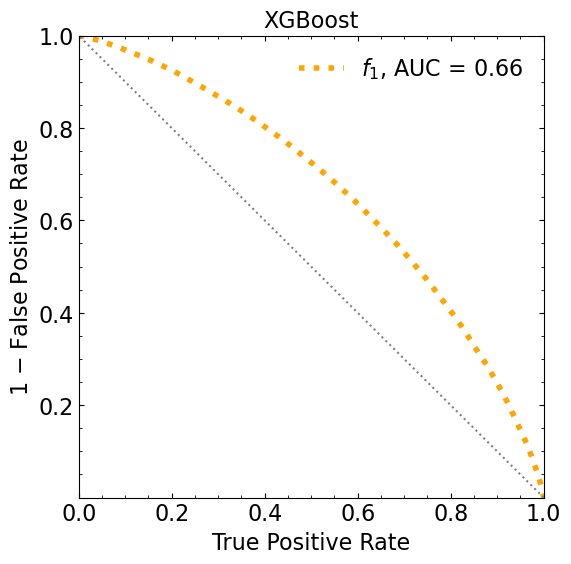

ML iteration  6
[0]	validation_0-logloss:0.68512	validation_1-logloss:0.68528
[1]	validation_0-logloss:0.67861	validation_1-logloss:0.67892


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.67326	validation_1-logloss:0.67373
[3]	validation_0-logloss:0.66890	validation_1-logloss:0.66952
[4]	validation_0-logloss:0.66531	validation_1-logloss:0.66605
[5]	validation_0-logloss:0.66235	validation_1-logloss:0.66322
[6]	validation_0-logloss:0.65992	validation_1-logloss:0.66091
[7]	validation_0-logloss:0.65789	validation_1-logloss:0.65901
[8]	validation_0-logloss:0.65621	validation_1-logloss:0.65746
[9]	validation_0-logloss:0.65479	validation_1-logloss:0.65619
[10]	validation_0-logloss:0.65360	validation_1-logloss:0.65516
[11]	validation_0-logloss:0.65264	validation_1-logloss:0.65432
[12]	validation_0-logloss:0.65184	validation_1-logloss:0.65363
[13]	validation_0-logloss:0.65116	validation_1-logloss:0.65307
[14]	validation_0-logloss:0.65058	validation_1-logloss:0.65262
[15]	validation_0-logloss:0.65008	validation_1-logloss:0.65225
[16]	validation_0-logloss:0.64967	validation_1-logloss:0.65196
[17]	validation_0-logloss:0.64930	validation_1-logloss:0.65170


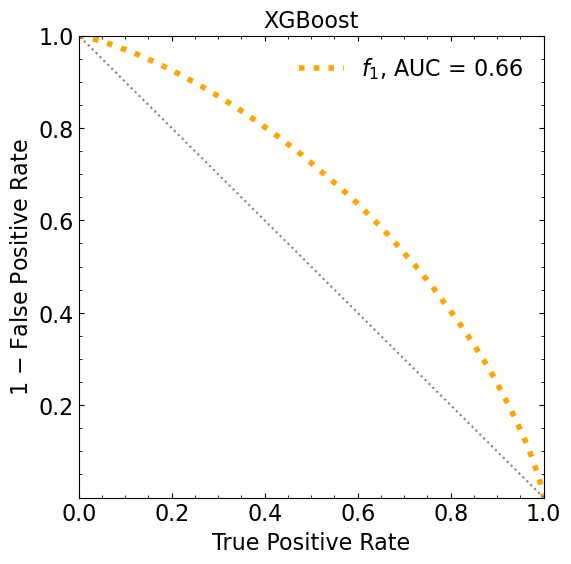

ML iteration  7
[0]	validation_0-logloss:0.68490	validation_1-logloss:0.68518


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.67819	validation_1-logloss:0.67873
[2]	validation_0-logloss:0.67270	validation_1-logloss:0.67349
[3]	validation_0-logloss:0.66820	validation_1-logloss:0.66922
[4]	validation_0-logloss:0.66449	validation_1-logloss:0.66574
[5]	validation_0-logloss:0.66143	validation_1-logloss:0.66288
[6]	validation_0-logloss:0.65892	validation_1-logloss:0.66055
[7]	validation_0-logloss:0.65682	validation_1-logloss:0.65865
[8]	validation_0-logloss:0.65510	validation_1-logloss:0.65710
[9]	validation_0-logloss:0.65367	validation_1-logloss:0.65583
[10]	validation_0-logloss:0.65249	validation_1-logloss:0.65481
[11]	validation_0-logloss:0.65150	validation_1-logloss:0.65397
[12]	validation_0-logloss:0.65066	validation_1-logloss:0.65328
[13]	validation_0-logloss:0.64995	validation_1-logloss:0.65274
[14]	validation_0-logloss:0.64934	validation_1-logloss:0.65229
[15]	validation_0-logloss:0.64884	validation_1-logloss:0.65192
[16]	validation_0-logloss:0.64842	validation_1-logloss:0.65163
[

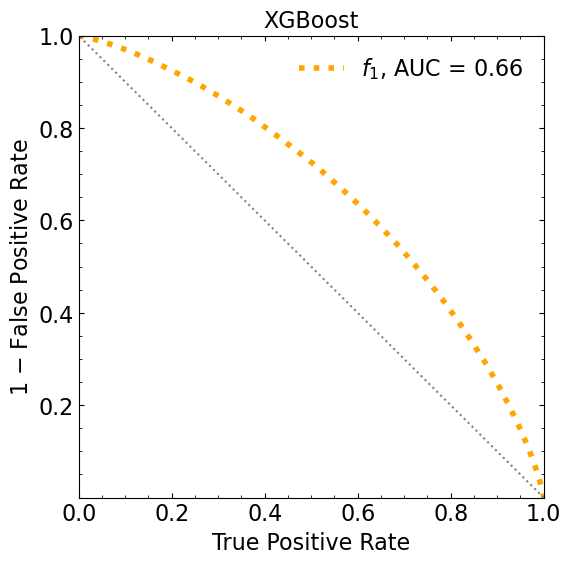

ML iteration  8
[0]	validation_0-logloss:0.68500	validation_1-logloss:0.68525
[1]	validation_0-logloss:0.67838	validation_1-logloss:0.67883


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.67297	validation_1-logloss:0.67362
[3]	validation_0-logloss:0.66853	validation_1-logloss:0.66937
[4]	validation_0-logloss:0.66487	validation_1-logloss:0.66591
[5]	validation_0-logloss:0.66187	validation_1-logloss:0.66308
[6]	validation_0-logloss:0.65936	validation_1-logloss:0.66076
[7]	validation_0-logloss:0.65728	validation_1-logloss:0.65886
[8]	validation_0-logloss:0.65558	validation_1-logloss:0.65732
[9]	validation_0-logloss:0.65416	validation_1-logloss:0.65605
[10]	validation_0-logloss:0.65298	validation_1-logloss:0.65503
[11]	validation_0-logloss:0.65200	validation_1-logloss:0.65417
[12]	validation_0-logloss:0.65118	validation_1-logloss:0.65350
[13]	validation_0-logloss:0.65049	validation_1-logloss:0.65295
[14]	validation_0-logloss:0.64991	validation_1-logloss:0.65250
[15]	validation_0-logloss:0.64940	validation_1-logloss:0.65215
[16]	validation_0-logloss:0.64899	validation_1-logloss:0.65185
[17]	validation_0-logloss:0.64862	validation_1-logloss:0.65160


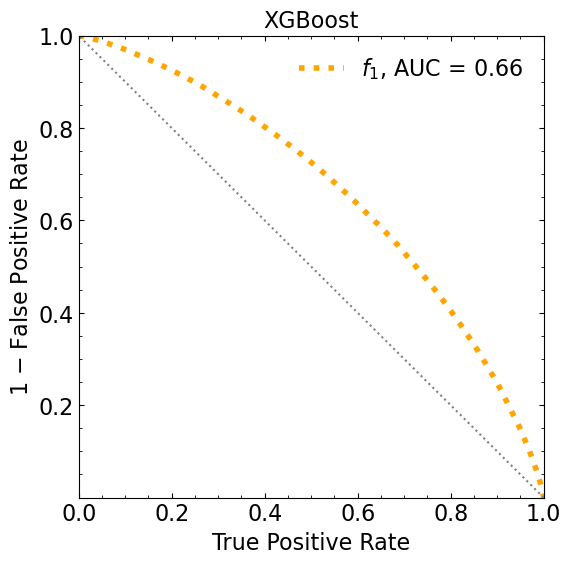

ML iteration  9
[0]	validation_0-logloss:0.68519	validation_1-logloss:0.68534


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.67871	validation_1-logloss:0.67902
[2]	validation_0-logloss:0.67341	validation_1-logloss:0.67385
[3]	validation_0-logloss:0.66907	validation_1-logloss:0.66965
[4]	validation_0-logloss:0.66551	validation_1-logloss:0.66621
[5]	validation_0-logloss:0.66257	validation_1-logloss:0.66340
[6]	validation_0-logloss:0.66014	validation_1-logloss:0.66109
[7]	validation_0-logloss:0.65812	validation_1-logloss:0.65918
[8]	validation_0-logloss:0.65646	validation_1-logloss:0.65762
[9]	validation_0-logloss:0.65507	validation_1-logloss:0.65635
[10]	validation_0-logloss:0.65391	validation_1-logloss:0.65530
[11]	validation_0-logloss:0.65296	validation_1-logloss:0.65445
[12]	validation_0-logloss:0.65213	validation_1-logloss:0.65374
[13]	validation_0-logloss:0.65145	validation_1-logloss:0.65317
[14]	validation_0-logloss:0.65086	validation_1-logloss:0.65270
[15]	validation_0-logloss:0.65038	validation_1-logloss:0.65233
[16]	validation_0-logloss:0.64996	validation_1-logloss:0.65202
[

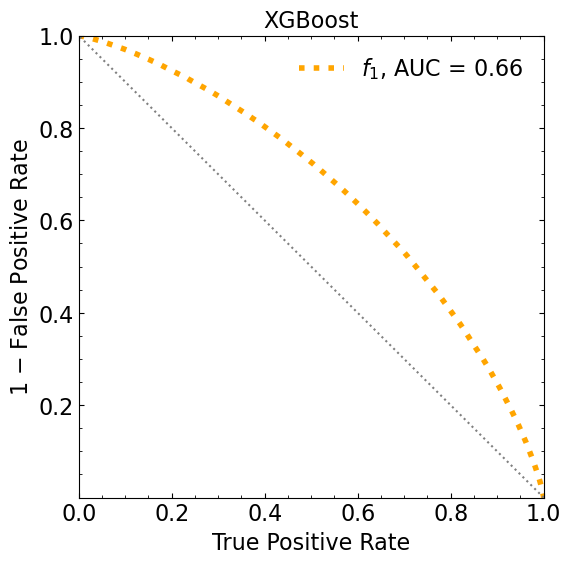

Classification score (1 ML):


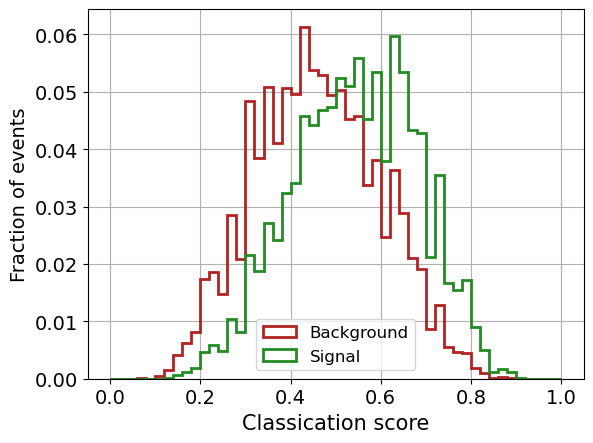

Classification score (10 ML):


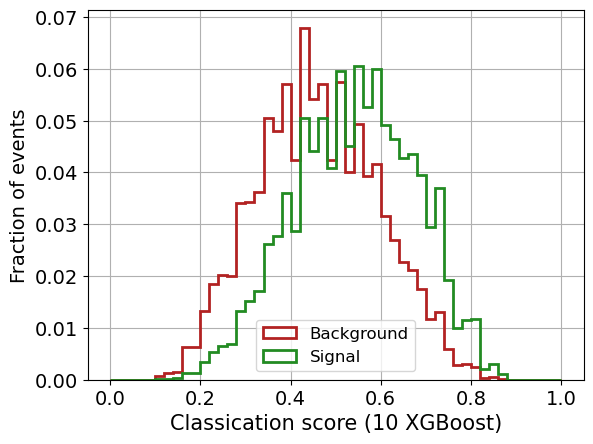

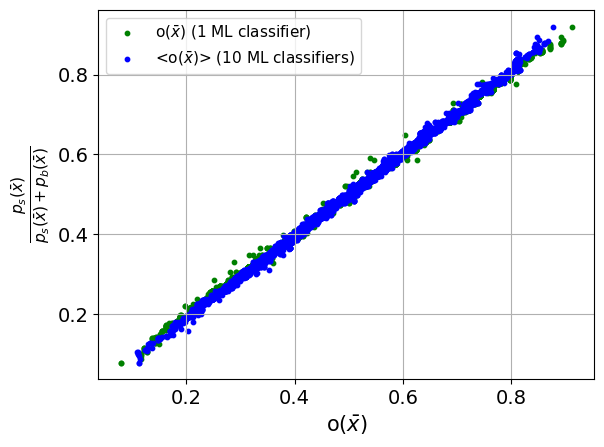


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [7]:
dim=1

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)

print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


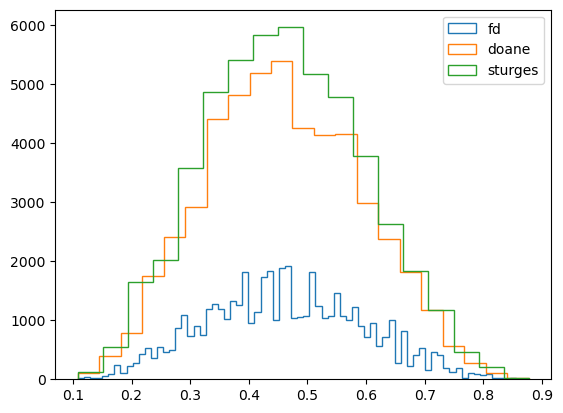

fd 74
doane 21
sturges 18
 
NO ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  74


/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  21
doing Nbin:  18


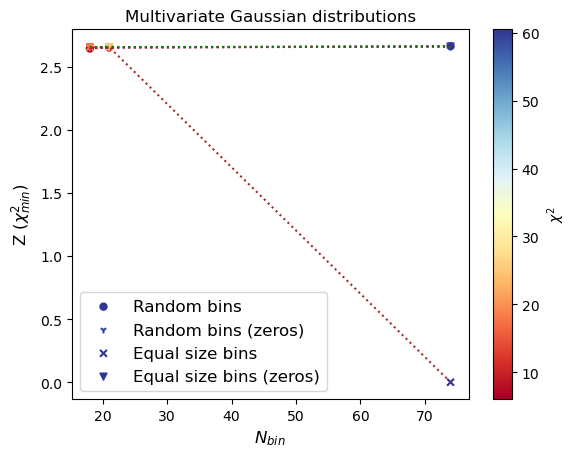

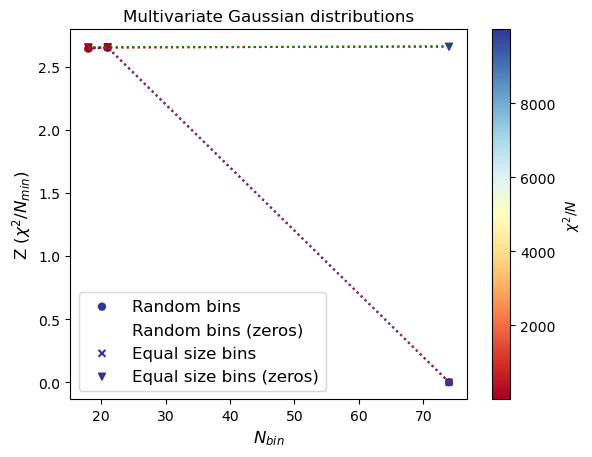

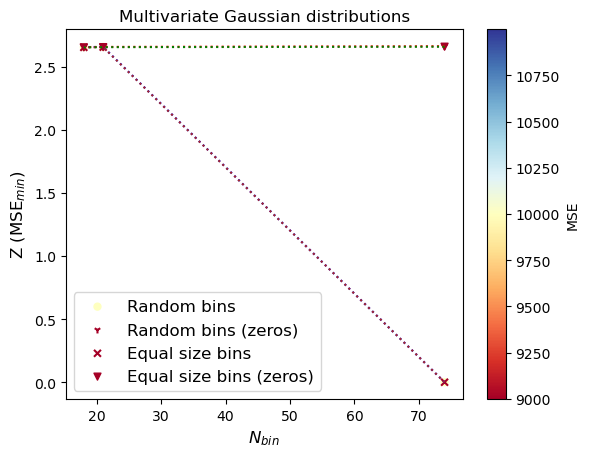

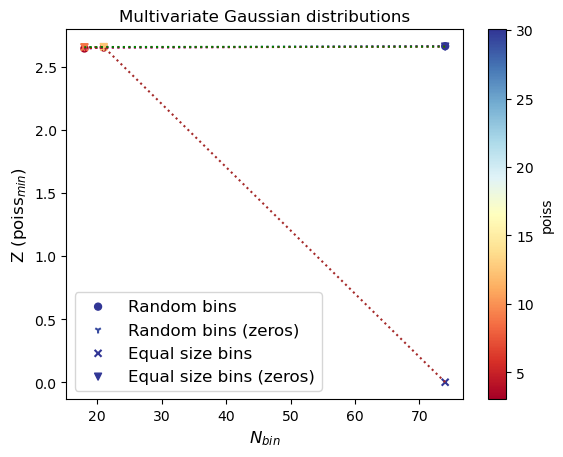

In [20]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 2)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 2)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 2)
y_gauss_test :  (2000000, 1)



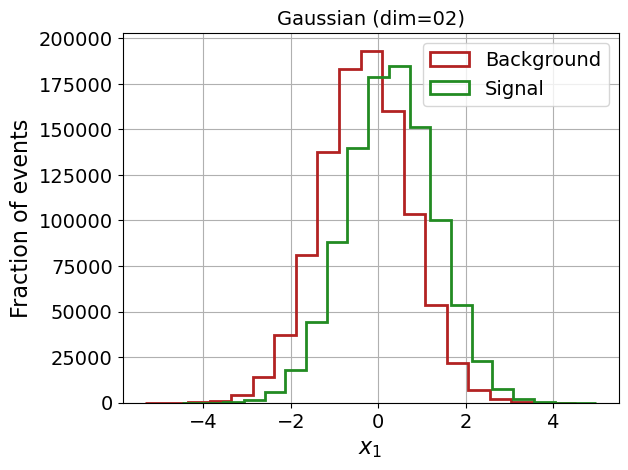

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67925	validation_1-logloss:0.67925
[1]	validation_0-logloss:0.66787	validation_1-logloss:0.66787
[2]	validation_0-logloss:0.65848	validation_1-logloss:0.65848
[3]	validation_0-logloss:0.65067	validation_1-logloss:0.65067
[4]	validation_0-logloss:0.64418	validation_1-logloss:0.64417
[5]	validation_0-logloss:0.63876	validation_1-logloss:0.63875
[6]	validation_0-logloss:0.63424	validation_1-logloss:0.63423
[7]	validation_0-logloss:0.63046	validation_1-logloss:0.63046
[8]	validation_0-logloss:0.62730	validation_1-logloss:0.62730
[9]	validation_0-logloss:0.62466	validation_1-logloss:0.62466
[10]	validation_0-logloss:0.62241	validation_1-logloss:0.62241
[11]	validation_0-logloss:0.62055	validation_1-logloss:0.62055
[12]	validation_0-logloss:0.61898	validation_1-logloss:0.61897
[13]	validation_0-logloss:0.61765	validation_1-logloss:0.61765
[14]	validation_0-logloss:0.61655	validation_1-logloss:0.61654
[15]	validation_0-logloss:0.61561	validation_1-logloss:0.61561
[1

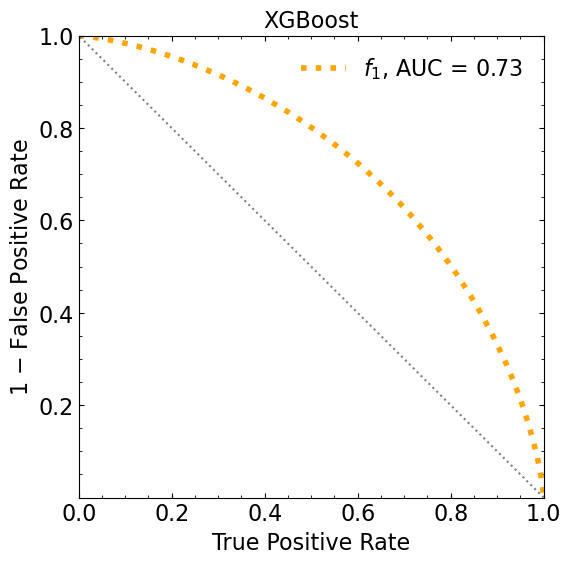

ML iteration 0
[0]	validation_0-logloss:0.67911	validation_1-logloss:0.67925
[1]	validation_0-logloss:0.66760	validation_1-logloss:0.66788


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65814	validation_1-logloss:0.65852
[3]	validation_0-logloss:0.65027	validation_1-logloss:0.65076
[4]	validation_0-logloss:0.64371	validation_1-logloss:0.64428
[5]	validation_0-logloss:0.63825	validation_1-logloss:0.63892
[6]	validation_0-logloss:0.63370	validation_1-logloss:0.63445
[7]	validation_0-logloss:0.62986	validation_1-logloss:0.63067
[8]	validation_0-logloss:0.62663	validation_1-logloss:0.62750
[9]	validation_0-logloss:0.62394	validation_1-logloss:0.62489
[10]	validation_0-logloss:0.62167	validation_1-logloss:0.62268
[11]	validation_0-logloss:0.61976	validation_1-logloss:0.62085
[12]	validation_0-logloss:0.61815	validation_1-logloss:0.61929
[13]	validation_0-logloss:0.61677	validation_1-logloss:0.61799
[14]	validation_0-logloss:0.61560	validation_1-logloss:0.61693
[15]	validation_0-logloss:0.61461	validation_1-logloss:0.61602
[16]	validation_0-logloss:0.61376	validation_1-logloss:0.61527
[17]	validation_0-logloss:0.61305	validation_1-logloss:0.61466


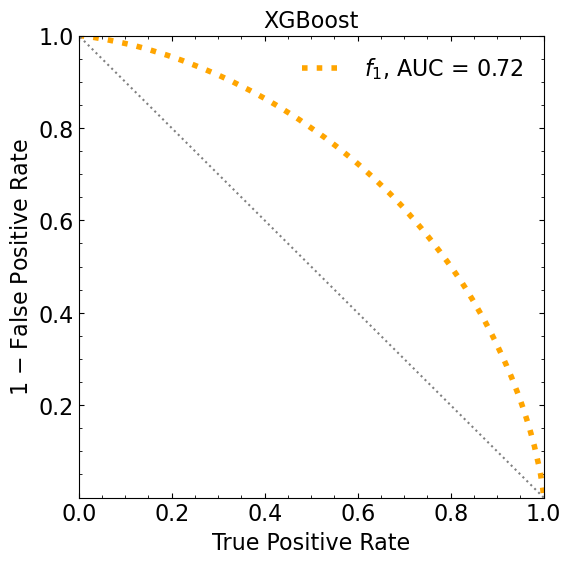

ML iteration  1
[0]	validation_0-logloss:0.67867	validation_1-logloss:0.67899
[1]	validation_0-logloss:0.66681	validation_1-logloss:0.66746


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65701	validation_1-logloss:0.65793
[3]	validation_0-logloss:0.64887	validation_1-logloss:0.65004
[4]	validation_0-logloss:0.64205	validation_1-logloss:0.64350
[5]	validation_0-logloss:0.63640	validation_1-logloss:0.63809
[6]	validation_0-logloss:0.63167	validation_1-logloss:0.63361
[7]	validation_0-logloss:0.62768	validation_1-logloss:0.62984
[8]	validation_0-logloss:0.62433	validation_1-logloss:0.62670
[9]	validation_0-logloss:0.62151	validation_1-logloss:0.62406
[10]	validation_0-logloss:0.61913	validation_1-logloss:0.62186
[11]	validation_0-logloss:0.61713	validation_1-logloss:0.62004
[12]	validation_0-logloss:0.61546	validation_1-logloss:0.61853
[13]	validation_0-logloss:0.61402	validation_1-logloss:0.61727
[14]	validation_0-logloss:0.61282	validation_1-logloss:0.61625
[15]	validation_0-logloss:0.61178	validation_1-logloss:0.61538
[16]	validation_0-logloss:0.61089	validation_1-logloss:0.61467
[17]	validation_0-logloss:0.61013	validation_1-logloss:0.61410


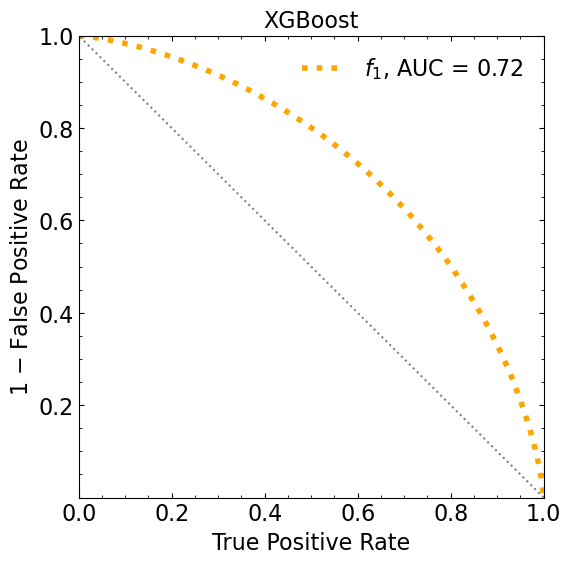

ML iteration  2
[0]	validation_0-logloss:0.67881	validation_1-logloss:0.67908
[1]	validation_0-logloss:0.66704	validation_1-logloss:0.66758


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65730	validation_1-logloss:0.65809
[3]	validation_0-logloss:0.64922	validation_1-logloss:0.65023
[4]	validation_0-logloss:0.64254	validation_1-logloss:0.64376
[5]	validation_0-logloss:0.63695	validation_1-logloss:0.63836
[6]	validation_0-logloss:0.63225	validation_1-logloss:0.63387
[7]	validation_0-logloss:0.62834	validation_1-logloss:0.63011
[8]	validation_0-logloss:0.62503	validation_1-logloss:0.62700
[9]	validation_0-logloss:0.62224	validation_1-logloss:0.62440
[10]	validation_0-logloss:0.61991	validation_1-logloss:0.62222
[11]	validation_0-logloss:0.61792	validation_1-logloss:0.62036
[12]	validation_0-logloss:0.61626	validation_1-logloss:0.61886
[13]	validation_0-logloss:0.61485	validation_1-logloss:0.61758
[14]	validation_0-logloss:0.61366	validation_1-logloss:0.61652
[15]	validation_0-logloss:0.61264	validation_1-logloss:0.61565
[16]	validation_0-logloss:0.61177	validation_1-logloss:0.61492
[17]	validation_0-logloss:0.61102	validation_1-logloss:0.61429


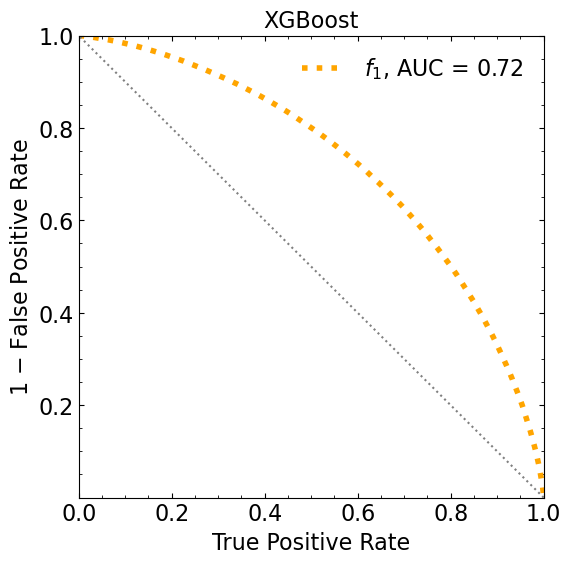

ML iteration  3
[0]	validation_0-logloss:0.67876	validation_1-logloss:0.67906
[1]	validation_0-logloss:0.66698	validation_1-logloss:0.66759


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65728	validation_1-logloss:0.65816
[3]	validation_0-logloss:0.64925	validation_1-logloss:0.65037
[4]	validation_0-logloss:0.64259	validation_1-logloss:0.64393
[5]	validation_0-logloss:0.63701	validation_1-logloss:0.63851
[6]	validation_0-logloss:0.63237	validation_1-logloss:0.63403
[7]	validation_0-logloss:0.62844	validation_1-logloss:0.63027
[8]	validation_0-logloss:0.62516	validation_1-logloss:0.62714
[9]	validation_0-logloss:0.62239	validation_1-logloss:0.62451
[10]	validation_0-logloss:0.62007	validation_1-logloss:0.62232
[11]	validation_0-logloss:0.61812	validation_1-logloss:0.62050
[12]	validation_0-logloss:0.61645	validation_1-logloss:0.61897
[13]	validation_0-logloss:0.61503	validation_1-logloss:0.61770
[14]	validation_0-logloss:0.61384	validation_1-logloss:0.61666
[15]	validation_0-logloss:0.61283	validation_1-logloss:0.61582
[16]	validation_0-logloss:0.61197	validation_1-logloss:0.61506
[17]	validation_0-logloss:0.61121	validation_1-logloss:0.61445


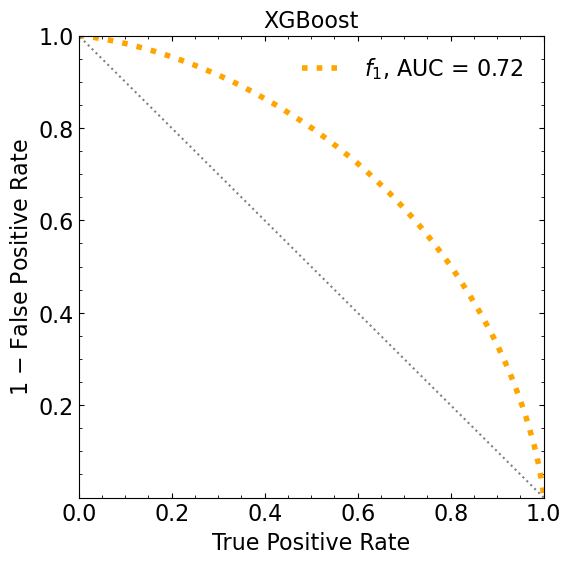

ML iteration  4
[0]	validation_0-logloss:0.67880	validation_1-logloss:0.67910
[1]	validation_0-logloss:0.66703	validation_1-logloss:0.66757


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65732	validation_1-logloss:0.65810
[3]	validation_0-logloss:0.64926	validation_1-logloss:0.65028
[4]	validation_0-logloss:0.64256	validation_1-logloss:0.64379
[5]	validation_0-logloss:0.63698	validation_1-logloss:0.63841
[6]	validation_0-logloss:0.63229	validation_1-logloss:0.63392
[7]	validation_0-logloss:0.62839	validation_1-logloss:0.63020
[8]	validation_0-logloss:0.62507	validation_1-logloss:0.62704
[9]	validation_0-logloss:0.62228	validation_1-logloss:0.62441
[10]	validation_0-logloss:0.61995	validation_1-logloss:0.62223
[11]	validation_0-logloss:0.61797	validation_1-logloss:0.62038
[12]	validation_0-logloss:0.61630	validation_1-logloss:0.61884
[13]	validation_0-logloss:0.61486	validation_1-logloss:0.61757
[14]	validation_0-logloss:0.61366	validation_1-logloss:0.61650
[15]	validation_0-logloss:0.61264	validation_1-logloss:0.61563
[16]	validation_0-logloss:0.61177	validation_1-logloss:0.61490
[17]	validation_0-logloss:0.61102	validation_1-logloss:0.61429


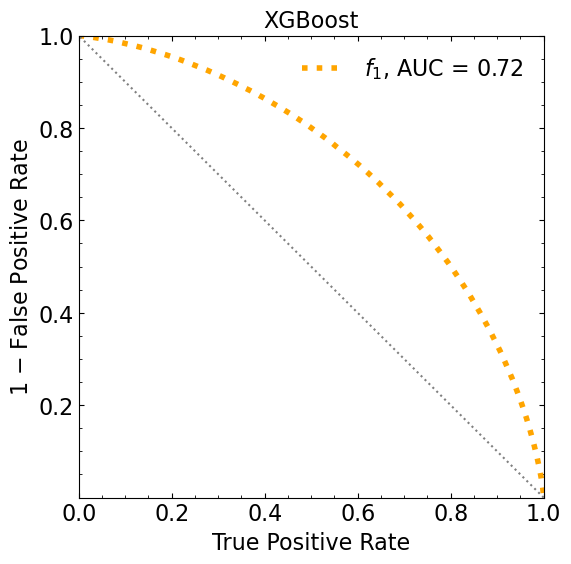

ML iteration  5
[0]	validation_0-logloss:0.67912	validation_1-logloss:0.67922
[1]	validation_0-logloss:0.66764	validation_1-logloss:0.66784


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65816	validation_1-logloss:0.65845
[3]	validation_0-logloss:0.65030	validation_1-logloss:0.65067
[4]	validation_0-logloss:0.64377	validation_1-logloss:0.64421
[5]	validation_0-logloss:0.63831	validation_1-logloss:0.63882
[6]	validation_0-logloss:0.63373	validation_1-logloss:0.63430
[7]	validation_0-logloss:0.62989	validation_1-logloss:0.63051
[8]	validation_0-logloss:0.62670	validation_1-logloss:0.62740
[9]	validation_0-logloss:0.62403	validation_1-logloss:0.62479
[10]	validation_0-logloss:0.62175	validation_1-logloss:0.62260
[11]	validation_0-logloss:0.61982	validation_1-logloss:0.62076
[12]	validation_0-logloss:0.61819	validation_1-logloss:0.61921
[13]	validation_0-logloss:0.61683	validation_1-logloss:0.61794
[14]	validation_0-logloss:0.61566	validation_1-logloss:0.61685
[15]	validation_0-logloss:0.61467	validation_1-logloss:0.61593
[16]	validation_0-logloss:0.61381	validation_1-logloss:0.61517
[17]	validation_0-logloss:0.61308	validation_1-logloss:0.61456


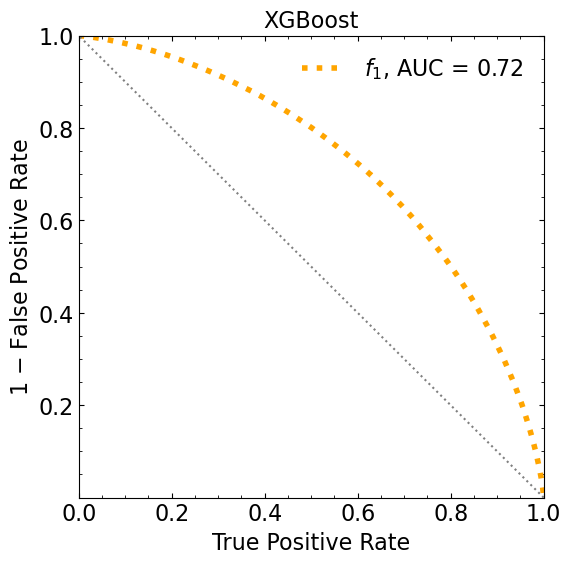

ML iteration  6
[0]	validation_0-logloss:0.67888	validation_1-logloss:0.67914
[1]	validation_0-logloss:0.66718	validation_1-logloss:0.66769


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65755	validation_1-logloss:0.65824
[3]	validation_0-logloss:0.64956	validation_1-logloss:0.65046
[4]	validation_0-logloss:0.64289	validation_1-logloss:0.64397
[5]	validation_0-logloss:0.63736	validation_1-logloss:0.63862
[6]	validation_0-logloss:0.63272	validation_1-logloss:0.63414
[7]	validation_0-logloss:0.62883	validation_1-logloss:0.63040
[8]	validation_0-logloss:0.62558	validation_1-logloss:0.62725
[9]	validation_0-logloss:0.62285	validation_1-logloss:0.62463
[10]	validation_0-logloss:0.62056	validation_1-logloss:0.62246
[11]	validation_0-logloss:0.61861	validation_1-logloss:0.62063
[12]	validation_0-logloss:0.61698	validation_1-logloss:0.61911
[13]	validation_0-logloss:0.61558	validation_1-logloss:0.61784
[14]	validation_0-logloss:0.61441	validation_1-logloss:0.61678
[15]	validation_0-logloss:0.61342	validation_1-logloss:0.61590
[16]	validation_0-logloss:0.61257	validation_1-logloss:0.61515
[17]	validation_0-logloss:0.61184	validation_1-logloss:0.61456


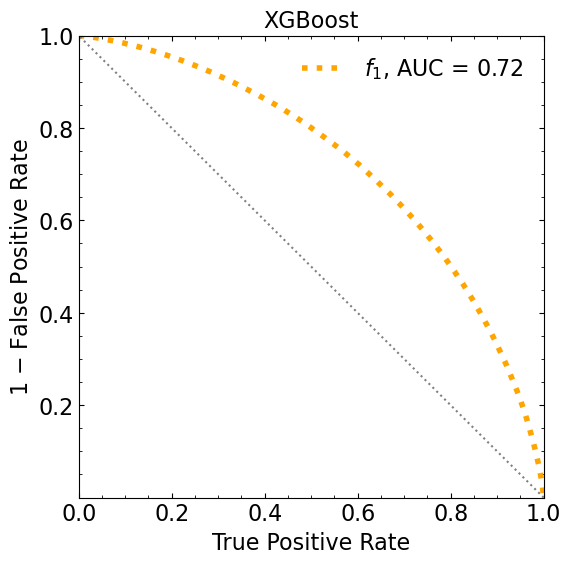

ML iteration  7
[0]	validation_0-logloss:0.67900	validation_1-logloss:0.67919
[1]	validation_0-logloss:0.66746	validation_1-logloss:0.66780


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65797	validation_1-logloss:0.65846
[3]	validation_0-logloss:0.65006	validation_1-logloss:0.65067
[4]	validation_0-logloss:0.64345	validation_1-logloss:0.64418
[5]	validation_0-logloss:0.63796	validation_1-logloss:0.63878
[6]	validation_0-logloss:0.63333	validation_1-logloss:0.63427
[7]	validation_0-logloss:0.62946	validation_1-logloss:0.63050
[8]	validation_0-logloss:0.62622	validation_1-logloss:0.62736
[9]	validation_0-logloss:0.62350	validation_1-logloss:0.62473
[10]	validation_0-logloss:0.62118	validation_1-logloss:0.62253
[11]	validation_0-logloss:0.61925	validation_1-logloss:0.62073
[12]	validation_0-logloss:0.61762	validation_1-logloss:0.61918
[13]	validation_0-logloss:0.61624	validation_1-logloss:0.61789
[14]	validation_0-logloss:0.61508	validation_1-logloss:0.61683
[15]	validation_0-logloss:0.61408	validation_1-logloss:0.61593
[16]	validation_0-logloss:0.61322	validation_1-logloss:0.61520
[17]	validation_0-logloss:0.61248	validation_1-logloss:0.61458


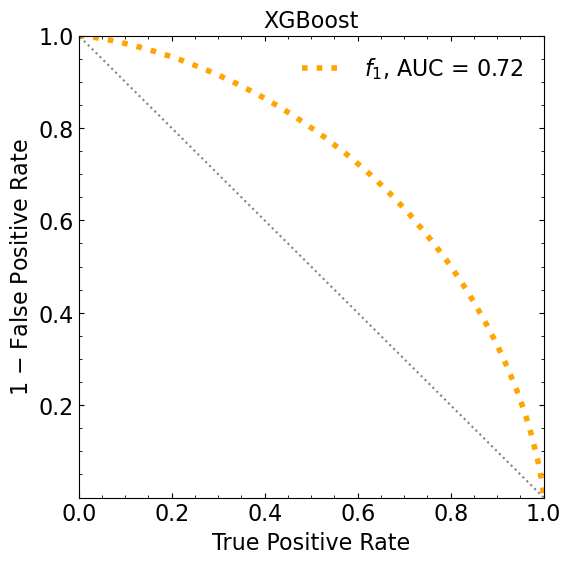

ML iteration  8
[0]	validation_0-logloss:0.67903	validation_1-logloss:0.67917
[1]	validation_0-logloss:0.66751	validation_1-logloss:0.66776


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65795	validation_1-logloss:0.65831
[3]	validation_0-logloss:0.65004	validation_1-logloss:0.65052
[4]	validation_0-logloss:0.64348	validation_1-logloss:0.64405
[5]	validation_0-logloss:0.63801	validation_1-logloss:0.63870
[6]	validation_0-logloss:0.63337	validation_1-logloss:0.63420
[7]	validation_0-logloss:0.62951	validation_1-logloss:0.63042
[8]	validation_0-logloss:0.62626	validation_1-logloss:0.62725
[9]	validation_0-logloss:0.62353	validation_1-logloss:0.62461
[10]	validation_0-logloss:0.62126	validation_1-logloss:0.62243
[11]	validation_0-logloss:0.61932	validation_1-logloss:0.62058
[12]	validation_0-logloss:0.61771	validation_1-logloss:0.61906
[13]	validation_0-logloss:0.61632	validation_1-logloss:0.61777
[14]	validation_0-logloss:0.61515	validation_1-logloss:0.61670
[15]	validation_0-logloss:0.61416	validation_1-logloss:0.61582
[16]	validation_0-logloss:0.61331	validation_1-logloss:0.61508
[17]	validation_0-logloss:0.61258	validation_1-logloss:0.61447


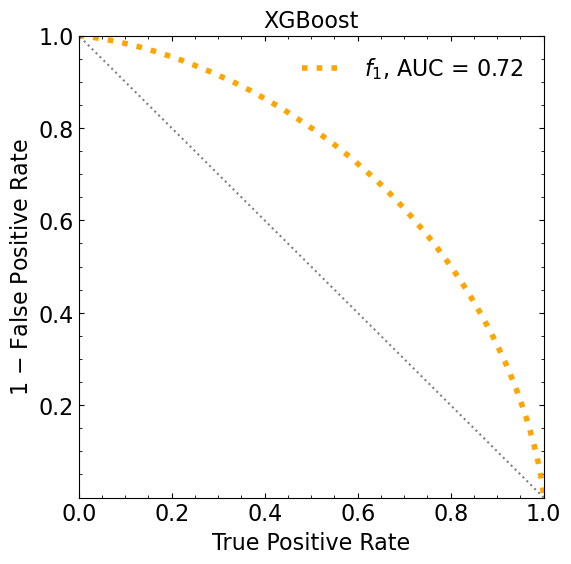

ML iteration  9
[0]	validation_0-logloss:0.67887	validation_1-logloss:0.67913
[1]	validation_0-logloss:0.66719	validation_1-logloss:0.66764


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.65757	validation_1-logloss:0.65824
[3]	validation_0-logloss:0.64953	validation_1-logloss:0.65040
[4]	validation_0-logloss:0.64286	validation_1-logloss:0.64388
[5]	validation_0-logloss:0.63731	validation_1-logloss:0.63848
[6]	validation_0-logloss:0.63265	validation_1-logloss:0.63395
[7]	validation_0-logloss:0.62877	validation_1-logloss:0.63024
[8]	validation_0-logloss:0.62548	validation_1-logloss:0.62710
[9]	validation_0-logloss:0.62273	validation_1-logloss:0.62448
[10]	validation_0-logloss:0.62043	validation_1-logloss:0.62230
[11]	validation_0-logloss:0.61847	validation_1-logloss:0.62047
[12]	validation_0-logloss:0.61682	validation_1-logloss:0.61895
[13]	validation_0-logloss:0.61544	validation_1-logloss:0.61768
[14]	validation_0-logloss:0.61427	validation_1-logloss:0.61664
[15]	validation_0-logloss:0.61328	validation_1-logloss:0.61574
[16]	validation_0-logloss:0.61243	validation_1-logloss:0.61501
[17]	validation_0-logloss:0.61170	validation_1-logloss:0.61442


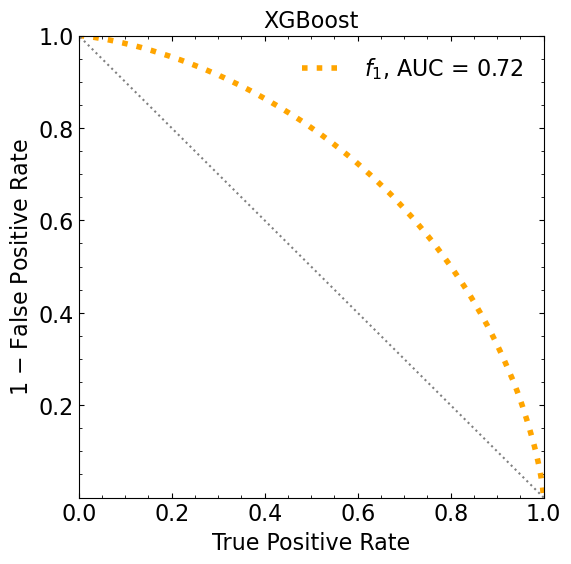

Classification score (1 ML):


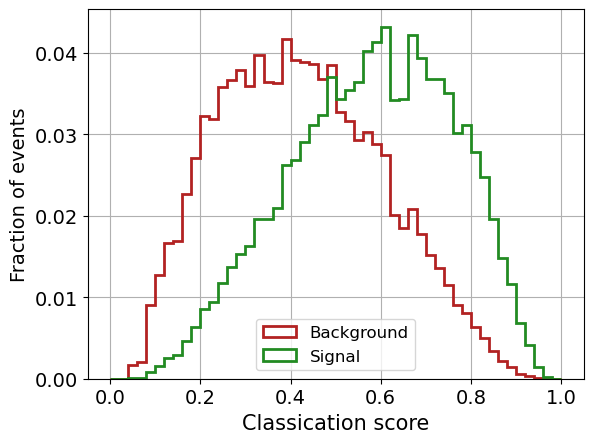

Classification score (10 ML):


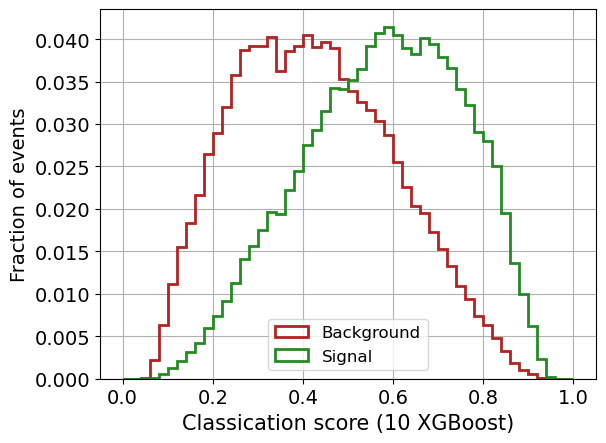

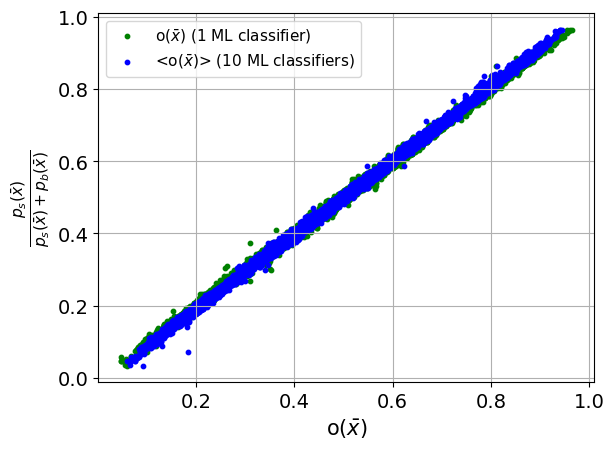


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [21]:
dim=2

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)


print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


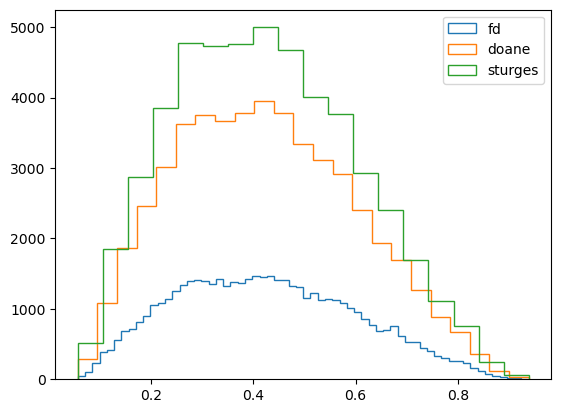

fd 62
doane 23
sturges 18
 
NO ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  62


/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  23
doing Nbin:  18


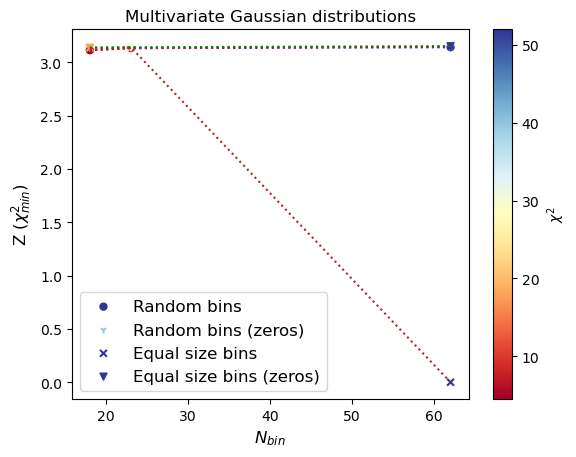

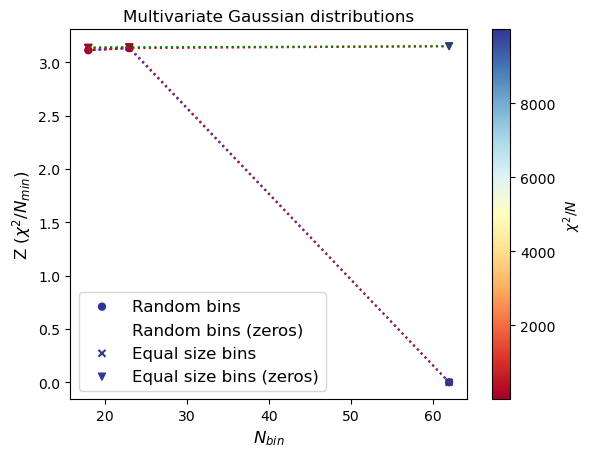

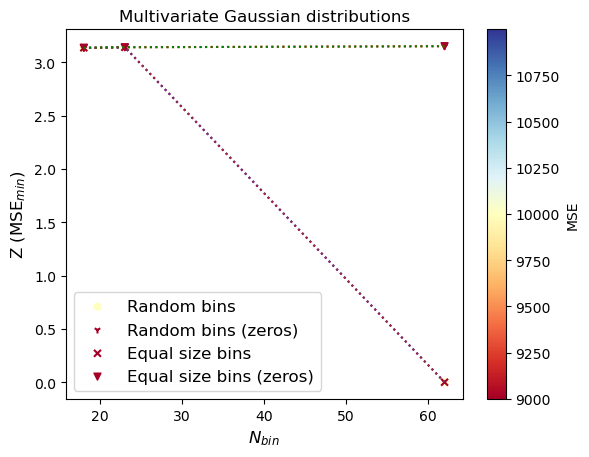

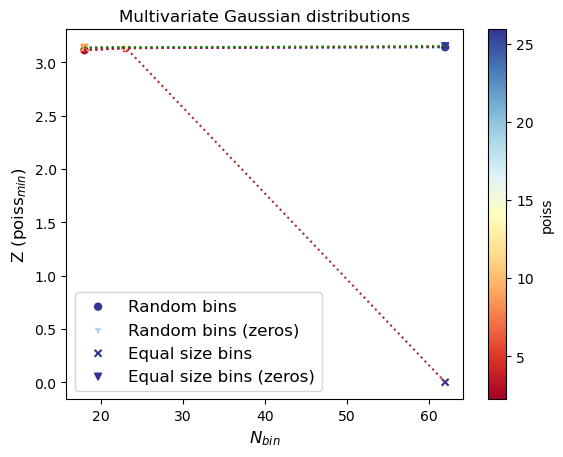

In [22]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 3)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 3)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 3)
y_gauss_test :  (2000000, 1)



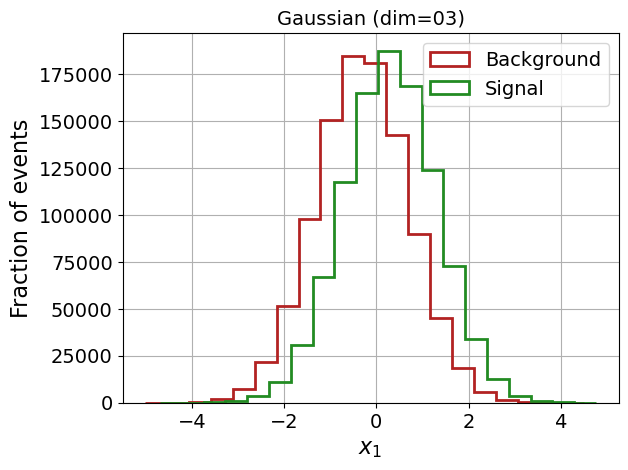

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67555	validation_1-logloss:0.67565
[1]	validation_0-logloss:0.66094	validation_1-logloss:0.66113
[2]	validation_0-logloss:0.64863	validation_1-logloss:0.64889
[3]	validation_0-logloss:0.63826	validation_1-logloss:0.63859
[4]	validation_0-logloss:0.62947	validation_1-logloss:0.62987
[5]	validation_0-logloss:0.62200	validation_1-logloss:0.62246
[6]	validation_0-logloss:0.61561	validation_1-logloss:0.61612
[7]	validation_0-logloss:0.61013	validation_1-logloss:0.61069
[8]	validation_0-logloss:0.60542	validation_1-logloss:0.60601
[9]	validation_0-logloss:0.60133	validation_1-logloss:0.60195
[10]	validation_0-logloss:0.59779	validation_1-logloss:0.59846
[11]	validation_0-logloss:0.59472	validation_1-logloss:0.59541
[12]	validation_0-logloss:0.59203	validation_1-logloss:0.59275
[13]	validation_0-logloss:0.58972	validation_1-logloss:0.59047
[14]	validation_0-logloss:0.58768	validation_1-logloss:0.58844
[15]	validation_0-logloss:0.58592	validation_1-logloss:0.58670
[1

[130]	validation_0-logloss:0.57259	validation_1-logloss:0.57422
[131]	validation_0-logloss:0.57259	validation_1-logloss:0.57422
[132]	validation_0-logloss:0.57258	validation_1-logloss:0.57422
[133]	validation_0-logloss:0.57258	validation_1-logloss:0.57422
[134]	validation_0-logloss:0.57258	validation_1-logloss:0.57422
[135]	validation_0-logloss:0.57257	validation_1-logloss:0.57422
[136]	validation_0-logloss:0.57257	validation_1-logloss:0.57422
[137]	validation_0-logloss:0.57256	validation_1-logloss:0.57422
[138]	validation_0-logloss:0.57256	validation_1-logloss:0.57422
[139]	validation_0-logloss:0.57256	validation_1-logloss:0.57422
[140]	validation_0-logloss:0.57255	validation_1-logloss:0.57422
[141]	validation_0-logloss:0.57255	validation_1-logloss:0.57422
[142]	validation_0-logloss:0.57255	validation_1-logloss:0.57422
[143]	validation_0-logloss:0.57255	validation_1-logloss:0.57422
[144]	validation_0-logloss:0.57254	validation_1-logloss:0.57422


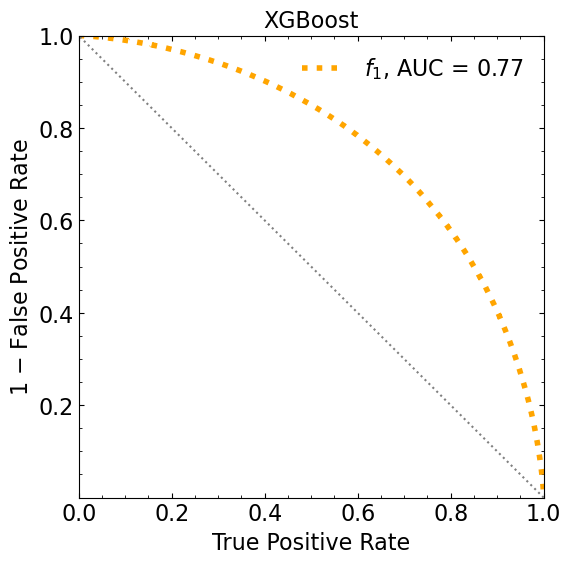

ML iteration 0
[0]	validation_0-logloss:0.67522	validation_1-logloss:0.67552
[1]	validation_0-logloss:0.66033	validation_1-logloss:0.66095


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64788	validation_1-logloss:0.64873
[3]	validation_0-logloss:0.63725	validation_1-logloss:0.63837
[4]	validation_0-logloss:0.62830	validation_1-logloss:0.62965
[5]	validation_0-logloss:0.62053	validation_1-logloss:0.62214
[6]	validation_0-logloss:0.61392	validation_1-logloss:0.61577
[7]	validation_0-logloss:0.60832	validation_1-logloss:0.61038
[8]	validation_0-logloss:0.60345	validation_1-logloss:0.60571
[9]	validation_0-logloss:0.59924	validation_1-logloss:0.60169
[10]	validation_0-logloss:0.59559	validation_1-logloss:0.59822
[11]	validation_0-logloss:0.59242	validation_1-logloss:0.59523
[12]	validation_0-logloss:0.58964	validation_1-logloss:0.59259
[13]	validation_0-logloss:0.58722	validation_1-logloss:0.59032
[14]	validation_0-logloss:0.58508	validation_1-logloss:0.58836
[15]	validation_0-logloss:0.58323	validation_1-logloss:0.58666
[16]	validation_0-logloss:0.58162	validation_1-logloss:0.58518
[17]	validation_0-logloss:0.58019	validation_1-logloss:0.58391


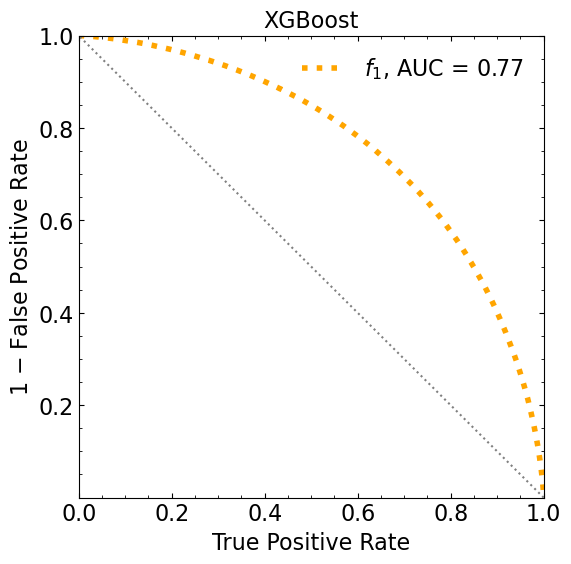

ML iteration  1
[0]	validation_0-logloss:0.67488	validation_1-logloss:0.67552
[1]	validation_0-logloss:0.65965	validation_1-logloss:0.66081


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64699	validation_1-logloss:0.64857
[3]	validation_0-logloss:0.63621	validation_1-logloss:0.63818
[4]	validation_0-logloss:0.62710	validation_1-logloss:0.62944
[5]	validation_0-logloss:0.61933	validation_1-logloss:0.62201
[6]	validation_0-logloss:0.61264	validation_1-logloss:0.61559
[7]	validation_0-logloss:0.60691	validation_1-logloss:0.61016
[8]	validation_0-logloss:0.60193	validation_1-logloss:0.60550
[9]	validation_0-logloss:0.59758	validation_1-logloss:0.60145
[10]	validation_0-logloss:0.59384	validation_1-logloss:0.59795
[11]	validation_0-logloss:0.59059	validation_1-logloss:0.59497
[12]	validation_0-logloss:0.58777	validation_1-logloss:0.59238
[13]	validation_0-logloss:0.58529	validation_1-logloss:0.59012
[14]	validation_0-logloss:0.58313	validation_1-logloss:0.58814
[15]	validation_0-logloss:0.58121	validation_1-logloss:0.58642
[16]	validation_0-logloss:0.57956	validation_1-logloss:0.58494
[17]	validation_0-logloss:0.57809	validation_1-logloss:0.58366


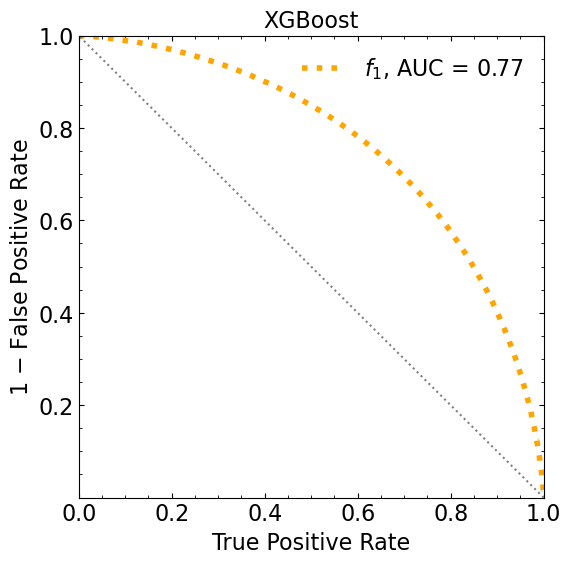

ML iteration  2
[0]	validation_0-logloss:0.67494	validation_1-logloss:0.67545
[1]	validation_0-logloss:0.65997	validation_1-logloss:0.66093


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64735	validation_1-logloss:0.64872
[3]	validation_0-logloss:0.63667	validation_1-logloss:0.63835
[4]	validation_0-logloss:0.62759	validation_1-logloss:0.62956
[5]	validation_0-logloss:0.61988	validation_1-logloss:0.62213
[6]	validation_0-logloss:0.61327	validation_1-logloss:0.61584
[7]	validation_0-logloss:0.60755	validation_1-logloss:0.61042
[8]	validation_0-logloss:0.60269	validation_1-logloss:0.60581
[9]	validation_0-logloss:0.59848	validation_1-logloss:0.60182
[10]	validation_0-logloss:0.59482	validation_1-logloss:0.59835
[11]	validation_0-logloss:0.59155	validation_1-logloss:0.59531
[12]	validation_0-logloss:0.58877	validation_1-logloss:0.59270
[13]	validation_0-logloss:0.58631	validation_1-logloss:0.59044
[14]	validation_0-logloss:0.58416	validation_1-logloss:0.58850
[15]	validation_0-logloss:0.58229	validation_1-logloss:0.58679
[16]	validation_0-logloss:0.58066	validation_1-logloss:0.58532
[17]	validation_0-logloss:0.57920	validation_1-logloss:0.58404


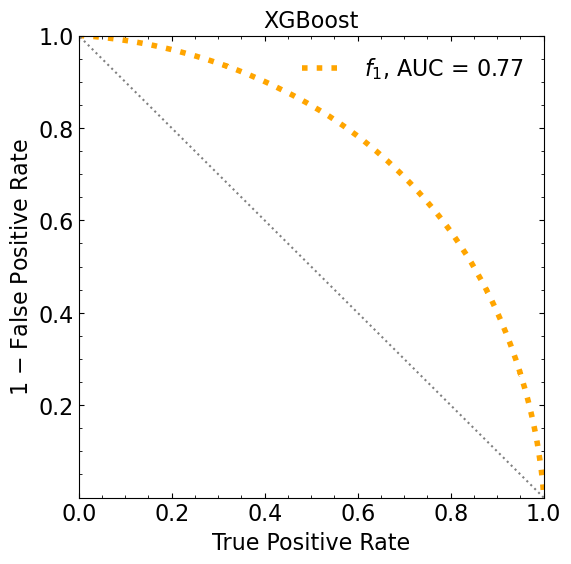

ML iteration  3
[0]	validation_0-logloss:0.67492	validation_1-logloss:0.67548
[1]	validation_0-logloss:0.65981	validation_1-logloss:0.66087


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64710	validation_1-logloss:0.64862
[3]	validation_0-logloss:0.63630	validation_1-logloss:0.63822
[4]	validation_0-logloss:0.62718	validation_1-logloss:0.62954
[5]	validation_0-logloss:0.61939	validation_1-logloss:0.62209
[6]	validation_0-logloss:0.61268	validation_1-logloss:0.61574
[7]	validation_0-logloss:0.60694	validation_1-logloss:0.61032
[8]	validation_0-logloss:0.60200	validation_1-logloss:0.60568
[9]	validation_0-logloss:0.59773	validation_1-logloss:0.60167
[10]	validation_0-logloss:0.59404	validation_1-logloss:0.59820
[11]	validation_0-logloss:0.59083	validation_1-logloss:0.59521
[12]	validation_0-logloss:0.58803	validation_1-logloss:0.59263
[13]	validation_0-logloss:0.58557	validation_1-logloss:0.59039
[14]	validation_0-logloss:0.58343	validation_1-logloss:0.58845
[15]	validation_0-logloss:0.58158	validation_1-logloss:0.58679
[16]	validation_0-logloss:0.57994	validation_1-logloss:0.58534
[17]	validation_0-logloss:0.57850	validation_1-logloss:0.58407


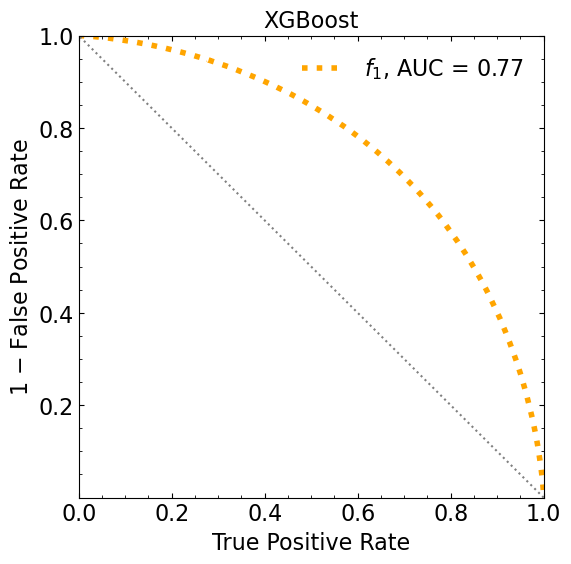

ML iteration  4
[0]	validation_0-logloss:0.67472	validation_1-logloss:0.67538
[1]	validation_0-logloss:0.65948	validation_1-logloss:0.66069


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64666	validation_1-logloss:0.64834
[3]	validation_0-logloss:0.63577	validation_1-logloss:0.63793
[4]	validation_0-logloss:0.62660	validation_1-logloss:0.62913
[5]	validation_0-logloss:0.61880	validation_1-logloss:0.62169
[6]	validation_0-logloss:0.61211	validation_1-logloss:0.61537
[7]	validation_0-logloss:0.60636	validation_1-logloss:0.60995
[8]	validation_0-logloss:0.60134	validation_1-logloss:0.60528
[9]	validation_0-logloss:0.59702	validation_1-logloss:0.60127
[10]	validation_0-logloss:0.59328	validation_1-logloss:0.59783
[11]	validation_0-logloss:0.59002	validation_1-logloss:0.59486
[12]	validation_0-logloss:0.58716	validation_1-logloss:0.59224
[13]	validation_0-logloss:0.58471	validation_1-logloss:0.59001
[14]	validation_0-logloss:0.58253	validation_1-logloss:0.58806
[15]	validation_0-logloss:0.58065	validation_1-logloss:0.58637
[16]	validation_0-logloss:0.57895	validation_1-logloss:0.58489
[17]	validation_0-logloss:0.57748	validation_1-logloss:0.58362


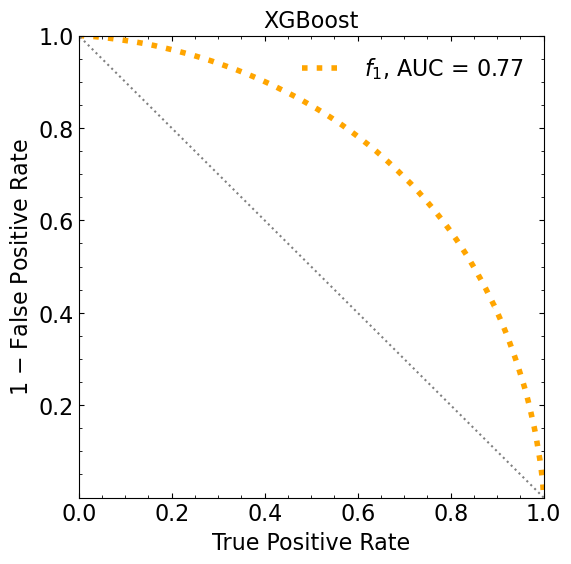

ML iteration  5
[0]	validation_0-logloss:0.67522	validation_1-logloss:0.67560
[1]	validation_0-logloss:0.66028	validation_1-logloss:0.66108


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64770	validation_1-logloss:0.64880
[3]	validation_0-logloss:0.63718	validation_1-logloss:0.63854
[4]	validation_0-logloss:0.62813	validation_1-logloss:0.62974
[5]	validation_0-logloss:0.62040	validation_1-logloss:0.62229
[6]	validation_0-logloss:0.61384	validation_1-logloss:0.61600
[7]	validation_0-logloss:0.60820	validation_1-logloss:0.61054
[8]	validation_0-logloss:0.60329	validation_1-logloss:0.60588
[9]	validation_0-logloss:0.59906	validation_1-logloss:0.60186
[10]	validation_0-logloss:0.59543	validation_1-logloss:0.59840
[11]	validation_0-logloss:0.59227	validation_1-logloss:0.59539
[12]	validation_0-logloss:0.58949	validation_1-logloss:0.59283
[13]	validation_0-logloss:0.58709	validation_1-logloss:0.59060
[14]	validation_0-logloss:0.58500	validation_1-logloss:0.58865
[15]	validation_0-logloss:0.58316	validation_1-logloss:0.58694
[16]	validation_0-logloss:0.58155	validation_1-logloss:0.58548
[17]	validation_0-logloss:0.58016	validation_1-logloss:0.58421


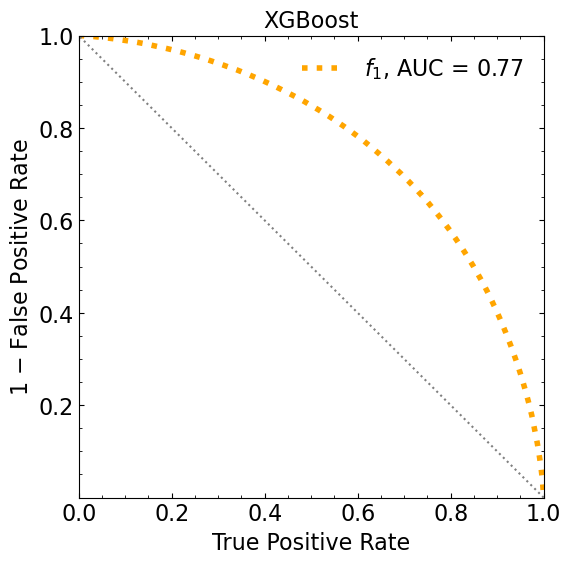

ML iteration  6
[0]	validation_0-logloss:0.67512	validation_1-logloss:0.67554
[1]	validation_0-logloss:0.66010	validation_1-logloss:0.66096


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64754	validation_1-logloss:0.64870
[3]	validation_0-logloss:0.63694	validation_1-logloss:0.63838
[4]	validation_0-logloss:0.62792	validation_1-logloss:0.62965
[5]	validation_0-logloss:0.62028	validation_1-logloss:0.62226
[6]	validation_0-logloss:0.61370	validation_1-logloss:0.61590
[7]	validation_0-logloss:0.60805	validation_1-logloss:0.61051
[8]	validation_0-logloss:0.60316	validation_1-logloss:0.60579
[9]	validation_0-logloss:0.59895	validation_1-logloss:0.60183
[10]	validation_0-logloss:0.59526	validation_1-logloss:0.59833
[11]	validation_0-logloss:0.59207	validation_1-logloss:0.59537
[12]	validation_0-logloss:0.58932	validation_1-logloss:0.59277
[13]	validation_0-logloss:0.58691	validation_1-logloss:0.59048
[14]	validation_0-logloss:0.58479	validation_1-logloss:0.58854
[15]	validation_0-logloss:0.58294	validation_1-logloss:0.58683
[16]	validation_0-logloss:0.58131	validation_1-logloss:0.58538
[17]	validation_0-logloss:0.57987	validation_1-logloss:0.58410


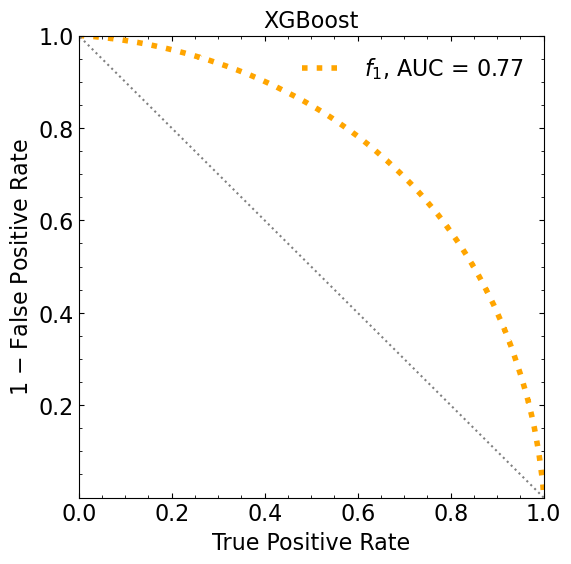

ML iteration  7
[0]	validation_0-logloss:0.67490	validation_1-logloss:0.67538
[1]	validation_0-logloss:0.65981	validation_1-logloss:0.66079


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64716	validation_1-logloss:0.64850
[3]	validation_0-logloss:0.63647	validation_1-logloss:0.63818
[4]	validation_0-logloss:0.62724	validation_1-logloss:0.62934
[5]	validation_0-logloss:0.61947	validation_1-logloss:0.62195
[6]	validation_0-logloss:0.61286	validation_1-logloss:0.61564
[7]	validation_0-logloss:0.60714	validation_1-logloss:0.61016
[8]	validation_0-logloss:0.60218	validation_1-logloss:0.60554
[9]	validation_0-logloss:0.59788	validation_1-logloss:0.60151
[10]	validation_0-logloss:0.59413	validation_1-logloss:0.59803
[11]	validation_0-logloss:0.59091	validation_1-logloss:0.59500
[12]	validation_0-logloss:0.58811	validation_1-logloss:0.59243
[13]	validation_0-logloss:0.58566	validation_1-logloss:0.59015
[14]	validation_0-logloss:0.58352	validation_1-logloss:0.58818
[15]	validation_0-logloss:0.58165	validation_1-logloss:0.58649
[16]	validation_0-logloss:0.58001	validation_1-logloss:0.58502
[17]	validation_0-logloss:0.57857	validation_1-logloss:0.58376


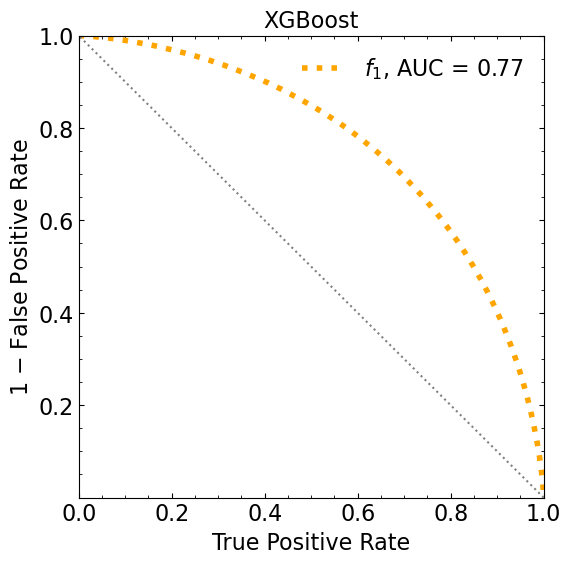

ML iteration  8
[0]	validation_0-logloss:0.67504	validation_1-logloss:0.67551
[1]	validation_0-logloss:0.65999	validation_1-logloss:0.66090


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64732	validation_1-logloss:0.64862
[3]	validation_0-logloss:0.63663	validation_1-logloss:0.63828
[4]	validation_0-logloss:0.62746	validation_1-logloss:0.62945
[5]	validation_0-logloss:0.61969	validation_1-logloss:0.62202
[6]	validation_0-logloss:0.61299	validation_1-logloss:0.61565
[7]	validation_0-logloss:0.60718	validation_1-logloss:0.61014
[8]	validation_0-logloss:0.60224	validation_1-logloss:0.60547
[9]	validation_0-logloss:0.59795	validation_1-logloss:0.60143
[10]	validation_0-logloss:0.59422	validation_1-logloss:0.59794
[11]	validation_0-logloss:0.59101	validation_1-logloss:0.59493
[12]	validation_0-logloss:0.58820	validation_1-logloss:0.59234
[13]	validation_0-logloss:0.58574	validation_1-logloss:0.59009
[14]	validation_0-logloss:0.58358	validation_1-logloss:0.58813
[15]	validation_0-logloss:0.58171	validation_1-logloss:0.58648
[16]	validation_0-logloss:0.58006	validation_1-logloss:0.58500
[17]	validation_0-logloss:0.57858	validation_1-logloss:0.58372


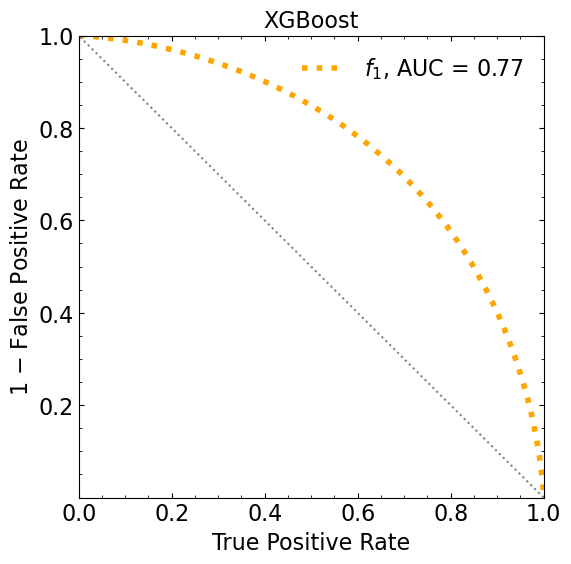

ML iteration  9
[0]	validation_0-logloss:0.67534	validation_1-logloss:0.67560
[1]	validation_0-logloss:0.66061	validation_1-logloss:0.66110


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64816	validation_1-logloss:0.64884
[3]	validation_0-logloss:0.63761	validation_1-logloss:0.63849
[4]	validation_0-logloss:0.62868	validation_1-logloss:0.62972
[5]	validation_0-logloss:0.62105	validation_1-logloss:0.62230
[6]	validation_0-logloss:0.61449	validation_1-logloss:0.61596
[7]	validation_0-logloss:0.60887	validation_1-logloss:0.61056
[8]	validation_0-logloss:0.60402	validation_1-logloss:0.60591
[9]	validation_0-logloss:0.59984	validation_1-logloss:0.60191
[10]	validation_0-logloss:0.59620	validation_1-logloss:0.59843
[11]	validation_0-logloss:0.59300	validation_1-logloss:0.59540
[12]	validation_0-logloss:0.59023	validation_1-logloss:0.59278
[13]	validation_0-logloss:0.58781	validation_1-logloss:0.59052
[14]	validation_0-logloss:0.58571	validation_1-logloss:0.58853
[15]	validation_0-logloss:0.58384	validation_1-logloss:0.58681
[16]	validation_0-logloss:0.58222	validation_1-logloss:0.58533
[17]	validation_0-logloss:0.58078	validation_1-logloss:0.58404


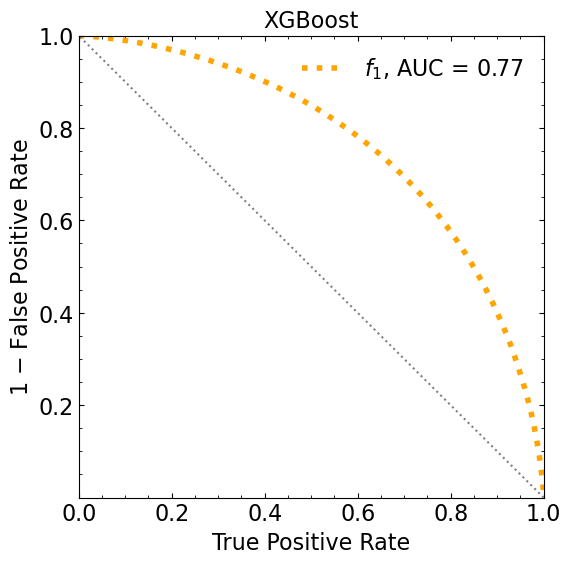

Classification score (1 ML):


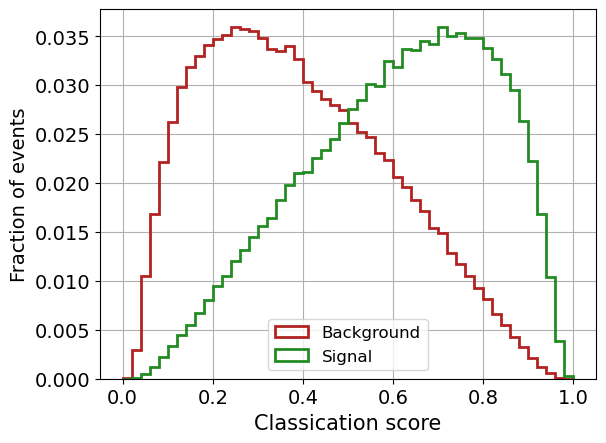

Classification score (10 ML):


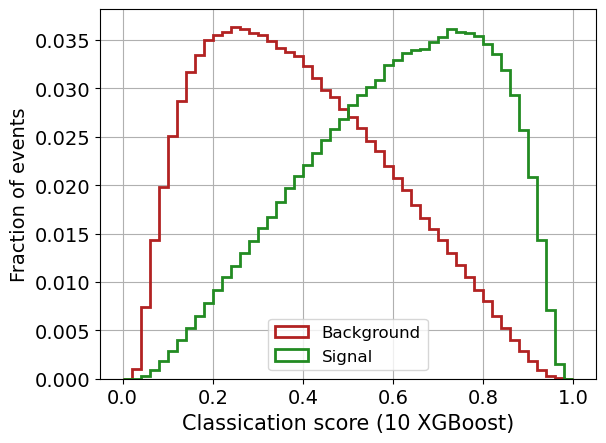

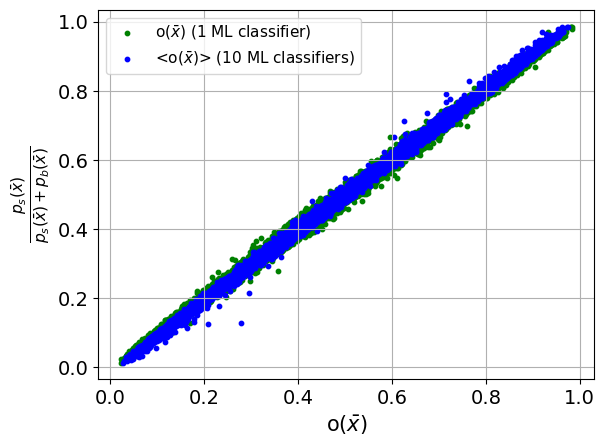


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [23]:
dim=3

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


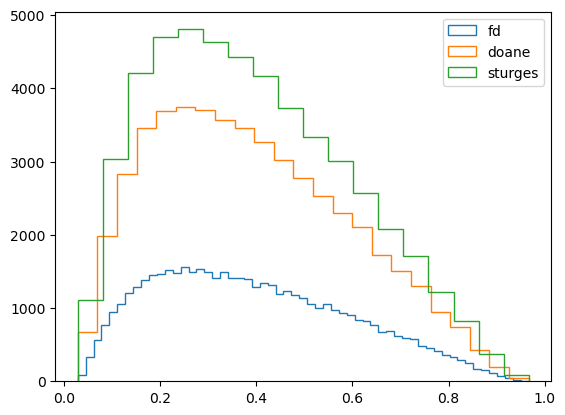

fd 57
doane 23
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  57


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  23
doing Nbin:  18


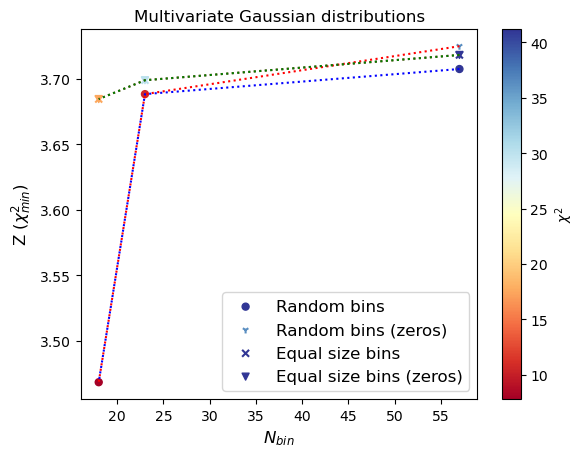

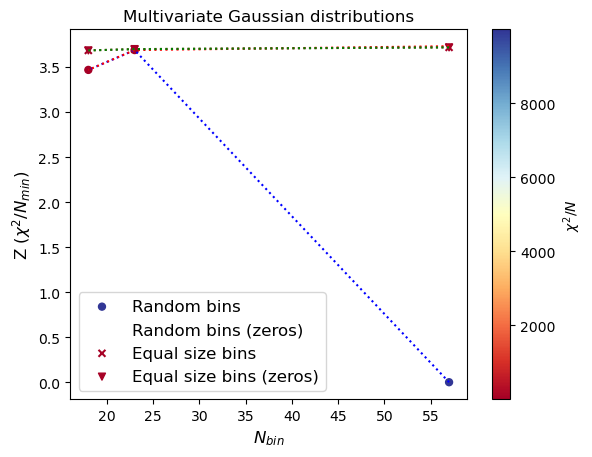

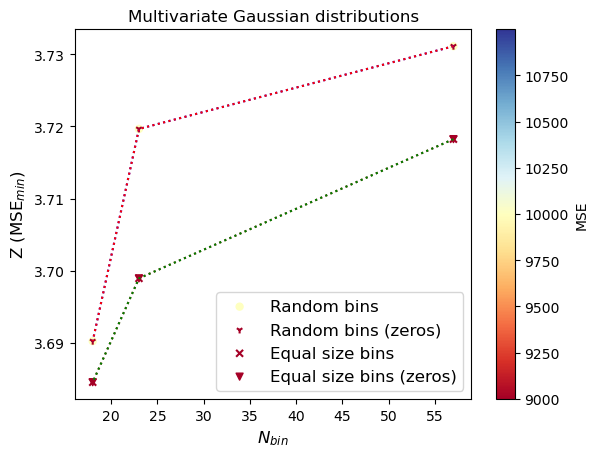

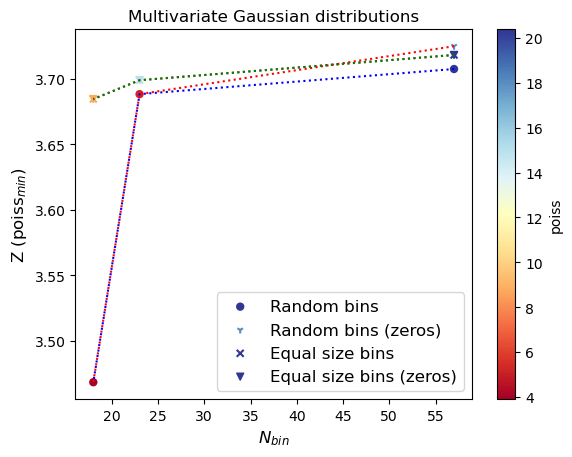

In [24]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 4)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 4)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 4)
y_gauss_test :  (2000000, 1)



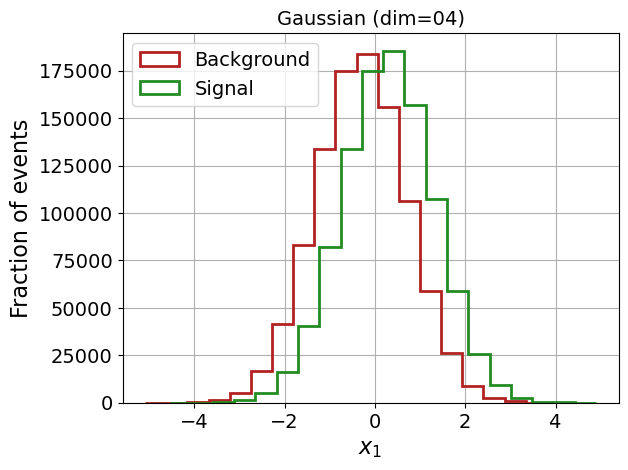

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67318	validation_1-logloss:0.67329
[1]	validation_0-logloss:0.65657	validation_1-logloss:0.65678
[2]	validation_0-logloss:0.64245	validation_1-logloss:0.64276
[3]	validation_0-logloss:0.63034	validation_1-logloss:0.63075
[4]	validation_0-logloss:0.62004	validation_1-logloss:0.62053
[5]	validation_0-logloss:0.61114	validation_1-logloss:0.61167
[6]	validation_0-logloss:0.60343	validation_1-logloss:0.60402
[7]	validation_0-logloss:0.59665	validation_1-logloss:0.59730
[8]	validation_0-logloss:0.59072	validation_1-logloss:0.59144
[9]	validation_0-logloss:0.58550	validation_1-logloss:0.58626
[10]	validation_0-logloss:0.58082	validation_1-logloss:0.58164
[11]	validation_0-logloss:0.57673	validation_1-logloss:0.57760
[12]	validation_0-logloss:0.57303	validation_1-logloss:0.57395
[13]	validation_0-logloss:0.56976	validation_1-logloss:0.57073
[14]	validation_0-logloss:0.56686	validation_1-logloss:0.56786
[15]	validation_0-logloss:0.56424	validation_1-logloss:0.56528
[1

[130]	validation_0-logloss:0.53860	validation_1-logloss:0.54093
[131]	validation_0-logloss:0.53859	validation_1-logloss:0.54093
[132]	validation_0-logloss:0.53859	validation_1-logloss:0.54093
[133]	validation_0-logloss:0.53859	validation_1-logloss:0.54093
[134]	validation_0-logloss:0.53858	validation_1-logloss:0.54093
[135]	validation_0-logloss:0.53858	validation_1-logloss:0.54093
[136]	validation_0-logloss:0.53857	validation_1-logloss:0.54093
[137]	validation_0-logloss:0.53857	validation_1-logloss:0.54093
[138]	validation_0-logloss:0.53857	validation_1-logloss:0.54093
[139]	validation_0-logloss:0.53856	validation_1-logloss:0.54093
[140]	validation_0-logloss:0.53856	validation_1-logloss:0.54093
[141]	validation_0-logloss:0.53855	validation_1-logloss:0.54093
[142]	validation_0-logloss:0.53855	validation_1-logloss:0.54094
[143]	validation_0-logloss:0.53854	validation_1-logloss:0.54094
[144]	validation_0-logloss:0.53854	validation_1-logloss:0.54094
[145]	validation_0-logloss:0.53853	valid

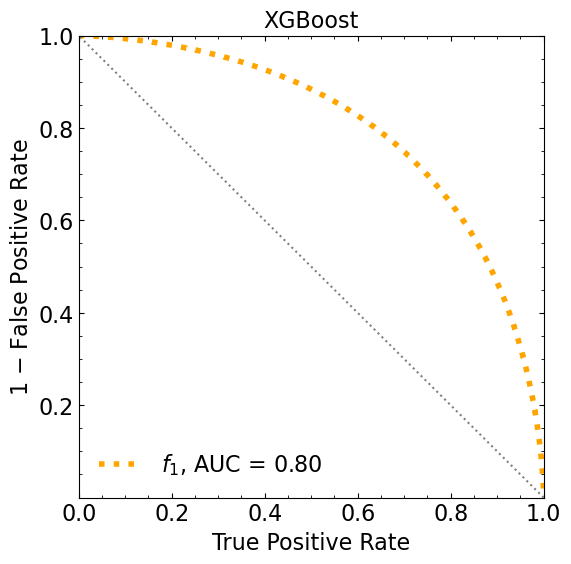

ML iteration 0
[0]	validation_0-logloss:0.67230	validation_1-logloss:0.67295
[1]	validation_0-logloss:0.65498	validation_1-logloss:0.65616


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64029	validation_1-logloss:0.64206
[3]	validation_0-logloss:0.62773	validation_1-logloss:0.63004
[4]	validation_0-logloss:0.61690	validation_1-logloss:0.61972
[5]	validation_0-logloss:0.60752	validation_1-logloss:0.61085
[6]	validation_0-logloss:0.59936	validation_1-logloss:0.60317
[7]	validation_0-logloss:0.59220	validation_1-logloss:0.59644
[8]	validation_0-logloss:0.58587	validation_1-logloss:0.59054
[9]	validation_0-logloss:0.58039	validation_1-logloss:0.58541
[10]	validation_0-logloss:0.57556	validation_1-logloss:0.58089
[11]	validation_0-logloss:0.57124	validation_1-logloss:0.57688
[12]	validation_0-logloss:0.56741	validation_1-logloss:0.57332
[13]	validation_0-logloss:0.56398	validation_1-logloss:0.57018
[14]	validation_0-logloss:0.56085	validation_1-logloss:0.56735
[15]	validation_0-logloss:0.55810	validation_1-logloss:0.56485
[16]	validation_0-logloss:0.55558	validation_1-logloss:0.56262
[17]	validation_0-logloss:0.55333	validation_1-logloss:0.56060


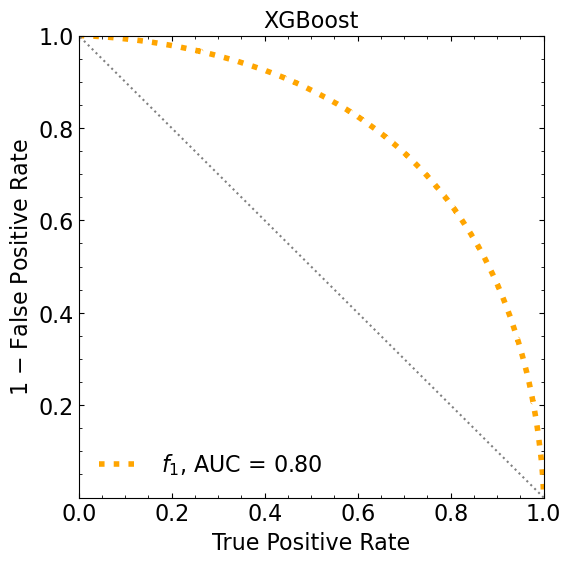

ML iteration  1
[0]	validation_0-logloss:0.67286	validation_1-logloss:0.67327
[1]	validation_0-logloss:0.65595	validation_1-logloss:0.65673


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64164	validation_1-logloss:0.64273
[3]	validation_0-logloss:0.62939	validation_1-logloss:0.63079
[4]	validation_0-logloss:0.61885	validation_1-logloss:0.62059
[5]	validation_0-logloss:0.60972	validation_1-logloss:0.61176
[6]	validation_0-logloss:0.60176	validation_1-logloss:0.60408
[7]	validation_0-logloss:0.59481	validation_1-logloss:0.59742
[8]	validation_0-logloss:0.58871	validation_1-logloss:0.59158
[9]	validation_0-logloss:0.58329	validation_1-logloss:0.58642
[10]	validation_0-logloss:0.57844	validation_1-logloss:0.58186
[11]	validation_0-logloss:0.57412	validation_1-logloss:0.57779
[12]	validation_0-logloss:0.57034	validation_1-logloss:0.57422
[13]	validation_0-logloss:0.56698	validation_1-logloss:0.57106
[14]	validation_0-logloss:0.56391	validation_1-logloss:0.56821
[15]	validation_0-logloss:0.56113	validation_1-logloss:0.56562
[16]	validation_0-logloss:0.55870	validation_1-logloss:0.56337
[17]	validation_0-logloss:0.55643	validation_1-logloss:0.56128


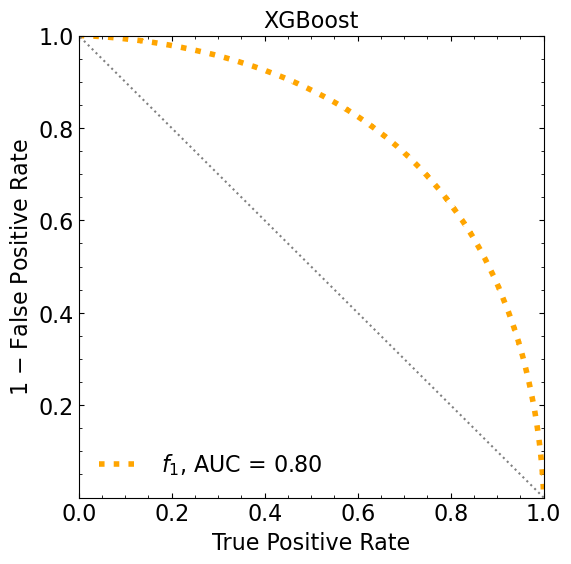

ML iteration  2
[0]	validation_0-logloss:0.67285	validation_1-logloss:0.67321
[1]	validation_0-logloss:0.65578	validation_1-logloss:0.65662


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64135	validation_1-logloss:0.64257
[3]	validation_0-logloss:0.62908	validation_1-logloss:0.63063
[4]	validation_0-logloss:0.61851	validation_1-logloss:0.62034
[5]	validation_0-logloss:0.60920	validation_1-logloss:0.61140
[6]	validation_0-logloss:0.60126	validation_1-logloss:0.60368
[7]	validation_0-logloss:0.59420	validation_1-logloss:0.59695
[8]	validation_0-logloss:0.58799	validation_1-logloss:0.59105
[9]	validation_0-logloss:0.58258	validation_1-logloss:0.58584
[10]	validation_0-logloss:0.57771	validation_1-logloss:0.58127
[11]	validation_0-logloss:0.57344	validation_1-logloss:0.57723
[12]	validation_0-logloss:0.56956	validation_1-logloss:0.57367
[13]	validation_0-logloss:0.56611	validation_1-logloss:0.57043
[14]	validation_0-logloss:0.56302	validation_1-logloss:0.56763
[15]	validation_0-logloss:0.56020	validation_1-logloss:0.56508
[16]	validation_0-logloss:0.55768	validation_1-logloss:0.56282
[17]	validation_0-logloss:0.55546	validation_1-logloss:0.56082


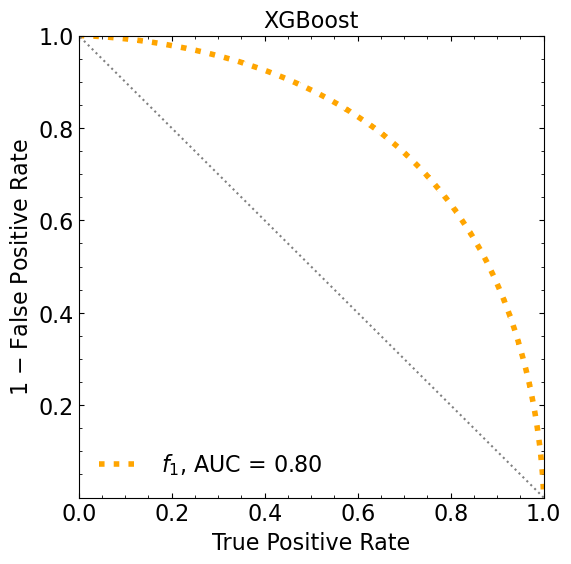

ML iteration  3
[0]	validation_0-logloss:0.67245	validation_1-logloss:0.67302
[1]	validation_0-logloss:0.65513	validation_1-logloss:0.65623


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64051	validation_1-logloss:0.64202
[3]	validation_0-logloss:0.62802	validation_1-logloss:0.63003
[4]	validation_0-logloss:0.61725	validation_1-logloss:0.61969
[5]	validation_0-logloss:0.60787	validation_1-logloss:0.61069
[6]	validation_0-logloss:0.59975	validation_1-logloss:0.60296
[7]	validation_0-logloss:0.59263	validation_1-logloss:0.59619
[8]	validation_0-logloss:0.58638	validation_1-logloss:0.59034
[9]	validation_0-logloss:0.58086	validation_1-logloss:0.58514
[10]	validation_0-logloss:0.57599	validation_1-logloss:0.58057
[11]	validation_0-logloss:0.57161	validation_1-logloss:0.57655
[12]	validation_0-logloss:0.56772	validation_1-logloss:0.57294
[13]	validation_0-logloss:0.56420	validation_1-logloss:0.56978
[14]	validation_0-logloss:0.56108	validation_1-logloss:0.56692
[15]	validation_0-logloss:0.55826	validation_1-logloss:0.56438
[16]	validation_0-logloss:0.55575	validation_1-logloss:0.56209
[17]	validation_0-logloss:0.55346	validation_1-logloss:0.56009


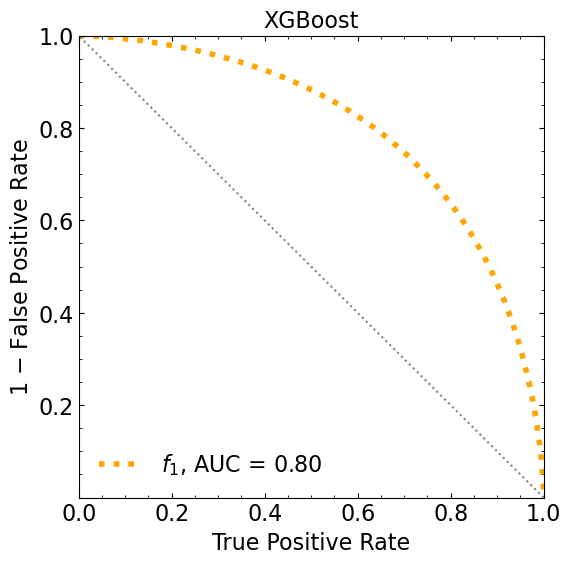

ML iteration  4
[0]	validation_0-logloss:0.67279	validation_1-logloss:0.67314
[1]	validation_0-logloss:0.65575	validation_1-logloss:0.65649


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64127	validation_1-logloss:0.64239
[3]	validation_0-logloss:0.62887	validation_1-logloss:0.63028
[4]	validation_0-logloss:0.61825	validation_1-logloss:0.62005
[5]	validation_0-logloss:0.60896	validation_1-logloss:0.61112
[6]	validation_0-logloss:0.60088	validation_1-logloss:0.60337
[7]	validation_0-logloss:0.59391	validation_1-logloss:0.59670
[8]	validation_0-logloss:0.58773	validation_1-logloss:0.59083
[9]	validation_0-logloss:0.58229	validation_1-logloss:0.58572
[10]	validation_0-logloss:0.57743	validation_1-logloss:0.58114
[11]	validation_0-logloss:0.57320	validation_1-logloss:0.57719
[12]	validation_0-logloss:0.56940	validation_1-logloss:0.57361
[13]	validation_0-logloss:0.56600	validation_1-logloss:0.57041
[14]	validation_0-logloss:0.56293	validation_1-logloss:0.56760
[15]	validation_0-logloss:0.56024	validation_1-logloss:0.56509
[16]	validation_0-logloss:0.55779	validation_1-logloss:0.56285
[17]	validation_0-logloss:0.55552	validation_1-logloss:0.56081


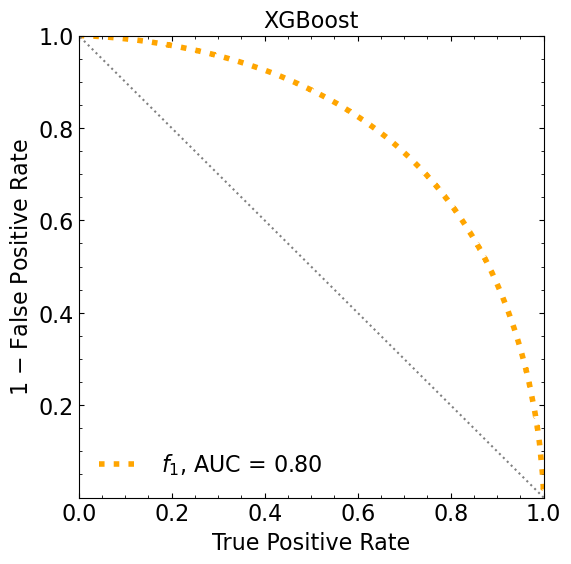

ML iteration  5
[0]	validation_0-logloss:0.67250	validation_1-logloss:0.67307
[1]	validation_0-logloss:0.65530	validation_1-logloss:0.65638


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64060	validation_1-logloss:0.64221
[3]	validation_0-logloss:0.62806	validation_1-logloss:0.63009
[4]	validation_0-logloss:0.61729	validation_1-logloss:0.61978
[5]	validation_0-logloss:0.60804	validation_1-logloss:0.61100
[6]	validation_0-logloss:0.59997	validation_1-logloss:0.60328
[7]	validation_0-logloss:0.59291	validation_1-logloss:0.59663
[8]	validation_0-logloss:0.58668	validation_1-logloss:0.59073
[9]	validation_0-logloss:0.58118	validation_1-logloss:0.58551
[10]	validation_0-logloss:0.57632	validation_1-logloss:0.58097
[11]	validation_0-logloss:0.57199	validation_1-logloss:0.57691
[12]	validation_0-logloss:0.56810	validation_1-logloss:0.57336
[13]	validation_0-logloss:0.56463	validation_1-logloss:0.57018
[14]	validation_0-logloss:0.56151	validation_1-logloss:0.56737
[15]	validation_0-logloss:0.55878	validation_1-logloss:0.56487
[16]	validation_0-logloss:0.55622	validation_1-logloss:0.56258
[17]	validation_0-logloss:0.55398	validation_1-logloss:0.56060


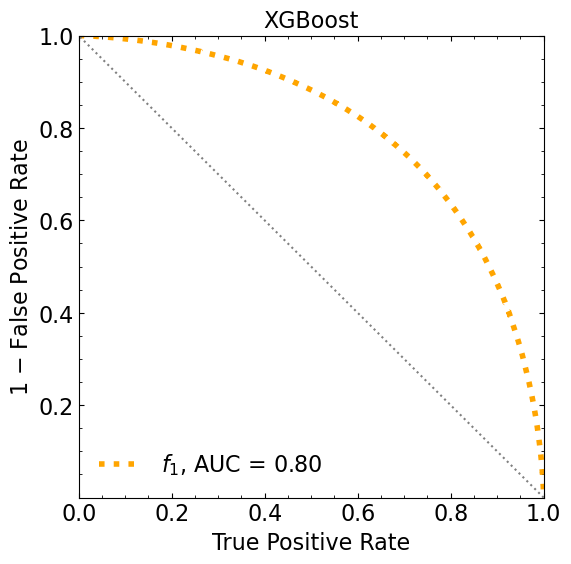

ML iteration  6
[0]	validation_0-logloss:0.67246	validation_1-logloss:0.67310
[1]	validation_0-logloss:0.65523	validation_1-logloss:0.65643


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64058	validation_1-logloss:0.64229
[3]	validation_0-logloss:0.62809	validation_1-logloss:0.63031
[4]	validation_0-logloss:0.61725	validation_1-logloss:0.61993
[5]	validation_0-logloss:0.60800	validation_1-logloss:0.61110
[6]	validation_0-logloss:0.59984	validation_1-logloss:0.60332
[7]	validation_0-logloss:0.59279	validation_1-logloss:0.59658
[8]	validation_0-logloss:0.58654	validation_1-logloss:0.59059
[9]	validation_0-logloss:0.58099	validation_1-logloss:0.58537
[10]	validation_0-logloss:0.57612	validation_1-logloss:0.58081
[11]	validation_0-logloss:0.57174	validation_1-logloss:0.57674
[12]	validation_0-logloss:0.56789	validation_1-logloss:0.57319
[13]	validation_0-logloss:0.56443	validation_1-logloss:0.57000
[14]	validation_0-logloss:0.56130	validation_1-logloss:0.56717
[15]	validation_0-logloss:0.55852	validation_1-logloss:0.56460
[16]	validation_0-logloss:0.55607	validation_1-logloss:0.56244
[17]	validation_0-logloss:0.55385	validation_1-logloss:0.56040


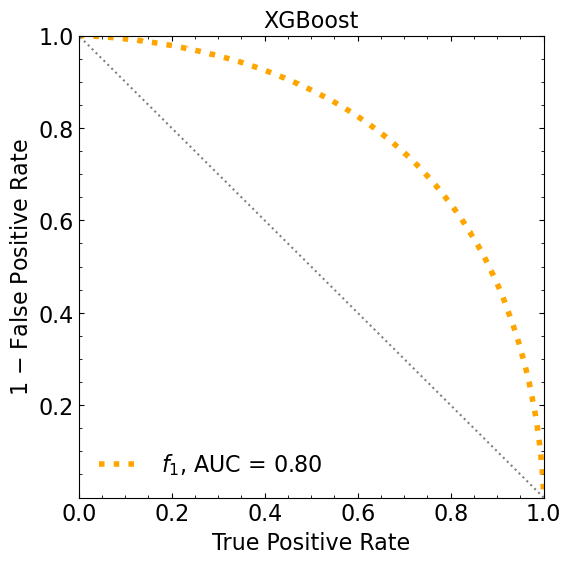

ML iteration  7
[0]	validation_0-logloss:0.67236	validation_1-logloss:0.67299
[1]	validation_0-logloss:0.65498	validation_1-logloss:0.65619


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64017	validation_1-logloss:0.64197
[3]	validation_0-logloss:0.62755	validation_1-logloss:0.62988
[4]	validation_0-logloss:0.61667	validation_1-logloss:0.61951
[5]	validation_0-logloss:0.60730	validation_1-logloss:0.61057
[6]	validation_0-logloss:0.59901	validation_1-logloss:0.60280
[7]	validation_0-logloss:0.59184	validation_1-logloss:0.59607
[8]	validation_0-logloss:0.58545	validation_1-logloss:0.59016
[9]	validation_0-logloss:0.57998	validation_1-logloss:0.58506
[10]	validation_0-logloss:0.57497	validation_1-logloss:0.58050
[11]	validation_0-logloss:0.57059	validation_1-logloss:0.57646
[12]	validation_0-logloss:0.56671	validation_1-logloss:0.57292
[13]	validation_0-logloss:0.56322	validation_1-logloss:0.56972
[14]	validation_0-logloss:0.56009	validation_1-logloss:0.56695
[15]	validation_0-logloss:0.55729	validation_1-logloss:0.56445
[16]	validation_0-logloss:0.55477	validation_1-logloss:0.56220
[17]	validation_0-logloss:0.55243	validation_1-logloss:0.56014


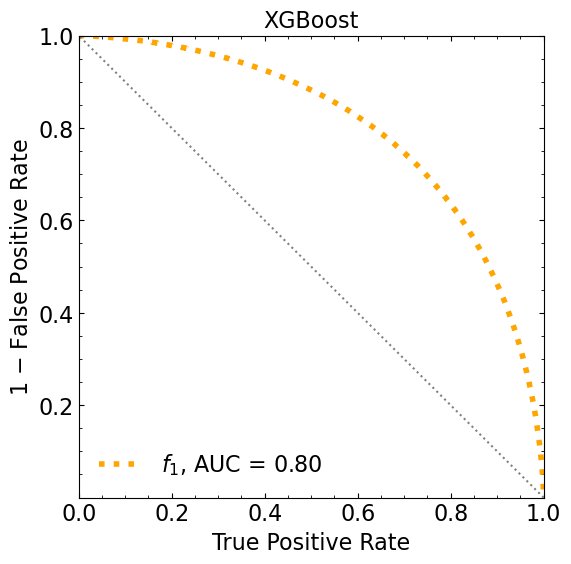

ML iteration  8
[0]	validation_0-logloss:0.67238	validation_1-logloss:0.67309
[1]	validation_0-logloss:0.65505	validation_1-logloss:0.65642


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.64039	validation_1-logloss:0.64228
[3]	validation_0-logloss:0.62785	validation_1-logloss:0.63026
[4]	validation_0-logloss:0.61702	validation_1-logloss:0.61985
[5]	validation_0-logloss:0.60763	validation_1-logloss:0.61094
[6]	validation_0-logloss:0.59940	validation_1-logloss:0.60311
[7]	validation_0-logloss:0.59231	validation_1-logloss:0.59644
[8]	validation_0-logloss:0.58609	validation_1-logloss:0.59055
[9]	validation_0-logloss:0.58061	validation_1-logloss:0.58539
[10]	validation_0-logloss:0.57568	validation_1-logloss:0.58081
[11]	validation_0-logloss:0.57135	validation_1-logloss:0.57678
[12]	validation_0-logloss:0.56746	validation_1-logloss:0.57316
[13]	validation_0-logloss:0.56398	validation_1-logloss:0.56999
[14]	validation_0-logloss:0.56087	validation_1-logloss:0.56717
[15]	validation_0-logloss:0.55811	validation_1-logloss:0.56465
[16]	validation_0-logloss:0.55562	validation_1-logloss:0.56242
[17]	validation_0-logloss:0.55334	validation_1-logloss:0.56040


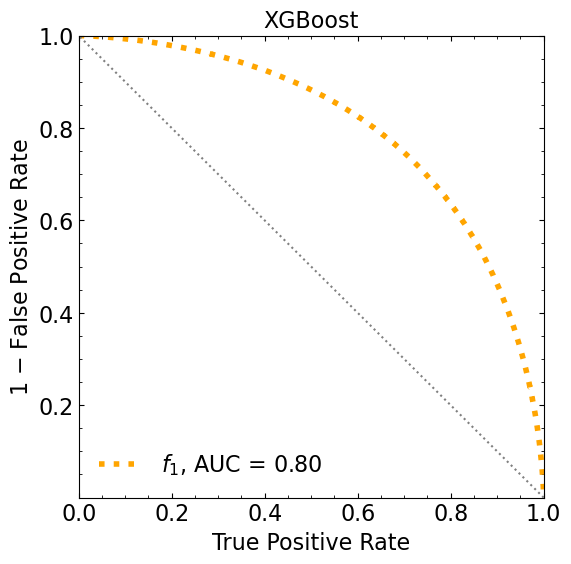

ML iteration  9
[0]	validation_0-logloss:0.67235	validation_1-logloss:0.67307


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.65499	validation_1-logloss:0.65628
[2]	validation_0-logloss:0.64031	validation_1-logloss:0.64215
[3]	validation_0-logloss:0.62780	validation_1-logloss:0.63013
[4]	validation_0-logloss:0.61705	validation_1-logloss:0.61983
[5]	validation_0-logloss:0.60774	validation_1-logloss:0.61101
[6]	validation_0-logloss:0.59958	validation_1-logloss:0.60327
[7]	validation_0-logloss:0.59240	validation_1-logloss:0.59648
[8]	validation_0-logloss:0.58609	validation_1-logloss:0.59055
[9]	validation_0-logloss:0.58054	validation_1-logloss:0.58537
[10]	validation_0-logloss:0.57568	validation_1-logloss:0.58081
[11]	validation_0-logloss:0.57130	validation_1-logloss:0.57677
[12]	validation_0-logloss:0.56736	validation_1-logloss:0.57317
[13]	validation_0-logloss:0.56390	validation_1-logloss:0.57000
[14]	validation_0-logloss:0.56081	validation_1-logloss:0.56717
[15]	validation_0-logloss:0.55801	validation_1-logloss:0.56467
[16]	validation_0-logloss:0.55545	validation_1-logloss:0.56239
[

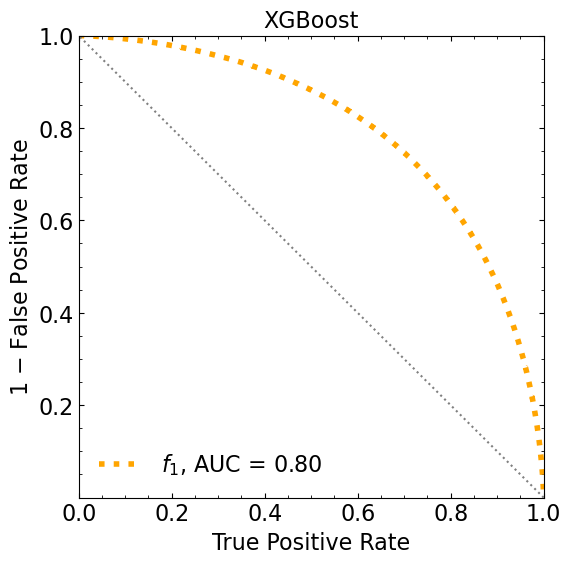

Classification score (1 ML):


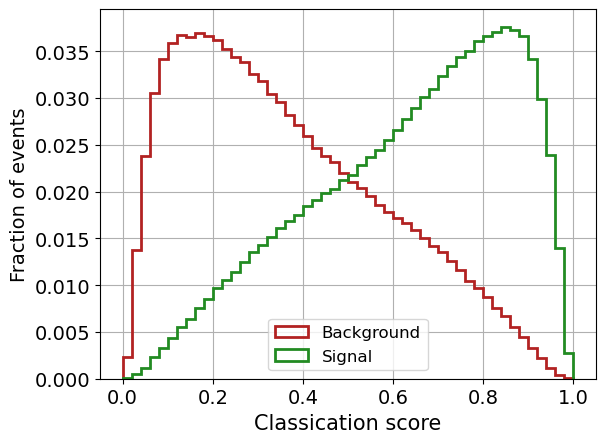

Classification score (10 ML):


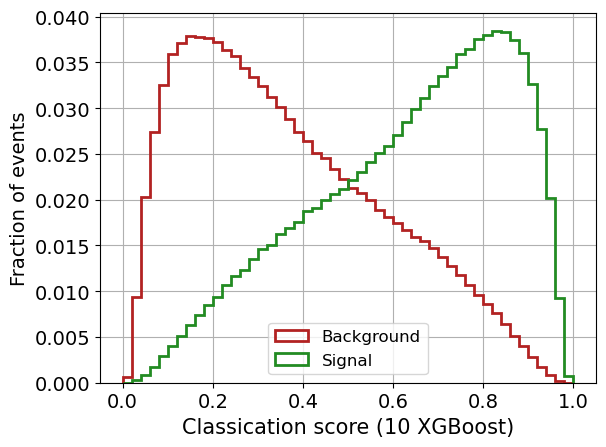

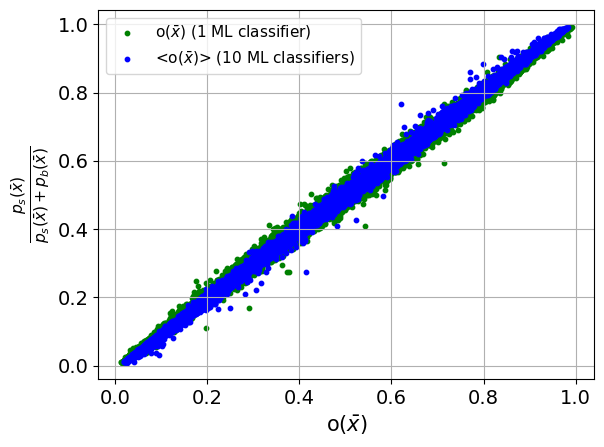


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [25]:
dim=4

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)




print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


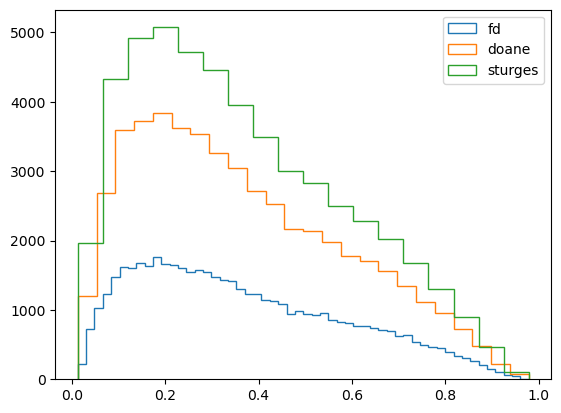

fd 54
doane 24
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  54


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  24
doing Nbin:  18


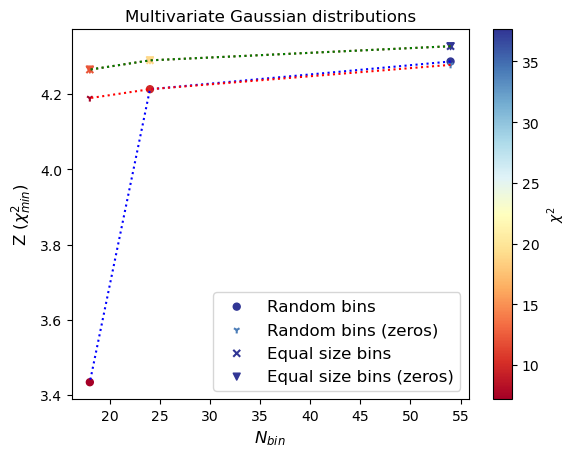

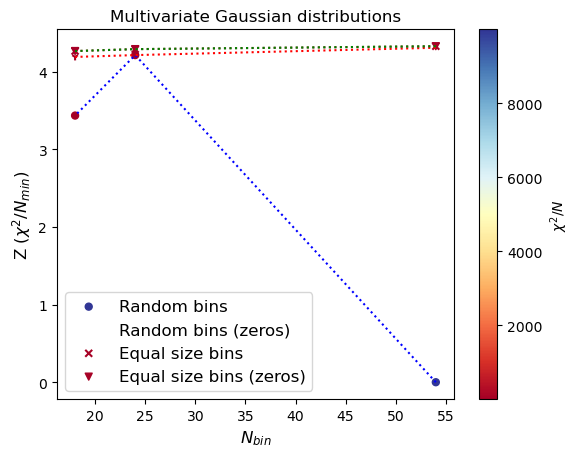

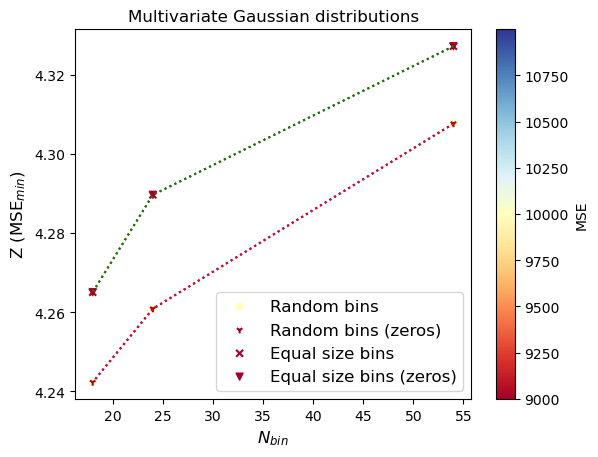

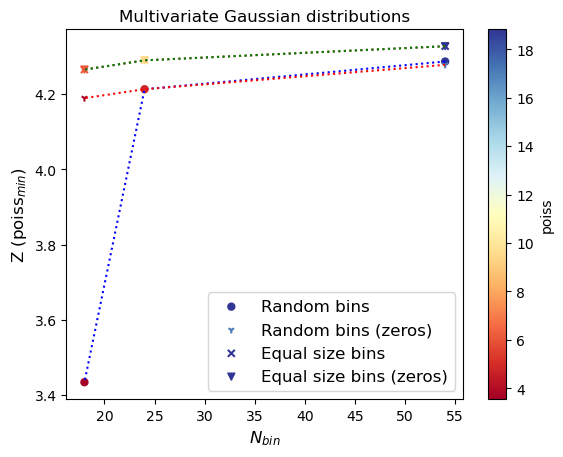

In [26]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 5)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 5)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 5)
y_gauss_test :  (2000000, 1)



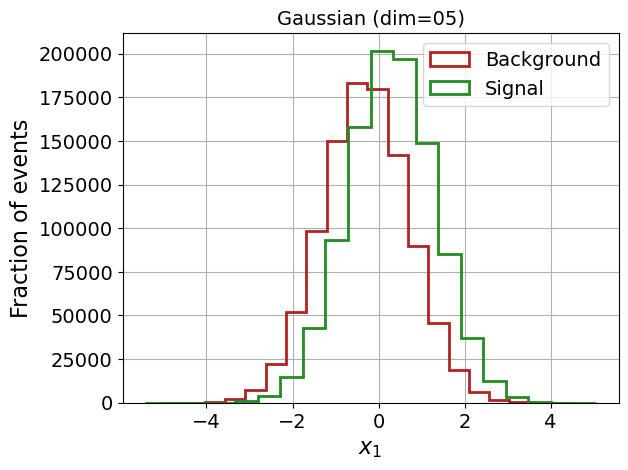

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67105	validation_1-logloss:0.67111
[1]	validation_0-logloss:0.65274	validation_1-logloss:0.65282
[2]	validation_0-logloss:0.63716	validation_1-logloss:0.63732
[3]	validation_0-logloss:0.62382	validation_1-logloss:0.62400
[4]	validation_0-logloss:0.61224	validation_1-logloss:0.61245
[5]	validation_0-logloss:0.60216	validation_1-logloss:0.60241
[6]	validation_0-logloss:0.59339	validation_1-logloss:0.59367
[7]	validation_0-logloss:0.58563	validation_1-logloss:0.58595
[8]	validation_0-logloss:0.57876	validation_1-logloss:0.57911
[9]	validation_0-logloss:0.57263	validation_1-logloss:0.57301
[10]	validation_0-logloss:0.56716	validation_1-logloss:0.56756
[11]	validation_0-logloss:0.56226	validation_1-logloss:0.56269
[12]	validation_0-logloss:0.55785	validation_1-logloss:0.55831
[13]	validation_0-logloss:0.55387	validation_1-logloss:0.55436
[14]	validation_0-logloss:0.55025	validation_1-logloss:0.55079
[15]	validation_0-logloss:0.54695	validation_1-logloss:0.54750
[1

[130]	validation_0-logloss:0.50724	validation_1-logloss:0.50916
[131]	validation_0-logloss:0.50724	validation_1-logloss:0.50916
[132]	validation_0-logloss:0.50723	validation_1-logloss:0.50916
[133]	validation_0-logloss:0.50723	validation_1-logloss:0.50915
[134]	validation_0-logloss:0.50722	validation_1-logloss:0.50915
[135]	validation_0-logloss:0.50722	validation_1-logloss:0.50915
[136]	validation_0-logloss:0.50721	validation_1-logloss:0.50915
[137]	validation_0-logloss:0.50721	validation_1-logloss:0.50915
[138]	validation_0-logloss:0.50720	validation_1-logloss:0.50915
[139]	validation_0-logloss:0.50719	validation_1-logloss:0.50915
[140]	validation_0-logloss:0.50718	validation_1-logloss:0.50915
[141]	validation_0-logloss:0.50718	validation_1-logloss:0.50915
[142]	validation_0-logloss:0.50717	validation_1-logloss:0.50915
[143]	validation_0-logloss:0.50717	validation_1-logloss:0.50915
[144]	validation_0-logloss:0.50716	validation_1-logloss:0.50915
[145]	validation_0-logloss:0.50715	valid

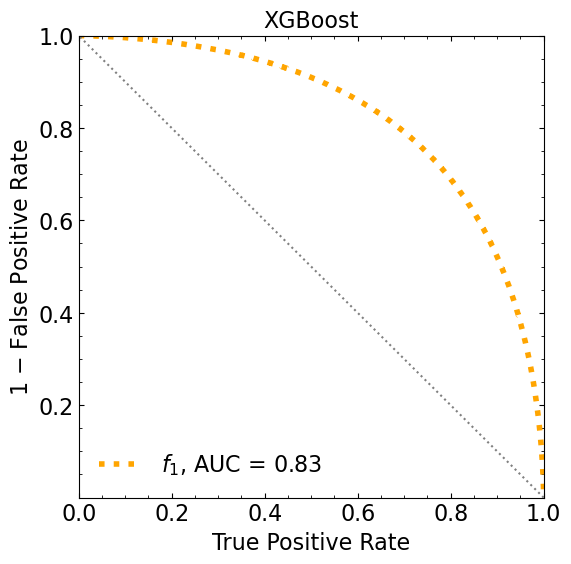

ML iteration 0
[0]	validation_0-logloss:0.67054	validation_1-logloss:0.67104
[1]	validation_0-logloss:0.65157	validation_1-logloss:0.65255


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63563	validation_1-logloss:0.63693
[3]	validation_0-logloss:0.62201	validation_1-logloss:0.62380
[4]	validation_0-logloss:0.61009	validation_1-logloss:0.61231
[5]	validation_0-logloss:0.59956	validation_1-logloss:0.60222
[6]	validation_0-logloss:0.59031	validation_1-logloss:0.59332
[7]	validation_0-logloss:0.58202	validation_1-logloss:0.58543
[8]	validation_0-logloss:0.57472	validation_1-logloss:0.57855
[9]	validation_0-logloss:0.56825	validation_1-logloss:0.57237
[10]	validation_0-logloss:0.56236	validation_1-logloss:0.56692
[11]	validation_0-logloss:0.55718	validation_1-logloss:0.56201
[12]	validation_0-logloss:0.55247	validation_1-logloss:0.55757
[13]	validation_0-logloss:0.54815	validation_1-logloss:0.55357
[14]	validation_0-logloss:0.54428	validation_1-logloss:0.54995
[15]	validation_0-logloss:0.54073	validation_1-logloss:0.54673
[16]	validation_0-logloss:0.53746	validation_1-logloss:0.54369
[17]	validation_0-logloss:0.53446	validation_1-logloss:0.54099


[132]	validation_0-logloss:0.49153	validation_1-logloss:0.51149
[133]	validation_0-logloss:0.49151	validation_1-logloss:0.51149
[134]	validation_0-logloss:0.49140	validation_1-logloss:0.51149
[135]	validation_0-logloss:0.49136	validation_1-logloss:0.51149
[136]	validation_0-logloss:0.49131	validation_1-logloss:0.51150
[137]	validation_0-logloss:0.49117	validation_1-logloss:0.51151
[138]	validation_0-logloss:0.49104	validation_1-logloss:0.51152
[139]	validation_0-logloss:0.49102	validation_1-logloss:0.51152


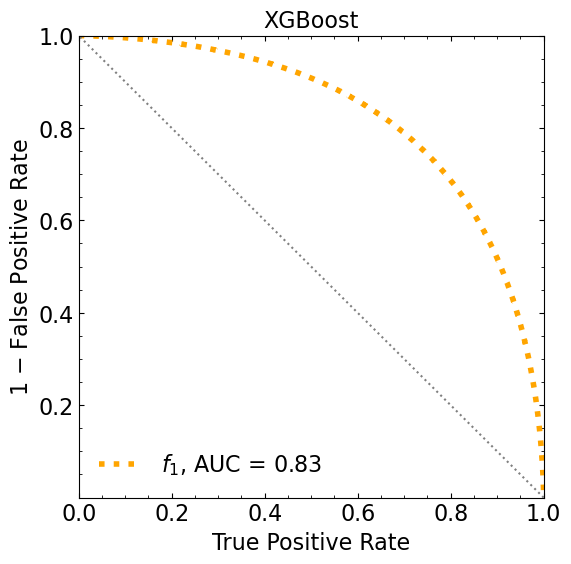

ML iteration  1
[0]	validation_0-logloss:0.67040	validation_1-logloss:0.67090
[1]	validation_0-logloss:0.65167	validation_1-logloss:0.65258


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63565	validation_1-logloss:0.63691
[3]	validation_0-logloss:0.62183	validation_1-logloss:0.62350
[4]	validation_0-logloss:0.60991	validation_1-logloss:0.61203
[5]	validation_0-logloss:0.59950	validation_1-logloss:0.60198
[6]	validation_0-logloss:0.59027	validation_1-logloss:0.59312
[7]	validation_0-logloss:0.58219	validation_1-logloss:0.58534
[8]	validation_0-logloss:0.57498	validation_1-logloss:0.57855
[9]	validation_0-logloss:0.56850	validation_1-logloss:0.57237
[10]	validation_0-logloss:0.56280	validation_1-logloss:0.56696
[11]	validation_0-logloss:0.55762	validation_1-logloss:0.56206
[12]	validation_0-logloss:0.55290	validation_1-logloss:0.55765
[13]	validation_0-logloss:0.54866	validation_1-logloss:0.55370
[14]	validation_0-logloss:0.54481	validation_1-logloss:0.55012
[15]	validation_0-logloss:0.54131	validation_1-logloss:0.54686
[16]	validation_0-logloss:0.53814	validation_1-logloss:0.54391
[17]	validation_0-logloss:0.53523	validation_1-logloss:0.54120


[132]	validation_0-logloss:0.49212	validation_1-logloss:0.51153
[133]	validation_0-logloss:0.49205	validation_1-logloss:0.51154
[134]	validation_0-logloss:0.49193	validation_1-logloss:0.51154
[135]	validation_0-logloss:0.49184	validation_1-logloss:0.51155
[136]	validation_0-logloss:0.49169	validation_1-logloss:0.51156
[137]	validation_0-logloss:0.49161	validation_1-logloss:0.51156
[138]	validation_0-logloss:0.49157	validation_1-logloss:0.51157
[139]	validation_0-logloss:0.49148	validation_1-logloss:0.51158
[140]	validation_0-logloss:0.49144	validation_1-logloss:0.51158
[141]	validation_0-logloss:0.49139	validation_1-logloss:0.51158


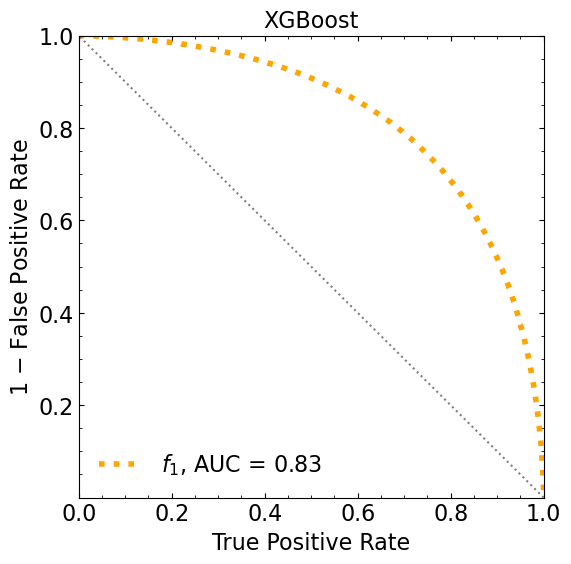

ML iteration  2
[0]	validation_0-logloss:0.67033	validation_1-logloss:0.67089
[1]	validation_0-logloss:0.65135	validation_1-logloss:0.65246


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63511	validation_1-logloss:0.63674
[3]	validation_0-logloss:0.62122	validation_1-logloss:0.62338
[4]	validation_0-logloss:0.60926	validation_1-logloss:0.61184
[5]	validation_0-logloss:0.59882	validation_1-logloss:0.60184
[6]	validation_0-logloss:0.58952	validation_1-logloss:0.59307
[7]	validation_0-logloss:0.58133	validation_1-logloss:0.58535
[8]	validation_0-logloss:0.57403	validation_1-logloss:0.57836
[9]	validation_0-logloss:0.56761	validation_1-logloss:0.57231
[10]	validation_0-logloss:0.56176	validation_1-logloss:0.56681
[11]	validation_0-logloss:0.55659	validation_1-logloss:0.56198
[12]	validation_0-logloss:0.55187	validation_1-logloss:0.55756
[13]	validation_0-logloss:0.54760	validation_1-logloss:0.55353
[14]	validation_0-logloss:0.54375	validation_1-logloss:0.55000
[15]	validation_0-logloss:0.54021	validation_1-logloss:0.54673
[16]	validation_0-logloss:0.53697	validation_1-logloss:0.54378
[17]	validation_0-logloss:0.53401	validation_1-logloss:0.54111


[132]	validation_0-logloss:0.49048	validation_1-logloss:0.51164
[133]	validation_0-logloss:0.49047	validation_1-logloss:0.51164
[134]	validation_0-logloss:0.49042	validation_1-logloss:0.51164
[135]	validation_0-logloss:0.49037	validation_1-logloss:0.51164
[136]	validation_0-logloss:0.49030	validation_1-logloss:0.51165
[137]	validation_0-logloss:0.49019	validation_1-logloss:0.51165
[138]	validation_0-logloss:0.49007	validation_1-logloss:0.51166
[139]	validation_0-logloss:0.49000	validation_1-logloss:0.51167
[140]	validation_0-logloss:0.48994	validation_1-logloss:0.51167
[141]	validation_0-logloss:0.48991	validation_1-logloss:0.51167
[142]	validation_0-logloss:0.48984	validation_1-logloss:0.51167


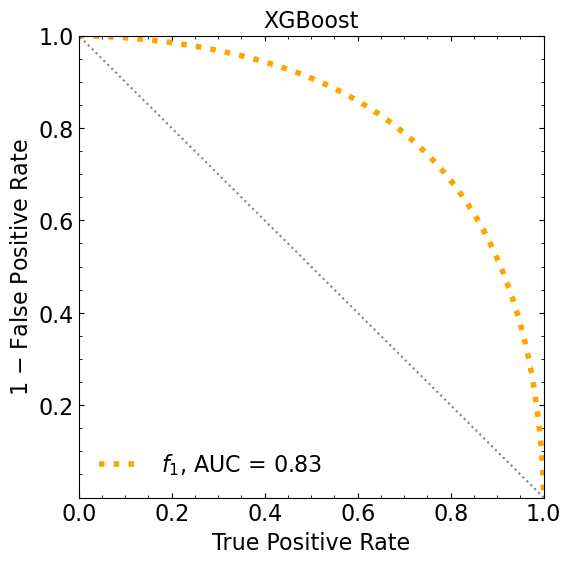

ML iteration  3
[0]	validation_0-logloss:0.67055	validation_1-logloss:0.67099
[1]	validation_0-logloss:0.65164	validation_1-logloss:0.65250


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63571	validation_1-logloss:0.63712
[3]	validation_0-logloss:0.62189	validation_1-logloss:0.62376
[4]	validation_0-logloss:0.60971	validation_1-logloss:0.61200
[5]	validation_0-logloss:0.59919	validation_1-logloss:0.60185
[6]	validation_0-logloss:0.58996	validation_1-logloss:0.59298
[7]	validation_0-logloss:0.58180	validation_1-logloss:0.58521
[8]	validation_0-logloss:0.57452	validation_1-logloss:0.57835
[9]	validation_0-logloss:0.56798	validation_1-logloss:0.57219
[10]	validation_0-logloss:0.56220	validation_1-logloss:0.56673
[11]	validation_0-logloss:0.55696	validation_1-logloss:0.56186
[12]	validation_0-logloss:0.55226	validation_1-logloss:0.55747
[13]	validation_0-logloss:0.54793	validation_1-logloss:0.55350
[14]	validation_0-logloss:0.54407	validation_1-logloss:0.54998
[15]	validation_0-logloss:0.54050	validation_1-logloss:0.54669
[16]	validation_0-logloss:0.53733	validation_1-logloss:0.54383
[17]	validation_0-logloss:0.53439	validation_1-logloss:0.54116


[132]	validation_0-logloss:0.49058	validation_1-logloss:0.51170
[133]	validation_0-logloss:0.49048	validation_1-logloss:0.51172
[134]	validation_0-logloss:0.49040	validation_1-logloss:0.51173
[135]	validation_0-logloss:0.49031	validation_1-logloss:0.51173
[136]	validation_0-logloss:0.49024	validation_1-logloss:0.51174
[137]	validation_0-logloss:0.49016	validation_1-logloss:0.51174
[138]	validation_0-logloss:0.49010	validation_1-logloss:0.51175
[139]	validation_0-logloss:0.49007	validation_1-logloss:0.51176
[140]	validation_0-logloss:0.49004	validation_1-logloss:0.51177
[141]	validation_0-logloss:0.48997	validation_1-logloss:0.51177
[142]	validation_0-logloss:0.48985	validation_1-logloss:0.51178


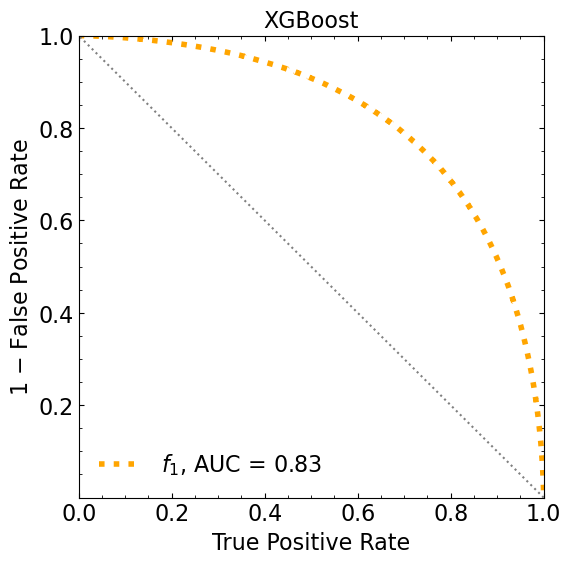

ML iteration  4
[0]	validation_0-logloss:0.67067	validation_1-logloss:0.67107
[1]	validation_0-logloss:0.65182	validation_1-logloss:0.65269


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63582	validation_1-logloss:0.63706
[3]	validation_0-logloss:0.62195	validation_1-logloss:0.62359
[4]	validation_0-logloss:0.61000	validation_1-logloss:0.61204
[5]	validation_0-logloss:0.59957	validation_1-logloss:0.60202
[6]	validation_0-logloss:0.59034	validation_1-logloss:0.59321
[7]	validation_0-logloss:0.58218	validation_1-logloss:0.58539
[8]	validation_0-logloss:0.57488	validation_1-logloss:0.57846
[9]	validation_0-logloss:0.56842	validation_1-logloss:0.57233
[10]	validation_0-logloss:0.56263	validation_1-logloss:0.56683
[11]	validation_0-logloss:0.55750	validation_1-logloss:0.56199
[12]	validation_0-logloss:0.55285	validation_1-logloss:0.55760
[13]	validation_0-logloss:0.54860	validation_1-logloss:0.55371
[14]	validation_0-logloss:0.54480	validation_1-logloss:0.55017
[15]	validation_0-logloss:0.54132	validation_1-logloss:0.54691
[16]	validation_0-logloss:0.53815	validation_1-logloss:0.54400
[17]	validation_0-logloss:0.53527	validation_1-logloss:0.54132


[132]	validation_0-logloss:0.49270	validation_1-logloss:0.51174
[133]	validation_0-logloss:0.49268	validation_1-logloss:0.51174
[134]	validation_0-logloss:0.49263	validation_1-logloss:0.51174
[135]	validation_0-logloss:0.49261	validation_1-logloss:0.51175
[136]	validation_0-logloss:0.49249	validation_1-logloss:0.51176
[137]	validation_0-logloss:0.49242	validation_1-logloss:0.51177
[138]	validation_0-logloss:0.49234	validation_1-logloss:0.51178
[139]	validation_0-logloss:0.49228	validation_1-logloss:0.51178
[140]	validation_0-logloss:0.49223	validation_1-logloss:0.51178
[141]	validation_0-logloss:0.49220	validation_1-logloss:0.51178
[142]	validation_0-logloss:0.49208	validation_1-logloss:0.51180
[143]	validation_0-logloss:0.49200	validation_1-logloss:0.51181


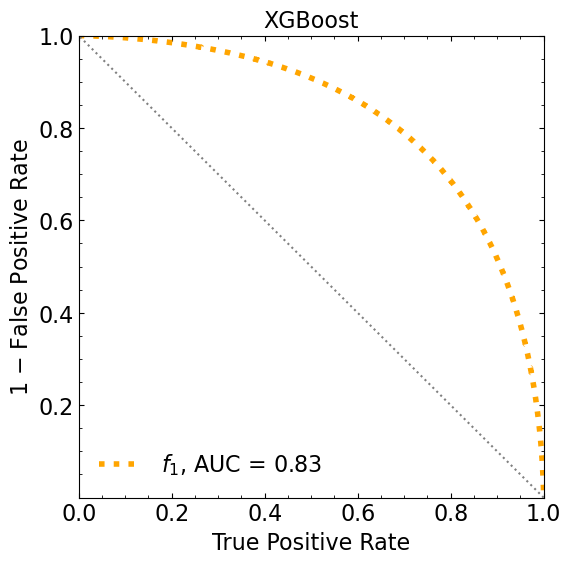

ML iteration  5
[0]	validation_0-logloss:0.67049	validation_1-logloss:0.67101
[1]	validation_0-logloss:0.65139	validation_1-logloss:0.65245


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63533	validation_1-logloss:0.63683
[3]	validation_0-logloss:0.62139	validation_1-logloss:0.62340
[4]	validation_0-logloss:0.60934	validation_1-logloss:0.61183
[5]	validation_0-logloss:0.59875	validation_1-logloss:0.60171
[6]	validation_0-logloss:0.58951	validation_1-logloss:0.59288
[7]	validation_0-logloss:0.58125	validation_1-logloss:0.58499
[8]	validation_0-logloss:0.57393	validation_1-logloss:0.57809
[9]	validation_0-logloss:0.56742	validation_1-logloss:0.57203
[10]	validation_0-logloss:0.56146	validation_1-logloss:0.56645
[11]	validation_0-logloss:0.55617	validation_1-logloss:0.56153
[12]	validation_0-logloss:0.55144	validation_1-logloss:0.55713
[13]	validation_0-logloss:0.54716	validation_1-logloss:0.55316
[14]	validation_0-logloss:0.54335	validation_1-logloss:0.54968
[15]	validation_0-logloss:0.53977	validation_1-logloss:0.54643
[16]	validation_0-logloss:0.53657	validation_1-logloss:0.54355
[17]	validation_0-logloss:0.53357	validation_1-logloss:0.54080


[132]	validation_0-logloss:0.48997	validation_1-logloss:0.51175
[133]	validation_0-logloss:0.48994	validation_1-logloss:0.51176


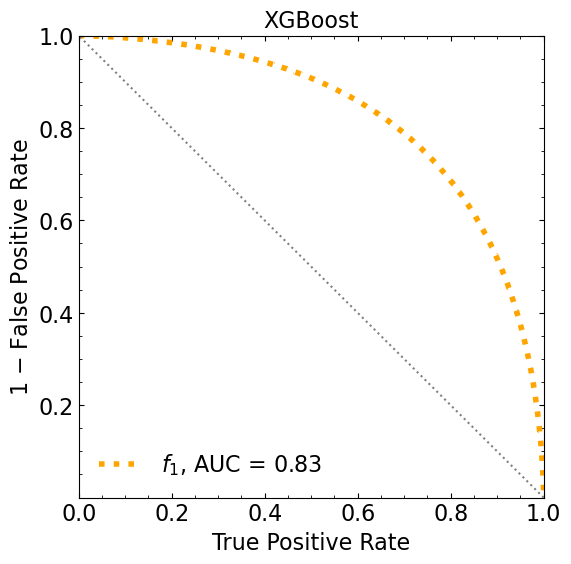

ML iteration  6
[0]	validation_0-logloss:0.67049	validation_1-logloss:0.67101
[1]	validation_0-logloss:0.65163	validation_1-logloss:0.65253


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63554	validation_1-logloss:0.63687
[3]	validation_0-logloss:0.62176	validation_1-logloss:0.62356
[4]	validation_0-logloss:0.60982	validation_1-logloss:0.61201
[5]	validation_0-logloss:0.59917	validation_1-logloss:0.60180
[6]	validation_0-logloss:0.58999	validation_1-logloss:0.59303
[7]	validation_0-logloss:0.58181	validation_1-logloss:0.58529
[8]	validation_0-logloss:0.57454	validation_1-logloss:0.57842
[9]	validation_0-logloss:0.56801	validation_1-logloss:0.57235
[10]	validation_0-logloss:0.56219	validation_1-logloss:0.56688
[11]	validation_0-logloss:0.55702	validation_1-logloss:0.56199
[12]	validation_0-logloss:0.55235	validation_1-logloss:0.55767
[13]	validation_0-logloss:0.54803	validation_1-logloss:0.55360
[14]	validation_0-logloss:0.54416	validation_1-logloss:0.55005
[15]	validation_0-logloss:0.54064	validation_1-logloss:0.54691
[16]	validation_0-logloss:0.53748	validation_1-logloss:0.54399
[17]	validation_0-logloss:0.53452	validation_1-logloss:0.54128


[132]	validation_0-logloss:0.49187	validation_1-logloss:0.51167
[133]	validation_0-logloss:0.49185	validation_1-logloss:0.51167
[134]	validation_0-logloss:0.49181	validation_1-logloss:0.51167
[135]	validation_0-logloss:0.49175	validation_1-logloss:0.51168
[136]	validation_0-logloss:0.49166	validation_1-logloss:0.51169
[137]	validation_0-logloss:0.49164	validation_1-logloss:0.51169
[138]	validation_0-logloss:0.49156	validation_1-logloss:0.51170
[139]	validation_0-logloss:0.49149	validation_1-logloss:0.51171
[140]	validation_0-logloss:0.49141	validation_1-logloss:0.51171
[141]	validation_0-logloss:0.49136	validation_1-logloss:0.51172


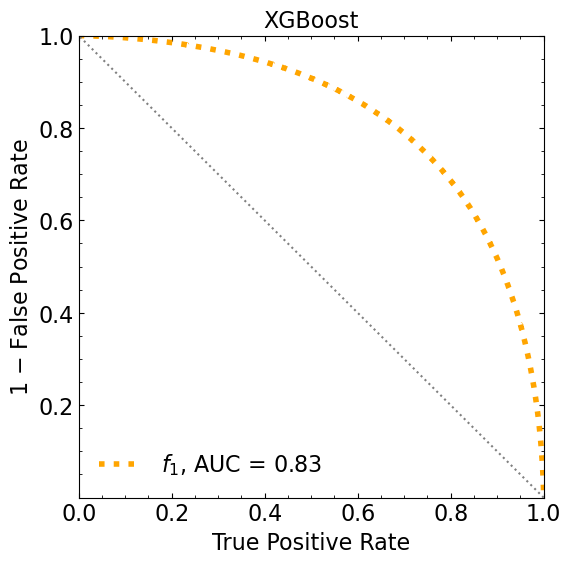

ML iteration  7
[0]	validation_0-logloss:0.67036	validation_1-logloss:0.67098
[1]	validation_0-logloss:0.65128	validation_1-logloss:0.65249


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63499	validation_1-logloss:0.63680
[3]	validation_0-logloss:0.62130	validation_1-logloss:0.62353
[4]	validation_0-logloss:0.60929	validation_1-logloss:0.61199
[5]	validation_0-logloss:0.59878	validation_1-logloss:0.60190
[6]	validation_0-logloss:0.58956	validation_1-logloss:0.59308
[7]	validation_0-logloss:0.58149	validation_1-logloss:0.58539
[8]	validation_0-logloss:0.57419	validation_1-logloss:0.57850
[9]	validation_0-logloss:0.56764	validation_1-logloss:0.57232
[10]	validation_0-logloss:0.56181	validation_1-logloss:0.56686
[11]	validation_0-logloss:0.55650	validation_1-logloss:0.56198
[12]	validation_0-logloss:0.55174	validation_1-logloss:0.55746
[13]	validation_0-logloss:0.54743	validation_1-logloss:0.55344
[14]	validation_0-logloss:0.54355	validation_1-logloss:0.54992
[15]	validation_0-logloss:0.54000	validation_1-logloss:0.54665
[16]	validation_0-logloss:0.53674	validation_1-logloss:0.54366
[17]	validation_0-logloss:0.53373	validation_1-logloss:0.54099


[132]	validation_0-logloss:0.49051	validation_1-logloss:0.51166
[133]	validation_0-logloss:0.49049	validation_1-logloss:0.51167


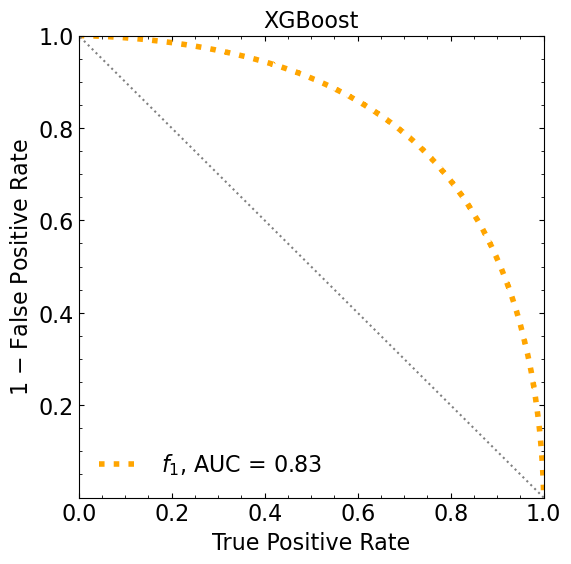

ML iteration  8
[0]	validation_0-logloss:0.67027	validation_1-logloss:0.67092
[1]	validation_0-logloss:0.65110	validation_1-logloss:0.65242


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63469	validation_1-logloss:0.63658
[3]	validation_0-logloss:0.62072	validation_1-logloss:0.62315
[4]	validation_0-logloss:0.60870	validation_1-logloss:0.61167
[5]	validation_0-logloss:0.59810	validation_1-logloss:0.60150
[6]	validation_0-logloss:0.58872	validation_1-logloss:0.59252
[7]	validation_0-logloss:0.58040	validation_1-logloss:0.58467
[8]	validation_0-logloss:0.57309	validation_1-logloss:0.57784
[9]	validation_0-logloss:0.56656	validation_1-logloss:0.57176
[10]	validation_0-logloss:0.56060	validation_1-logloss:0.56622
[11]	validation_0-logloss:0.55528	validation_1-logloss:0.56139
[12]	validation_0-logloss:0.55046	validation_1-logloss:0.55693
[13]	validation_0-logloss:0.54606	validation_1-logloss:0.55299
[14]	validation_0-logloss:0.54215	validation_1-logloss:0.54938
[15]	validation_0-logloss:0.53855	validation_1-logloss:0.54619
[16]	validation_0-logloss:0.53525	validation_1-logloss:0.54325
[17]	validation_0-logloss:0.53225	validation_1-logloss:0.54063


[132]	validation_0-logloss:0.48869	validation_1-logloss:0.51204
[133]	validation_0-logloss:0.48866	validation_1-logloss:0.51205


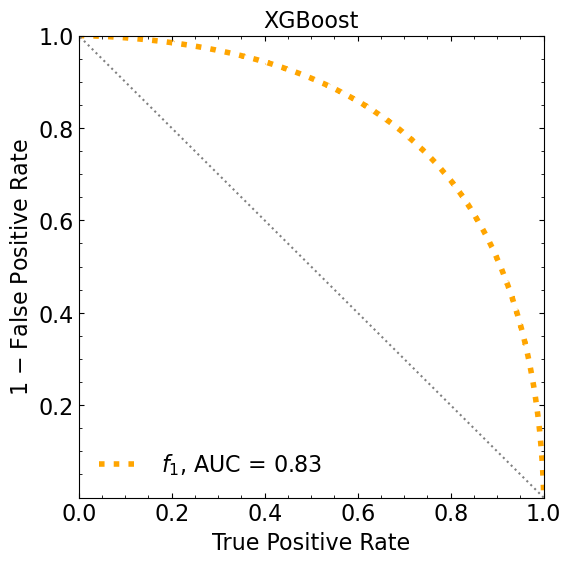

ML iteration  9
[0]	validation_0-logloss:0.67034	validation_1-logloss:0.67094


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.65135	validation_1-logloss:0.65249
[2]	validation_0-logloss:0.63489	validation_1-logloss:0.63664
[3]	validation_0-logloss:0.62103	validation_1-logloss:0.62329
[4]	validation_0-logloss:0.60901	validation_1-logloss:0.61175
[5]	validation_0-logloss:0.59841	validation_1-logloss:0.60162
[6]	validation_0-logloss:0.58897	validation_1-logloss:0.59275
[7]	validation_0-logloss:0.58078	validation_1-logloss:0.58493
[8]	validation_0-logloss:0.57346	validation_1-logloss:0.57813
[9]	validation_0-logloss:0.56696	validation_1-logloss:0.57205
[10]	validation_0-logloss:0.56103	validation_1-logloss:0.56647
[11]	validation_0-logloss:0.55575	validation_1-logloss:0.56158
[12]	validation_0-logloss:0.55095	validation_1-logloss:0.55712
[13]	validation_0-logloss:0.54669	validation_1-logloss:0.55318
[14]	validation_0-logloss:0.54288	validation_1-logloss:0.54966
[15]	validation_0-logloss:0.53933	validation_1-logloss:0.54639
[16]	validation_0-logloss:0.53611	validation_1-logloss:0.54342
[

[131]	validation_0-logloss:0.48993	validation_1-logloss:0.51159
[132]	validation_0-logloss:0.48988	validation_1-logloss:0.51160
[133]	validation_0-logloss:0.48985	validation_1-logloss:0.51160
[134]	validation_0-logloss:0.48976	validation_1-logloss:0.51161
[135]	validation_0-logloss:0.48969	validation_1-logloss:0.51161
[136]	validation_0-logloss:0.48964	validation_1-logloss:0.51161
[137]	validation_0-logloss:0.48953	validation_1-logloss:0.51162
[138]	validation_0-logloss:0.48947	validation_1-logloss:0.51162
[139]	validation_0-logloss:0.48940	validation_1-logloss:0.51163
[140]	validation_0-logloss:0.48932	validation_1-logloss:0.51164


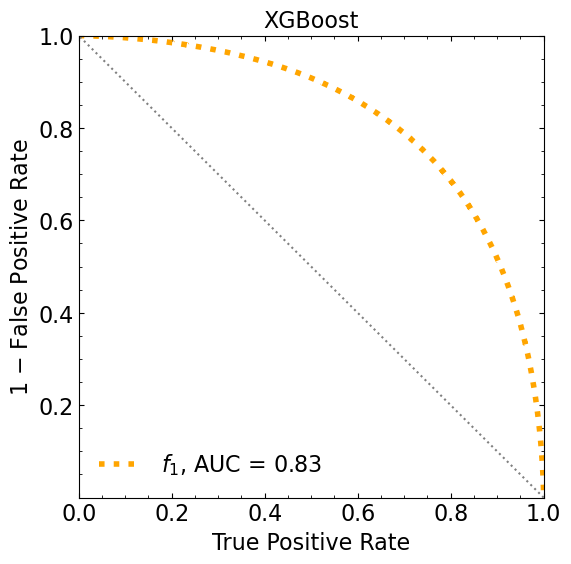

Classification score (1 ML):


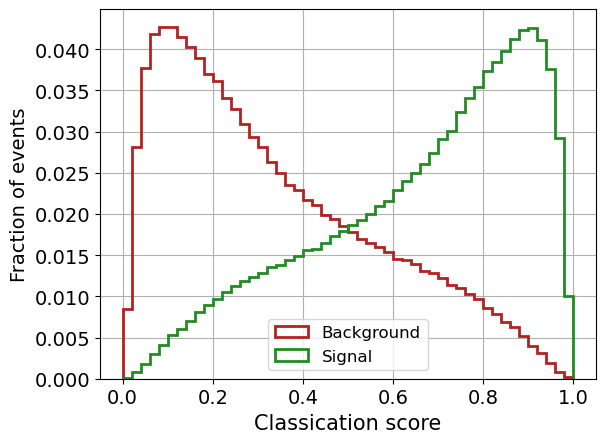

Classification score (10 ML):


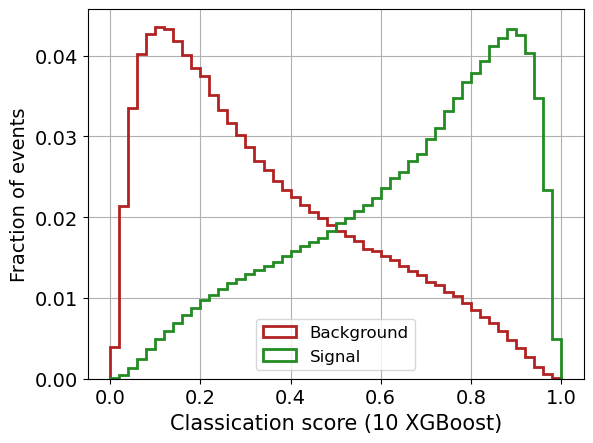

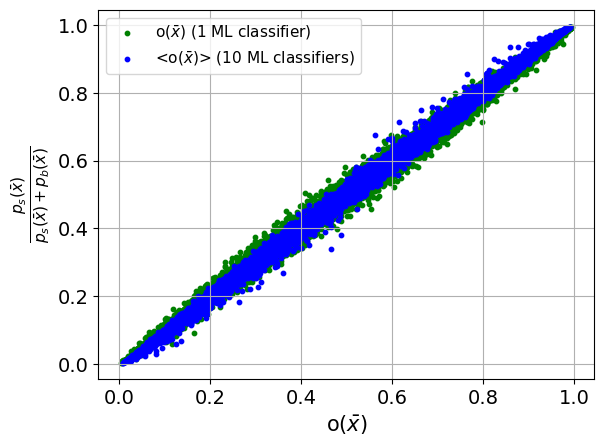


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [27]:
dim=5

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))


# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)




print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


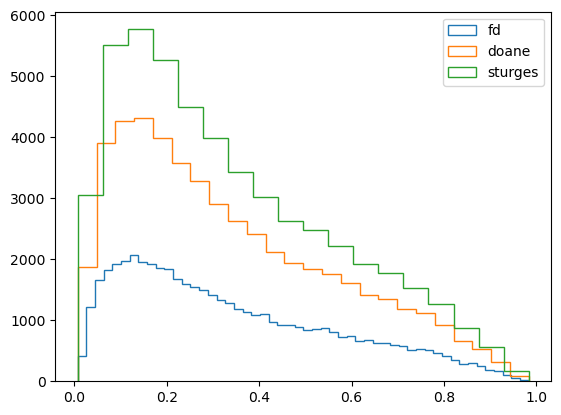

fd 52
doane 24
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  52


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  24
doing Nbin:  18


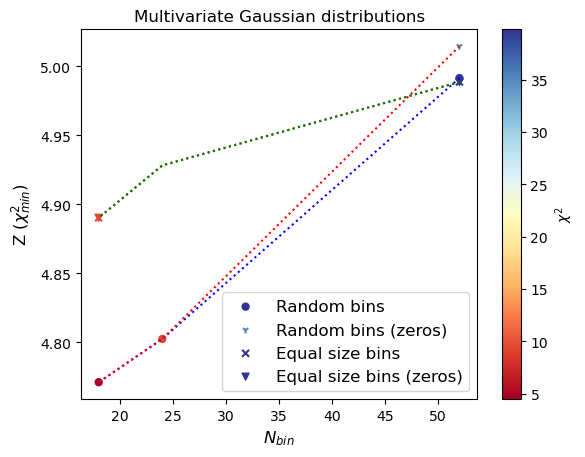

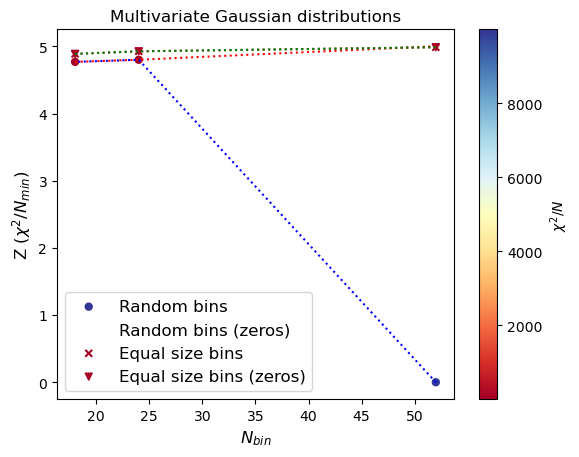

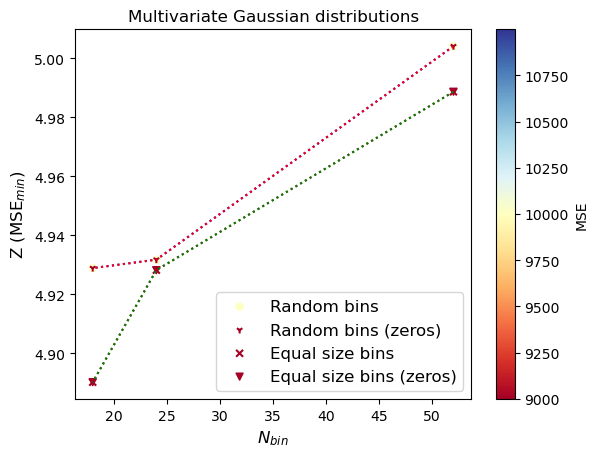

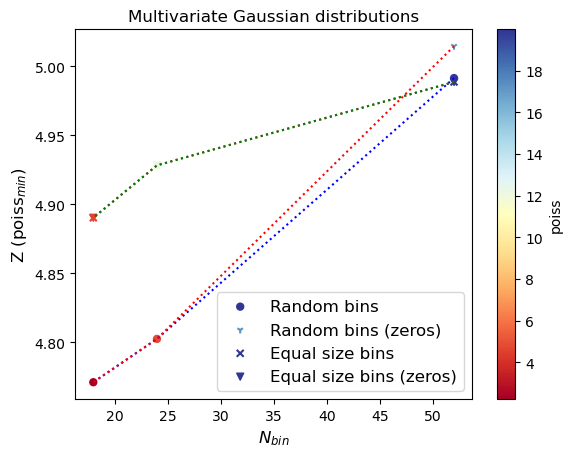

In [28]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 6)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 6)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 6)
y_gauss_test :  (2000000, 1)



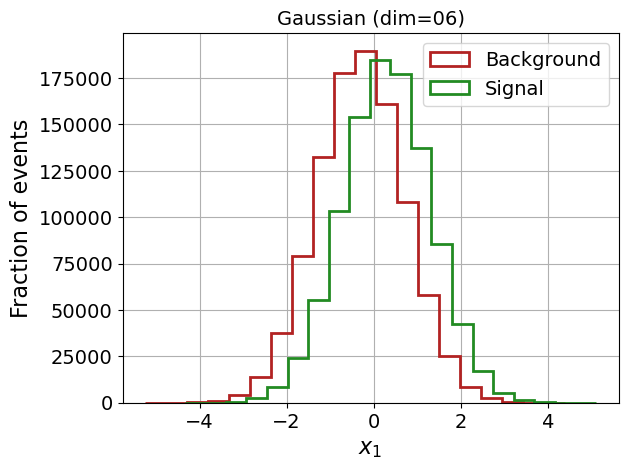

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67090	validation_1-logloss:0.67103
[1]	validation_0-logloss:0.65183	validation_1-logloss:0.65203
[2]	validation_0-logloss:0.63546	validation_1-logloss:0.63570
[3]	validation_0-logloss:0.62115	validation_1-logloss:0.62149
[4]	validation_0-logloss:0.60862	validation_1-logloss:0.60904
[5]	validation_0-logloss:0.59756	validation_1-logloss:0.59808
[6]	validation_0-logloss:0.58768	validation_1-logloss:0.58825
[7]	validation_0-logloss:0.57888	validation_1-logloss:0.57950
[8]	validation_0-logloss:0.57104	validation_1-logloss:0.57172
[9]	validation_0-logloss:0.56394	validation_1-logloss:0.56469
[10]	validation_0-logloss:0.55749	validation_1-logloss:0.55828
[11]	validation_0-logloss:0.55169	validation_1-logloss:0.55255
[12]	validation_0-logloss:0.54644	validation_1-logloss:0.54734
[13]	validation_0-logloss:0.54167	validation_1-logloss:0.54261
[14]	validation_0-logloss:0.53732	validation_1-logloss:0.53833
[15]	validation_0-logloss:0.53331	validation_1-logloss:0.53435
[1

[130]	validation_0-logloss:0.47792	validation_1-logloss:0.48080
[131]	validation_0-logloss:0.47791	validation_1-logloss:0.48080
[132]	validation_0-logloss:0.47790	validation_1-logloss:0.48080
[133]	validation_0-logloss:0.47789	validation_1-logloss:0.48079
[134]	validation_0-logloss:0.47788	validation_1-logloss:0.48079
[135]	validation_0-logloss:0.47787	validation_1-logloss:0.48079
[136]	validation_0-logloss:0.47786	validation_1-logloss:0.48079
[137]	validation_0-logloss:0.47785	validation_1-logloss:0.48079
[138]	validation_0-logloss:0.47784	validation_1-logloss:0.48078
[139]	validation_0-logloss:0.47783	validation_1-logloss:0.48078
[140]	validation_0-logloss:0.47782	validation_1-logloss:0.48078
[141]	validation_0-logloss:0.47782	validation_1-logloss:0.48078
[142]	validation_0-logloss:0.47781	validation_1-logloss:0.48078
[143]	validation_0-logloss:0.47780	validation_1-logloss:0.48078
[144]	validation_0-logloss:0.47779	validation_1-logloss:0.48078
[145]	validation_0-logloss:0.47778	valid

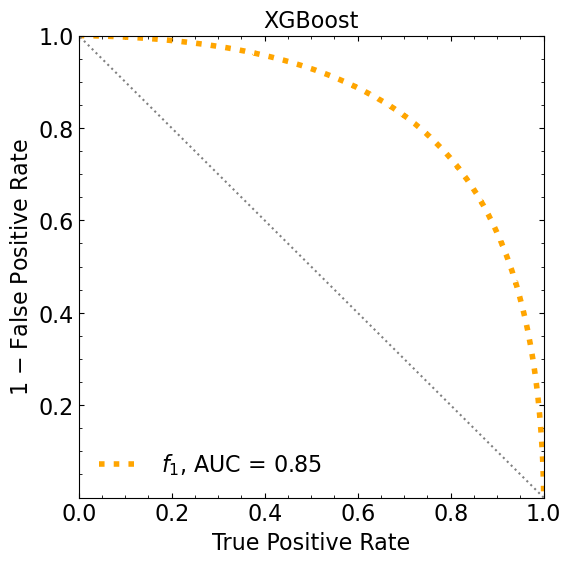

ML iteration 0
[0]	validation_0-logloss:0.67016	validation_1-logloss:0.67086
[1]	validation_0-logloss:0.65049	validation_1-logloss:0.65187


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63334	validation_1-logloss:0.63528
[3]	validation_0-logloss:0.61843	validation_1-logloss:0.62097
[4]	validation_0-logloss:0.60537	validation_1-logloss:0.60832
[5]	validation_0-logloss:0.59371	validation_1-logloss:0.59714
[6]	validation_0-logloss:0.58335	validation_1-logloss:0.58727
[7]	validation_0-logloss:0.57409	validation_1-logloss:0.57846
[8]	validation_0-logloss:0.56580	validation_1-logloss:0.57059
[9]	validation_0-logloss:0.55821	validation_1-logloss:0.56344
[10]	validation_0-logloss:0.55142	validation_1-logloss:0.55711
[11]	validation_0-logloss:0.54526	validation_1-logloss:0.55137
[12]	validation_0-logloss:0.53960	validation_1-logloss:0.54617
[13]	validation_0-logloss:0.53446	validation_1-logloss:0.54141
[14]	validation_0-logloss:0.52973	validation_1-logloss:0.53706
[15]	validation_0-logloss:0.52534	validation_1-logloss:0.53302
[16]	validation_0-logloss:0.52138	validation_1-logloss:0.52945
[17]	validation_0-logloss:0.51767	validation_1-logloss:0.52617


[132]	validation_0-logloss:0.45876	validation_1-logloss:0.48400
[133]	validation_0-logloss:0.45871	validation_1-logloss:0.48401
[134]	validation_0-logloss:0.45866	validation_1-logloss:0.48401
[135]	validation_0-logloss:0.45854	validation_1-logloss:0.48402
[136]	validation_0-logloss:0.45852	validation_1-logloss:0.48403
[137]	validation_0-logloss:0.45845	validation_1-logloss:0.48404
[138]	validation_0-logloss:0.45841	validation_1-logloss:0.48404
[139]	validation_0-logloss:0.45832	validation_1-logloss:0.48405
[140]	validation_0-logloss:0.45829	validation_1-logloss:0.48406
[141]	validation_0-logloss:0.45823	validation_1-logloss:0.48406
[142]	validation_0-logloss:0.45817	validation_1-logloss:0.48407
[143]	validation_0-logloss:0.45807	validation_1-logloss:0.48407
[144]	validation_0-logloss:0.45796	validation_1-logloss:0.48408
[145]	validation_0-logloss:0.45784	validation_1-logloss:0.48409
[146]	validation_0-logloss:0.45783	validation_1-logloss:0.48410
[147]	validation_0-logloss:0.45778	valid

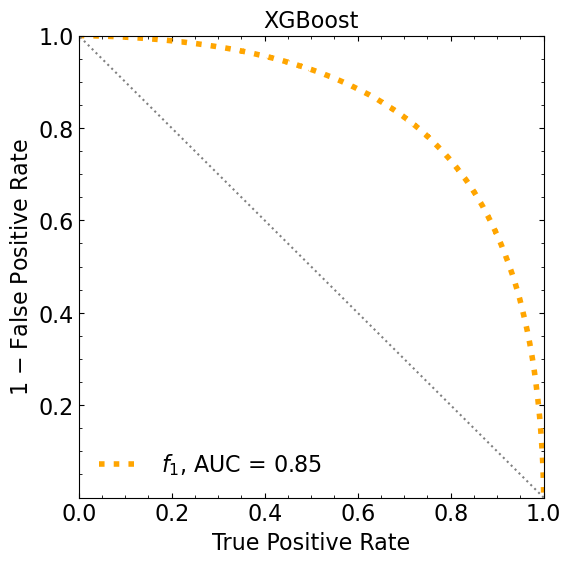

ML iteration  1
[0]	validation_0-logloss:0.67004	validation_1-logloss:0.67078
[1]	validation_0-logloss:0.65014	validation_1-logloss:0.65154


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63297	validation_1-logloss:0.63501
[3]	validation_0-logloss:0.61781	validation_1-logloss:0.62051
[4]	validation_0-logloss:0.60446	validation_1-logloss:0.60783
[5]	validation_0-logloss:0.59289	validation_1-logloss:0.59680
[6]	validation_0-logloss:0.58251	validation_1-logloss:0.58706
[7]	validation_0-logloss:0.57312	validation_1-logloss:0.57823
[8]	validation_0-logloss:0.56466	validation_1-logloss:0.57026
[9]	validation_0-logloss:0.55716	validation_1-logloss:0.56324
[10]	validation_0-logloss:0.55038	validation_1-logloss:0.55688
[11]	validation_0-logloss:0.54422	validation_1-logloss:0.55117
[12]	validation_0-logloss:0.53867	validation_1-logloss:0.54606
[13]	validation_0-logloss:0.53347	validation_1-logloss:0.54129
[14]	validation_0-logloss:0.52882	validation_1-logloss:0.53703
[15]	validation_0-logloss:0.52459	validation_1-logloss:0.53310
[16]	validation_0-logloss:0.52060	validation_1-logloss:0.52948
[17]	validation_0-logloss:0.51700	validation_1-logloss:0.52619


[132]	validation_0-logloss:0.45895	validation_1-logloss:0.48403
[133]	validation_0-logloss:0.45891	validation_1-logloss:0.48403
[134]	validation_0-logloss:0.45887	validation_1-logloss:0.48404
[135]	validation_0-logloss:0.45882	validation_1-logloss:0.48404
[136]	validation_0-logloss:0.45876	validation_1-logloss:0.48405
[137]	validation_0-logloss:0.45868	validation_1-logloss:0.48405
[138]	validation_0-logloss:0.45863	validation_1-logloss:0.48405
[139]	validation_0-logloss:0.45857	validation_1-logloss:0.48405
[140]	validation_0-logloss:0.45855	validation_1-logloss:0.48405
[141]	validation_0-logloss:0.45845	validation_1-logloss:0.48406
[142]	validation_0-logloss:0.45837	validation_1-logloss:0.48406
[143]	validation_0-logloss:0.45827	validation_1-logloss:0.48405
[144]	validation_0-logloss:0.45818	validation_1-logloss:0.48406
[145]	validation_0-logloss:0.45817	validation_1-logloss:0.48406
[146]	validation_0-logloss:0.45807	validation_1-logloss:0.48407
[147]	validation_0-logloss:0.45798	valid

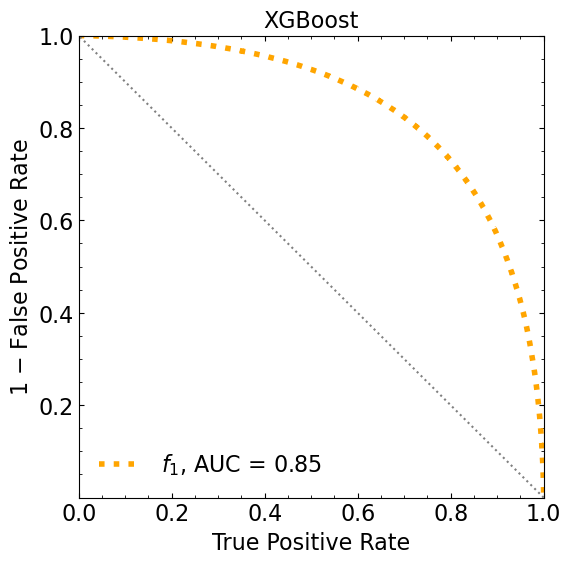

ML iteration  2
[0]	validation_0-logloss:0.67016	validation_1-logloss:0.67077
[1]	validation_0-logloss:0.65038	validation_1-logloss:0.65163


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63336	validation_1-logloss:0.63529
[3]	validation_0-logloss:0.61857	validation_1-logloss:0.62095
[4]	validation_0-logloss:0.60552	validation_1-logloss:0.60844
[5]	validation_0-logloss:0.59387	validation_1-logloss:0.59734
[6]	validation_0-logloss:0.58371	validation_1-logloss:0.58756
[7]	validation_0-logloss:0.57460	validation_1-logloss:0.57883
[8]	validation_0-logloss:0.56631	validation_1-logloss:0.57100
[9]	validation_0-logloss:0.55891	validation_1-logloss:0.56400
[10]	validation_0-logloss:0.55222	validation_1-logloss:0.55757
[11]	validation_0-logloss:0.54613	validation_1-logloss:0.55188
[12]	validation_0-logloss:0.54057	validation_1-logloss:0.54665
[13]	validation_0-logloss:0.53547	validation_1-logloss:0.54188
[14]	validation_0-logloss:0.53091	validation_1-logloss:0.53762
[15]	validation_0-logloss:0.52666	validation_1-logloss:0.53366
[16]	validation_0-logloss:0.52277	validation_1-logloss:0.53012
[17]	validation_0-logloss:0.51915	validation_1-logloss:0.52677


[132]	validation_0-logloss:0.46146	validation_1-logloss:0.48408
[133]	validation_0-logloss:0.46140	validation_1-logloss:0.48408
[134]	validation_0-logloss:0.46136	validation_1-logloss:0.48409
[135]	validation_0-logloss:0.46130	validation_1-logloss:0.48409
[136]	validation_0-logloss:0.46127	validation_1-logloss:0.48409
[137]	validation_0-logloss:0.46118	validation_1-logloss:0.48409
[138]	validation_0-logloss:0.46116	validation_1-logloss:0.48409
[139]	validation_0-logloss:0.46102	validation_1-logloss:0.48410
[140]	validation_0-logloss:0.46098	validation_1-logloss:0.48410
[141]	validation_0-logloss:0.46088	validation_1-logloss:0.48411
[142]	validation_0-logloss:0.46085	validation_1-logloss:0.48412
[143]	validation_0-logloss:0.46080	validation_1-logloss:0.48412
[144]	validation_0-logloss:0.46067	validation_1-logloss:0.48413
[145]	validation_0-logloss:0.46056	validation_1-logloss:0.48413
[146]	validation_0-logloss:0.46052	validation_1-logloss:0.48413
[147]	validation_0-logloss:0.46045	valid

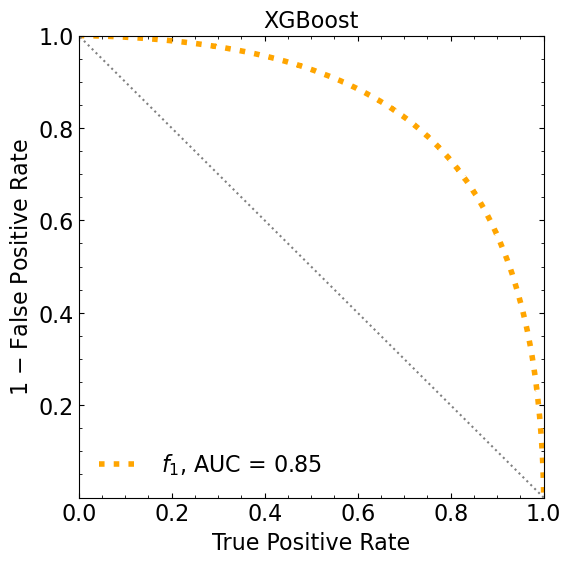

ML iteration  3
[0]	validation_0-logloss:0.66999	validation_1-logloss:0.67070


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.65016	validation_1-logloss:0.65172
[2]	validation_0-logloss:0.63303	validation_1-logloss:0.63521
[3]	validation_0-logloss:0.61802	validation_1-logloss:0.62082
[4]	validation_0-logloss:0.60476	validation_1-logloss:0.60815
[5]	validation_0-logloss:0.59327	validation_1-logloss:0.59712
[6]	validation_0-logloss:0.58286	validation_1-logloss:0.58733
[7]	validation_0-logloss:0.57356	validation_1-logloss:0.57863
[8]	validation_0-logloss:0.56500	validation_1-logloss:0.57065
[9]	validation_0-logloss:0.55746	validation_1-logloss:0.56352
[10]	validation_0-logloss:0.55061	validation_1-logloss:0.55709
[11]	validation_0-logloss:0.54444	validation_1-logloss:0.55138
[12]	validation_0-logloss:0.53871	validation_1-logloss:0.54611
[13]	validation_0-logloss:0.53353	validation_1-logloss:0.54130
[14]	validation_0-logloss:0.52880	validation_1-logloss:0.53702
[15]	validation_0-logloss:0.52451	validation_1-logloss:0.53306
[16]	validation_0-logloss:0.52056	validation_1-logloss:0.52956
[

[131]	validation_0-logloss:0.45749	validation_1-logloss:0.48380
[132]	validation_0-logloss:0.45737	validation_1-logloss:0.48380
[133]	validation_0-logloss:0.45734	validation_1-logloss:0.48380
[134]	validation_0-logloss:0.45726	validation_1-logloss:0.48381
[135]	validation_0-logloss:0.45716	validation_1-logloss:0.48382
[136]	validation_0-logloss:0.45702	validation_1-logloss:0.48384
[137]	validation_0-logloss:0.45699	validation_1-logloss:0.48384
[138]	validation_0-logloss:0.45697	validation_1-logloss:0.48385
[139]	validation_0-logloss:0.45690	validation_1-logloss:0.48386
[140]	validation_0-logloss:0.45686	validation_1-logloss:0.48385
[141]	validation_0-logloss:0.45678	validation_1-logloss:0.48386
[142]	validation_0-logloss:0.45674	validation_1-logloss:0.48386
[143]	validation_0-logloss:0.45665	validation_1-logloss:0.48388
[144]	validation_0-logloss:0.45661	validation_1-logloss:0.48388
[145]	validation_0-logloss:0.45654	validation_1-logloss:0.48388
[146]	validation_0-logloss:0.45649	valid

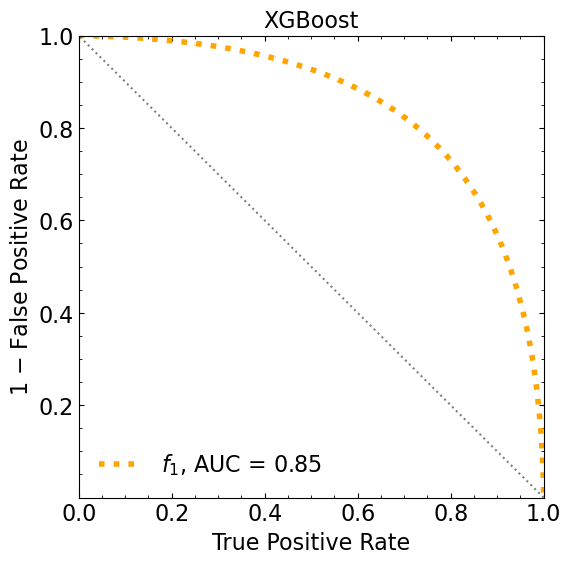

ML iteration  4
[0]	validation_0-logloss:0.66986	validation_1-logloss:0.67073
[1]	validation_0-logloss:0.65005	validation_1-logloss:0.65166


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63281	validation_1-logloss:0.63507
[3]	validation_0-logloss:0.61784	validation_1-logloss:0.62075
[4]	validation_0-logloss:0.60476	validation_1-logloss:0.60819
[5]	validation_0-logloss:0.59315	validation_1-logloss:0.59712
[6]	validation_0-logloss:0.58284	validation_1-logloss:0.58726
[7]	validation_0-logloss:0.57364	validation_1-logloss:0.57859
[8]	validation_0-logloss:0.56533	validation_1-logloss:0.57077
[9]	validation_0-logloss:0.55793	validation_1-logloss:0.56377
[10]	validation_0-logloss:0.55121	validation_1-logloss:0.55745
[11]	validation_0-logloss:0.54511	validation_1-logloss:0.55176
[12]	validation_0-logloss:0.53954	validation_1-logloss:0.54654
[13]	validation_0-logloss:0.53450	validation_1-logloss:0.54181
[14]	validation_0-logloss:0.52983	validation_1-logloss:0.53752
[15]	validation_0-logloss:0.52558	validation_1-logloss:0.53351
[16]	validation_0-logloss:0.52166	validation_1-logloss:0.52990
[17]	validation_0-logloss:0.51808	validation_1-logloss:0.52665


[132]	validation_0-logloss:0.45947	validation_1-logloss:0.48404
[133]	validation_0-logloss:0.45940	validation_1-logloss:0.48405
[134]	validation_0-logloss:0.45934	validation_1-logloss:0.48405
[135]	validation_0-logloss:0.45926	validation_1-logloss:0.48405
[136]	validation_0-logloss:0.45915	validation_1-logloss:0.48406
[137]	validation_0-logloss:0.45907	validation_1-logloss:0.48406
[138]	validation_0-logloss:0.45901	validation_1-logloss:0.48407
[139]	validation_0-logloss:0.45887	validation_1-logloss:0.48408
[140]	validation_0-logloss:0.45883	validation_1-logloss:0.48409
[141]	validation_0-logloss:0.45871	validation_1-logloss:0.48410
[142]	validation_0-logloss:0.45869	validation_1-logloss:0.48410
[143]	validation_0-logloss:0.45865	validation_1-logloss:0.48411
[144]	validation_0-logloss:0.45861	validation_1-logloss:0.48411
[145]	validation_0-logloss:0.45853	validation_1-logloss:0.48412
[146]	validation_0-logloss:0.45848	validation_1-logloss:0.48412
[147]	validation_0-logloss:0.45846	valid

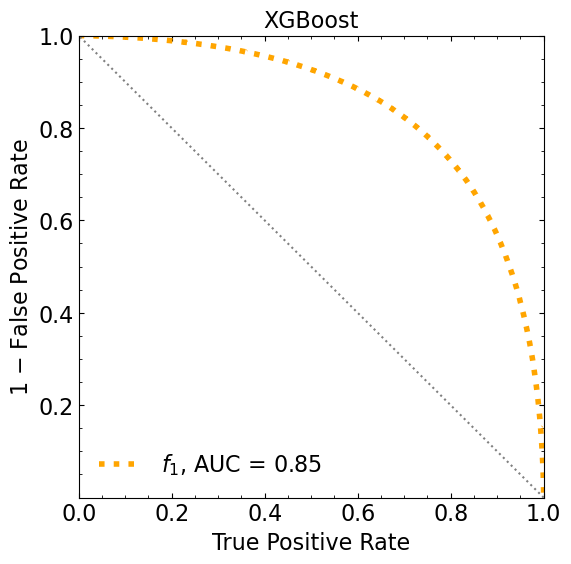

ML iteration  5
[0]	validation_0-logloss:0.67021	validation_1-logloss:0.67089
[1]	validation_0-logloss:0.65056	validation_1-logloss:0.65181


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63379	validation_1-logloss:0.63551
[3]	validation_0-logloss:0.61901	validation_1-logloss:0.62131
[4]	validation_0-logloss:0.60597	validation_1-logloss:0.60864
[5]	validation_0-logloss:0.59446	validation_1-logloss:0.59758
[6]	validation_0-logloss:0.58424	validation_1-logloss:0.58774
[7]	validation_0-logloss:0.57502	validation_1-logloss:0.57893
[8]	validation_0-logloss:0.56678	validation_1-logloss:0.57106
[9]	validation_0-logloss:0.55942	validation_1-logloss:0.56399
[10]	validation_0-logloss:0.55271	validation_1-logloss:0.55770
[11]	validation_0-logloss:0.54669	validation_1-logloss:0.55200
[12]	validation_0-logloss:0.54126	validation_1-logloss:0.54688
[13]	validation_0-logloss:0.53621	validation_1-logloss:0.54216
[14]	validation_0-logloss:0.53156	validation_1-logloss:0.53782
[15]	validation_0-logloss:0.52728	validation_1-logloss:0.53388
[16]	validation_0-logloss:0.52346	validation_1-logloss:0.53033
[17]	validation_0-logloss:0.51986	validation_1-logloss:0.52701


[132]	validation_0-logloss:0.46125	validation_1-logloss:0.48414
[133]	validation_0-logloss:0.46116	validation_1-logloss:0.48414
[134]	validation_0-logloss:0.46109	validation_1-logloss:0.48414
[135]	validation_0-logloss:0.46104	validation_1-logloss:0.48414
[136]	validation_0-logloss:0.46099	validation_1-logloss:0.48415
[137]	validation_0-logloss:0.46086	validation_1-logloss:0.48417
[138]	validation_0-logloss:0.46078	validation_1-logloss:0.48418
[139]	validation_0-logloss:0.46075	validation_1-logloss:0.48418
[140]	validation_0-logloss:0.46062	validation_1-logloss:0.48418
[141]	validation_0-logloss:0.46057	validation_1-logloss:0.48419
[142]	validation_0-logloss:0.46045	validation_1-logloss:0.48419
[143]	validation_0-logloss:0.46042	validation_1-logloss:0.48419
[144]	validation_0-logloss:0.46033	validation_1-logloss:0.48420
[145]	validation_0-logloss:0.46026	validation_1-logloss:0.48420
[146]	validation_0-logloss:0.46023	validation_1-logloss:0.48420
[147]	validation_0-logloss:0.46009	valid

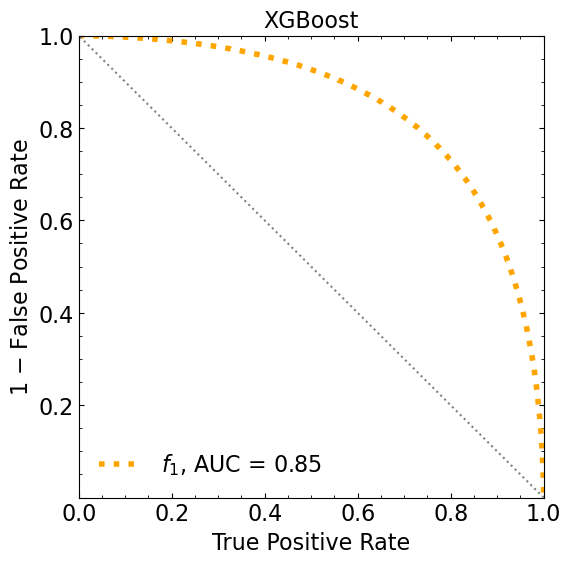

ML iteration  6
[0]	validation_0-logloss:0.66980	validation_1-logloss:0.67069
[1]	validation_0-logloss:0.64998	validation_1-logloss:0.65157


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63280	validation_1-logloss:0.63501
[3]	validation_0-logloss:0.61791	validation_1-logloss:0.62078
[4]	validation_0-logloss:0.60457	validation_1-logloss:0.60802
[5]	validation_0-logloss:0.59299	validation_1-logloss:0.59699
[6]	validation_0-logloss:0.58269	validation_1-logloss:0.58716
[7]	validation_0-logloss:0.57337	validation_1-logloss:0.57833
[8]	validation_0-logloss:0.56506	validation_1-logloss:0.57044
[9]	validation_0-logloss:0.55757	validation_1-logloss:0.56344
[10]	validation_0-logloss:0.55072	validation_1-logloss:0.55701
[11]	validation_0-logloss:0.54453	validation_1-logloss:0.55126
[12]	validation_0-logloss:0.53897	validation_1-logloss:0.54609
[13]	validation_0-logloss:0.53385	validation_1-logloss:0.54139
[14]	validation_0-logloss:0.52909	validation_1-logloss:0.53703
[15]	validation_0-logloss:0.52470	validation_1-logloss:0.53299
[16]	validation_0-logloss:0.52070	validation_1-logloss:0.52936
[17]	validation_0-logloss:0.51705	validation_1-logloss:0.52612


[132]	validation_0-logloss:0.45779	validation_1-logloss:0.48403
[133]	validation_0-logloss:0.45768	validation_1-logloss:0.48405
[134]	validation_0-logloss:0.45757	validation_1-logloss:0.48406
[135]	validation_0-logloss:0.45749	validation_1-logloss:0.48406
[136]	validation_0-logloss:0.45746	validation_1-logloss:0.48407
[137]	validation_0-logloss:0.45741	validation_1-logloss:0.48407
[138]	validation_0-logloss:0.45734	validation_1-logloss:0.48407
[139]	validation_0-logloss:0.45721	validation_1-logloss:0.48410
[140]	validation_0-logloss:0.45712	validation_1-logloss:0.48410
[141]	validation_0-logloss:0.45703	validation_1-logloss:0.48410
[142]	validation_0-logloss:0.45690	validation_1-logloss:0.48411
[143]	validation_0-logloss:0.45688	validation_1-logloss:0.48411
[144]	validation_0-logloss:0.45682	validation_1-logloss:0.48412
[145]	validation_0-logloss:0.45676	validation_1-logloss:0.48412
[146]	validation_0-logloss:0.45671	validation_1-logloss:0.48413
[147]	validation_0-logloss:0.45662	valid

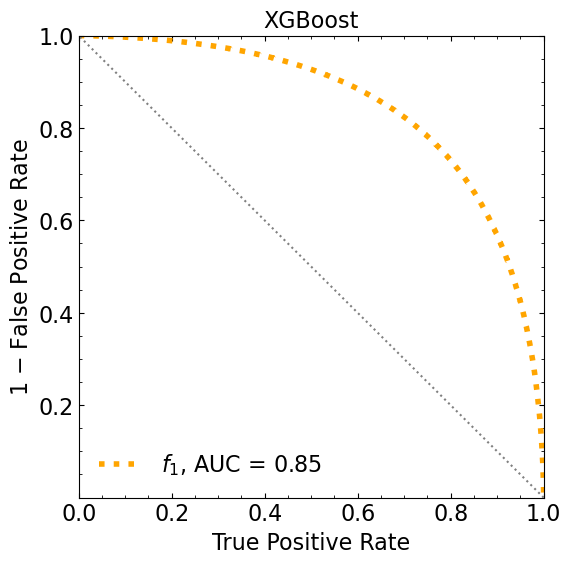

ML iteration  7
[0]	validation_0-logloss:0.67006	validation_1-logloss:0.67081
[1]	validation_0-logloss:0.65044	validation_1-logloss:0.65176


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63348	validation_1-logloss:0.63534
[3]	validation_0-logloss:0.61861	validation_1-logloss:0.62102
[4]	validation_0-logloss:0.60553	validation_1-logloss:0.60850
[5]	validation_0-logloss:0.59393	validation_1-logloss:0.59735
[6]	validation_0-logloss:0.58356	validation_1-logloss:0.58750
[7]	validation_0-logloss:0.57434	validation_1-logloss:0.57872
[8]	validation_0-logloss:0.56607	validation_1-logloss:0.57084
[9]	validation_0-logloss:0.55865	validation_1-logloss:0.56381
[10]	validation_0-logloss:0.55193	validation_1-logloss:0.55748
[11]	validation_0-logloss:0.54580	validation_1-logloss:0.55171
[12]	validation_0-logloss:0.54020	validation_1-logloss:0.54651
[13]	validation_0-logloss:0.53510	validation_1-logloss:0.54177
[14]	validation_0-logloss:0.53046	validation_1-logloss:0.53749
[15]	validation_0-logloss:0.52623	validation_1-logloss:0.53358
[16]	validation_0-logloss:0.52229	validation_1-logloss:0.52995
[17]	validation_0-logloss:0.51876	validation_1-logloss:0.52664


[132]	validation_0-logloss:0.46004	validation_1-logloss:0.48400
[133]	validation_0-logloss:0.45999	validation_1-logloss:0.48401
[134]	validation_0-logloss:0.45989	validation_1-logloss:0.48402
[135]	validation_0-logloss:0.45982	validation_1-logloss:0.48402
[136]	validation_0-logloss:0.45976	validation_1-logloss:0.48403
[137]	validation_0-logloss:0.45971	validation_1-logloss:0.48403
[138]	validation_0-logloss:0.45964	validation_1-logloss:0.48404
[139]	validation_0-logloss:0.45956	validation_1-logloss:0.48404
[140]	validation_0-logloss:0.45945	validation_1-logloss:0.48405
[141]	validation_0-logloss:0.45938	validation_1-logloss:0.48406
[142]	validation_0-logloss:0.45927	validation_1-logloss:0.48406
[143]	validation_0-logloss:0.45913	validation_1-logloss:0.48406
[144]	validation_0-logloss:0.45901	validation_1-logloss:0.48407
[145]	validation_0-logloss:0.45890	validation_1-logloss:0.48408
[146]	validation_0-logloss:0.45885	validation_1-logloss:0.48409
[147]	validation_0-logloss:0.45881	valid

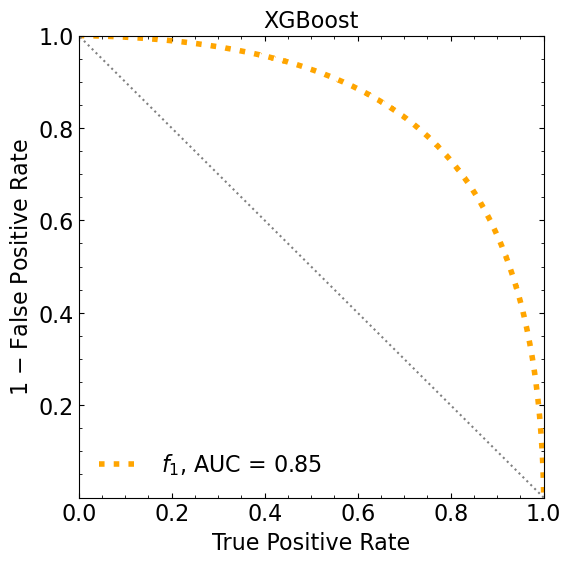

ML iteration  8
[0]	validation_0-logloss:0.66984	validation_1-logloss:0.67069


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64989	validation_1-logloss:0.65154
[2]	validation_0-logloss:0.63276	validation_1-logloss:0.63496
[3]	validation_0-logloss:0.61767	validation_1-logloss:0.62059
[4]	validation_0-logloss:0.60435	validation_1-logloss:0.60782
[5]	validation_0-logloss:0.59267	validation_1-logloss:0.59663
[6]	validation_0-logloss:0.58236	validation_1-logloss:0.58683
[7]	validation_0-logloss:0.57296	validation_1-logloss:0.57799
[8]	validation_0-logloss:0.56461	validation_1-logloss:0.57010
[9]	validation_0-logloss:0.55713	validation_1-logloss:0.56308
[10]	validation_0-logloss:0.55037	validation_1-logloss:0.55678
[11]	validation_0-logloss:0.54424	validation_1-logloss:0.55108
[12]	validation_0-logloss:0.53855	validation_1-logloss:0.54584
[13]	validation_0-logloss:0.53343	validation_1-logloss:0.54113
[14]	validation_0-logloss:0.52878	validation_1-logloss:0.53686
[15]	validation_0-logloss:0.52454	validation_1-logloss:0.53296
[16]	validation_0-logloss:0.52053	validation_1-logloss:0.52938
[

[131]	validation_0-logloss:0.45795	validation_1-logloss:0.48367
[132]	validation_0-logloss:0.45792	validation_1-logloss:0.48367
[133]	validation_0-logloss:0.45790	validation_1-logloss:0.48367
[134]	validation_0-logloss:0.45783	validation_1-logloss:0.48367
[135]	validation_0-logloss:0.45776	validation_1-logloss:0.48368
[136]	validation_0-logloss:0.45766	validation_1-logloss:0.48368
[137]	validation_0-logloss:0.45759	validation_1-logloss:0.48369
[138]	validation_0-logloss:0.45754	validation_1-logloss:0.48369
[139]	validation_0-logloss:0.45747	validation_1-logloss:0.48370
[140]	validation_0-logloss:0.45744	validation_1-logloss:0.48370
[141]	validation_0-logloss:0.45739	validation_1-logloss:0.48370
[142]	validation_0-logloss:0.45731	validation_1-logloss:0.48370
[143]	validation_0-logloss:0.45719	validation_1-logloss:0.48370
[144]	validation_0-logloss:0.45714	validation_1-logloss:0.48371
[145]	validation_0-logloss:0.45713	validation_1-logloss:0.48371
[146]	validation_0-logloss:0.45707	valid

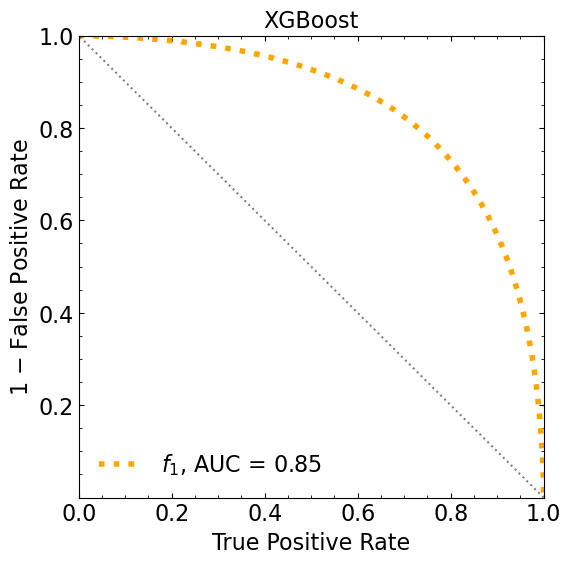

ML iteration  9
[0]	validation_0-logloss:0.67005	validation_1-logloss:0.67075
[1]	validation_0-logloss:0.65023	validation_1-logloss:0.65156


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.63310	validation_1-logloss:0.63511
[3]	validation_0-logloss:0.61811	validation_1-logloss:0.62076
[4]	validation_0-logloss:0.60490	validation_1-logloss:0.60810
[5]	validation_0-logloss:0.59320	validation_1-logloss:0.59692
[6]	validation_0-logloss:0.58284	validation_1-logloss:0.58709
[7]	validation_0-logloss:0.57356	validation_1-logloss:0.57828
[8]	validation_0-logloss:0.56518	validation_1-logloss:0.57035
[9]	validation_0-logloss:0.55770	validation_1-logloss:0.56332
[10]	validation_0-logloss:0.55082	validation_1-logloss:0.55692
[11]	validation_0-logloss:0.54465	validation_1-logloss:0.55121
[12]	validation_0-logloss:0.53906	validation_1-logloss:0.54596
[13]	validation_0-logloss:0.53400	validation_1-logloss:0.54134
[14]	validation_0-logloss:0.52937	validation_1-logloss:0.53703
[15]	validation_0-logloss:0.52505	validation_1-logloss:0.53305
[16]	validation_0-logloss:0.52113	validation_1-logloss:0.52950
[17]	validation_0-logloss:0.51753	validation_1-logloss:0.52623


[132]	validation_0-logloss:0.45861	validation_1-logloss:0.48373
[133]	validation_0-logloss:0.45850	validation_1-logloss:0.48373
[134]	validation_0-logloss:0.45841	validation_1-logloss:0.48373
[135]	validation_0-logloss:0.45834	validation_1-logloss:0.48374
[136]	validation_0-logloss:0.45820	validation_1-logloss:0.48375
[137]	validation_0-logloss:0.45817	validation_1-logloss:0.48375
[138]	validation_0-logloss:0.45816	validation_1-logloss:0.48376
[139]	validation_0-logloss:0.45809	validation_1-logloss:0.48376
[140]	validation_0-logloss:0.45798	validation_1-logloss:0.48377
[141]	validation_0-logloss:0.45793	validation_1-logloss:0.48378
[142]	validation_0-logloss:0.45784	validation_1-logloss:0.48379
[143]	validation_0-logloss:0.45775	validation_1-logloss:0.48380
[144]	validation_0-logloss:0.45769	validation_1-logloss:0.48380
[145]	validation_0-logloss:0.45758	validation_1-logloss:0.48381
[146]	validation_0-logloss:0.45757	validation_1-logloss:0.48381
[147]	validation_0-logloss:0.45751	valid

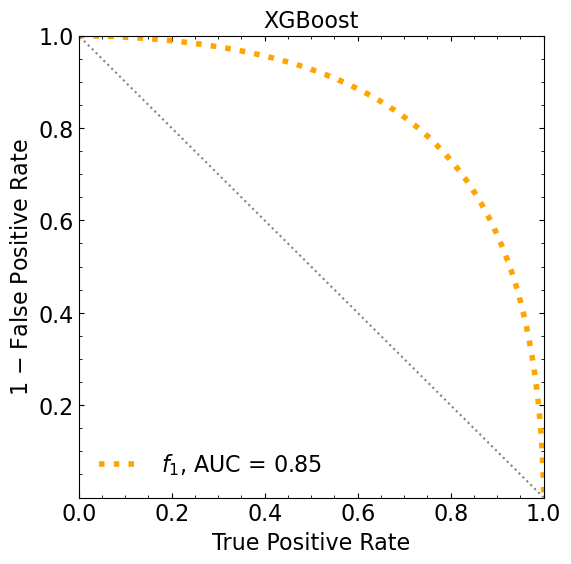

Classification score (1 ML):


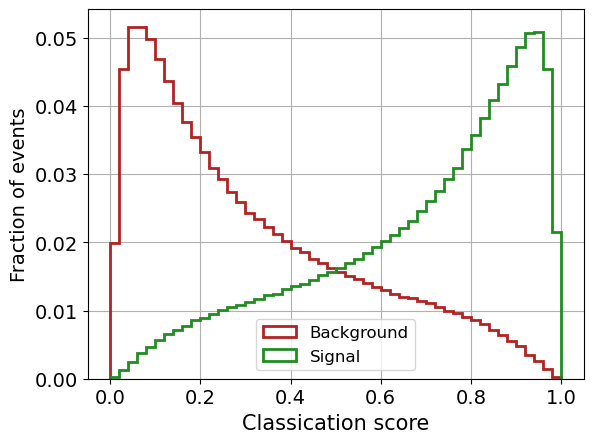

Classification score (10 ML):


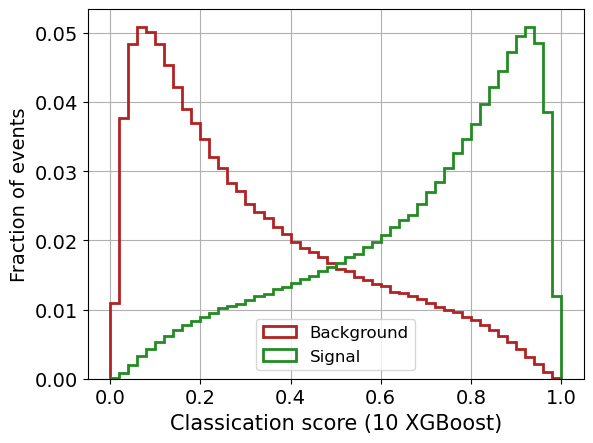

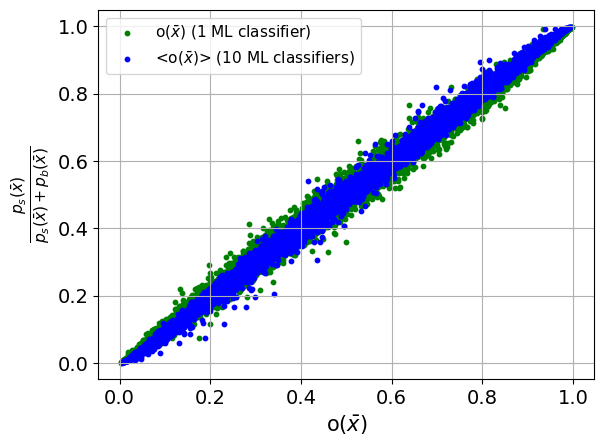


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [29]:
dim=6

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)




print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


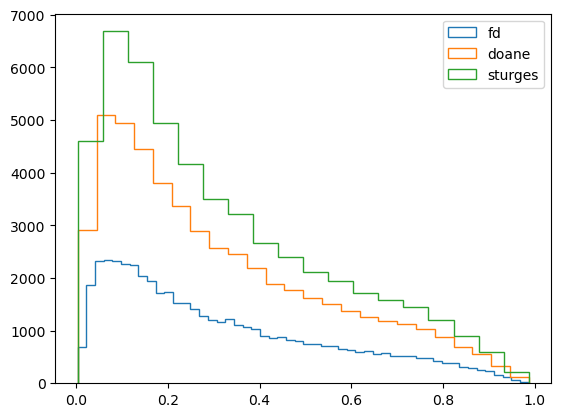

fd 52
doane 24
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  52


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  24
doing Nbin:  18


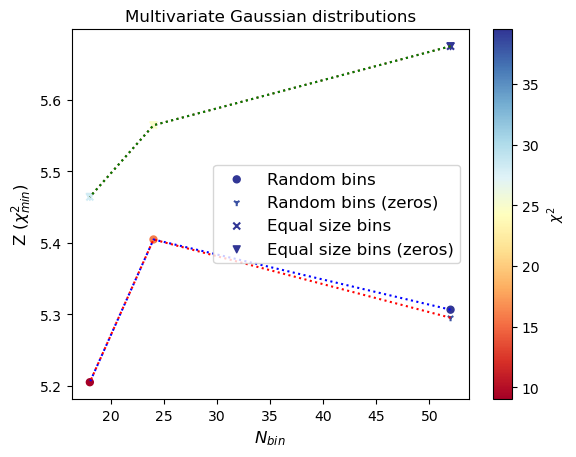

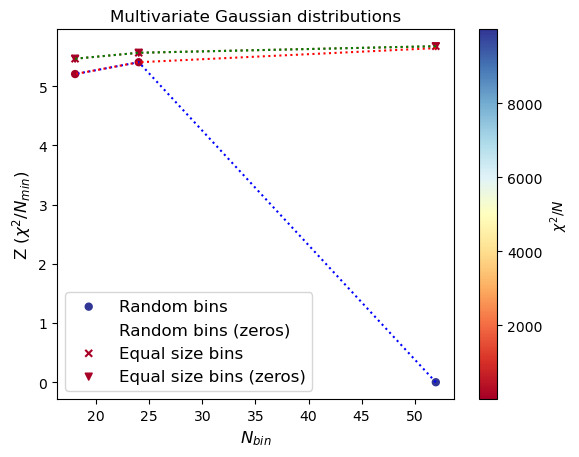

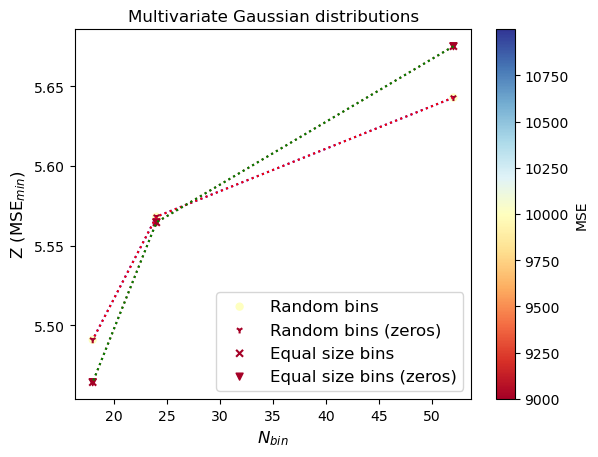

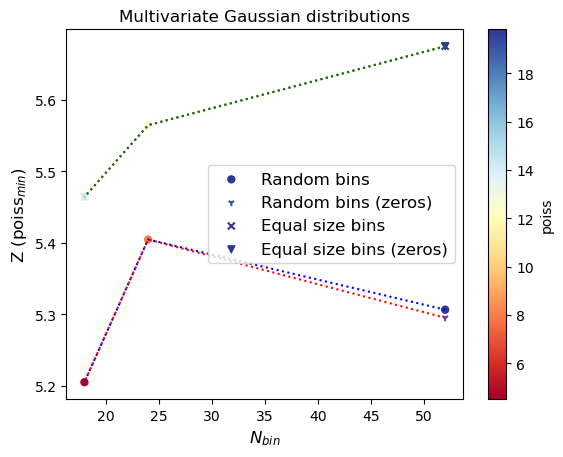

In [30]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 7)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 7)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 7)
y_gauss_test :  (2000000, 1)



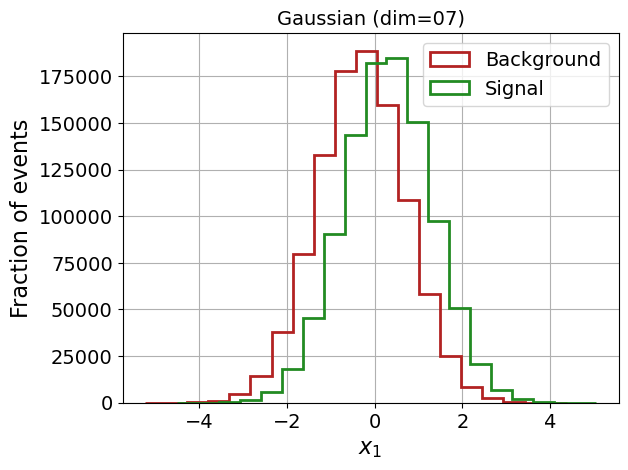

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67090	validation_1-logloss:0.67105
[1]	validation_0-logloss:0.65134	validation_1-logloss:0.65155
[2]	validation_0-logloss:0.63431	validation_1-logloss:0.63458
[3]	validation_0-logloss:0.61937	validation_1-logloss:0.61970
[4]	validation_0-logloss:0.60597	validation_1-logloss:0.60638
[5]	validation_0-logloss:0.59405	validation_1-logloss:0.59455
[6]	validation_0-logloss:0.58327	validation_1-logloss:0.58384
[7]	validation_0-logloss:0.57369	validation_1-logloss:0.57435
[8]	validation_0-logloss:0.56498	validation_1-logloss:0.56568
[9]	validation_0-logloss:0.55704	validation_1-logloss:0.55778
[10]	validation_0-logloss:0.54978	validation_1-logloss:0.55057
[11]	validation_0-logloss:0.54329	validation_1-logloss:0.54413
[12]	validation_0-logloss:0.53729	validation_1-logloss:0.53817
[13]	validation_0-logloss:0.53176	validation_1-logloss:0.53272
[14]	validation_0-logloss:0.52665	validation_1-logloss:0.52765
[15]	validation_0-logloss:0.52200	validation_1-logloss:0.52303
[1

[130]	validation_0-logloss:0.45040	validation_1-logloss:0.45301
[131]	validation_0-logloss:0.45038	validation_1-logloss:0.45300
[132]	validation_0-logloss:0.45036	validation_1-logloss:0.45299
[133]	validation_0-logloss:0.45035	validation_1-logloss:0.45298
[134]	validation_0-logloss:0.45033	validation_1-logloss:0.45297
[135]	validation_0-logloss:0.45031	validation_1-logloss:0.45296
[136]	validation_0-logloss:0.45030	validation_1-logloss:0.45296
[137]	validation_0-logloss:0.45028	validation_1-logloss:0.45295
[138]	validation_0-logloss:0.45027	validation_1-logloss:0.45294
[139]	validation_0-logloss:0.45026	validation_1-logloss:0.45294
[140]	validation_0-logloss:0.45024	validation_1-logloss:0.45293
[141]	validation_0-logloss:0.45022	validation_1-logloss:0.45292
[142]	validation_0-logloss:0.45021	validation_1-logloss:0.45291
[143]	validation_0-logloss:0.45019	validation_1-logloss:0.45290
[144]	validation_0-logloss:0.45018	validation_1-logloss:0.45290
[145]	validation_0-logloss:0.45017	valid

[259]	validation_0-logloss:0.44932	validation_1-logloss:0.45280
[260]	validation_0-logloss:0.44932	validation_1-logloss:0.45280
[261]	validation_0-logloss:0.44931	validation_1-logloss:0.45280
[262]	validation_0-logloss:0.44931	validation_1-logloss:0.45280
[263]	validation_0-logloss:0.44930	validation_1-logloss:0.45280
[264]	validation_0-logloss:0.44930	validation_1-logloss:0.45280
[265]	validation_0-logloss:0.44930	validation_1-logloss:0.45280
[266]	validation_0-logloss:0.44929	validation_1-logloss:0.45280
[267]	validation_0-logloss:0.44929	validation_1-logloss:0.45280
[268]	validation_0-logloss:0.44928	validation_1-logloss:0.45280
[269]	validation_0-logloss:0.44928	validation_1-logloss:0.45280
[270]	validation_0-logloss:0.44927	validation_1-logloss:0.45280
[271]	validation_0-logloss:0.44927	validation_1-logloss:0.45280
[272]	validation_0-logloss:0.44926	validation_1-logloss:0.45280
[273]	validation_0-logloss:0.44926	validation_1-logloss:0.45280
[274]	validation_0-logloss:0.44925	valid

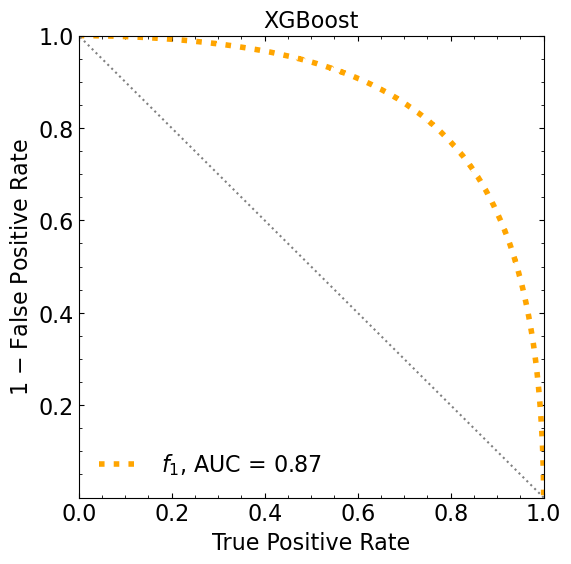

ML iteration 0
[0]	validation_0-logloss:0.66952	validation_1-logloss:0.67055


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64888	validation_1-logloss:0.65081
[2]	validation_0-logloss:0.63078	validation_1-logloss:0.63359
[3]	validation_0-logloss:0.61487	validation_1-logloss:0.61850
[4]	validation_0-logloss:0.60062	validation_1-logloss:0.60498
[5]	validation_0-logloss:0.58802	validation_1-logloss:0.59296
[6]	validation_0-logloss:0.57670	validation_1-logloss:0.58224
[7]	validation_0-logloss:0.56650	validation_1-logloss:0.57265
[8]	validation_0-logloss:0.55722	validation_1-logloss:0.56399
[9]	validation_0-logloss:0.54874	validation_1-logloss:0.55599
[10]	validation_0-logloss:0.54102	validation_1-logloss:0.54884
[11]	validation_0-logloss:0.53400	validation_1-logloss:0.54227
[12]	validation_0-logloss:0.52762	validation_1-logloss:0.53639
[13]	validation_0-logloss:0.52176	validation_1-logloss:0.53096
[14]	validation_0-logloss:0.51624	validation_1-logloss:0.52586
[15]	validation_0-logloss:0.51126	validation_1-logloss:0.52135
[16]	validation_0-logloss:0.50662	validation_1-logloss:0.51710
[

[131]	validation_0-logloss:0.42789	validation_1-logloss:0.45619
[132]	validation_0-logloss:0.42783	validation_1-logloss:0.45618
[133]	validation_0-logloss:0.42774	validation_1-logloss:0.45618
[134]	validation_0-logloss:0.42764	validation_1-logloss:0.45618
[135]	validation_0-logloss:0.42755	validation_1-logloss:0.45618
[136]	validation_0-logloss:0.42749	validation_1-logloss:0.45617
[137]	validation_0-logloss:0.42741	validation_1-logloss:0.45616
[138]	validation_0-logloss:0.42736	validation_1-logloss:0.45616
[139]	validation_0-logloss:0.42730	validation_1-logloss:0.45617
[140]	validation_0-logloss:0.42723	validation_1-logloss:0.45617
[141]	validation_0-logloss:0.42710	validation_1-logloss:0.45618
[142]	validation_0-logloss:0.42708	validation_1-logloss:0.45618
[143]	validation_0-logloss:0.42703	validation_1-logloss:0.45619
[144]	validation_0-logloss:0.42697	validation_1-logloss:0.45619
[145]	validation_0-logloss:0.42689	validation_1-logloss:0.45620
[146]	validation_0-logloss:0.42678	valid

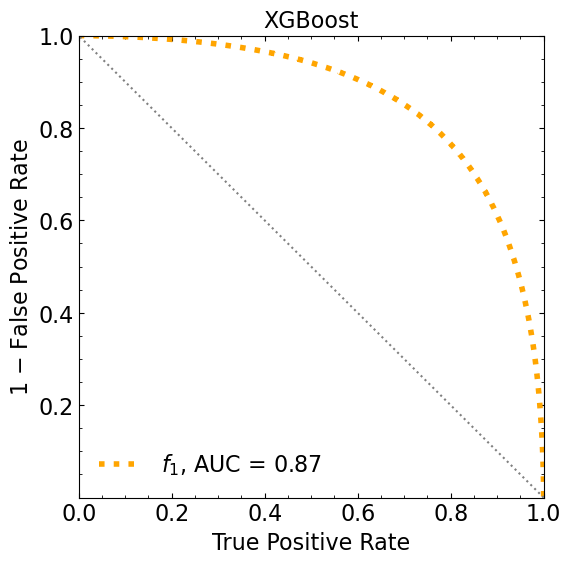

ML iteration  1
[0]	validation_0-logloss:0.66955	validation_1-logloss:0.67057


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64906	validation_1-logloss:0.65099
[2]	validation_0-logloss:0.63110	validation_1-logloss:0.63366
[3]	validation_0-logloss:0.61532	validation_1-logloss:0.61843
[4]	validation_0-logloss:0.60122	validation_1-logloss:0.60509
[5]	validation_0-logloss:0.58859	validation_1-logloss:0.59314
[6]	validation_0-logloss:0.57722	validation_1-logloss:0.58235
[7]	validation_0-logloss:0.56699	validation_1-logloss:0.57274
[8]	validation_0-logloss:0.55764	validation_1-logloss:0.56394
[9]	validation_0-logloss:0.54930	validation_1-logloss:0.55594
[10]	validation_0-logloss:0.54173	validation_1-logloss:0.54881
[11]	validation_0-logloss:0.53482	validation_1-logloss:0.54242
[12]	validation_0-logloss:0.52826	validation_1-logloss:0.53637
[13]	validation_0-logloss:0.52241	validation_1-logloss:0.53099
[14]	validation_0-logloss:0.51705	validation_1-logloss:0.52601
[15]	validation_0-logloss:0.51202	validation_1-logloss:0.52139
[16]	validation_0-logloss:0.50735	validation_1-logloss:0.51714
[

[131]	validation_0-logloss:0.42825	validation_1-logloss:0.45644
[132]	validation_0-logloss:0.42818	validation_1-logloss:0.45646
[133]	validation_0-logloss:0.42810	validation_1-logloss:0.45644
[134]	validation_0-logloss:0.42800	validation_1-logloss:0.45645
[135]	validation_0-logloss:0.42793	validation_1-logloss:0.45645
[136]	validation_0-logloss:0.42778	validation_1-logloss:0.45644
[137]	validation_0-logloss:0.42769	validation_1-logloss:0.45644
[138]	validation_0-logloss:0.42758	validation_1-logloss:0.45644
[139]	validation_0-logloss:0.42753	validation_1-logloss:0.45644
[140]	validation_0-logloss:0.42751	validation_1-logloss:0.45644
[141]	validation_0-logloss:0.42740	validation_1-logloss:0.45645
[142]	validation_0-logloss:0.42729	validation_1-logloss:0.45645
[143]	validation_0-logloss:0.42725	validation_1-logloss:0.45645
[144]	validation_0-logloss:0.42717	validation_1-logloss:0.45645
[145]	validation_0-logloss:0.42712	validation_1-logloss:0.45645
[146]	validation_0-logloss:0.42700	valid

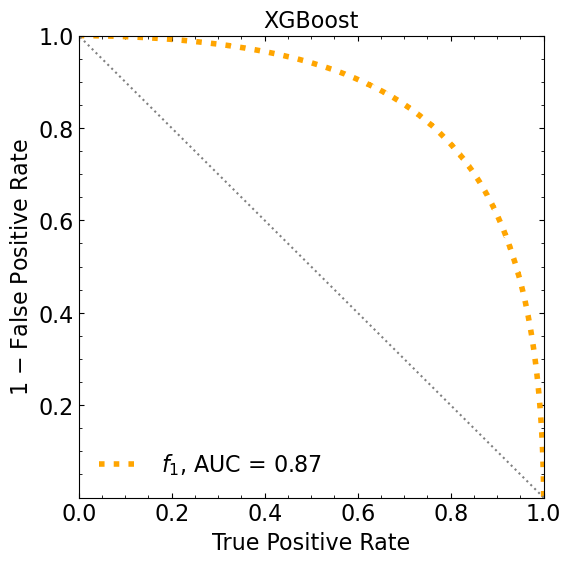

ML iteration  2
[0]	validation_0-logloss:0.66964	validation_1-logloss:0.67062


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64933	validation_1-logloss:0.65102
[2]	validation_0-logloss:0.63140	validation_1-logloss:0.63369
[3]	validation_0-logloss:0.61557	validation_1-logloss:0.61856
[4]	validation_0-logloss:0.60150	validation_1-logloss:0.60517
[5]	validation_0-logloss:0.58885	validation_1-logloss:0.59309
[6]	validation_0-logloss:0.57770	validation_1-logloss:0.58241
[7]	validation_0-logloss:0.56746	validation_1-logloss:0.57282
[8]	validation_0-logloss:0.55831	validation_1-logloss:0.56406
[9]	validation_0-logloss:0.54998	validation_1-logloss:0.55627
[10]	validation_0-logloss:0.54234	validation_1-logloss:0.54914
[11]	validation_0-logloss:0.53538	validation_1-logloss:0.54258
[12]	validation_0-logloss:0.52910	validation_1-logloss:0.53675
[13]	validation_0-logloss:0.52330	validation_1-logloss:0.53142
[14]	validation_0-logloss:0.51791	validation_1-logloss:0.52634
[15]	validation_0-logloss:0.51297	validation_1-logloss:0.52171
[16]	validation_0-logloss:0.50833	validation_1-logloss:0.51747
[

[131]	validation_0-logloss:0.42991	validation_1-logloss:0.45679
[132]	validation_0-logloss:0.42984	validation_1-logloss:0.45679
[133]	validation_0-logloss:0.42976	validation_1-logloss:0.45680
[134]	validation_0-logloss:0.42965	validation_1-logloss:0.45680
[135]	validation_0-logloss:0.42958	validation_1-logloss:0.45681
[136]	validation_0-logloss:0.42953	validation_1-logloss:0.45681
[137]	validation_0-logloss:0.42941	validation_1-logloss:0.45681
[138]	validation_0-logloss:0.42934	validation_1-logloss:0.45681
[139]	validation_0-logloss:0.42932	validation_1-logloss:0.45680
[140]	validation_0-logloss:0.42926	validation_1-logloss:0.45680
[141]	validation_0-logloss:0.42915	validation_1-logloss:0.45681
[142]	validation_0-logloss:0.42905	validation_1-logloss:0.45681
[143]	validation_0-logloss:0.42897	validation_1-logloss:0.45682
[144]	validation_0-logloss:0.42891	validation_1-logloss:0.45682
[145]	validation_0-logloss:0.42880	validation_1-logloss:0.45682
[146]	validation_0-logloss:0.42871	valid

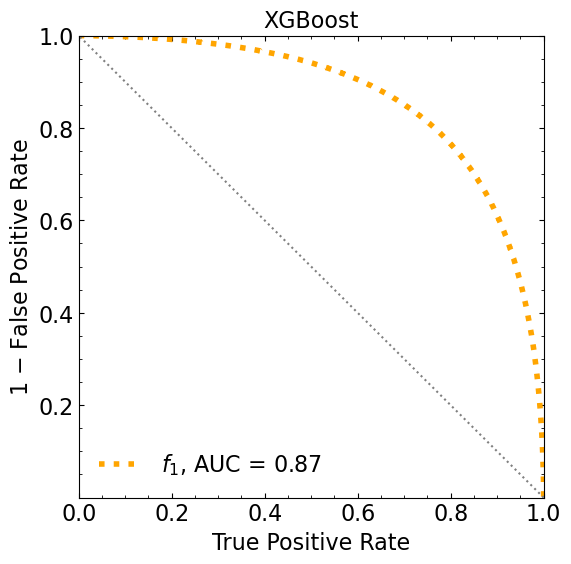

ML iteration  3
[0]	validation_0-logloss:0.66969	validation_1-logloss:0.67062


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64913	validation_1-logloss:0.65093
[2]	validation_0-logloss:0.63123	validation_1-logloss:0.63367
[3]	validation_0-logloss:0.61537	validation_1-logloss:0.61861
[4]	validation_0-logloss:0.60119	validation_1-logloss:0.60501
[5]	validation_0-logloss:0.58854	validation_1-logloss:0.59290
[6]	validation_0-logloss:0.57726	validation_1-logloss:0.58220
[7]	validation_0-logloss:0.56707	validation_1-logloss:0.57259
[8]	validation_0-logloss:0.55791	validation_1-logloss:0.56390
[9]	validation_0-logloss:0.54950	validation_1-logloss:0.55606
[10]	validation_0-logloss:0.54185	validation_1-logloss:0.54887
[11]	validation_0-logloss:0.53483	validation_1-logloss:0.54227
[12]	validation_0-logloss:0.52839	validation_1-logloss:0.53644
[13]	validation_0-logloss:0.52256	validation_1-logloss:0.53104
[14]	validation_0-logloss:0.51718	validation_1-logloss:0.52605
[15]	validation_0-logloss:0.51218	validation_1-logloss:0.52144
[16]	validation_0-logloss:0.50763	validation_1-logloss:0.51718
[

[131]	validation_0-logloss:0.42897	validation_1-logloss:0.45628
[132]	validation_0-logloss:0.42891	validation_1-logloss:0.45628
[133]	validation_0-logloss:0.42882	validation_1-logloss:0.45629
[134]	validation_0-logloss:0.42876	validation_1-logloss:0.45629
[135]	validation_0-logloss:0.42864	validation_1-logloss:0.45629
[136]	validation_0-logloss:0.42851	validation_1-logloss:0.45629
[137]	validation_0-logloss:0.42846	validation_1-logloss:0.45628
[138]	validation_0-logloss:0.42835	validation_1-logloss:0.45629
[139]	validation_0-logloss:0.42826	validation_1-logloss:0.45629
[140]	validation_0-logloss:0.42816	validation_1-logloss:0.45629
[141]	validation_0-logloss:0.42809	validation_1-logloss:0.45630
[142]	validation_0-logloss:0.42806	validation_1-logloss:0.45629
[143]	validation_0-logloss:0.42800	validation_1-logloss:0.45630
[144]	validation_0-logloss:0.42795	validation_1-logloss:0.45630
[145]	validation_0-logloss:0.42788	validation_1-logloss:0.45630
[146]	validation_0-logloss:0.42776	valid

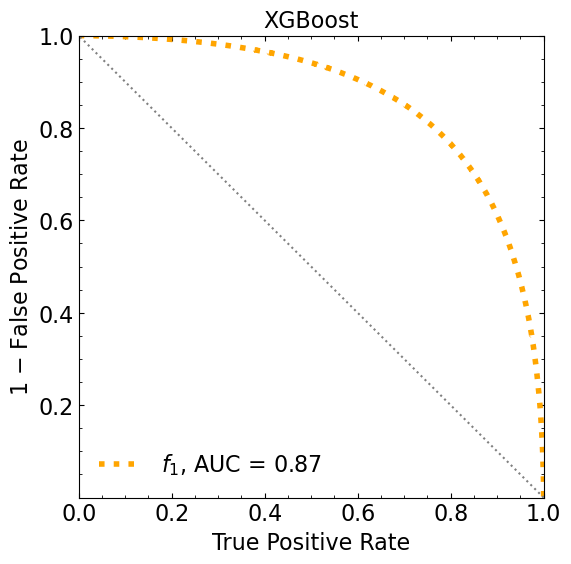

ML iteration  4
[0]	validation_0-logloss:0.66983	validation_1-logloss:0.67060
[1]	validation_0-logloss:0.64954	validation_1-logloss:0.65102

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(



[2]	validation_0-logloss:0.63186	validation_1-logloss:0.63392
[3]	validation_0-logloss:0.61601	validation_1-logloss:0.61870
[4]	validation_0-logloss:0.60213	validation_1-logloss:0.60541
[5]	validation_0-logloss:0.58969	validation_1-logloss:0.59351
[6]	validation_0-logloss:0.57854	validation_1-logloss:0.58287
[7]	validation_0-logloss:0.56827	validation_1-logloss:0.57311
[8]	validation_0-logloss:0.55894	validation_1-logloss:0.56433
[9]	validation_0-logloss:0.55052	validation_1-logloss:0.55638
[10]	validation_0-logloss:0.54289	validation_1-logloss:0.54922
[11]	validation_0-logloss:0.53586	validation_1-logloss:0.54260
[12]	validation_0-logloss:0.52950	validation_1-logloss:0.53674
[13]	validation_0-logloss:0.52353	validation_1-logloss:0.53118
[14]	validation_0-logloss:0.51808	validation_1-logloss:0.52619
[15]	validation_0-logloss:0.51307	validation_1-logloss:0.52159
[16]	validation_0-logloss:0.50848	validation_1-logloss:0.51738
[17]	validation_0-logloss:0.50421	validation_1-logloss:0.51344

[132]	validation_0-logloss:0.42884	validation_1-logloss:0.45635
[133]	validation_0-logloss:0.42875	validation_1-logloss:0.45635
[134]	validation_0-logloss:0.42863	validation_1-logloss:0.45637
[135]	validation_0-logloss:0.42860	validation_1-logloss:0.45636
[136]	validation_0-logloss:0.42851	validation_1-logloss:0.45636
[137]	validation_0-logloss:0.42845	validation_1-logloss:0.45637
[138]	validation_0-logloss:0.42839	validation_1-logloss:0.45637
[139]	validation_0-logloss:0.42830	validation_1-logloss:0.45637
[140]	validation_0-logloss:0.42820	validation_1-logloss:0.45637
[141]	validation_0-logloss:0.42813	validation_1-logloss:0.45637
[142]	validation_0-logloss:0.42808	validation_1-logloss:0.45638
[143]	validation_0-logloss:0.42802	validation_1-logloss:0.45638
[144]	validation_0-logloss:0.42797	validation_1-logloss:0.45638
[145]	validation_0-logloss:0.42789	validation_1-logloss:0.45639
[146]	validation_0-logloss:0.42785	validation_1-logloss:0.45639
[147]	validation_0-logloss:0.42777	valid

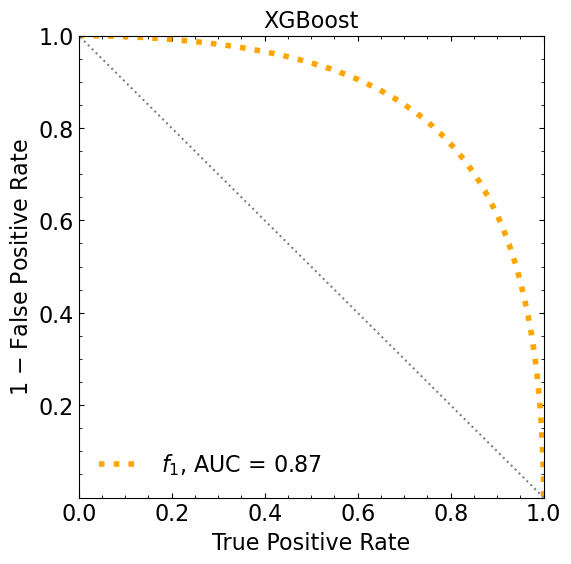

ML iteration  5
[0]	validation_0-logloss:0.66989	validation_1-logloss:0.67074


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64966	validation_1-logloss:0.65122
[2]	validation_0-logloss:0.63187	validation_1-logloss:0.63399
[3]	validation_0-logloss:0.61624	validation_1-logloss:0.61888
[4]	validation_0-logloss:0.60226	validation_1-logloss:0.60545
[5]	validation_0-logloss:0.58979	validation_1-logloss:0.59356
[6]	validation_0-logloss:0.57848	validation_1-logloss:0.58287
[7]	validation_0-logloss:0.56833	validation_1-logloss:0.57324
[8]	validation_0-logloss:0.55912	validation_1-logloss:0.56453
[9]	validation_0-logloss:0.55077	validation_1-logloss:0.55659
[10]	validation_0-logloss:0.54322	validation_1-logloss:0.54946
[11]	validation_0-logloss:0.53624	validation_1-logloss:0.54297
[12]	validation_0-logloss:0.52986	validation_1-logloss:0.53690
[13]	validation_0-logloss:0.52401	validation_1-logloss:0.53149
[14]	validation_0-logloss:0.51862	validation_1-logloss:0.52652
[15]	validation_0-logloss:0.51373	validation_1-logloss:0.52194
[16]	validation_0-logloss:0.50910	validation_1-logloss:0.51764
[

[131]	validation_0-logloss:0.43142	validation_1-logloss:0.45648
[132]	validation_0-logloss:0.43133	validation_1-logloss:0.45648
[133]	validation_0-logloss:0.43128	validation_1-logloss:0.45647
[134]	validation_0-logloss:0.43115	validation_1-logloss:0.45648
[135]	validation_0-logloss:0.43105	validation_1-logloss:0.45648
[136]	validation_0-logloss:0.43095	validation_1-logloss:0.45648
[137]	validation_0-logloss:0.43084	validation_1-logloss:0.45648
[138]	validation_0-logloss:0.43078	validation_1-logloss:0.45649
[139]	validation_0-logloss:0.43064	validation_1-logloss:0.45649
[140]	validation_0-logloss:0.43054	validation_1-logloss:0.45650
[141]	validation_0-logloss:0.43052	validation_1-logloss:0.45650
[142]	validation_0-logloss:0.43044	validation_1-logloss:0.45651
[143]	validation_0-logloss:0.43037	validation_1-logloss:0.45651
[144]	validation_0-logloss:0.43031	validation_1-logloss:0.45651
[145]	validation_0-logloss:0.43020	validation_1-logloss:0.45652
[146]	validation_0-logloss:0.43012	valid

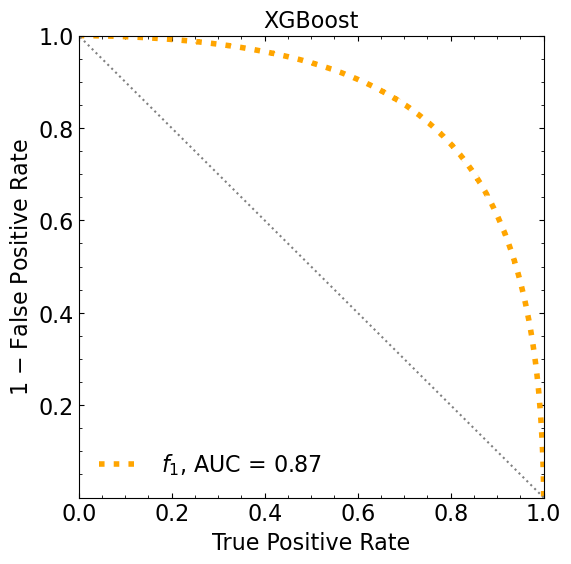

ML iteration  6
[0]	validation_0-logloss:0.66972	validation_1-logloss:0.67065


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64962	validation_1-logloss:0.65121
[2]	validation_0-logloss:0.63191	validation_1-logloss:0.63408
[3]	validation_0-logloss:0.61618	validation_1-logloss:0.61894
[4]	validation_0-logloss:0.60227	validation_1-logloss:0.60558
[5]	validation_0-logloss:0.58986	validation_1-logloss:0.59370
[6]	validation_0-logloss:0.57863	validation_1-logloss:0.58293
[7]	validation_0-logloss:0.56846	validation_1-logloss:0.57327
[8]	validation_0-logloss:0.55935	validation_1-logloss:0.56455
[9]	validation_0-logloss:0.55106	validation_1-logloss:0.55658
[10]	validation_0-logloss:0.54353	validation_1-logloss:0.54939
[11]	validation_0-logloss:0.53663	validation_1-logloss:0.54292
[12]	validation_0-logloss:0.53033	validation_1-logloss:0.53699
[13]	validation_0-logloss:0.52439	validation_1-logloss:0.53148
[14]	validation_0-logloss:0.51901	validation_1-logloss:0.52640
[15]	validation_0-logloss:0.51404	validation_1-logloss:0.52181
[16]	validation_0-logloss:0.50943	validation_1-logloss:0.51755
[

[131]	validation_0-logloss:0.43102	validation_1-logloss:0.45649
[132]	validation_0-logloss:0.43095	validation_1-logloss:0.45649
[133]	validation_0-logloss:0.43084	validation_1-logloss:0.45649
[134]	validation_0-logloss:0.43072	validation_1-logloss:0.45650
[135]	validation_0-logloss:0.43069	validation_1-logloss:0.45649
[136]	validation_0-logloss:0.43059	validation_1-logloss:0.45650
[137]	validation_0-logloss:0.43044	validation_1-logloss:0.45650
[138]	validation_0-logloss:0.43036	validation_1-logloss:0.45650
[139]	validation_0-logloss:0.43023	validation_1-logloss:0.45651
[140]	validation_0-logloss:0.43020	validation_1-logloss:0.45651
[141]	validation_0-logloss:0.43009	validation_1-logloss:0.45652
[142]	validation_0-logloss:0.42992	validation_1-logloss:0.45653
[143]	validation_0-logloss:0.42978	validation_1-logloss:0.45654
[144]	validation_0-logloss:0.42973	validation_1-logloss:0.45654
[145]	validation_0-logloss:0.42962	validation_1-logloss:0.45654
[146]	validation_0-logloss:0.42955	valid

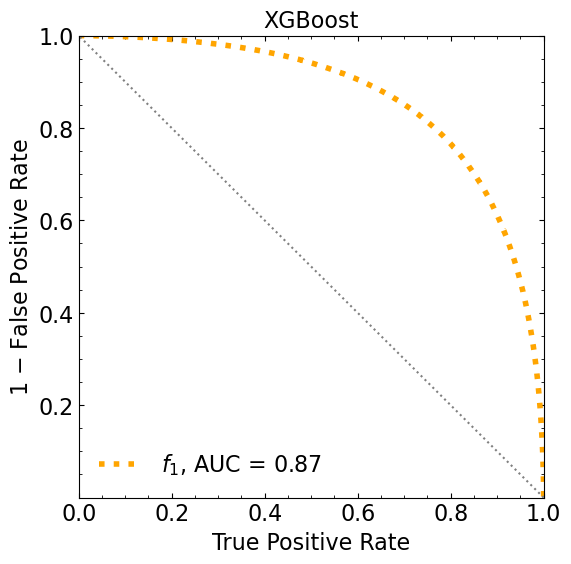

ML iteration  7
[0]	validation_0-logloss:0.66948	validation_1-logloss:0.67055


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64901	validation_1-logloss:0.65077
[2]	validation_0-logloss:0.63103	validation_1-logloss:0.63352
[3]	validation_0-logloss:0.61528	validation_1-logloss:0.61850
[4]	validation_0-logloss:0.60127	validation_1-logloss:0.60511
[5]	validation_0-logloss:0.58864	validation_1-logloss:0.59315
[6]	validation_0-logloss:0.57742	validation_1-logloss:0.58253
[7]	validation_0-logloss:0.56721	validation_1-logloss:0.57285
[8]	validation_0-logloss:0.55800	validation_1-logloss:0.56424
[9]	validation_0-logloss:0.54956	validation_1-logloss:0.55631
[10]	validation_0-logloss:0.54180	validation_1-logloss:0.54902
[11]	validation_0-logloss:0.53481	validation_1-logloss:0.54240
[12]	validation_0-logloss:0.52834	validation_1-logloss:0.53650
[13]	validation_0-logloss:0.52258	validation_1-logloss:0.53109
[14]	validation_0-logloss:0.51715	validation_1-logloss:0.52610
[15]	validation_0-logloss:0.51216	validation_1-logloss:0.52154
[16]	validation_0-logloss:0.50760	validation_1-logloss:0.51732
[

[131]	validation_0-logloss:0.42867	validation_1-logloss:0.45636
[132]	validation_0-logloss:0.42864	validation_1-logloss:0.45635
[133]	validation_0-logloss:0.42854	validation_1-logloss:0.45635
[134]	validation_0-logloss:0.42848	validation_1-logloss:0.45636
[135]	validation_0-logloss:0.42840	validation_1-logloss:0.45636
[136]	validation_0-logloss:0.42830	validation_1-logloss:0.45636
[137]	validation_0-logloss:0.42819	validation_1-logloss:0.45635
[138]	validation_0-logloss:0.42811	validation_1-logloss:0.45636
[139]	validation_0-logloss:0.42796	validation_1-logloss:0.45637
[140]	validation_0-logloss:0.42790	validation_1-logloss:0.45637
[141]	validation_0-logloss:0.42787	validation_1-logloss:0.45636
[142]	validation_0-logloss:0.42779	validation_1-logloss:0.45637
[143]	validation_0-logloss:0.42774	validation_1-logloss:0.45638
[144]	validation_0-logloss:0.42771	validation_1-logloss:0.45638
[145]	validation_0-logloss:0.42764	validation_1-logloss:0.45638
[146]	validation_0-logloss:0.42756	valid

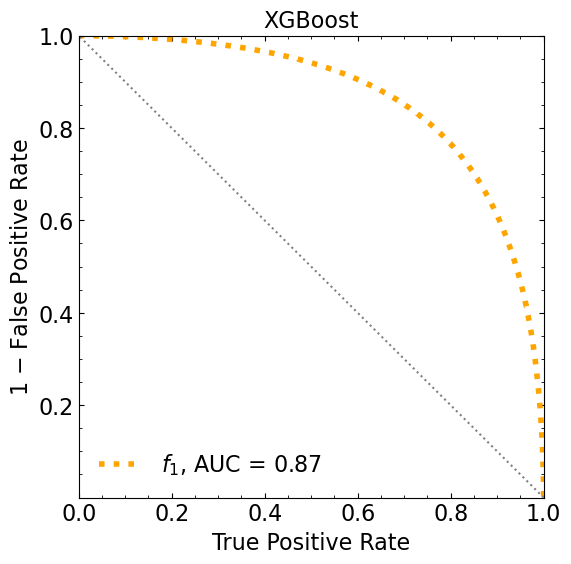

ML iteration  8
[0]	validation_0-logloss:0.66999	validation_1-logloss:0.67078


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64990	validation_1-logloss:0.65129
[2]	validation_0-logloss:0.63216	validation_1-logloss:0.63405
[3]	validation_0-logloss:0.61661	validation_1-logloss:0.61905
[4]	validation_0-logloss:0.60273	validation_1-logloss:0.60571
[5]	validation_0-logloss:0.59035	validation_1-logloss:0.59385
[6]	validation_0-logloss:0.57922	validation_1-logloss:0.58301
[7]	validation_0-logloss:0.56925	validation_1-logloss:0.57347
[8]	validation_0-logloss:0.56020	validation_1-logloss:0.56482
[9]	validation_0-logloss:0.55191	validation_1-logloss:0.55696
[10]	validation_0-logloss:0.54444	validation_1-logloss:0.54980
[11]	validation_0-logloss:0.53749	validation_1-logloss:0.54320
[12]	validation_0-logloss:0.53116	validation_1-logloss:0.53730
[13]	validation_0-logloss:0.52533	validation_1-logloss:0.53174
[14]	validation_0-logloss:0.51995	validation_1-logloss:0.52677
[15]	validation_0-logloss:0.51503	validation_1-logloss:0.52214
[16]	validation_0-logloss:0.51049	validation_1-logloss:0.51798
[

[131]	validation_0-logloss:0.43214	validation_1-logloss:0.45629
[132]	validation_0-logloss:0.43204	validation_1-logloss:0.45628
[133]	validation_0-logloss:0.43189	validation_1-logloss:0.45628
[134]	validation_0-logloss:0.43181	validation_1-logloss:0.45629
[135]	validation_0-logloss:0.43173	validation_1-logloss:0.45628
[136]	validation_0-logloss:0.43167	validation_1-logloss:0.45629
[137]	validation_0-logloss:0.43159	validation_1-logloss:0.45629
[138]	validation_0-logloss:0.43151	validation_1-logloss:0.45630
[139]	validation_0-logloss:0.43148	validation_1-logloss:0.45630
[140]	validation_0-logloss:0.43138	validation_1-logloss:0.45630
[141]	validation_0-logloss:0.43132	validation_1-logloss:0.45629
[142]	validation_0-logloss:0.43121	validation_1-logloss:0.45629
[143]	validation_0-logloss:0.43111	validation_1-logloss:0.45629
[144]	validation_0-logloss:0.43104	validation_1-logloss:0.45628
[145]	validation_0-logloss:0.43098	validation_1-logloss:0.45629
[146]	validation_0-logloss:0.43080	valid

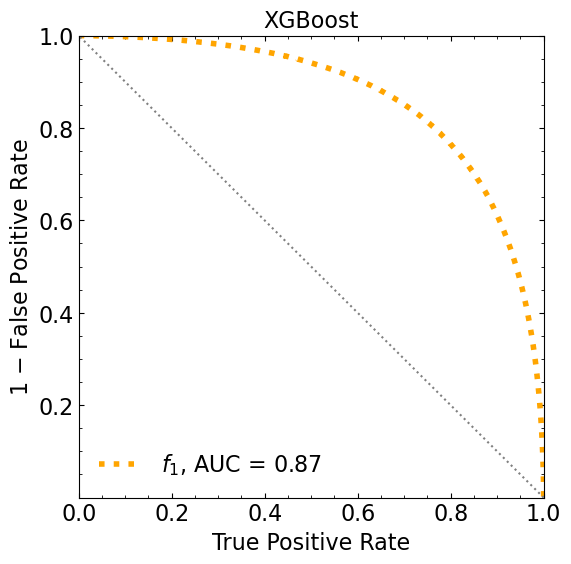

ML iteration  9
[0]	validation_0-logloss:0.66949	validation_1-logloss:0.67048


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64889	validation_1-logloss:0.65075
[2]	validation_0-logloss:0.63095	validation_1-logloss:0.63363
[3]	validation_0-logloss:0.61487	validation_1-logloss:0.61835
[4]	validation_0-logloss:0.60060	validation_1-logloss:0.60479
[5]	validation_0-logloss:0.58791	validation_1-logloss:0.59278
[6]	validation_0-logloss:0.57648	validation_1-logloss:0.58191
[7]	validation_0-logloss:0.56622	validation_1-logloss:0.57224
[8]	validation_0-logloss:0.55693	validation_1-logloss:0.56360
[9]	validation_0-logloss:0.54838	validation_1-logloss:0.55557
[10]	validation_0-logloss:0.54080	validation_1-logloss:0.54848
[11]	validation_0-logloss:0.53374	validation_1-logloss:0.54197
[12]	validation_0-logloss:0.52736	validation_1-logloss:0.53598
[13]	validation_0-logloss:0.52149	validation_1-logloss:0.53069
[14]	validation_0-logloss:0.51614	validation_1-logloss:0.52583
[15]	validation_0-logloss:0.51115	validation_1-logloss:0.52125
[16]	validation_0-logloss:0.50662	validation_1-logloss:0.51707
[

[131]	validation_0-logloss:0.42750	validation_1-logloss:0.45646
[132]	validation_0-logloss:0.42739	validation_1-logloss:0.45646
[133]	validation_0-logloss:0.42728	validation_1-logloss:0.45646
[134]	validation_0-logloss:0.42721	validation_1-logloss:0.45647
[135]	validation_0-logloss:0.42710	validation_1-logloss:0.45648
[136]	validation_0-logloss:0.42704	validation_1-logloss:0.45649
[137]	validation_0-logloss:0.42697	validation_1-logloss:0.45649
[138]	validation_0-logloss:0.42683	validation_1-logloss:0.45649
[139]	validation_0-logloss:0.42674	validation_1-logloss:0.45650
[140]	validation_0-logloss:0.42667	validation_1-logloss:0.45649
[141]	validation_0-logloss:0.42660	validation_1-logloss:0.45650
[142]	validation_0-logloss:0.42657	validation_1-logloss:0.45650
[143]	validation_0-logloss:0.42653	validation_1-logloss:0.45650
[144]	validation_0-logloss:0.42645	validation_1-logloss:0.45650
[145]	validation_0-logloss:0.42634	validation_1-logloss:0.45652
[146]	validation_0-logloss:0.42631	valid

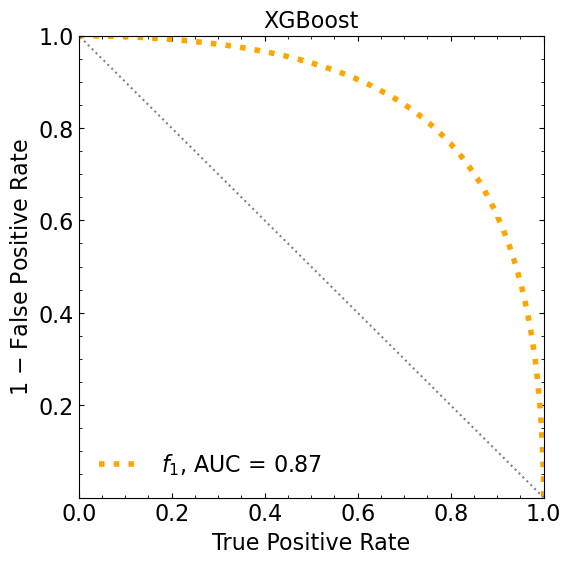

Classification score (1 ML):


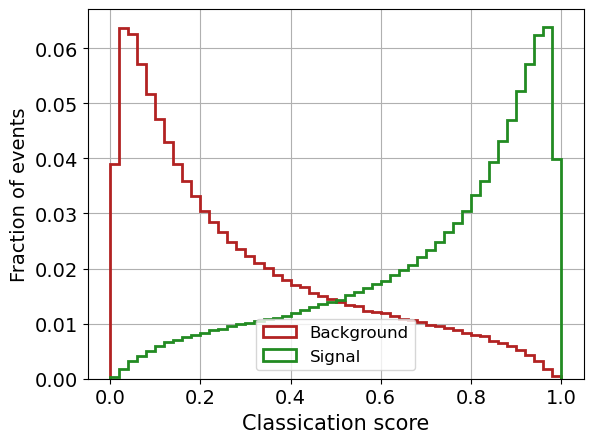

Classification score (10 ML):


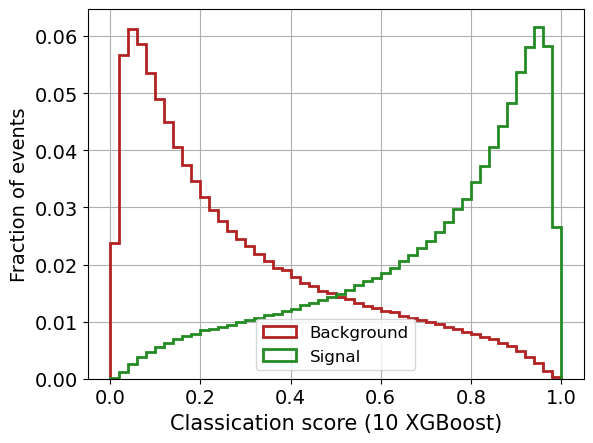

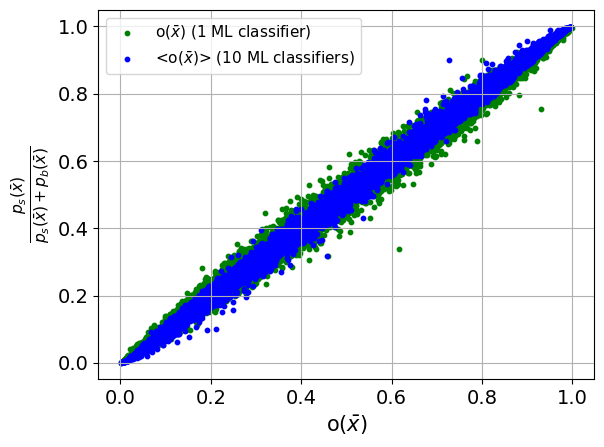


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [31]:
dim=7

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)





print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


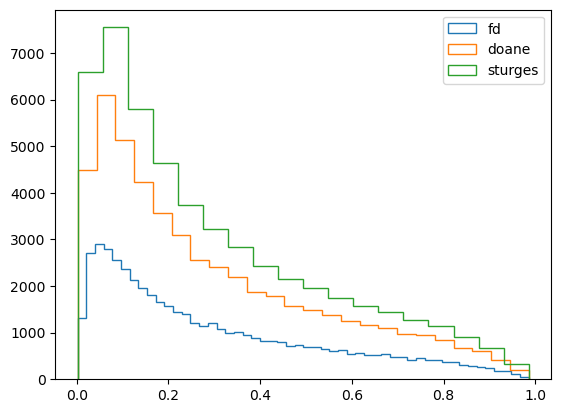

fd 52
doane 24
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  52


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  24
doing Nbin:  18


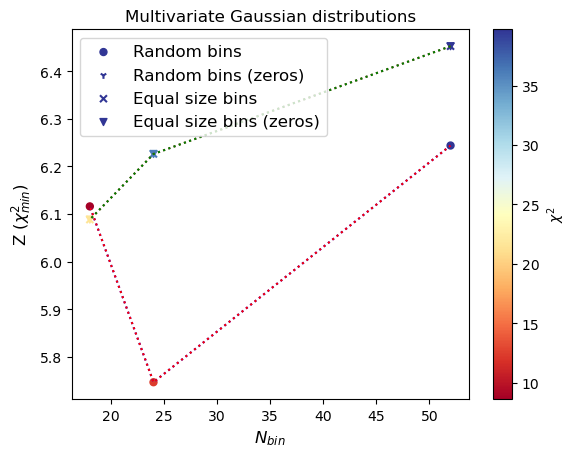

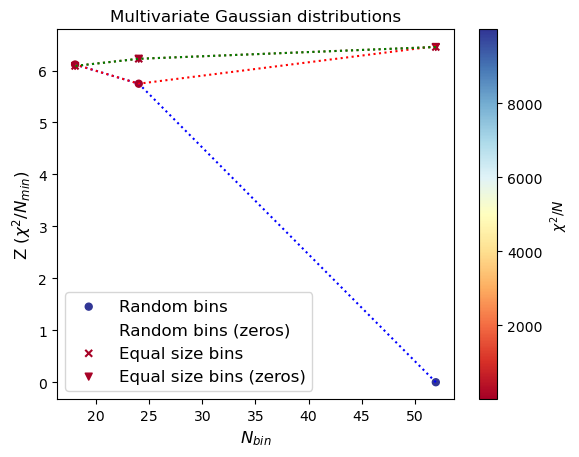

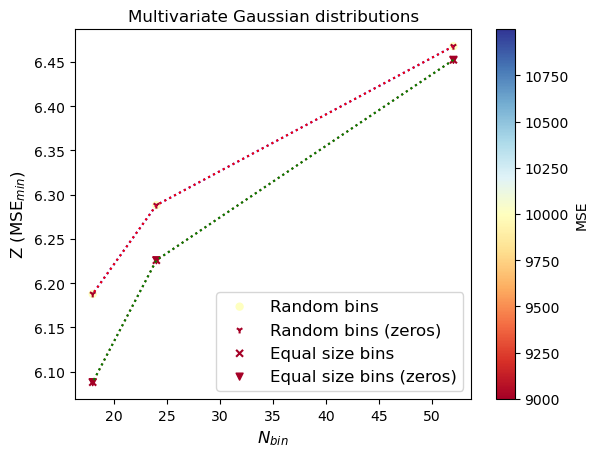

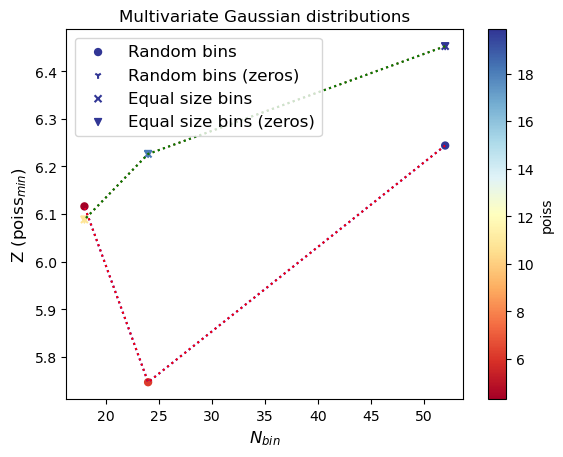

In [32]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 8)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 8)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 8)
y_gauss_test :  (2000000, 1)



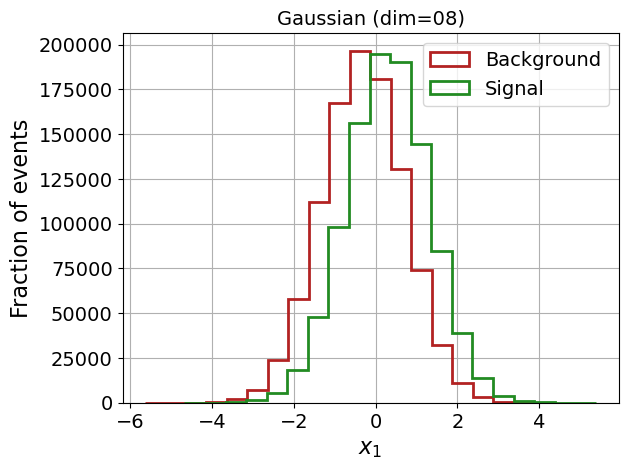

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67079	validation_1-logloss:0.67101
[1]	validation_0-logloss:0.65087	validation_1-logloss:0.65116
[2]	validation_0-logloss:0.63327	validation_1-logloss:0.63370
[3]	validation_0-logloss:0.61764	validation_1-logloss:0.61818
[4]	validation_0-logloss:0.60359	validation_1-logloss:0.60420
[5]	validation_0-logloss:0.59099	validation_1-logloss:0.59172
[6]	validation_0-logloss:0.57959	validation_1-logloss:0.58040
[7]	validation_0-logloss:0.56929	validation_1-logloss:0.57017
[8]	validation_0-logloss:0.55988	validation_1-logloss:0.56087
[9]	validation_0-logloss:0.55127	validation_1-logloss:0.55233
[10]	validation_0-logloss:0.54337	validation_1-logloss:0.54452
[11]	validation_0-logloss:0.53616	validation_1-logloss:0.53739
[12]	validation_0-logloss:0.52945	validation_1-logloss:0.53074
[13]	validation_0-logloss:0.52329	validation_1-logloss:0.52465
[14]	validation_0-logloss:0.51764	validation_1-logloss:0.51905
[15]	validation_0-logloss:0.51246	validation_1-logloss:0.51393
[1

[130]	validation_0-logloss:0.42472	validation_1-logloss:0.42860
[131]	validation_0-logloss:0.42469	validation_1-logloss:0.42858
[132]	validation_0-logloss:0.42466	validation_1-logloss:0.42856
[133]	validation_0-logloss:0.42463	validation_1-logloss:0.42854
[134]	validation_0-logloss:0.42460	validation_1-logloss:0.42852
[135]	validation_0-logloss:0.42457	validation_1-logloss:0.42850
[136]	validation_0-logloss:0.42454	validation_1-logloss:0.42848
[137]	validation_0-logloss:0.42452	validation_1-logloss:0.42847
[138]	validation_0-logloss:0.42449	validation_1-logloss:0.42846
[139]	validation_0-logloss:0.42446	validation_1-logloss:0.42844
[140]	validation_0-logloss:0.42444	validation_1-logloss:0.42842
[141]	validation_0-logloss:0.42441	validation_1-logloss:0.42841
[142]	validation_0-logloss:0.42439	validation_1-logloss:0.42840
[143]	validation_0-logloss:0.42437	validation_1-logloss:0.42839
[144]	validation_0-logloss:0.42434	validation_1-logloss:0.42837
[145]	validation_0-logloss:0.42432	valid

[259]	validation_0-logloss:0.42323	validation_1-logloss:0.42812
[260]	validation_0-logloss:0.42323	validation_1-logloss:0.42812
[261]	validation_0-logloss:0.42322	validation_1-logloss:0.42812
[262]	validation_0-logloss:0.42322	validation_1-logloss:0.42812
[263]	validation_0-logloss:0.42321	validation_1-logloss:0.42812
[264]	validation_0-logloss:0.42321	validation_1-logloss:0.42812
[265]	validation_0-logloss:0.42321	validation_1-logloss:0.42812
[266]	validation_0-logloss:0.42320	validation_1-logloss:0.42812
[267]	validation_0-logloss:0.42320	validation_1-logloss:0.42812
[268]	validation_0-logloss:0.42319	validation_1-logloss:0.42812
[269]	validation_0-logloss:0.42318	validation_1-logloss:0.42812
[270]	validation_0-logloss:0.42318	validation_1-logloss:0.42812
[271]	validation_0-logloss:0.42317	validation_1-logloss:0.42812


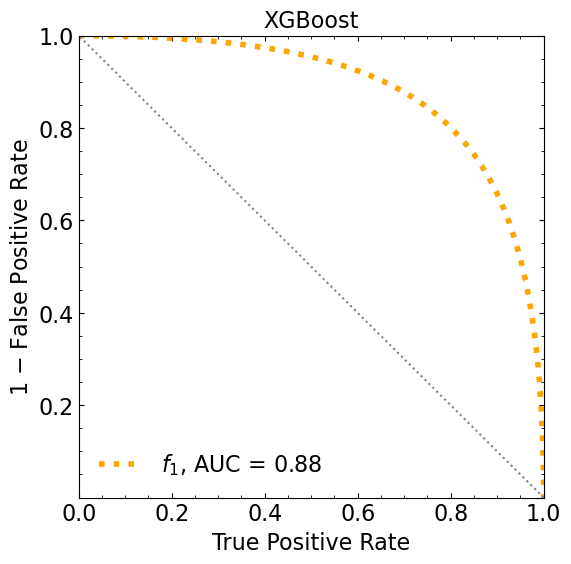

ML iteration 0
[0]	validation_0-logloss:0.66952	validation_1-logloss:0.67051


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64892	validation_1-logloss:0.65067
[2]	validation_0-logloss:0.63049	validation_1-logloss:0.63294
[3]	validation_0-logloss:0.61407	validation_1-logloss:0.61732
[4]	validation_0-logloss:0.59936	validation_1-logloss:0.60323
[5]	validation_0-logloss:0.58609	validation_1-logloss:0.59062
[6]	validation_0-logloss:0.57411	validation_1-logloss:0.57919
[7]	validation_0-logloss:0.56324	validation_1-logloss:0.56885
[8]	validation_0-logloss:0.55328	validation_1-logloss:0.55945
[9]	validation_0-logloss:0.54409	validation_1-logloss:0.55080
[10]	validation_0-logloss:0.53561	validation_1-logloss:0.54289
[11]	validation_0-logloss:0.52795	validation_1-logloss:0.53571
[12]	validation_0-logloss:0.52094	validation_1-logloss:0.52909
[13]	validation_0-logloss:0.51434	validation_1-logloss:0.52295
[14]	validation_0-logloss:0.50832	validation_1-logloss:0.51743
[15]	validation_0-logloss:0.50277	validation_1-logloss:0.51222
[16]	validation_0-logloss:0.49764	validation_1-logloss:0.50746
[

[131]	validation_0-logloss:0.40310	validation_1-logloss:0.43206
[132]	validation_0-logloss:0.40295	validation_1-logloss:0.43206
[133]	validation_0-logloss:0.40277	validation_1-logloss:0.43206
[134]	validation_0-logloss:0.40270	validation_1-logloss:0.43206
[135]	validation_0-logloss:0.40259	validation_1-logloss:0.43205
[136]	validation_0-logloss:0.40247	validation_1-logloss:0.43204
[137]	validation_0-logloss:0.40236	validation_1-logloss:0.43203
[138]	validation_0-logloss:0.40226	validation_1-logloss:0.43203
[139]	validation_0-logloss:0.40218	validation_1-logloss:0.43203
[140]	validation_0-logloss:0.40214	validation_1-logloss:0.43203
[141]	validation_0-logloss:0.40207	validation_1-logloss:0.43202
[142]	validation_0-logloss:0.40200	validation_1-logloss:0.43201
[143]	validation_0-logloss:0.40190	validation_1-logloss:0.43202
[144]	validation_0-logloss:0.40184	validation_1-logloss:0.43202
[145]	validation_0-logloss:0.40170	validation_1-logloss:0.43203
[146]	validation_0-logloss:0.40158	valid

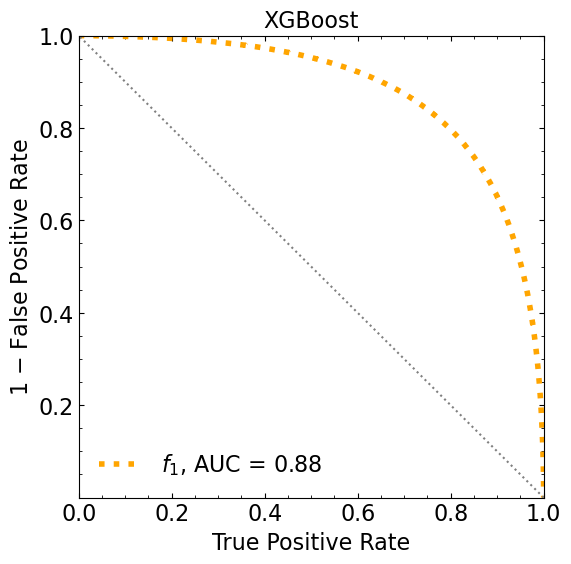

ML iteration  1
[0]	validation_0-logloss:0.66953	validation_1-logloss:0.67061


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64874	validation_1-logloss:0.65060
[2]	validation_0-logloss:0.63047	validation_1-logloss:0.63298
[3]	validation_0-logloss:0.61406	validation_1-logloss:0.61723
[4]	validation_0-logloss:0.59954	validation_1-logloss:0.60331
[5]	validation_0-logloss:0.58631	validation_1-logloss:0.59079
[6]	validation_0-logloss:0.57437	validation_1-logloss:0.57934
[7]	validation_0-logloss:0.56356	validation_1-logloss:0.56910
[8]	validation_0-logloss:0.55361	validation_1-logloss:0.55969
[9]	validation_0-logloss:0.54447	validation_1-logloss:0.55101
[10]	validation_0-logloss:0.53618	validation_1-logloss:0.54321
[11]	validation_0-logloss:0.52850	validation_1-logloss:0.53601
[12]	validation_0-logloss:0.52131	validation_1-logloss:0.52921
[13]	validation_0-logloss:0.51483	validation_1-logloss:0.52318
[14]	validation_0-logloss:0.50883	validation_1-logloss:0.51763
[15]	validation_0-logloss:0.50310	validation_1-logloss:0.51235
[16]	validation_0-logloss:0.49790	validation_1-logloss:0.50747
[

[131]	validation_0-logloss:0.40235	validation_1-logloss:0.43217
[132]	validation_0-logloss:0.40223	validation_1-logloss:0.43216
[133]	validation_0-logloss:0.40211	validation_1-logloss:0.43215
[134]	validation_0-logloss:0.40207	validation_1-logloss:0.43214
[135]	validation_0-logloss:0.40198	validation_1-logloss:0.43213
[136]	validation_0-logloss:0.40188	validation_1-logloss:0.43212
[137]	validation_0-logloss:0.40175	validation_1-logloss:0.43211
[138]	validation_0-logloss:0.40160	validation_1-logloss:0.43212
[139]	validation_0-logloss:0.40145	validation_1-logloss:0.43212
[140]	validation_0-logloss:0.40139	validation_1-logloss:0.43212
[141]	validation_0-logloss:0.40134	validation_1-logloss:0.43212
[142]	validation_0-logloss:0.40125	validation_1-logloss:0.43211
[143]	validation_0-logloss:0.40112	validation_1-logloss:0.43211
[144]	validation_0-logloss:0.40107	validation_1-logloss:0.43210
[145]	validation_0-logloss:0.40101	validation_1-logloss:0.43209
[146]	validation_0-logloss:0.40092	valid

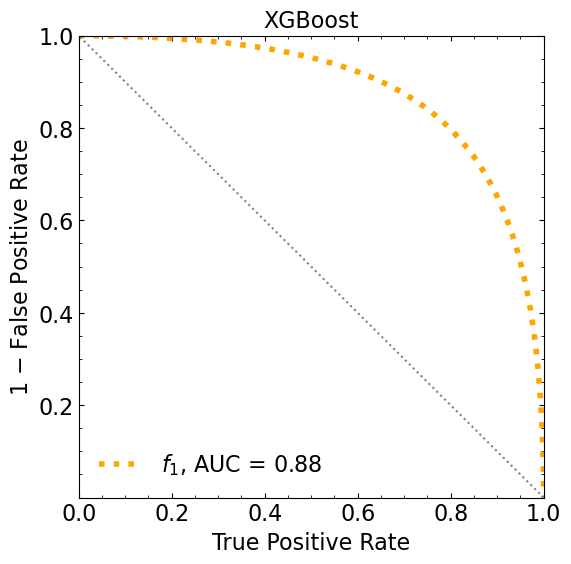

ML iteration  2
[0]	validation_0-logloss:0.66946	validation_1-logloss:0.67055


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64854	validation_1-logloss:0.65047
[2]	validation_0-logloss:0.63011	validation_1-logloss:0.63282
[3]	validation_0-logloss:0.61343	validation_1-logloss:0.61702
[4]	validation_0-logloss:0.59851	validation_1-logloss:0.60281
[5]	validation_0-logloss:0.58518	validation_1-logloss:0.59024
[6]	validation_0-logloss:0.57310	validation_1-logloss:0.57881
[7]	validation_0-logloss:0.56212	validation_1-logloss:0.56845
[8]	validation_0-logloss:0.55194	validation_1-logloss:0.55892
[9]	validation_0-logloss:0.54267	validation_1-logloss:0.55027
[10]	validation_0-logloss:0.53426	validation_1-logloss:0.54246
[11]	validation_0-logloss:0.52654	validation_1-logloss:0.53520
[12]	validation_0-logloss:0.51944	validation_1-logloss:0.52854
[13]	validation_0-logloss:0.51288	validation_1-logloss:0.52246
[14]	validation_0-logloss:0.50681	validation_1-logloss:0.51694
[15]	validation_0-logloss:0.50120	validation_1-logloss:0.51179
[16]	validation_0-logloss:0.49594	validation_1-logloss:0.50698
[

[131]	validation_0-logloss:0.39975	validation_1-logloss:0.43204
[132]	validation_0-logloss:0.39965	validation_1-logloss:0.43203
[133]	validation_0-logloss:0.39951	validation_1-logloss:0.43203
[134]	validation_0-logloss:0.39940	validation_1-logloss:0.43203
[135]	validation_0-logloss:0.39929	validation_1-logloss:0.43202
[136]	validation_0-logloss:0.39922	validation_1-logloss:0.43201
[137]	validation_0-logloss:0.39914	validation_1-logloss:0.43200
[138]	validation_0-logloss:0.39906	validation_1-logloss:0.43200
[139]	validation_0-logloss:0.39900	validation_1-logloss:0.43200
[140]	validation_0-logloss:0.39882	validation_1-logloss:0.43200
[141]	validation_0-logloss:0.39872	validation_1-logloss:0.43200
[142]	validation_0-logloss:0.39857	validation_1-logloss:0.43200
[143]	validation_0-logloss:0.39854	validation_1-logloss:0.43200
[144]	validation_0-logloss:0.39845	validation_1-logloss:0.43200
[145]	validation_0-logloss:0.39831	validation_1-logloss:0.43201
[146]	validation_0-logloss:0.39820	valid

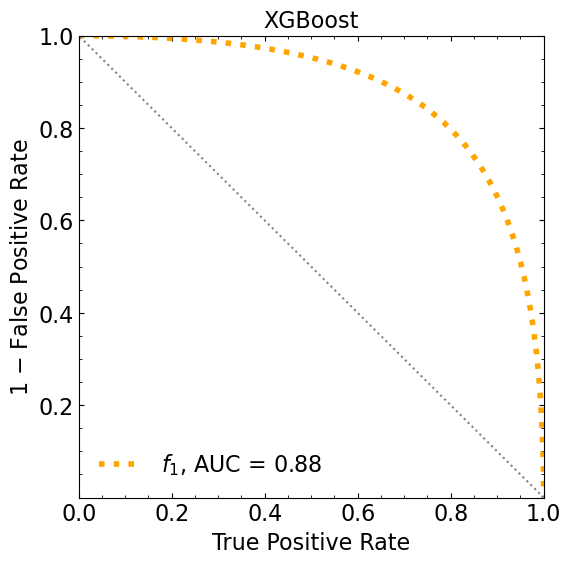

ML iteration  3
[0]	validation_0-logloss:0.66931	validation_1-logloss:0.67048


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64848	validation_1-logloss:0.65057
[2]	validation_0-logloss:0.62998	validation_1-logloss:0.63288
[3]	validation_0-logloss:0.61341	validation_1-logloss:0.61721
[4]	validation_0-logloss:0.59846	validation_1-logloss:0.60304
[5]	validation_0-logloss:0.58522	validation_1-logloss:0.59050
[6]	validation_0-logloss:0.57309	validation_1-logloss:0.57905
[7]	validation_0-logloss:0.56208	validation_1-logloss:0.56863
[8]	validation_0-logloss:0.55215	validation_1-logloss:0.55929
[9]	validation_0-logloss:0.54305	validation_1-logloss:0.55069
[10]	validation_0-logloss:0.53480	validation_1-logloss:0.54291
[11]	validation_0-logloss:0.52713	validation_1-logloss:0.53566
[12]	validation_0-logloss:0.52002	validation_1-logloss:0.52907
[13]	validation_0-logloss:0.51359	validation_1-logloss:0.52314
[14]	validation_0-logloss:0.50751	validation_1-logloss:0.51748
[15]	validation_0-logloss:0.50191	validation_1-logloss:0.51229
[16]	validation_0-logloss:0.49665	validation_1-logloss:0.50740
[

[131]	validation_0-logloss:0.40083	validation_1-logloss:0.43203
[132]	validation_0-logloss:0.40074	validation_1-logloss:0.43203
[133]	validation_0-logloss:0.40058	validation_1-logloss:0.43203
[134]	validation_0-logloss:0.40048	validation_1-logloss:0.43202
[135]	validation_0-logloss:0.40038	validation_1-logloss:0.43202
[136]	validation_0-logloss:0.40030	validation_1-logloss:0.43202
[137]	validation_0-logloss:0.40016	validation_1-logloss:0.43202
[138]	validation_0-logloss:0.39998	validation_1-logloss:0.43202
[139]	validation_0-logloss:0.39992	validation_1-logloss:0.43201
[140]	validation_0-logloss:0.39979	validation_1-logloss:0.43201
[141]	validation_0-logloss:0.39973	validation_1-logloss:0.43201
[142]	validation_0-logloss:0.39962	validation_1-logloss:0.43200
[143]	validation_0-logloss:0.39956	validation_1-logloss:0.43200
[144]	validation_0-logloss:0.39945	validation_1-logloss:0.43200
[145]	validation_0-logloss:0.39941	validation_1-logloss:0.43199
[146]	validation_0-logloss:0.39932	valid

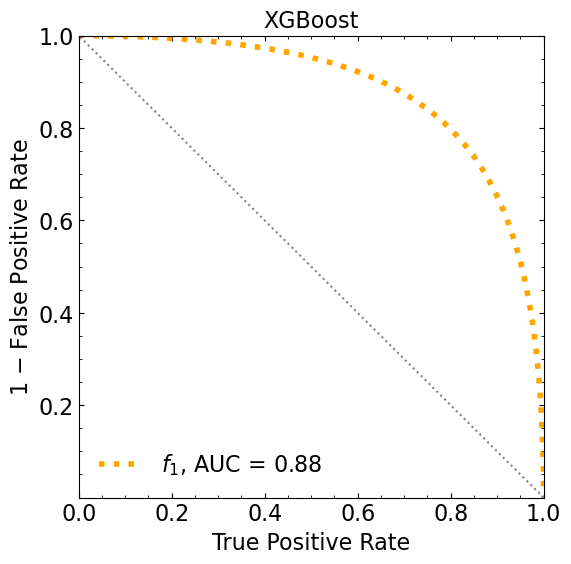

ML iteration  4
[0]	validation_0-logloss:0.66968	validation_1-logloss:0.67065


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64899	validation_1-logloss:0.65070
[2]	validation_0-logloss:0.63055	validation_1-logloss:0.63300
[3]	validation_0-logloss:0.61428	validation_1-logloss:0.61740
[4]	validation_0-logloss:0.59965	validation_1-logloss:0.60339
[5]	validation_0-logloss:0.58650	validation_1-logloss:0.59080
[6]	validation_0-logloss:0.57460	validation_1-logloss:0.57936
[7]	validation_0-logloss:0.56376	validation_1-logloss:0.56906
[8]	validation_0-logloss:0.55390	validation_1-logloss:0.55980
[9]	validation_0-logloss:0.54492	validation_1-logloss:0.55120
[10]	validation_0-logloss:0.53660	validation_1-logloss:0.54332
[11]	validation_0-logloss:0.52895	validation_1-logloss:0.53607
[12]	validation_0-logloss:0.52194	validation_1-logloss:0.52950
[13]	validation_0-logloss:0.51542	validation_1-logloss:0.52346
[14]	validation_0-logloss:0.50935	validation_1-logloss:0.51781
[15]	validation_0-logloss:0.50379	validation_1-logloss:0.51261
[16]	validation_0-logloss:0.49854	validation_1-logloss:0.50779
[

[131]	validation_0-logloss:0.40321	validation_1-logloss:0.43212
[132]	validation_0-logloss:0.40310	validation_1-logloss:0.43211
[133]	validation_0-logloss:0.40302	validation_1-logloss:0.43211
[134]	validation_0-logloss:0.40294	validation_1-logloss:0.43210
[135]	validation_0-logloss:0.40281	validation_1-logloss:0.43211
[136]	validation_0-logloss:0.40272	validation_1-logloss:0.43210
[137]	validation_0-logloss:0.40263	validation_1-logloss:0.43210
[138]	validation_0-logloss:0.40249	validation_1-logloss:0.43210
[139]	validation_0-logloss:0.40240	validation_1-logloss:0.43211
[140]	validation_0-logloss:0.40228	validation_1-logloss:0.43209
[141]	validation_0-logloss:0.40220	validation_1-logloss:0.43209
[142]	validation_0-logloss:0.40215	validation_1-logloss:0.43208
[143]	validation_0-logloss:0.40203	validation_1-logloss:0.43210
[144]	validation_0-logloss:0.40195	validation_1-logloss:0.43210
[145]	validation_0-logloss:0.40189	validation_1-logloss:0.43209
[146]	validation_0-logloss:0.40177	valid

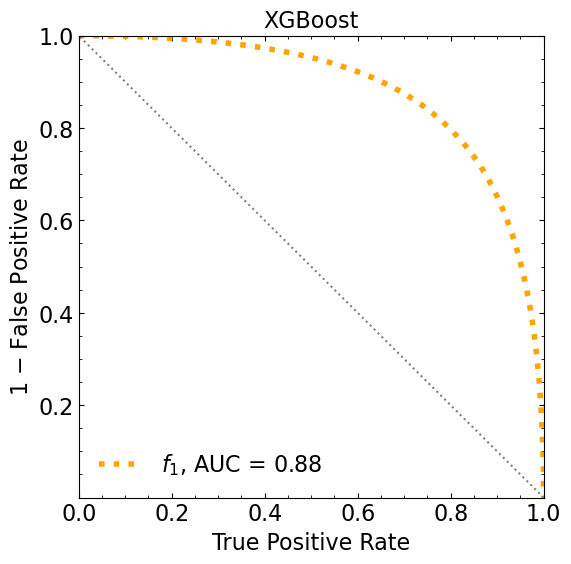

ML iteration  5
[0]	validation_0-logloss:0.66951	validation_1-logloss:0.67052


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64871	validation_1-logloss:0.65050
[2]	validation_0-logloss:0.63012	validation_1-logloss:0.63280
[3]	validation_0-logloss:0.61385	validation_1-logloss:0.61718
[4]	validation_0-logloss:0.59902	validation_1-logloss:0.60311
[5]	validation_0-logloss:0.58569	validation_1-logloss:0.59040
[6]	validation_0-logloss:0.57374	validation_1-logloss:0.57909
[7]	validation_0-logloss:0.56276	validation_1-logloss:0.56872
[8]	validation_0-logloss:0.55266	validation_1-logloss:0.55920
[9]	validation_0-logloss:0.54347	validation_1-logloss:0.55067
[10]	validation_0-logloss:0.53509	validation_1-logloss:0.54278
[11]	validation_0-logloss:0.52739	validation_1-logloss:0.53560
[12]	validation_0-logloss:0.52024	validation_1-logloss:0.52899
[13]	validation_0-logloss:0.51373	validation_1-logloss:0.52292
[14]	validation_0-logloss:0.50768	validation_1-logloss:0.51737
[15]	validation_0-logloss:0.50203	validation_1-logloss:0.51220
[16]	validation_0-logloss:0.49681	validation_1-logloss:0.50739
[

[131]	validation_0-logloss:0.40138	validation_1-logloss:0.43229
[132]	validation_0-logloss:0.40128	validation_1-logloss:0.43228
[133]	validation_0-logloss:0.40123	validation_1-logloss:0.43227
[134]	validation_0-logloss:0.40116	validation_1-logloss:0.43227
[135]	validation_0-logloss:0.40106	validation_1-logloss:0.43227
[136]	validation_0-logloss:0.40094	validation_1-logloss:0.43226
[137]	validation_0-logloss:0.40084	validation_1-logloss:0.43226
[138]	validation_0-logloss:0.40079	validation_1-logloss:0.43225
[139]	validation_0-logloss:0.40063	validation_1-logloss:0.43225
[140]	validation_0-logloss:0.40052	validation_1-logloss:0.43224
[141]	validation_0-logloss:0.40040	validation_1-logloss:0.43224
[142]	validation_0-logloss:0.40030	validation_1-logloss:0.43224
[143]	validation_0-logloss:0.40011	validation_1-logloss:0.43224
[144]	validation_0-logloss:0.40004	validation_1-logloss:0.43225
[145]	validation_0-logloss:0.39995	validation_1-logloss:0.43225
[146]	validation_0-logloss:0.39986	valid

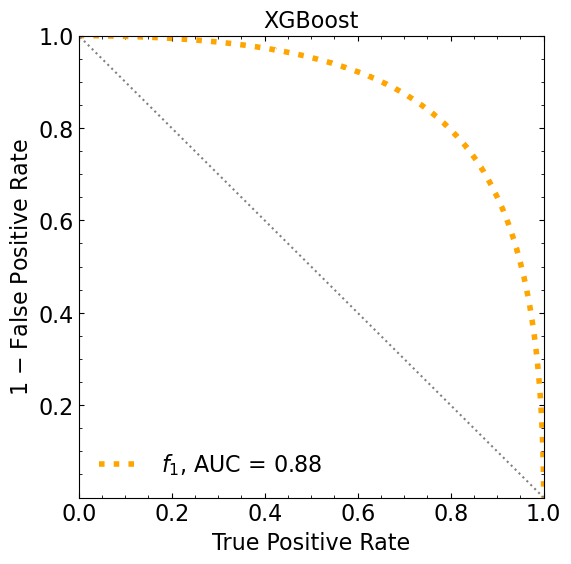

ML iteration  6
[0]	validation_0-logloss:0.66918	validation_1-logloss:0.67041


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64830	validation_1-logloss:0.65035
[2]	validation_0-logloss:0.62974	validation_1-logloss:0.63272
[3]	validation_0-logloss:0.61330	validation_1-logloss:0.61715
[4]	validation_0-logloss:0.59847	validation_1-logloss:0.60294
[5]	validation_0-logloss:0.58512	validation_1-logloss:0.59025
[6]	validation_0-logloss:0.57305	validation_1-logloss:0.57887
[7]	validation_0-logloss:0.56223	validation_1-logloss:0.56873
[8]	validation_0-logloss:0.55222	validation_1-logloss:0.55924
[9]	validation_0-logloss:0.54312	validation_1-logloss:0.55070
[10]	validation_0-logloss:0.53470	validation_1-logloss:0.54279
[11]	validation_0-logloss:0.52706	validation_1-logloss:0.53568
[12]	validation_0-logloss:0.51997	validation_1-logloss:0.52910
[13]	validation_0-logloss:0.51337	validation_1-logloss:0.52297
[14]	validation_0-logloss:0.50733	validation_1-logloss:0.51730
[15]	validation_0-logloss:0.50170	validation_1-logloss:0.51207
[16]	validation_0-logloss:0.49653	validation_1-logloss:0.50730
[

[131]	validation_0-logloss:0.40094	validation_1-logloss:0.43211
[132]	validation_0-logloss:0.40082	validation_1-logloss:0.43210
[133]	validation_0-logloss:0.40075	validation_1-logloss:0.43209
[134]	validation_0-logloss:0.40063	validation_1-logloss:0.43208
[135]	validation_0-logloss:0.40058	validation_1-logloss:0.43208
[136]	validation_0-logloss:0.40046	validation_1-logloss:0.43209
[137]	validation_0-logloss:0.40037	validation_1-logloss:0.43208
[138]	validation_0-logloss:0.40029	validation_1-logloss:0.43208
[139]	validation_0-logloss:0.40025	validation_1-logloss:0.43208
[140]	validation_0-logloss:0.40009	validation_1-logloss:0.43208
[141]	validation_0-logloss:0.40003	validation_1-logloss:0.43207
[142]	validation_0-logloss:0.39995	validation_1-logloss:0.43207
[143]	validation_0-logloss:0.39985	validation_1-logloss:0.43207
[144]	validation_0-logloss:0.39973	validation_1-logloss:0.43206
[145]	validation_0-logloss:0.39962	validation_1-logloss:0.43205
[146]	validation_0-logloss:0.39949	valid

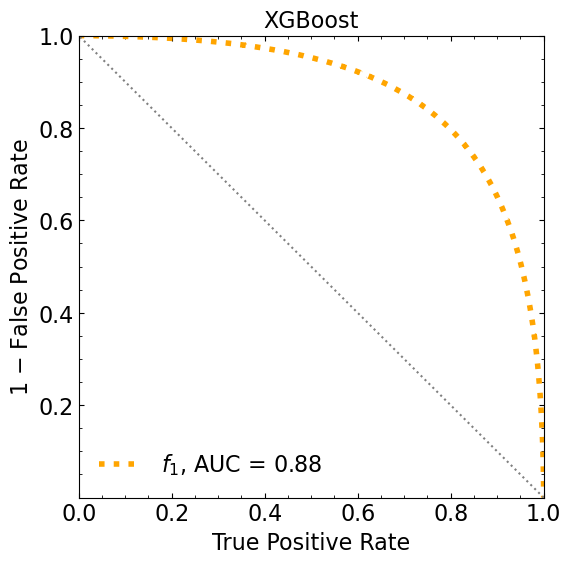

ML iteration  7
[0]	validation_0-logloss:0.66931	validation_1-logloss:0.67047


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64864	validation_1-logloss:0.65065
[2]	validation_0-logloss:0.63027	validation_1-logloss:0.63295
[3]	validation_0-logloss:0.61388	validation_1-logloss:0.61739
[4]	validation_0-logloss:0.59928	validation_1-logloss:0.60335
[5]	validation_0-logloss:0.58604	validation_1-logloss:0.59080
[6]	validation_0-logloss:0.57411	validation_1-logloss:0.57929
[7]	validation_0-logloss:0.56322	validation_1-logloss:0.56911
[8]	validation_0-logloss:0.55327	validation_1-logloss:0.55979
[9]	validation_0-logloss:0.54417	validation_1-logloss:0.55126
[10]	validation_0-logloss:0.53583	validation_1-logloss:0.54331
[11]	validation_0-logloss:0.52812	validation_1-logloss:0.53616
[12]	validation_0-logloss:0.52105	validation_1-logloss:0.52953
[13]	validation_0-logloss:0.51452	validation_1-logloss:0.52346
[14]	validation_0-logloss:0.50842	validation_1-logloss:0.51779
[15]	validation_0-logloss:0.50281	validation_1-logloss:0.51264
[16]	validation_0-logloss:0.49753	validation_1-logloss:0.50778
[

[131]	validation_0-logloss:0.40217	validation_1-logloss:0.43221
[132]	validation_0-logloss:0.40210	validation_1-logloss:0.43221
[133]	validation_0-logloss:0.40196	validation_1-logloss:0.43220
[134]	validation_0-logloss:0.40180	validation_1-logloss:0.43220
[135]	validation_0-logloss:0.40178	validation_1-logloss:0.43220
[136]	validation_0-logloss:0.40169	validation_1-logloss:0.43219
[137]	validation_0-logloss:0.40153	validation_1-logloss:0.43218
[138]	validation_0-logloss:0.40147	validation_1-logloss:0.43218
[139]	validation_0-logloss:0.40142	validation_1-logloss:0.43218
[140]	validation_0-logloss:0.40132	validation_1-logloss:0.43218
[141]	validation_0-logloss:0.40127	validation_1-logloss:0.43218
[142]	validation_0-logloss:0.40122	validation_1-logloss:0.43218
[143]	validation_0-logloss:0.40118	validation_1-logloss:0.43218
[144]	validation_0-logloss:0.40105	validation_1-logloss:0.43218
[145]	validation_0-logloss:0.40103	validation_1-logloss:0.43219
[146]	validation_0-logloss:0.40090	valid

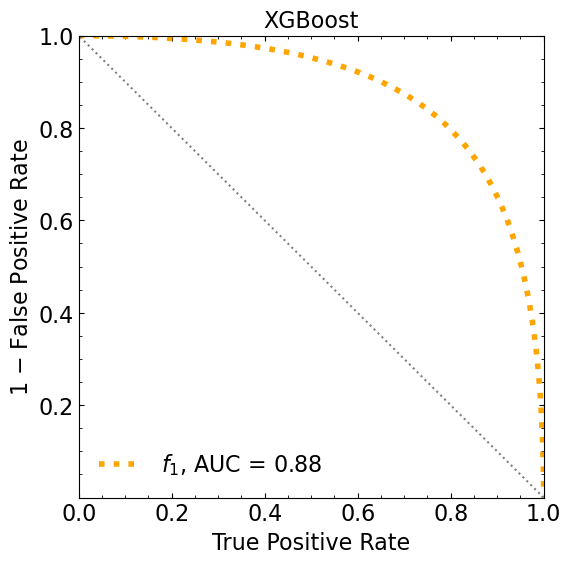

ML iteration  8
[0]	validation_0-logloss:0.66959	validation_1-logloss:0.67064


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64878	validation_1-logloss:0.65063
[2]	validation_0-logloss:0.63032	validation_1-logloss:0.63303
[3]	validation_0-logloss:0.61386	validation_1-logloss:0.61734
[4]	validation_0-logloss:0.59924	validation_1-logloss:0.60327
[5]	validation_0-logloss:0.58599	validation_1-logloss:0.59065
[6]	validation_0-logloss:0.57396	validation_1-logloss:0.57923
[7]	validation_0-logloss:0.56314	validation_1-logloss:0.56895
[8]	validation_0-logloss:0.55313	validation_1-logloss:0.55958
[9]	validation_0-logloss:0.54402	validation_1-logloss:0.55092
[10]	validation_0-logloss:0.53573	validation_1-logloss:0.54318
[11]	validation_0-logloss:0.52818	validation_1-logloss:0.53597
[12]	validation_0-logloss:0.52109	validation_1-logloss:0.52936
[13]	validation_0-logloss:0.51466	validation_1-logloss:0.52338
[14]	validation_0-logloss:0.50859	validation_1-logloss:0.51769
[15]	validation_0-logloss:0.50306	validation_1-logloss:0.51255
[16]	validation_0-logloss:0.49790	validation_1-logloss:0.50780
[

[131]	validation_0-logloss:0.40249	validation_1-logloss:0.43192
[132]	validation_0-logloss:0.40237	validation_1-logloss:0.43191
[133]	validation_0-logloss:0.40223	validation_1-logloss:0.43192
[134]	validation_0-logloss:0.40205	validation_1-logloss:0.43192
[135]	validation_0-logloss:0.40201	validation_1-logloss:0.43192
[136]	validation_0-logloss:0.40196	validation_1-logloss:0.43193
[137]	validation_0-logloss:0.40188	validation_1-logloss:0.43193
[138]	validation_0-logloss:0.40172	validation_1-logloss:0.43193
[139]	validation_0-logloss:0.40165	validation_1-logloss:0.43192
[140]	validation_0-logloss:0.40158	validation_1-logloss:0.43192
[141]	validation_0-logloss:0.40150	validation_1-logloss:0.43192
[142]	validation_0-logloss:0.40142	validation_1-logloss:0.43192
[143]	validation_0-logloss:0.40136	validation_1-logloss:0.43192
[144]	validation_0-logloss:0.40123	validation_1-logloss:0.43193
[145]	validation_0-logloss:0.40117	validation_1-logloss:0.43193
[146]	validation_0-logloss:0.40105	valid

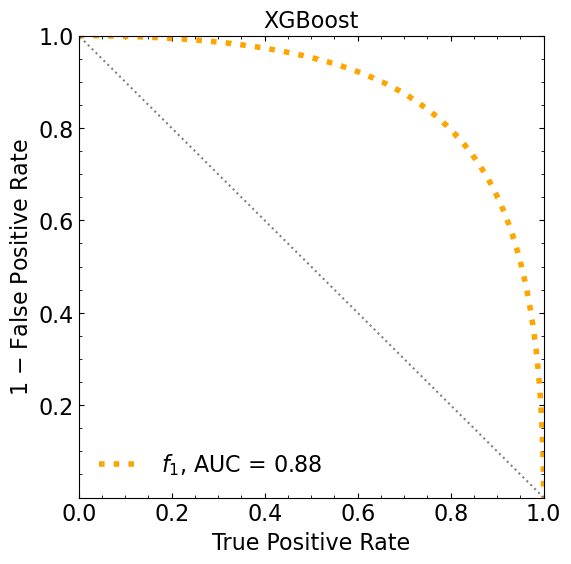

ML iteration  9
[0]	validation_0-logloss:0.67001	validation_1-logloss:0.67077


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64955	validation_1-logloss:0.65099
[2]	validation_0-logloss:0.63148	validation_1-logloss:0.63351
[3]	validation_0-logloss:0.61524	validation_1-logloss:0.61785
[4]	validation_0-logloss:0.60068	validation_1-logloss:0.60390
[5]	validation_0-logloss:0.58748	validation_1-logloss:0.59115
[6]	validation_0-logloss:0.57560	validation_1-logloss:0.57977
[7]	validation_0-logloss:0.56478	validation_1-logloss:0.56946
[8]	validation_0-logloss:0.55483	validation_1-logloss:0.56002
[9]	validation_0-logloss:0.54574	validation_1-logloss:0.55149
[10]	validation_0-logloss:0.53751	validation_1-logloss:0.54374
[11]	validation_0-logloss:0.52990	validation_1-logloss:0.53653
[12]	validation_0-logloss:0.52281	validation_1-logloss:0.52981
[13]	validation_0-logloss:0.51629	validation_1-logloss:0.52373
[14]	validation_0-logloss:0.51026	validation_1-logloss:0.51813
[15]	validation_0-logloss:0.50468	validation_1-logloss:0.51291
[16]	validation_0-logloss:0.49949	validation_1-logloss:0.50814
[

[131]	validation_0-logloss:0.40426	validation_1-logloss:0.43221
[132]	validation_0-logloss:0.40416	validation_1-logloss:0.43220
[133]	validation_0-logloss:0.40410	validation_1-logloss:0.43220
[134]	validation_0-logloss:0.40400	validation_1-logloss:0.43219
[135]	validation_0-logloss:0.40397	validation_1-logloss:0.43219
[136]	validation_0-logloss:0.40383	validation_1-logloss:0.43217
[137]	validation_0-logloss:0.40378	validation_1-logloss:0.43218
[138]	validation_0-logloss:0.40366	validation_1-logloss:0.43217
[139]	validation_0-logloss:0.40355	validation_1-logloss:0.43216
[140]	validation_0-logloss:0.40347	validation_1-logloss:0.43215
[141]	validation_0-logloss:0.40342	validation_1-logloss:0.43215
[142]	validation_0-logloss:0.40333	validation_1-logloss:0.43215
[143]	validation_0-logloss:0.40326	validation_1-logloss:0.43215
[144]	validation_0-logloss:0.40317	validation_1-logloss:0.43214
[145]	validation_0-logloss:0.40310	validation_1-logloss:0.43213
[146]	validation_0-logloss:0.40306	valid

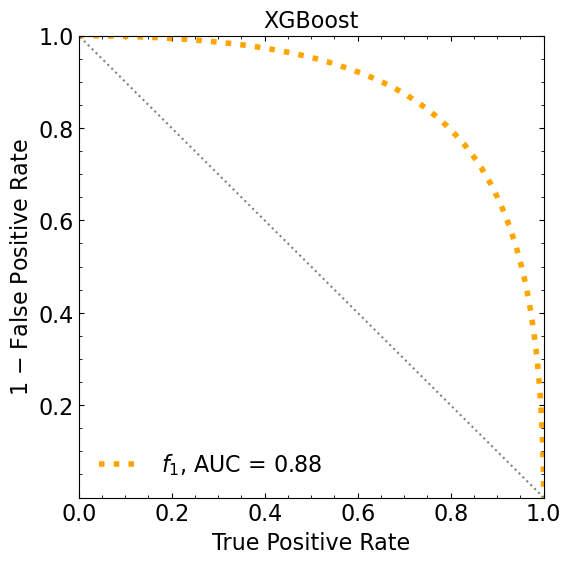

Classification score (1 ML):


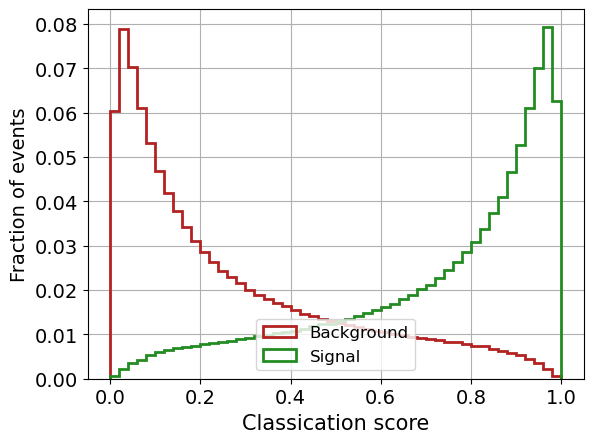

Classification score (10 ML):


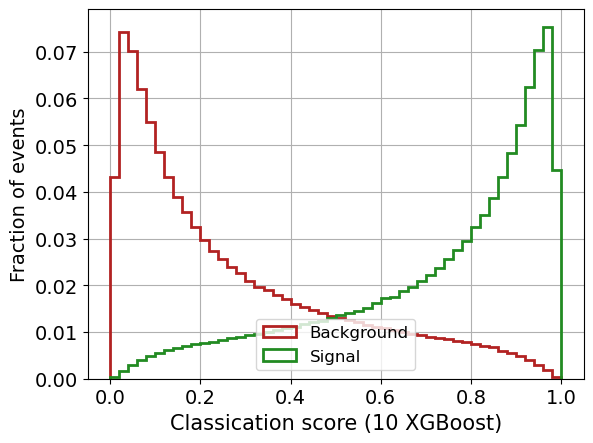

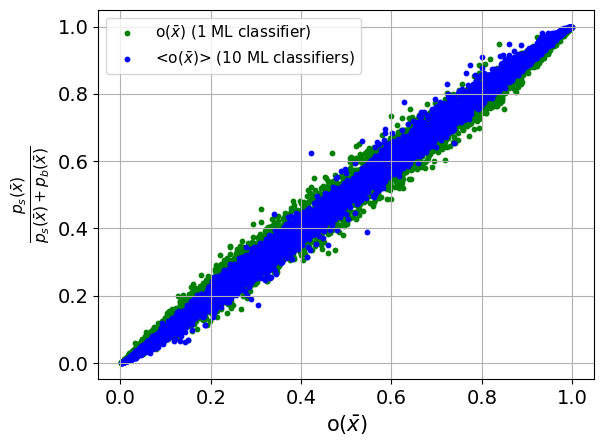


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [33]:
dim=8

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7, signal_X_8 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7, background_X_8 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))
dim8 = np.concatenate((background_X_8,signal_X_8))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['dim8'] = dim8.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7','dim8']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)




print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


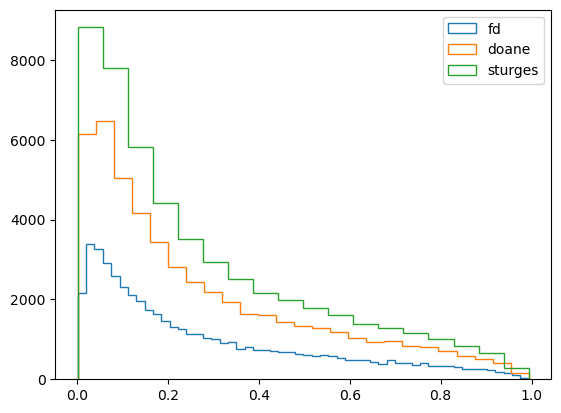

fd 54
doane 25
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  54


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  25
doing Nbin:  18


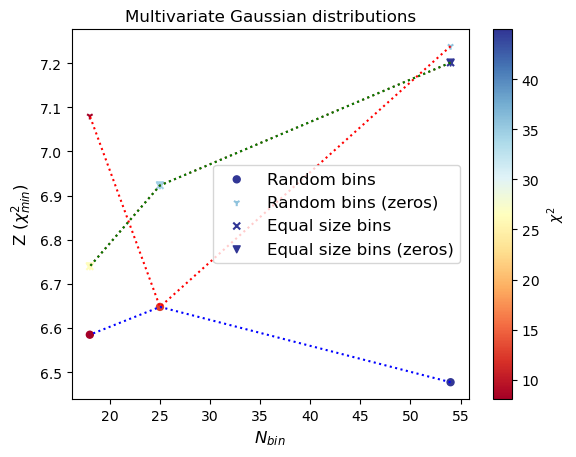

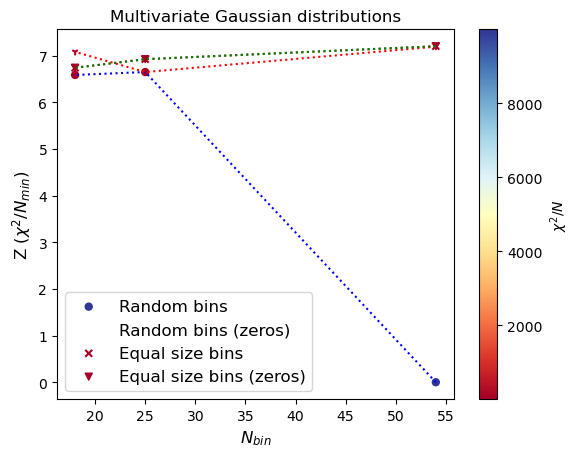

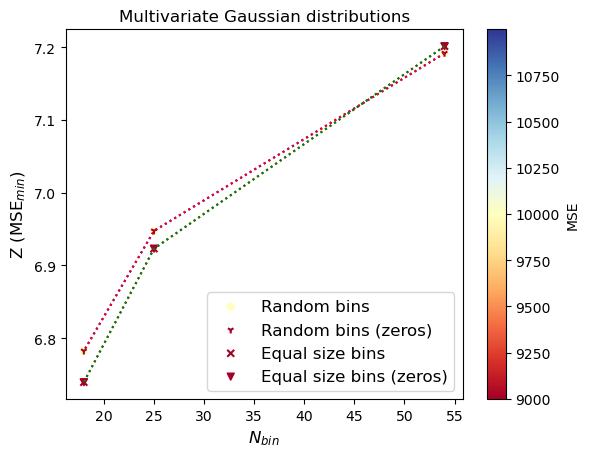

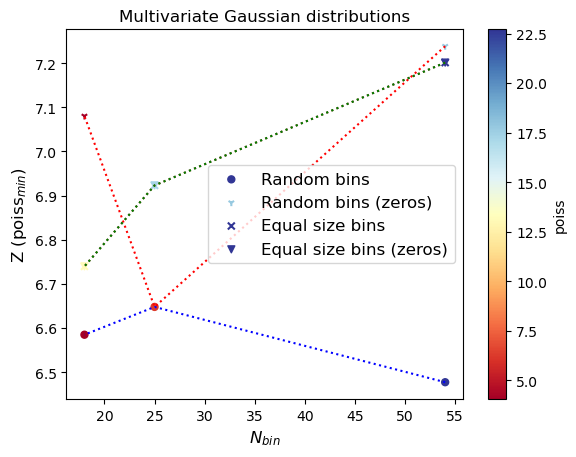

In [34]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 9)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 9)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 9)
y_gauss_test :  (2000000, 1)



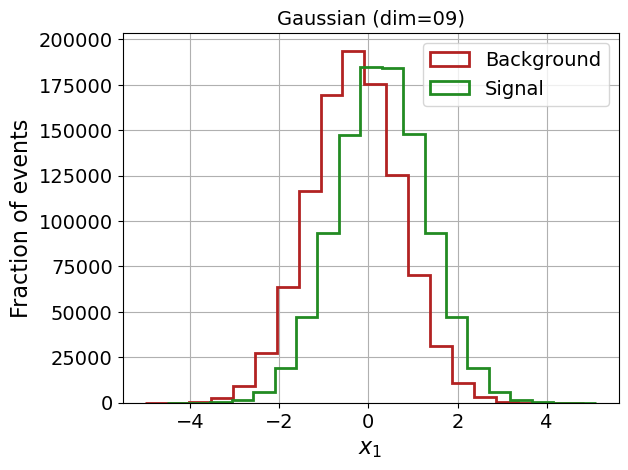

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67081	validation_1-logloss:0.67097
[1]	validation_0-logloss:0.65057	validation_1-logloss:0.65077
[2]	validation_0-logloss:0.63253	validation_1-logloss:0.63287
[3]	validation_0-logloss:0.61650	validation_1-logloss:0.61695
[4]	validation_0-logloss:0.60209	validation_1-logloss:0.60264
[5]	validation_0-logloss:0.58893	validation_1-logloss:0.58957
[6]	validation_0-logloss:0.57700	validation_1-logloss:0.57775
[7]	validation_0-logloss:0.56610	validation_1-logloss:0.56696
[8]	validation_0-logloss:0.55614	validation_1-logloss:0.55706
[9]	validation_0-logloss:0.54695	validation_1-logloss:0.54792
[10]	validation_0-logloss:0.53849	validation_1-logloss:0.53953
[11]	validation_0-logloss:0.53066	validation_1-logloss:0.53176
[12]	validation_0-logloss:0.52337	validation_1-logloss:0.52456
[13]	validation_0-logloss:0.51672	validation_1-logloss:0.51796
[14]	validation_0-logloss:0.51054	validation_1-logloss:0.51184
[15]	validation_0-logloss:0.50479	validation_1-logloss:0.50617
[1

[130]	validation_0-logloss:0.40128	validation_1-logloss:0.40519
[131]	validation_0-logloss:0.40123	validation_1-logloss:0.40516
[132]	validation_0-logloss:0.40118	validation_1-logloss:0.40512
[133]	validation_0-logloss:0.40113	validation_1-logloss:0.40508
[134]	validation_0-logloss:0.40108	validation_1-logloss:0.40505
[135]	validation_0-logloss:0.40104	validation_1-logloss:0.40501
[136]	validation_0-logloss:0.40100	validation_1-logloss:0.40498
[137]	validation_0-logloss:0.40096	validation_1-logloss:0.40495
[138]	validation_0-logloss:0.40092	validation_1-logloss:0.40492
[139]	validation_0-logloss:0.40087	validation_1-logloss:0.40489
[140]	validation_0-logloss:0.40083	validation_1-logloss:0.40486
[141]	validation_0-logloss:0.40079	validation_1-logloss:0.40483
[142]	validation_0-logloss:0.40076	validation_1-logloss:0.40481
[143]	validation_0-logloss:0.40071	validation_1-logloss:0.40478
[144]	validation_0-logloss:0.40068	validation_1-logloss:0.40475
[145]	validation_0-logloss:0.40065	valid

[259]	validation_0-logloss:0.39905	validation_1-logloss:0.40410
[260]	validation_0-logloss:0.39904	validation_1-logloss:0.40409
[261]	validation_0-logloss:0.39904	validation_1-logloss:0.40409
[262]	validation_0-logloss:0.39904	validation_1-logloss:0.40409
[263]	validation_0-logloss:0.39903	validation_1-logloss:0.40409
[264]	validation_0-logloss:0.39902	validation_1-logloss:0.40409
[265]	validation_0-logloss:0.39902	validation_1-logloss:0.40410
[266]	validation_0-logloss:0.39901	validation_1-logloss:0.40410
[267]	validation_0-logloss:0.39901	validation_1-logloss:0.40410
[268]	validation_0-logloss:0.39899	validation_1-logloss:0.40409
[269]	validation_0-logloss:0.39899	validation_1-logloss:0.40409
[270]	validation_0-logloss:0.39897	validation_1-logloss:0.40409
[271]	validation_0-logloss:0.39897	validation_1-logloss:0.40409
[272]	validation_0-logloss:0.39896	validation_1-logloss:0.40409
[273]	validation_0-logloss:0.39896	validation_1-logloss:0.40409
[274]	validation_0-logloss:0.39896	valid

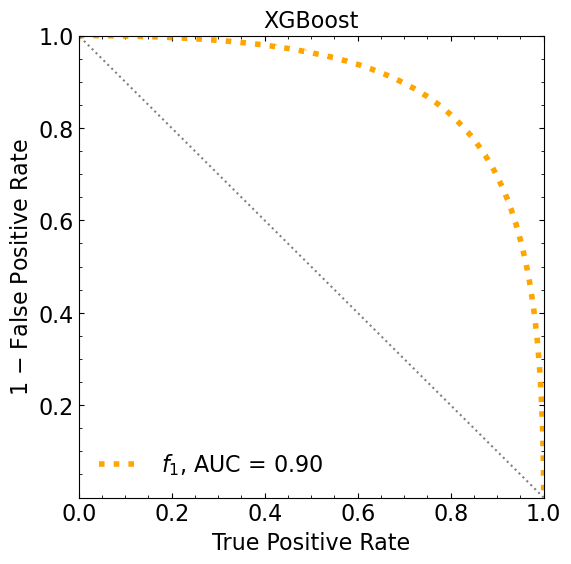

ML iteration 0
[0]	validation_0-logloss:0.66911	validation_1-logloss:0.67038


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64781	validation_1-logloss:0.65004
[2]	validation_0-logloss:0.62881	validation_1-logloss:0.63193
[3]	validation_0-logloss:0.61185	validation_1-logloss:0.61576
[4]	validation_0-logloss:0.59656	validation_1-logloss:0.60119
[5]	validation_0-logloss:0.58282	validation_1-logloss:0.58814
[6]	validation_0-logloss:0.57012	validation_1-logloss:0.57613
[7]	validation_0-logloss:0.55857	validation_1-logloss:0.56514
[8]	validation_0-logloss:0.54789	validation_1-logloss:0.55510
[9]	validation_0-logloss:0.53813	validation_1-logloss:0.54591
[10]	validation_0-logloss:0.52911	validation_1-logloss:0.53752
[11]	validation_0-logloss:0.52089	validation_1-logloss:0.52980
[12]	validation_0-logloss:0.51323	validation_1-logloss:0.52261
[13]	validation_0-logloss:0.50601	validation_1-logloss:0.51597
[14]	validation_0-logloss:0.49932	validation_1-logloss:0.50979
[15]	validation_0-logloss:0.49317	validation_1-logloss:0.50413
[16]	validation_0-logloss:0.48743	validation_1-logloss:0.49882
[

[131]	validation_0-logloss:0.37605	validation_1-logloss:0.40870
[132]	validation_0-logloss:0.37589	validation_1-logloss:0.40870
[133]	validation_0-logloss:0.37574	validation_1-logloss:0.40867
[134]	validation_0-logloss:0.37564	validation_1-logloss:0.40867
[135]	validation_0-logloss:0.37553	validation_1-logloss:0.40866
[136]	validation_0-logloss:0.37538	validation_1-logloss:0.40866
[137]	validation_0-logloss:0.37522	validation_1-logloss:0.40865
[138]	validation_0-logloss:0.37509	validation_1-logloss:0.40865
[139]	validation_0-logloss:0.37497	validation_1-logloss:0.40863
[140]	validation_0-logloss:0.37485	validation_1-logloss:0.40862
[141]	validation_0-logloss:0.37473	validation_1-logloss:0.40862
[142]	validation_0-logloss:0.37460	validation_1-logloss:0.40861
[143]	validation_0-logloss:0.37452	validation_1-logloss:0.40860
[144]	validation_0-logloss:0.37444	validation_1-logloss:0.40860
[145]	validation_0-logloss:0.37433	validation_1-logloss:0.40859
[146]	validation_0-logloss:0.37418	valid

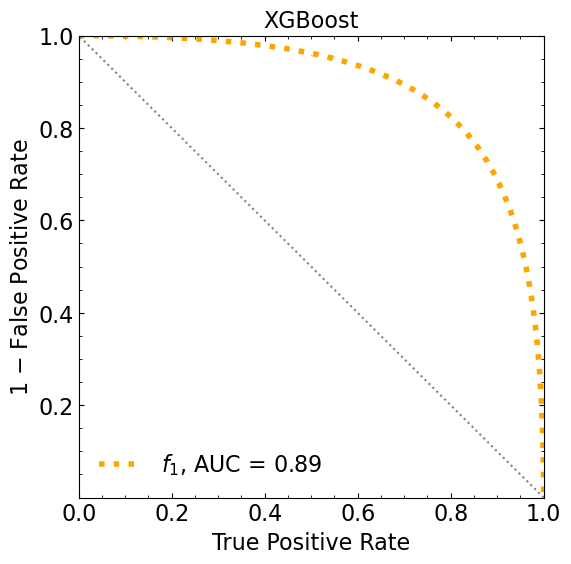

ML iteration  1
[0]	validation_0-logloss:0.66962	validation_1-logloss:0.67055


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64843	validation_1-logloss:0.65021
[2]	validation_0-logloss:0.62961	validation_1-logloss:0.63215
[3]	validation_0-logloss:0.61264	validation_1-logloss:0.61590
[4]	validation_0-logloss:0.59743	validation_1-logloss:0.60135
[5]	validation_0-logloss:0.58362	validation_1-logloss:0.58823
[6]	validation_0-logloss:0.57098	validation_1-logloss:0.57617
[7]	validation_0-logloss:0.55949	validation_1-logloss:0.56520
[8]	validation_0-logloss:0.54898	validation_1-logloss:0.55524
[9]	validation_0-logloss:0.53936	validation_1-logloss:0.54621
[10]	validation_0-logloss:0.53038	validation_1-logloss:0.53773
[11]	validation_0-logloss:0.52219	validation_1-logloss:0.53001
[12]	validation_0-logloss:0.51463	validation_1-logloss:0.52293
[13]	validation_0-logloss:0.50755	validation_1-logloss:0.51643
[14]	validation_0-logloss:0.50095	validation_1-logloss:0.51027
[15]	validation_0-logloss:0.49491	validation_1-logloss:0.50469
[16]	validation_0-logloss:0.48931	validation_1-logloss:0.49946
[

[131]	validation_0-logloss:0.37704	validation_1-logloss:0.40880
[132]	validation_0-logloss:0.37694	validation_1-logloss:0.40878
[133]	validation_0-logloss:0.37683	validation_1-logloss:0.40877
[134]	validation_0-logloss:0.37672	validation_1-logloss:0.40876
[135]	validation_0-logloss:0.37660	validation_1-logloss:0.40876
[136]	validation_0-logloss:0.37643	validation_1-logloss:0.40874
[137]	validation_0-logloss:0.37625	validation_1-logloss:0.40873
[138]	validation_0-logloss:0.37613	validation_1-logloss:0.40871
[139]	validation_0-logloss:0.37601	validation_1-logloss:0.40871
[140]	validation_0-logloss:0.37597	validation_1-logloss:0.40871
[141]	validation_0-logloss:0.37579	validation_1-logloss:0.40869
[142]	validation_0-logloss:0.37568	validation_1-logloss:0.40868
[143]	validation_0-logloss:0.37559	validation_1-logloss:0.40867
[144]	validation_0-logloss:0.37549	validation_1-logloss:0.40867
[145]	validation_0-logloss:0.37536	validation_1-logloss:0.40866
[146]	validation_0-logloss:0.37533	valid

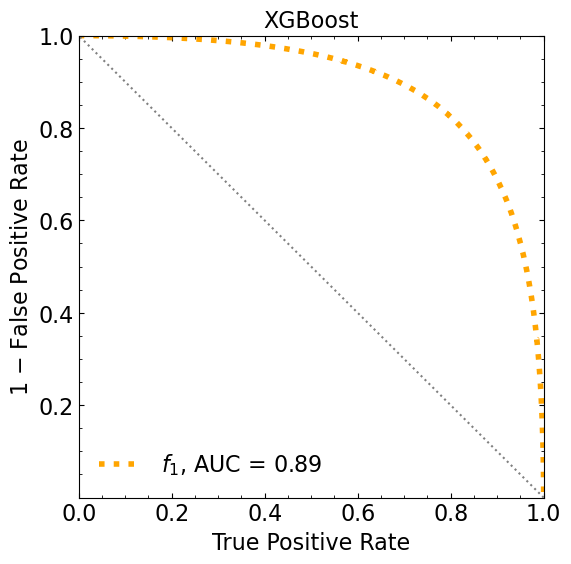

ML iteration  2
[0]	validation_0-logloss:0.66921	validation_1-logloss:0.67042


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64791	validation_1-logloss:0.65005
[2]	validation_0-logloss:0.62910	validation_1-logloss:0.63207
[3]	validation_0-logloss:0.61180	validation_1-logloss:0.61580
[4]	validation_0-logloss:0.59653	validation_1-logloss:0.60127
[5]	validation_0-logloss:0.58245	validation_1-logloss:0.58785
[6]	validation_0-logloss:0.56974	validation_1-logloss:0.57589
[7]	validation_0-logloss:0.55828	validation_1-logloss:0.56503
[8]	validation_0-logloss:0.54768	validation_1-logloss:0.55502
[9]	validation_0-logloss:0.53788	validation_1-logloss:0.54581
[10]	validation_0-logloss:0.52890	validation_1-logloss:0.53750
[11]	validation_0-logloss:0.52051	validation_1-logloss:0.52962
[12]	validation_0-logloss:0.51274	validation_1-logloss:0.52235
[13]	validation_0-logloss:0.50571	validation_1-logloss:0.51579
[14]	validation_0-logloss:0.49898	validation_1-logloss:0.50950
[15]	validation_0-logloss:0.49285	validation_1-logloss:0.50380
[16]	validation_0-logloss:0.48707	validation_1-logloss:0.49851
[

[131]	validation_0-logloss:0.37378	validation_1-logloss:0.40865
[132]	validation_0-logloss:0.37367	validation_1-logloss:0.40864
[133]	validation_0-logloss:0.37351	validation_1-logloss:0.40862
[134]	validation_0-logloss:0.37334	validation_1-logloss:0.40862
[135]	validation_0-logloss:0.37319	validation_1-logloss:0.40860
[136]	validation_0-logloss:0.37301	validation_1-logloss:0.40860
[137]	validation_0-logloss:0.37289	validation_1-logloss:0.40859
[138]	validation_0-logloss:0.37278	validation_1-logloss:0.40859
[139]	validation_0-logloss:0.37267	validation_1-logloss:0.40858
[140]	validation_0-logloss:0.37252	validation_1-logloss:0.40858
[141]	validation_0-logloss:0.37242	validation_1-logloss:0.40858
[142]	validation_0-logloss:0.37227	validation_1-logloss:0.40859
[143]	validation_0-logloss:0.37212	validation_1-logloss:0.40858
[144]	validation_0-logloss:0.37202	validation_1-logloss:0.40858
[145]	validation_0-logloss:0.37188	validation_1-logloss:0.40858
[146]	validation_0-logloss:0.37177	valid

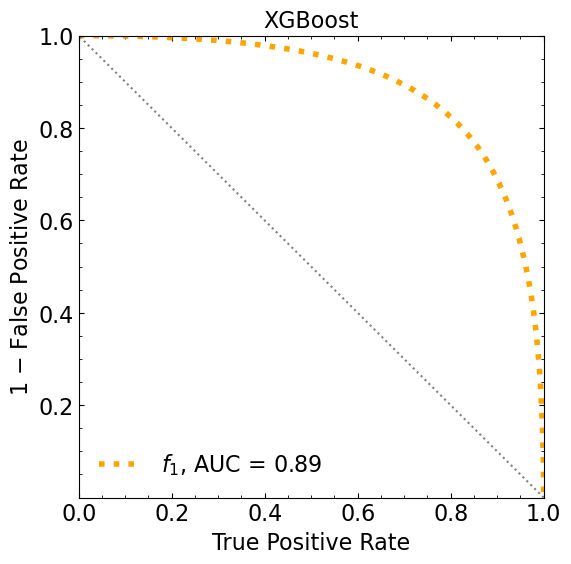

ML iteration  3
[0]	validation_0-logloss:0.66933	validation_1-logloss:0.67050


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64828	validation_1-logloss:0.65024
[2]	validation_0-logloss:0.62940	validation_1-logloss:0.63226
[3]	validation_0-logloss:0.61242	validation_1-logloss:0.61602
[4]	validation_0-logloss:0.59723	validation_1-logloss:0.60148
[5]	validation_0-logloss:0.58330	validation_1-logloss:0.58833
[6]	validation_0-logloss:0.57088	validation_1-logloss:0.57652
[7]	validation_0-logloss:0.55938	validation_1-logloss:0.56558
[8]	validation_0-logloss:0.54884	validation_1-logloss:0.55563
[9]	validation_0-logloss:0.53911	validation_1-logloss:0.54653
[10]	validation_0-logloss:0.53016	validation_1-logloss:0.53806
[11]	validation_0-logloss:0.52189	validation_1-logloss:0.53028
[12]	validation_0-logloss:0.51427	validation_1-logloss:0.52311
[13]	validation_0-logloss:0.50712	validation_1-logloss:0.51648
[14]	validation_0-logloss:0.50048	validation_1-logloss:0.51032
[15]	validation_0-logloss:0.49427	validation_1-logloss:0.50457
[16]	validation_0-logloss:0.48856	validation_1-logloss:0.49924
[

[131]	validation_0-logloss:0.37637	validation_1-logloss:0.40870
[132]	validation_0-logloss:0.37623	validation_1-logloss:0.40868
[133]	validation_0-logloss:0.37612	validation_1-logloss:0.40867
[134]	validation_0-logloss:0.37592	validation_1-logloss:0.40865
[135]	validation_0-logloss:0.37578	validation_1-logloss:0.40864
[136]	validation_0-logloss:0.37563	validation_1-logloss:0.40862
[137]	validation_0-logloss:0.37552	validation_1-logloss:0.40861
[138]	validation_0-logloss:0.37546	validation_1-logloss:0.40861
[139]	validation_0-logloss:0.37537	validation_1-logloss:0.40860
[140]	validation_0-logloss:0.37520	validation_1-logloss:0.40860
[141]	validation_0-logloss:0.37515	validation_1-logloss:0.40860
[142]	validation_0-logloss:0.37501	validation_1-logloss:0.40860
[143]	validation_0-logloss:0.37484	validation_1-logloss:0.40860
[144]	validation_0-logloss:0.37476	validation_1-logloss:0.40859
[145]	validation_0-logloss:0.37467	validation_1-logloss:0.40859
[146]	validation_0-logloss:0.37457	valid

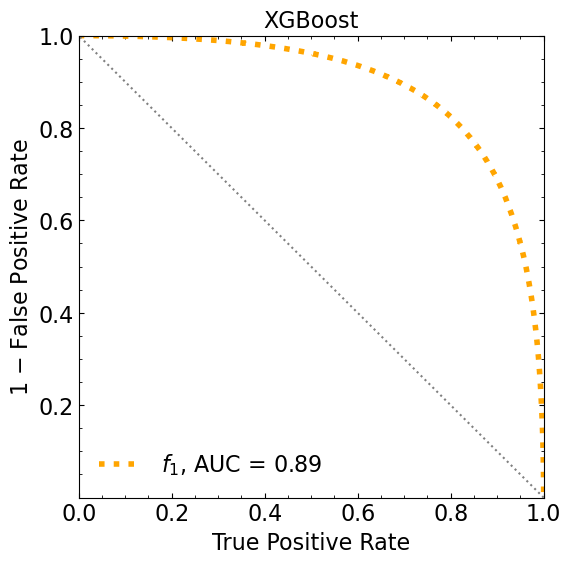

ML iteration  4
[0]	validation_0-logloss:0.66935	validation_1-logloss:0.67045


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64803	validation_1-logloss:0.65000
[2]	validation_0-logloss:0.62909	validation_1-logloss:0.63190
[3]	validation_0-logloss:0.61206	validation_1-logloss:0.61564
[4]	validation_0-logloss:0.59660	validation_1-logloss:0.60104
[5]	validation_0-logloss:0.58263	validation_1-logloss:0.58780
[6]	validation_0-logloss:0.56996	validation_1-logloss:0.57588
[7]	validation_0-logloss:0.55838	validation_1-logloss:0.56502
[8]	validation_0-logloss:0.54767	validation_1-logloss:0.55495
[9]	validation_0-logloss:0.53797	validation_1-logloss:0.54578
[10]	validation_0-logloss:0.52910	validation_1-logloss:0.53744
[11]	validation_0-logloss:0.52089	validation_1-logloss:0.52970
[12]	validation_0-logloss:0.51322	validation_1-logloss:0.52253
[13]	validation_0-logloss:0.50610	validation_1-logloss:0.51584
[14]	validation_0-logloss:0.49951	validation_1-logloss:0.50976
[15]	validation_0-logloss:0.49333	validation_1-logloss:0.50406
[16]	validation_0-logloss:0.48766	validation_1-logloss:0.49878
[

[131]	validation_0-logloss:0.37596	validation_1-logloss:0.40855
[132]	validation_0-logloss:0.37585	validation_1-logloss:0.40852
[133]	validation_0-logloss:0.37572	validation_1-logloss:0.40851
[134]	validation_0-logloss:0.37566	validation_1-logloss:0.40850
[135]	validation_0-logloss:0.37549	validation_1-logloss:0.40849
[136]	validation_0-logloss:0.37538	validation_1-logloss:0.40847
[137]	validation_0-logloss:0.37523	validation_1-logloss:0.40847
[138]	validation_0-logloss:0.37506	validation_1-logloss:0.40846
[139]	validation_0-logloss:0.37491	validation_1-logloss:0.40845
[140]	validation_0-logloss:0.37481	validation_1-logloss:0.40843
[141]	validation_0-logloss:0.37469	validation_1-logloss:0.40842
[142]	validation_0-logloss:0.37455	validation_1-logloss:0.40842
[143]	validation_0-logloss:0.37447	validation_1-logloss:0.40842
[144]	validation_0-logloss:0.37431	validation_1-logloss:0.40841
[145]	validation_0-logloss:0.37422	validation_1-logloss:0.40841
[146]	validation_0-logloss:0.37408	valid

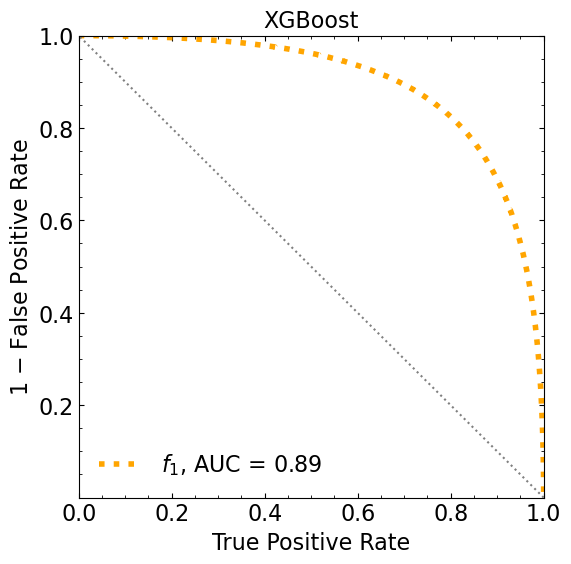

ML iteration  5
[0]	validation_0-logloss:0.66950	validation_1-logloss:0.67043


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64834	validation_1-logloss:0.65010
[2]	validation_0-logloss:0.62972	validation_1-logloss:0.63225
[3]	validation_0-logloss:0.61286	validation_1-logloss:0.61608
[4]	validation_0-logloss:0.59778	validation_1-logloss:0.60164
[5]	validation_0-logloss:0.58384	validation_1-logloss:0.58837
[6]	validation_0-logloss:0.57111	validation_1-logloss:0.57630
[7]	validation_0-logloss:0.55953	validation_1-logloss:0.56528
[8]	validation_0-logloss:0.54909	validation_1-logloss:0.55533
[9]	validation_0-logloss:0.53932	validation_1-logloss:0.54614
[10]	validation_0-logloss:0.53039	validation_1-logloss:0.53773
[11]	validation_0-logloss:0.52211	validation_1-logloss:0.52988
[12]	validation_0-logloss:0.51450	validation_1-logloss:0.52277
[13]	validation_0-logloss:0.50733	validation_1-logloss:0.51617
[14]	validation_0-logloss:0.50071	validation_1-logloss:0.51007
[15]	validation_0-logloss:0.49452	validation_1-logloss:0.50427
[16]	validation_0-logloss:0.48883	validation_1-logloss:0.49896
[

[131]	validation_0-logloss:0.37783	validation_1-logloss:0.40875
[132]	validation_0-logloss:0.37775	validation_1-logloss:0.40874
[133]	validation_0-logloss:0.37764	validation_1-logloss:0.40874
[134]	validation_0-logloss:0.37757	validation_1-logloss:0.40872
[135]	validation_0-logloss:0.37741	validation_1-logloss:0.40870
[136]	validation_0-logloss:0.37726	validation_1-logloss:0.40869
[137]	validation_0-logloss:0.37718	validation_1-logloss:0.40868
[138]	validation_0-logloss:0.37698	validation_1-logloss:0.40866
[139]	validation_0-logloss:0.37684	validation_1-logloss:0.40864
[140]	validation_0-logloss:0.37676	validation_1-logloss:0.40864
[141]	validation_0-logloss:0.37666	validation_1-logloss:0.40863
[142]	validation_0-logloss:0.37653	validation_1-logloss:0.40862
[143]	validation_0-logloss:0.37647	validation_1-logloss:0.40862
[144]	validation_0-logloss:0.37638	validation_1-logloss:0.40862
[145]	validation_0-logloss:0.37623	validation_1-logloss:0.40860
[146]	validation_0-logloss:0.37614	valid

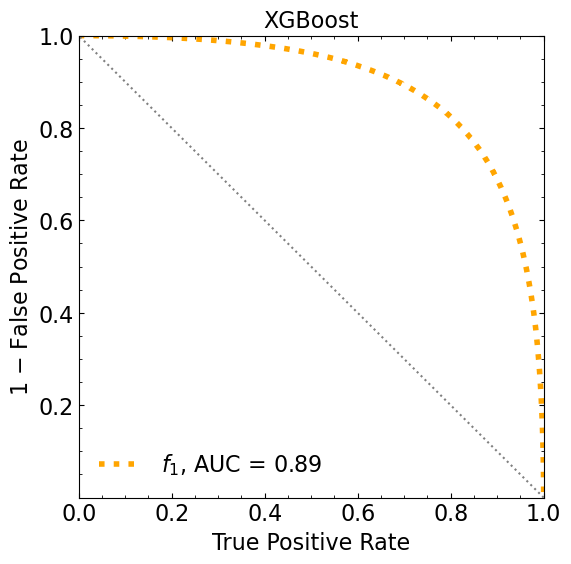

ML iteration  6
[0]	validation_0-logloss:0.66924	validation_1-logloss:0.67048


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64791	validation_1-logloss:0.65020
[2]	validation_0-logloss:0.62903	validation_1-logloss:0.63213
[3]	validation_0-logloss:0.61210	validation_1-logloss:0.61591
[4]	validation_0-logloss:0.59684	validation_1-logloss:0.60143
[5]	validation_0-logloss:0.58287	validation_1-logloss:0.58823
[6]	validation_0-logloss:0.57030	validation_1-logloss:0.57628
[7]	validation_0-logloss:0.55885	validation_1-logloss:0.56550
[8]	validation_0-logloss:0.54833	validation_1-logloss:0.55547
[9]	validation_0-logloss:0.53878	validation_1-logloss:0.54635
[10]	validation_0-logloss:0.52991	validation_1-logloss:0.53799
[11]	validation_0-logloss:0.52167	validation_1-logloss:0.53026
[12]	validation_0-logloss:0.51409	validation_1-logloss:0.52312
[13]	validation_0-logloss:0.50696	validation_1-logloss:0.51648
[14]	validation_0-logloss:0.50040	validation_1-logloss:0.51037
[15]	validation_0-logloss:0.49427	validation_1-logloss:0.50458
[16]	validation_0-logloss:0.48856	validation_1-logloss:0.49930
[

[131]	validation_0-logloss:0.37792	validation_1-logloss:0.40848
[132]	validation_0-logloss:0.37780	validation_1-logloss:0.40847
[133]	validation_0-logloss:0.37768	validation_1-logloss:0.40846
[134]	validation_0-logloss:0.37758	validation_1-logloss:0.40845
[135]	validation_0-logloss:0.37748	validation_1-logloss:0.40844
[136]	validation_0-logloss:0.37736	validation_1-logloss:0.40843
[137]	validation_0-logloss:0.37722	validation_1-logloss:0.40841
[138]	validation_0-logloss:0.37709	validation_1-logloss:0.40840
[139]	validation_0-logloss:0.37700	validation_1-logloss:0.40839
[140]	validation_0-logloss:0.37687	validation_1-logloss:0.40837
[141]	validation_0-logloss:0.37676	validation_1-logloss:0.40837
[142]	validation_0-logloss:0.37669	validation_1-logloss:0.40835
[143]	validation_0-logloss:0.37657	validation_1-logloss:0.40833
[144]	validation_0-logloss:0.37650	validation_1-logloss:0.40832
[145]	validation_0-logloss:0.37636	validation_1-logloss:0.40831
[146]	validation_0-logloss:0.37619	valid

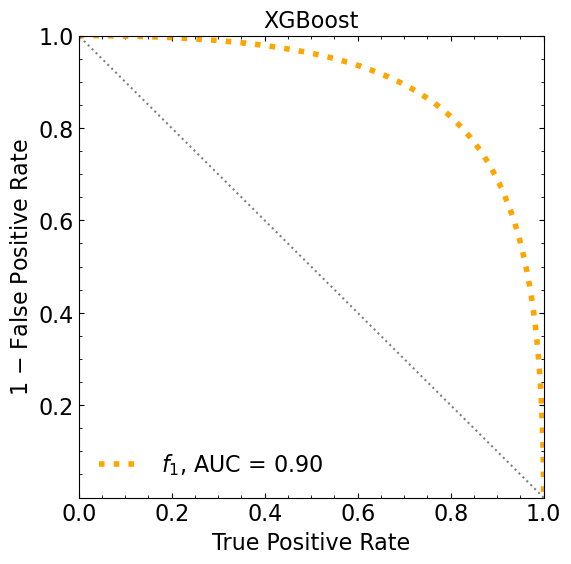

ML iteration  7
[0]	validation_0-logloss:0.66955	validation_1-logloss:0.67052


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64851	validation_1-logloss:0.65026
[2]	validation_0-logloss:0.62984	validation_1-logloss:0.63229
[3]	validation_0-logloss:0.61308	validation_1-logloss:0.61625
[4]	validation_0-logloss:0.59798	validation_1-logloss:0.60171
[5]	validation_0-logloss:0.58438	validation_1-logloss:0.58872
[6]	validation_0-logloss:0.57187	validation_1-logloss:0.57676
[7]	validation_0-logloss:0.56041	validation_1-logloss:0.56581
[8]	validation_0-logloss:0.55005	validation_1-logloss:0.55583
[9]	validation_0-logloss:0.54039	validation_1-logloss:0.54669
[10]	validation_0-logloss:0.53159	validation_1-logloss:0.53831
[11]	validation_0-logloss:0.52341	validation_1-logloss:0.53051
[12]	validation_0-logloss:0.51588	validation_1-logloss:0.52335
[13]	validation_0-logloss:0.50890	validation_1-logloss:0.51679
[14]	validation_0-logloss:0.50232	validation_1-logloss:0.51076
[15]	validation_0-logloss:0.49627	validation_1-logloss:0.50514
[16]	validation_0-logloss:0.49064	validation_1-logloss:0.49982
[

[131]	validation_0-logloss:0.37958	validation_1-logloss:0.40875
[132]	validation_0-logloss:0.37944	validation_1-logloss:0.40873
[133]	validation_0-logloss:0.37928	validation_1-logloss:0.40871
[134]	validation_0-logloss:0.37916	validation_1-logloss:0.40870
[135]	validation_0-logloss:0.37907	validation_1-logloss:0.40868
[136]	validation_0-logloss:0.37897	validation_1-logloss:0.40867
[137]	validation_0-logloss:0.37885	validation_1-logloss:0.40866
[138]	validation_0-logloss:0.37874	validation_1-logloss:0.40866
[139]	validation_0-logloss:0.37866	validation_1-logloss:0.40864
[140]	validation_0-logloss:0.37860	validation_1-logloss:0.40864
[141]	validation_0-logloss:0.37846	validation_1-logloss:0.40864
[142]	validation_0-logloss:0.37836	validation_1-logloss:0.40863
[143]	validation_0-logloss:0.37819	validation_1-logloss:0.40861
[144]	validation_0-logloss:0.37808	validation_1-logloss:0.40860
[145]	validation_0-logloss:0.37797	validation_1-logloss:0.40859
[146]	validation_0-logloss:0.37788	valid

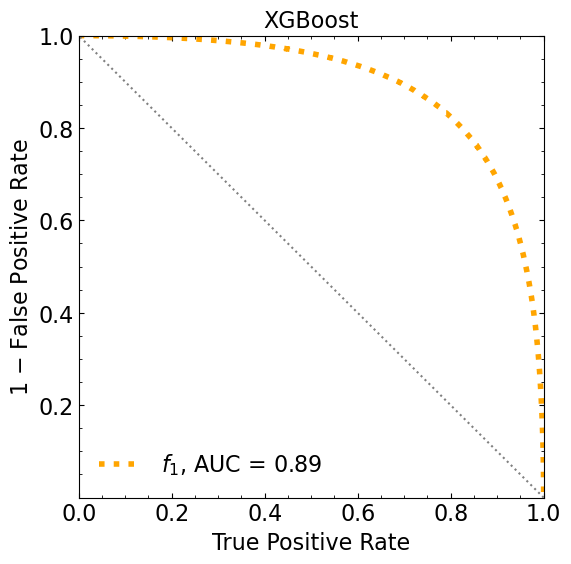

ML iteration  8
[0]	validation_0-logloss:0.66924	validation_1-logloss:0.67032


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64810	validation_1-logloss:0.64999
[2]	validation_0-logloss:0.62924	validation_1-logloss:0.63189
[3]	validation_0-logloss:0.61240	validation_1-logloss:0.61568
[4]	validation_0-logloss:0.59722	validation_1-logloss:0.60114
[5]	validation_0-logloss:0.58335	validation_1-logloss:0.58791
[6]	validation_0-logloss:0.57060	validation_1-logloss:0.57585
[7]	validation_0-logloss:0.55906	validation_1-logloss:0.56491
[8]	validation_0-logloss:0.54850	validation_1-logloss:0.55493
[9]	validation_0-logloss:0.53870	validation_1-logloss:0.54574
[10]	validation_0-logloss:0.52982	validation_1-logloss:0.53741
[11]	validation_0-logloss:0.52164	validation_1-logloss:0.52976
[12]	validation_0-logloss:0.51392	validation_1-logloss:0.52258
[13]	validation_0-logloss:0.50694	validation_1-logloss:0.51597
[14]	validation_0-logloss:0.50040	validation_1-logloss:0.50992
[15]	validation_0-logloss:0.49435	validation_1-logloss:0.50434
[16]	validation_0-logloss:0.48854	validation_1-logloss:0.49899
[

[131]	validation_0-logloss:0.37657	validation_1-logloss:0.40860
[132]	validation_0-logloss:0.37640	validation_1-logloss:0.40858
[133]	validation_0-logloss:0.37624	validation_1-logloss:0.40859
[134]	validation_0-logloss:0.37610	validation_1-logloss:0.40857
[135]	validation_0-logloss:0.37595	validation_1-logloss:0.40856
[136]	validation_0-logloss:0.37582	validation_1-logloss:0.40855
[137]	validation_0-logloss:0.37570	validation_1-logloss:0.40854
[138]	validation_0-logloss:0.37558	validation_1-logloss:0.40854
[139]	validation_0-logloss:0.37545	validation_1-logloss:0.40853
[140]	validation_0-logloss:0.37529	validation_1-logloss:0.40853
[141]	validation_0-logloss:0.37515	validation_1-logloss:0.40852
[142]	validation_0-logloss:0.37499	validation_1-logloss:0.40851
[143]	validation_0-logloss:0.37494	validation_1-logloss:0.40850
[144]	validation_0-logloss:0.37482	validation_1-logloss:0.40849
[145]	validation_0-logloss:0.37474	validation_1-logloss:0.40850
[146]	validation_0-logloss:0.37462	valid

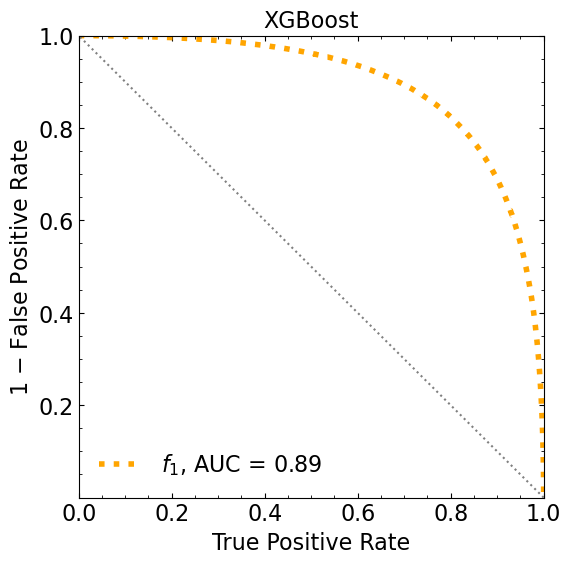

ML iteration  9
[0]	validation_0-logloss:0.66931	validation_1-logloss:0.67044


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64807	validation_1-logloss:0.65013
[2]	validation_0-logloss:0.62911	validation_1-logloss:0.63222
[3]	validation_0-logloss:0.61210	validation_1-logloss:0.61615
[4]	validation_0-logloss:0.59672	validation_1-logloss:0.60145
[5]	validation_0-logloss:0.58268	validation_1-logloss:0.58821
[6]	validation_0-logloss:0.56997	validation_1-logloss:0.57614
[7]	validation_0-logloss:0.55851	validation_1-logloss:0.56529
[8]	validation_0-logloss:0.54792	validation_1-logloss:0.55525
[9]	validation_0-logloss:0.53826	validation_1-logloss:0.54604
[10]	validation_0-logloss:0.52938	validation_1-logloss:0.53767
[11]	validation_0-logloss:0.52108	validation_1-logloss:0.52996
[12]	validation_0-logloss:0.51344	validation_1-logloss:0.52284
[13]	validation_0-logloss:0.50630	validation_1-logloss:0.51623
[14]	validation_0-logloss:0.49970	validation_1-logloss:0.51008
[15]	validation_0-logloss:0.49359	validation_1-logloss:0.50444
[16]	validation_0-logloss:0.48790	validation_1-logloss:0.49908
[

[131]	validation_0-logloss:0.37592	validation_1-logloss:0.40868
[132]	validation_0-logloss:0.37576	validation_1-logloss:0.40866
[133]	validation_0-logloss:0.37560	validation_1-logloss:0.40864
[134]	validation_0-logloss:0.37551	validation_1-logloss:0.40863
[135]	validation_0-logloss:0.37538	validation_1-logloss:0.40861
[136]	validation_0-logloss:0.37518	validation_1-logloss:0.40860
[137]	validation_0-logloss:0.37504	validation_1-logloss:0.40859
[138]	validation_0-logloss:0.37498	validation_1-logloss:0.40858
[139]	validation_0-logloss:0.37481	validation_1-logloss:0.40859
[140]	validation_0-logloss:0.37471	validation_1-logloss:0.40859
[141]	validation_0-logloss:0.37460	validation_1-logloss:0.40858
[142]	validation_0-logloss:0.37451	validation_1-logloss:0.40858
[143]	validation_0-logloss:0.37441	validation_1-logloss:0.40858
[144]	validation_0-logloss:0.37426	validation_1-logloss:0.40857
[145]	validation_0-logloss:0.37418	validation_1-logloss:0.40857
[146]	validation_0-logloss:0.37401	valid

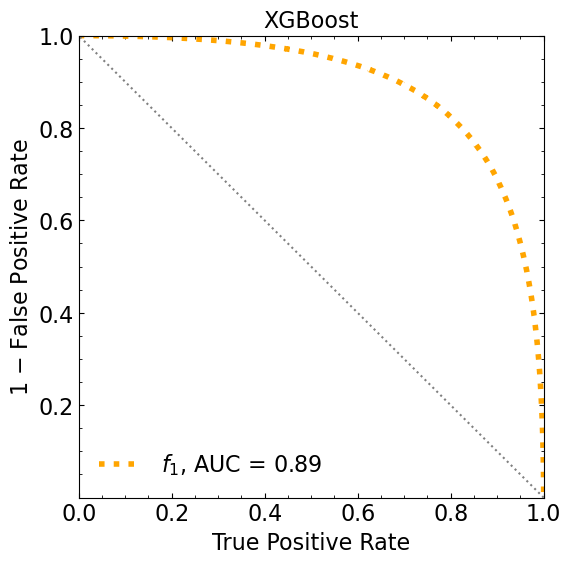

Classification score (1 ML):


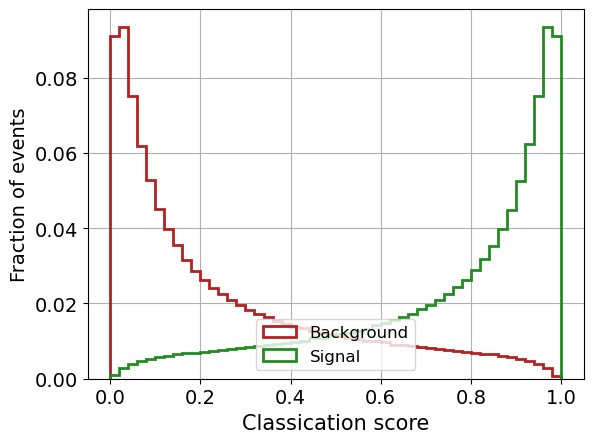

Classification score (10 ML):


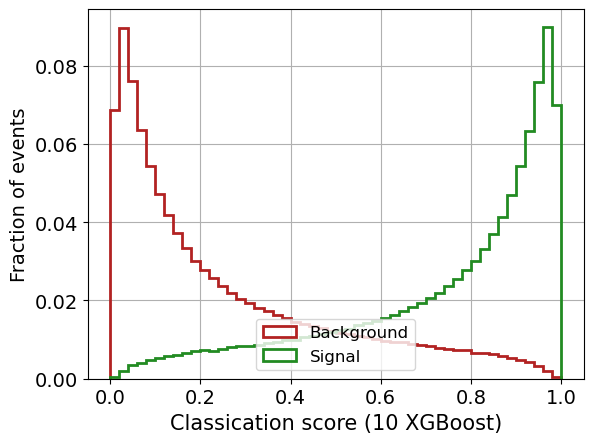

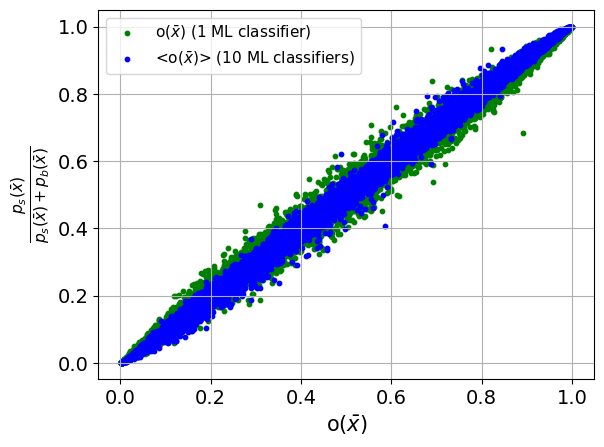


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [35]:
dim=9

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7, signal_X_8, signal_X_9 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7, background_X_8, background_X_9 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))
dim8 = np.concatenate((background_X_8,signal_X_8))
dim9 = np.concatenate((background_X_9,signal_X_9))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['dim8'] = dim8.reshape(-1)
df['dim9'] = dim9.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7','dim8','dim9']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)




print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


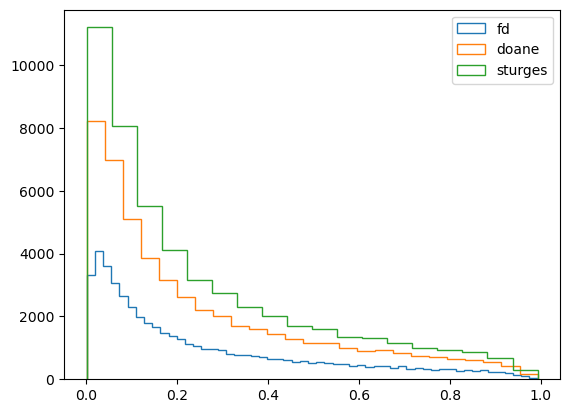

fd 55
doane 25
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  55


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  25
doing Nbin:  18


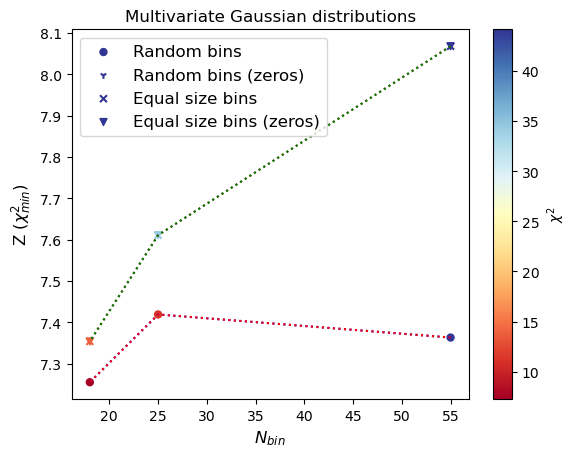

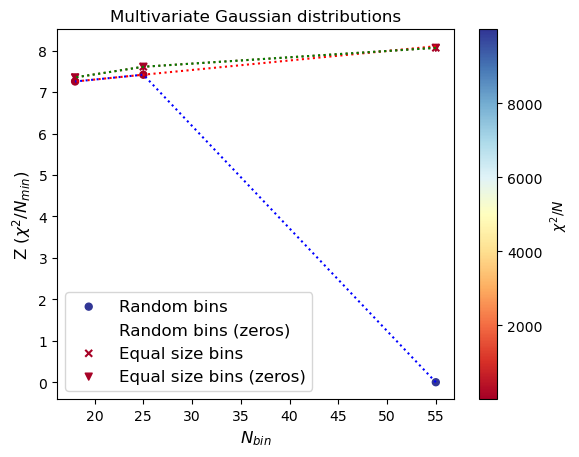

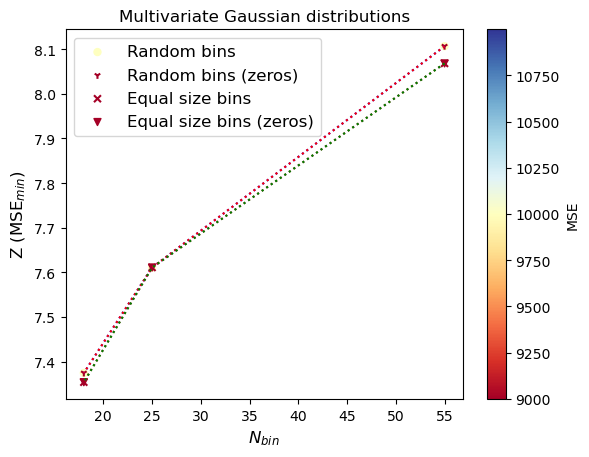

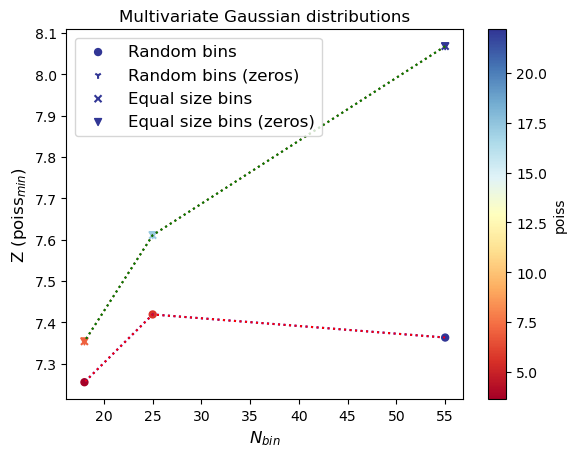

In [36]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()


X_gauss_train :  (2000000, 10)
y_gauss_train :  (2000000, 1)
X_gauss_val :  (2000000, 10)
y_gauss_val :  (2000000, 1)
X_gauss_test :  (2000000, 10)
y_gauss_test :  (2000000, 1)



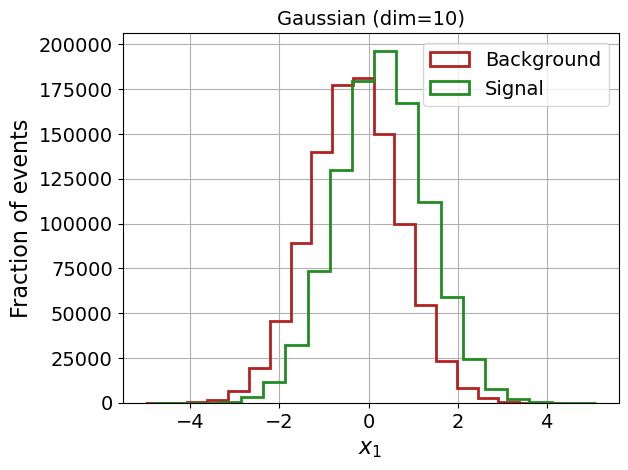

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.67080	validation_1-logloss:0.67101
[1]	validation_0-logloss:0.65044	validation_1-logloss:0.65074
[2]	validation_0-logloss:0.63213	validation_1-logloss:0.63254
[3]	validation_0-logloss:0.61571	validation_1-logloss:0.61619
[4]	validation_0-logloss:0.60083	validation_1-logloss:0.60139
[5]	validation_0-logloss:0.58731	validation_1-logloss:0.58791
[6]	validation_0-logloss:0.57496	validation_1-logloss:0.57563
[7]	validation_0-logloss:0.56352	validation_1-logloss:0.56425
[8]	validation_0-logloss:0.55310	validation_1-logloss:0.55388
[9]	validation_0-logloss:0.54349	validation_1-logloss:0.54436
[10]	validation_0-logloss:0.53459	validation_1-logloss:0.53555
[11]	validation_0-logloss:0.52631	validation_1-logloss:0.52736
[12]	validation_0-logloss:0.51861	validation_1-logloss:0.51971
[13]	validation_0-logloss:0.51143	validation_1-logloss:0.51259
[14]	validation_0-logloss:0.50478	validation_1-logloss:0.50600
[15]	validation_0-logloss:0.49855	validation_1-logloss:0.49984
[1

[130]	validation_0-logloss:0.37979	validation_1-logloss:0.38373
[131]	validation_0-logloss:0.37971	validation_1-logloss:0.38366
[132]	validation_0-logloss:0.37964	validation_1-logloss:0.38360
[133]	validation_0-logloss:0.37957	validation_1-logloss:0.38355
[134]	validation_0-logloss:0.37950	validation_1-logloss:0.38349
[135]	validation_0-logloss:0.37943	validation_1-logloss:0.38343
[136]	validation_0-logloss:0.37937	validation_1-logloss:0.38338
[137]	validation_0-logloss:0.37931	validation_1-logloss:0.38333
[138]	validation_0-logloss:0.37925	validation_1-logloss:0.38328
[139]	validation_0-logloss:0.37919	validation_1-logloss:0.38324
[140]	validation_0-logloss:0.37913	validation_1-logloss:0.38319
[141]	validation_0-logloss:0.37908	validation_1-logloss:0.38314
[142]	validation_0-logloss:0.37902	validation_1-logloss:0.38310
[143]	validation_0-logloss:0.37897	validation_1-logloss:0.38306
[144]	validation_0-logloss:0.37892	validation_1-logloss:0.38302
[145]	validation_0-logloss:0.37887	valid

[259]	validation_0-logloss:0.37664	validation_1-logloss:0.38179
[260]	validation_0-logloss:0.37663	validation_1-logloss:0.38179
[261]	validation_0-logloss:0.37663	validation_1-logloss:0.38179
[262]	validation_0-logloss:0.37662	validation_1-logloss:0.38179
[263]	validation_0-logloss:0.37662	validation_1-logloss:0.38179
[264]	validation_0-logloss:0.37661	validation_1-logloss:0.38179
[265]	validation_0-logloss:0.37660	validation_1-logloss:0.38179
[266]	validation_0-logloss:0.37659	validation_1-logloss:0.38179
[267]	validation_0-logloss:0.37657	validation_1-logloss:0.38179
[268]	validation_0-logloss:0.37657	validation_1-logloss:0.38179
[269]	validation_0-logloss:0.37656	validation_1-logloss:0.38179
[270]	validation_0-logloss:0.37656	validation_1-logloss:0.38179
[271]	validation_0-logloss:0.37655	validation_1-logloss:0.38179
[272]	validation_0-logloss:0.37654	validation_1-logloss:0.38179
[273]	validation_0-logloss:0.37653	validation_1-logloss:0.38179
[274]	validation_0-logloss:0.37652	valid

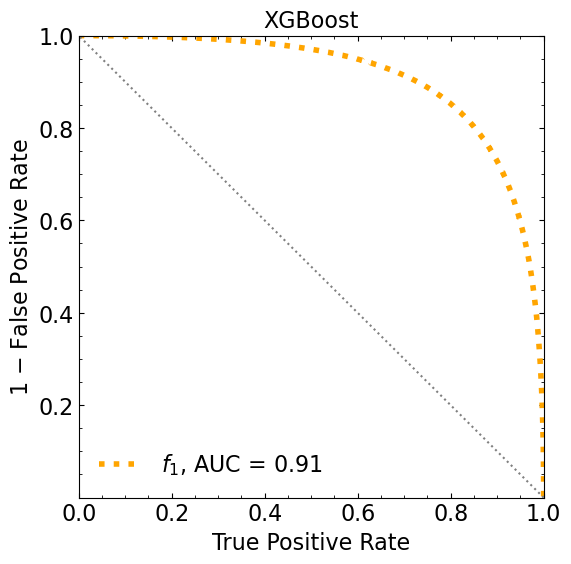

ML iteration 0
[0]	validation_0-logloss:0.66897	validation_1-logloss:0.67031


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64738	validation_1-logloss:0.64973
[2]	validation_0-logloss:0.62802	validation_1-logloss:0.63130
[3]	validation_0-logloss:0.61076	validation_1-logloss:0.61482
[4]	validation_0-logloss:0.59488	validation_1-logloss:0.59974
[5]	validation_0-logloss:0.58039	validation_1-logloss:0.58604
[6]	validation_0-logloss:0.56726	validation_1-logloss:0.57350
[7]	validation_0-logloss:0.55528	validation_1-logloss:0.56219
[8]	validation_0-logloss:0.54424	validation_1-logloss:0.55178
[9]	validation_0-logloss:0.53393	validation_1-logloss:0.54199
[10]	validation_0-logloss:0.52441	validation_1-logloss:0.53304
[11]	validation_0-logloss:0.51565	validation_1-logloss:0.52481
[12]	validation_0-logloss:0.50749	validation_1-logloss:0.51715
[13]	validation_0-logloss:0.49989	validation_1-logloss:0.51017
[14]	validation_0-logloss:0.49274	validation_1-logloss:0.50353
[15]	validation_0-logloss:0.48605	validation_1-logloss:0.49732
[16]	validation_0-logloss:0.47984	validation_1-logloss:0.49166
[

[131]	validation_0-logloss:0.35158	validation_1-logloss:0.38703
[132]	validation_0-logloss:0.35141	validation_1-logloss:0.38700
[133]	validation_0-logloss:0.35125	validation_1-logloss:0.38697
[134]	validation_0-logloss:0.35103	validation_1-logloss:0.38694
[135]	validation_0-logloss:0.35088	validation_1-logloss:0.38689
[136]	validation_0-logloss:0.35073	validation_1-logloss:0.38686
[137]	validation_0-logloss:0.35060	validation_1-logloss:0.38683
[138]	validation_0-logloss:0.35048	validation_1-logloss:0.38681
[139]	validation_0-logloss:0.35035	validation_1-logloss:0.38678
[140]	validation_0-logloss:0.35022	validation_1-logloss:0.38677
[141]	validation_0-logloss:0.35009	validation_1-logloss:0.38675
[142]	validation_0-logloss:0.34998	validation_1-logloss:0.38673
[143]	validation_0-logloss:0.34984	validation_1-logloss:0.38671
[144]	validation_0-logloss:0.34974	validation_1-logloss:0.38670
[145]	validation_0-logloss:0.34961	validation_1-logloss:0.38668
[146]	validation_0-logloss:0.34950	valid

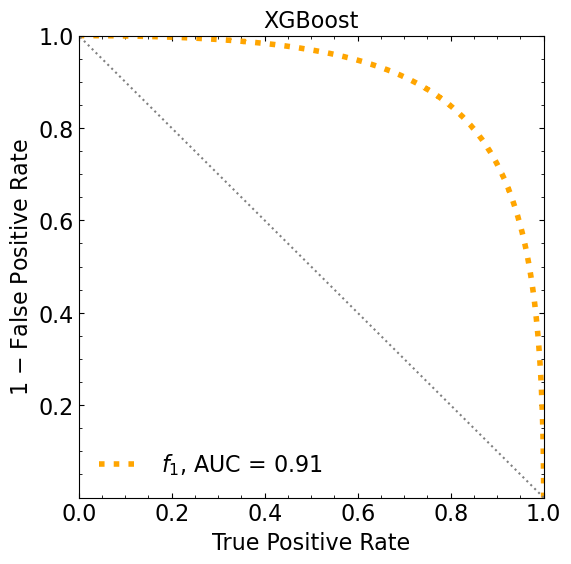

ML iteration  1
[0]	validation_0-logloss:0.66962	validation_1-logloss:0.67058


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64860	validation_1-logloss:0.65037
[2]	validation_0-logloss:0.62961	validation_1-logloss:0.63212
[3]	validation_0-logloss:0.61246	validation_1-logloss:0.61561
[4]	validation_0-logloss:0.59693	validation_1-logloss:0.60069
[5]	validation_0-logloss:0.58269	validation_1-logloss:0.58696
[6]	validation_0-logloss:0.56962	validation_1-logloss:0.57449
[7]	validation_0-logloss:0.55771	validation_1-logloss:0.56302
[8]	validation_0-logloss:0.54685	validation_1-logloss:0.55268
[9]	validation_0-logloss:0.53669	validation_1-logloss:0.54303
[10]	validation_0-logloss:0.52738	validation_1-logloss:0.53424
[11]	validation_0-logloss:0.51879	validation_1-logloss:0.52597
[12]	validation_0-logloss:0.51067	validation_1-logloss:0.51829
[13]	validation_0-logloss:0.50316	validation_1-logloss:0.51118
[14]	validation_0-logloss:0.49609	validation_1-logloss:0.50456
[15]	validation_0-logloss:0.48952	validation_1-logloss:0.49836
[16]	validation_0-logloss:0.48349	validation_1-logloss:0.49271
[

[131]	validation_0-logloss:0.35744	validation_1-logloss:0.38727
[132]	validation_0-logloss:0.35726	validation_1-logloss:0.38724
[133]	validation_0-logloss:0.35710	validation_1-logloss:0.38721
[134]	validation_0-logloss:0.35695	validation_1-logloss:0.38716
[135]	validation_0-logloss:0.35682	validation_1-logloss:0.38712
[136]	validation_0-logloss:0.35673	validation_1-logloss:0.38711
[137]	validation_0-logloss:0.35663	validation_1-logloss:0.38709
[138]	validation_0-logloss:0.35652	validation_1-logloss:0.38705
[139]	validation_0-logloss:0.35636	validation_1-logloss:0.38700
[140]	validation_0-logloss:0.35626	validation_1-logloss:0.38699
[141]	validation_0-logloss:0.35613	validation_1-logloss:0.38697
[142]	validation_0-logloss:0.35601	validation_1-logloss:0.38695
[143]	validation_0-logloss:0.35587	validation_1-logloss:0.38694
[144]	validation_0-logloss:0.35575	validation_1-logloss:0.38690
[145]	validation_0-logloss:0.35562	validation_1-logloss:0.38689
[146]	validation_0-logloss:0.35545	valid

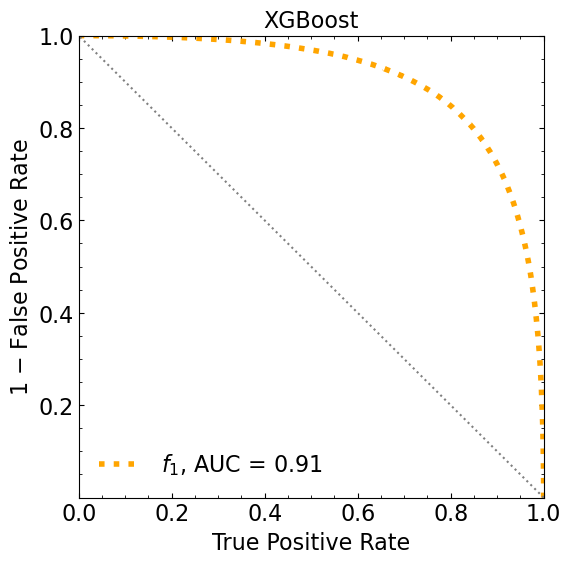

ML iteration  2
[0]	validation_0-logloss:0.66910	validation_1-logloss:0.67039


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64759	validation_1-logloss:0.64978
[2]	validation_0-logloss:0.62841	validation_1-logloss:0.63136
[3]	validation_0-logloss:0.61101	validation_1-logloss:0.61475
[4]	validation_0-logloss:0.59533	validation_1-logloss:0.59982
[5]	validation_0-logloss:0.58101	validation_1-logloss:0.58618
[6]	validation_0-logloss:0.56792	validation_1-logloss:0.57377
[7]	validation_0-logloss:0.55587	validation_1-logloss:0.56226
[8]	validation_0-logloss:0.54477	validation_1-logloss:0.55176
[9]	validation_0-logloss:0.53450	validation_1-logloss:0.54205
[10]	validation_0-logloss:0.52516	validation_1-logloss:0.53321
[11]	validation_0-logloss:0.51652	validation_1-logloss:0.52514
[12]	validation_0-logloss:0.50851	validation_1-logloss:0.51773
[13]	validation_0-logloss:0.50101	validation_1-logloss:0.51068
[14]	validation_0-logloss:0.49391	validation_1-logloss:0.50404
[15]	validation_0-logloss:0.48748	validation_1-logloss:0.49799
[16]	validation_0-logloss:0.48126	validation_1-logloss:0.49220
[

[131]	validation_0-logloss:0.35498	validation_1-logloss:0.38732
[132]	validation_0-logloss:0.35479	validation_1-logloss:0.38727
[133]	validation_0-logloss:0.35466	validation_1-logloss:0.38725
[134]	validation_0-logloss:0.35451	validation_1-logloss:0.38721
[135]	validation_0-logloss:0.35436	validation_1-logloss:0.38718
[136]	validation_0-logloss:0.35423	validation_1-logloss:0.38715
[137]	validation_0-logloss:0.35408	validation_1-logloss:0.38714
[138]	validation_0-logloss:0.35396	validation_1-logloss:0.38713
[139]	validation_0-logloss:0.35383	validation_1-logloss:0.38710
[140]	validation_0-logloss:0.35369	validation_1-logloss:0.38707
[141]	validation_0-logloss:0.35353	validation_1-logloss:0.38705
[142]	validation_0-logloss:0.35336	validation_1-logloss:0.38703
[143]	validation_0-logloss:0.35321	validation_1-logloss:0.38701
[144]	validation_0-logloss:0.35308	validation_1-logloss:0.38699
[145]	validation_0-logloss:0.35295	validation_1-logloss:0.38697
[146]	validation_0-logloss:0.35280	valid

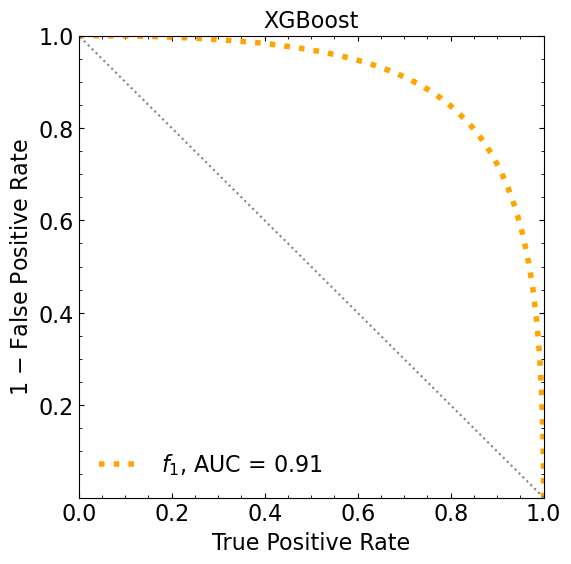

ML iteration  3
[0]	validation_0-logloss:0.66930	validation_1-logloss:0.67043


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64792	validation_1-logloss:0.64999
[2]	validation_0-logloss:0.62879	validation_1-logloss:0.63177
[3]	validation_0-logloss:0.61144	validation_1-logloss:0.61515
[4]	validation_0-logloss:0.59571	validation_1-logloss:0.60010
[5]	validation_0-logloss:0.58145	validation_1-logloss:0.58638
[6]	validation_0-logloss:0.56838	validation_1-logloss:0.57394
[7]	validation_0-logloss:0.55630	validation_1-logloss:0.56245
[8]	validation_0-logloss:0.54511	validation_1-logloss:0.55196
[9]	validation_0-logloss:0.53489	validation_1-logloss:0.54226
[10]	validation_0-logloss:0.52552	validation_1-logloss:0.53345
[11]	validation_0-logloss:0.51676	validation_1-logloss:0.52522
[12]	validation_0-logloss:0.50860	validation_1-logloss:0.51757
[13]	validation_0-logloss:0.50092	validation_1-logloss:0.51035
[14]	validation_0-logloss:0.49387	validation_1-logloss:0.50379
[15]	validation_0-logloss:0.48727	validation_1-logloss:0.49762
[16]	validation_0-logloss:0.48108	validation_1-logloss:0.49185
[

[131]	validation_0-logloss:0.35358	validation_1-logloss:0.38690
[132]	validation_0-logloss:0.35340	validation_1-logloss:0.38686
[133]	validation_0-logloss:0.35321	validation_1-logloss:0.38683
[134]	validation_0-logloss:0.35302	validation_1-logloss:0.38680
[135]	validation_0-logloss:0.35288	validation_1-logloss:0.38677
[136]	validation_0-logloss:0.35274	validation_1-logloss:0.38674
[137]	validation_0-logloss:0.35262	validation_1-logloss:0.38671
[138]	validation_0-logloss:0.35250	validation_1-logloss:0.38669
[139]	validation_0-logloss:0.35235	validation_1-logloss:0.38667
[140]	validation_0-logloss:0.35223	validation_1-logloss:0.38666
[141]	validation_0-logloss:0.35210	validation_1-logloss:0.38662
[142]	validation_0-logloss:0.35195	validation_1-logloss:0.38659
[143]	validation_0-logloss:0.35185	validation_1-logloss:0.38657
[144]	validation_0-logloss:0.35173	validation_1-logloss:0.38656
[145]	validation_0-logloss:0.35160	validation_1-logloss:0.38656
[146]	validation_0-logloss:0.35145	valid

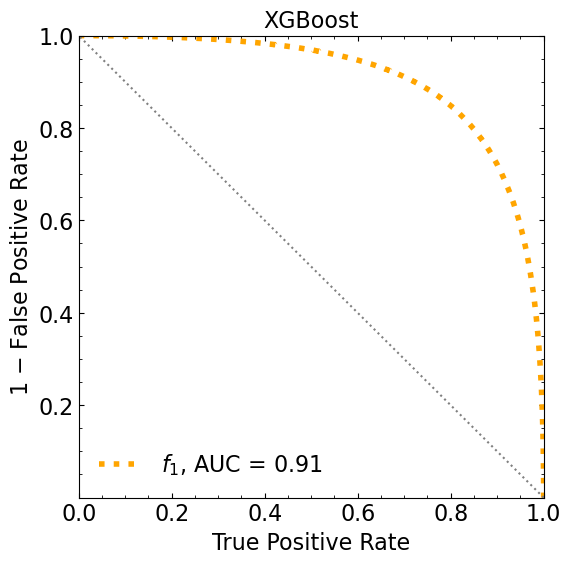

ML iteration  4
[0]	validation_0-logloss:0.66925	validation_1-logloss:0.67053


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64786	validation_1-logloss:0.65007
[2]	validation_0-logloss:0.62865	validation_1-logloss:0.63168
[3]	validation_0-logloss:0.61133	validation_1-logloss:0.61511
[4]	validation_0-logloss:0.59582	validation_1-logloss:0.60023
[5]	validation_0-logloss:0.58145	validation_1-logloss:0.58656
[6]	validation_0-logloss:0.56852	validation_1-logloss:0.57415
[7]	validation_0-logloss:0.55656	validation_1-logloss:0.56277
[8]	validation_0-logloss:0.54547	validation_1-logloss:0.55225
[9]	validation_0-logloss:0.53532	validation_1-logloss:0.54266
[10]	validation_0-logloss:0.52586	validation_1-logloss:0.53371
[11]	validation_0-logloss:0.51711	validation_1-logloss:0.52552
[12]	validation_0-logloss:0.50895	validation_1-logloss:0.51786
[13]	validation_0-logloss:0.50133	validation_1-logloss:0.51069
[14]	validation_0-logloss:0.49437	validation_1-logloss:0.50415
[15]	validation_0-logloss:0.48768	validation_1-logloss:0.49791
[16]	validation_0-logloss:0.48154	validation_1-logloss:0.49220
[

[131]	validation_0-logloss:0.35419	validation_1-logloss:0.38732
[132]	validation_0-logloss:0.35406	validation_1-logloss:0.38730
[133]	validation_0-logloss:0.35390	validation_1-logloss:0.38726
[134]	validation_0-logloss:0.35379	validation_1-logloss:0.38724
[135]	validation_0-logloss:0.35363	validation_1-logloss:0.38721
[136]	validation_0-logloss:0.35349	validation_1-logloss:0.38720
[137]	validation_0-logloss:0.35337	validation_1-logloss:0.38717
[138]	validation_0-logloss:0.35322	validation_1-logloss:0.38714
[139]	validation_0-logloss:0.35311	validation_1-logloss:0.38711
[140]	validation_0-logloss:0.35301	validation_1-logloss:0.38709
[141]	validation_0-logloss:0.35290	validation_1-logloss:0.38708
[142]	validation_0-logloss:0.35274	validation_1-logloss:0.38706
[143]	validation_0-logloss:0.35260	validation_1-logloss:0.38704
[144]	validation_0-logloss:0.35241	validation_1-logloss:0.38701
[145]	validation_0-logloss:0.35231	validation_1-logloss:0.38700
[146]	validation_0-logloss:0.35221	valid

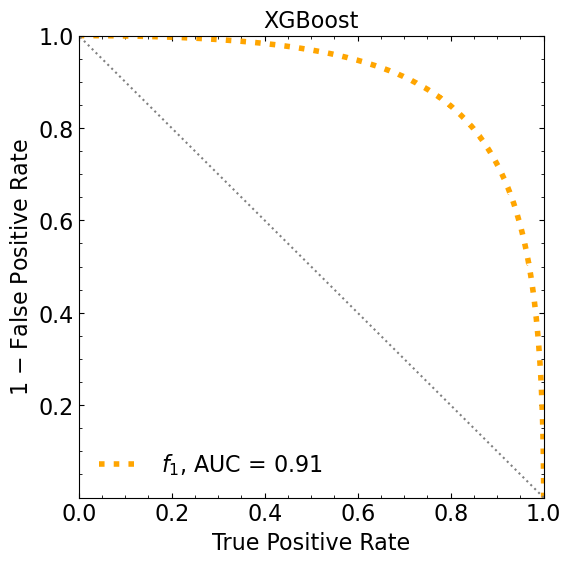

ML iteration  5
[0]	validation_0-logloss:0.66920	validation_1-logloss:0.67047


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64785	validation_1-logloss:0.65002
[2]	validation_0-logloss:0.62875	validation_1-logloss:0.63177
[3]	validation_0-logloss:0.61137	validation_1-logloss:0.61517
[4]	validation_0-logloss:0.59556	validation_1-logloss:0.60004
[5]	validation_0-logloss:0.58125	validation_1-logloss:0.58647
[6]	validation_0-logloss:0.56819	validation_1-logloss:0.57413
[7]	validation_0-logloss:0.55617	validation_1-logloss:0.56268
[8]	validation_0-logloss:0.54507	validation_1-logloss:0.55220
[9]	validation_0-logloss:0.53480	validation_1-logloss:0.54248
[10]	validation_0-logloss:0.52528	validation_1-logloss:0.53365
[11]	validation_0-logloss:0.51655	validation_1-logloss:0.52532
[12]	validation_0-logloss:0.50837	validation_1-logloss:0.51774
[13]	validation_0-logloss:0.50085	validation_1-logloss:0.51067
[14]	validation_0-logloss:0.49373	validation_1-logloss:0.50400
[15]	validation_0-logloss:0.48713	validation_1-logloss:0.49783
[16]	validation_0-logloss:0.48090	validation_1-logloss:0.49204
[

[131]	validation_0-logloss:0.35317	validation_1-logloss:0.38700
[132]	validation_0-logloss:0.35301	validation_1-logloss:0.38698
[133]	validation_0-logloss:0.35285	validation_1-logloss:0.38695
[134]	validation_0-logloss:0.35271	validation_1-logloss:0.38692
[135]	validation_0-logloss:0.35256	validation_1-logloss:0.38688
[136]	validation_0-logloss:0.35237	validation_1-logloss:0.38685
[137]	validation_0-logloss:0.35219	validation_1-logloss:0.38683
[138]	validation_0-logloss:0.35208	validation_1-logloss:0.38681
[139]	validation_0-logloss:0.35194	validation_1-logloss:0.38679
[140]	validation_0-logloss:0.35184	validation_1-logloss:0.38677
[141]	validation_0-logloss:0.35172	validation_1-logloss:0.38676
[142]	validation_0-logloss:0.35158	validation_1-logloss:0.38675
[143]	validation_0-logloss:0.35141	validation_1-logloss:0.38674
[144]	validation_0-logloss:0.35131	validation_1-logloss:0.38671
[145]	validation_0-logloss:0.35116	validation_1-logloss:0.38668
[146]	validation_0-logloss:0.35099	valid

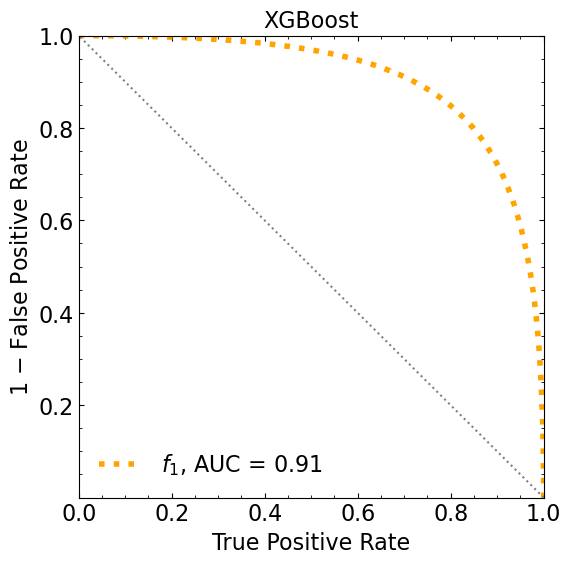

ML iteration  6
[0]	validation_0-logloss:0.66918	validation_1-logloss:0.67047


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64795	validation_1-logloss:0.65015
[2]	validation_0-logloss:0.62878	validation_1-logloss:0.63183
[3]	validation_0-logloss:0.61156	validation_1-logloss:0.61521
[4]	validation_0-logloss:0.59596	validation_1-logloss:0.60040
[5]	validation_0-logloss:0.58177	validation_1-logloss:0.58673
[6]	validation_0-logloss:0.56866	validation_1-logloss:0.57432
[7]	validation_0-logloss:0.55674	validation_1-logloss:0.56297
[8]	validation_0-logloss:0.54572	validation_1-logloss:0.55243
[9]	validation_0-logloss:0.53557	validation_1-logloss:0.54278
[10]	validation_0-logloss:0.52621	validation_1-logloss:0.53394
[11]	validation_0-logloss:0.51749	validation_1-logloss:0.52576
[12]	validation_0-logloss:0.50939	validation_1-logloss:0.51808
[13]	validation_0-logloss:0.50185	validation_1-logloss:0.51106
[14]	validation_0-logloss:0.49481	validation_1-logloss:0.50443
[15]	validation_0-logloss:0.48818	validation_1-logloss:0.49815
[16]	validation_0-logloss:0.48209	validation_1-logloss:0.49246
[

[131]	validation_0-logloss:0.35603	validation_1-logloss:0.38721
[132]	validation_0-logloss:0.35590	validation_1-logloss:0.38718
[133]	validation_0-logloss:0.35580	validation_1-logloss:0.38717
[134]	validation_0-logloss:0.35564	validation_1-logloss:0.38713
[135]	validation_0-logloss:0.35552	validation_1-logloss:0.38708
[136]	validation_0-logloss:0.35536	validation_1-logloss:0.38706
[137]	validation_0-logloss:0.35520	validation_1-logloss:0.38703
[138]	validation_0-logloss:0.35509	validation_1-logloss:0.38699
[139]	validation_0-logloss:0.35492	validation_1-logloss:0.38696
[140]	validation_0-logloss:0.35476	validation_1-logloss:0.38693
[141]	validation_0-logloss:0.35461	validation_1-logloss:0.38691
[142]	validation_0-logloss:0.35451	validation_1-logloss:0.38689
[143]	validation_0-logloss:0.35432	validation_1-logloss:0.38687
[144]	validation_0-logloss:0.35422	validation_1-logloss:0.38686
[145]	validation_0-logloss:0.35410	validation_1-logloss:0.38683
[146]	validation_0-logloss:0.35394	valid

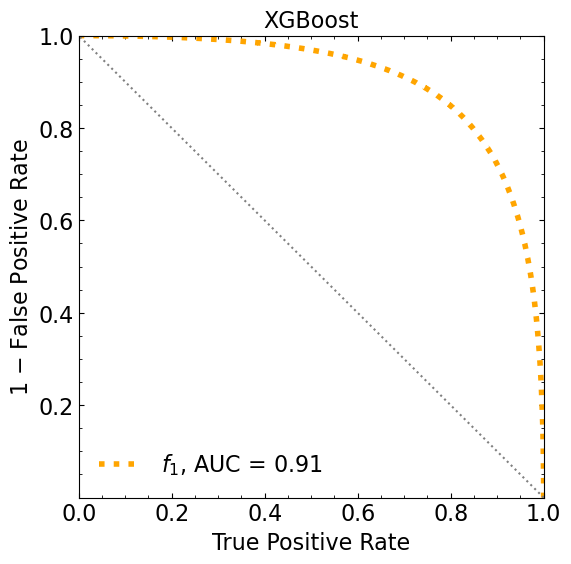

ML iteration  7
[0]	validation_0-logloss:0.66930	validation_1-logloss:0.67040


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64810	validation_1-logloss:0.65009
[2]	validation_0-logloss:0.62872	validation_1-logloss:0.63163
[3]	validation_0-logloss:0.61141	validation_1-logloss:0.61511
[4]	validation_0-logloss:0.59568	validation_1-logloss:0.60012
[5]	validation_0-logloss:0.58124	validation_1-logloss:0.58642
[6]	validation_0-logloss:0.56819	validation_1-logloss:0.57405
[7]	validation_0-logloss:0.55606	validation_1-logloss:0.56247
[8]	validation_0-logloss:0.54491	validation_1-logloss:0.55206
[9]	validation_0-logloss:0.53464	validation_1-logloss:0.54230
[10]	validation_0-logloss:0.52520	validation_1-logloss:0.53347
[11]	validation_0-logloss:0.51639	validation_1-logloss:0.52525
[12]	validation_0-logloss:0.50818	validation_1-logloss:0.51767
[13]	validation_0-logloss:0.50060	validation_1-logloss:0.51063
[14]	validation_0-logloss:0.49338	validation_1-logloss:0.50392
[15]	validation_0-logloss:0.48679	validation_1-logloss:0.49766
[16]	validation_0-logloss:0.48063	validation_1-logloss:0.49193
[

[131]	validation_0-logloss:0.35244	validation_1-logloss:0.38717
[132]	validation_0-logloss:0.35231	validation_1-logloss:0.38714
[133]	validation_0-logloss:0.35212	validation_1-logloss:0.38712
[134]	validation_0-logloss:0.35200	validation_1-logloss:0.38710
[135]	validation_0-logloss:0.35184	validation_1-logloss:0.38707
[136]	validation_0-logloss:0.35170	validation_1-logloss:0.38707
[137]	validation_0-logloss:0.35157	validation_1-logloss:0.38704
[138]	validation_0-logloss:0.35145	validation_1-logloss:0.38701
[139]	validation_0-logloss:0.35129	validation_1-logloss:0.38699
[140]	validation_0-logloss:0.35115	validation_1-logloss:0.38697
[141]	validation_0-logloss:0.35100	validation_1-logloss:0.38695
[142]	validation_0-logloss:0.35086	validation_1-logloss:0.38693
[143]	validation_0-logloss:0.35073	validation_1-logloss:0.38692
[144]	validation_0-logloss:0.35058	validation_1-logloss:0.38691
[145]	validation_0-logloss:0.35045	validation_1-logloss:0.38690
[146]	validation_0-logloss:0.35028	valid

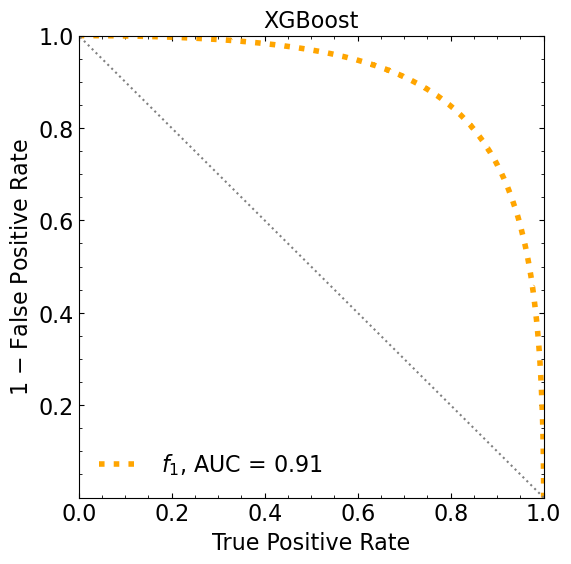

ML iteration  8
[0]	validation_0-logloss:0.66899	validation_1-logloss:0.67028


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64775	validation_1-logloss:0.65010
[2]	validation_0-logloss:0.62858	validation_1-logloss:0.63182
[3]	validation_0-logloss:0.61120	validation_1-logloss:0.61524
[4]	validation_0-logloss:0.59551	validation_1-logloss:0.60012
[5]	validation_0-logloss:0.58115	validation_1-logloss:0.58647
[6]	validation_0-logloss:0.56790	validation_1-logloss:0.57386
[7]	validation_0-logloss:0.55593	validation_1-logloss:0.56248
[8]	validation_0-logloss:0.54483	validation_1-logloss:0.55204
[9]	validation_0-logloss:0.53456	validation_1-logloss:0.54234
[10]	validation_0-logloss:0.52520	validation_1-logloss:0.53346
[11]	validation_0-logloss:0.51637	validation_1-logloss:0.52516
[12]	validation_0-logloss:0.50829	validation_1-logloss:0.51759
[13]	validation_0-logloss:0.50072	validation_1-logloss:0.51047
[14]	validation_0-logloss:0.49364	validation_1-logloss:0.50378
[15]	validation_0-logloss:0.48702	validation_1-logloss:0.49771
[16]	validation_0-logloss:0.48078	validation_1-logloss:0.49197
[

[131]	validation_0-logloss:0.35253	validation_1-logloss:0.38725
[132]	validation_0-logloss:0.35237	validation_1-logloss:0.38721
[133]	validation_0-logloss:0.35225	validation_1-logloss:0.38718
[134]	validation_0-logloss:0.35203	validation_1-logloss:0.38714
[135]	validation_0-logloss:0.35186	validation_1-logloss:0.38714
[136]	validation_0-logloss:0.35169	validation_1-logloss:0.38710
[137]	validation_0-logloss:0.35152	validation_1-logloss:0.38708
[138]	validation_0-logloss:0.35142	validation_1-logloss:0.38707
[139]	validation_0-logloss:0.35128	validation_1-logloss:0.38706
[140]	validation_0-logloss:0.35115	validation_1-logloss:0.38704
[141]	validation_0-logloss:0.35105	validation_1-logloss:0.38702
[142]	validation_0-logloss:0.35090	validation_1-logloss:0.38701
[143]	validation_0-logloss:0.35076	validation_1-logloss:0.38699
[144]	validation_0-logloss:0.35059	validation_1-logloss:0.38699
[145]	validation_0-logloss:0.35045	validation_1-logloss:0.38698
[146]	validation_0-logloss:0.35032	valid

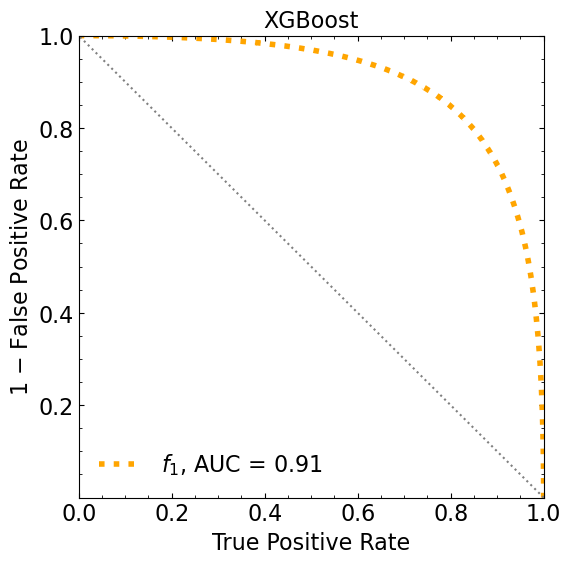

ML iteration  9
[0]	validation_0-logloss:0.66933	validation_1-logloss:0.67047


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.64792	validation_1-logloss:0.64993
[2]	validation_0-logloss:0.62883	validation_1-logloss:0.63161
[3]	validation_0-logloss:0.61162	validation_1-logloss:0.61528
[4]	validation_0-logloss:0.59593	validation_1-logloss:0.60022
[5]	validation_0-logloss:0.58162	validation_1-logloss:0.58671
[6]	validation_0-logloss:0.56835	validation_1-logloss:0.57408
[7]	validation_0-logloss:0.55623	validation_1-logloss:0.56260
[8]	validation_0-logloss:0.54522	validation_1-logloss:0.55219
[9]	validation_0-logloss:0.53497	validation_1-logloss:0.54249
[10]	validation_0-logloss:0.52562	validation_1-logloss:0.53366
[11]	validation_0-logloss:0.51685	validation_1-logloss:0.52554
[12]	validation_0-logloss:0.50883	validation_1-logloss:0.51794
[13]	validation_0-logloss:0.50125	validation_1-logloss:0.51085
[14]	validation_0-logloss:0.49425	validation_1-logloss:0.50420
[15]	validation_0-logloss:0.48768	validation_1-logloss:0.49807
[16]	validation_0-logloss:0.48144	validation_1-logloss:0.49226
[

[131]	validation_0-logloss:0.35465	validation_1-logloss:0.38731
[132]	validation_0-logloss:0.35451	validation_1-logloss:0.38729
[133]	validation_0-logloss:0.35437	validation_1-logloss:0.38725
[134]	validation_0-logloss:0.35422	validation_1-logloss:0.38722
[135]	validation_0-logloss:0.35412	validation_1-logloss:0.38719
[136]	validation_0-logloss:0.35397	validation_1-logloss:0.38717
[137]	validation_0-logloss:0.35378	validation_1-logloss:0.38714
[138]	validation_0-logloss:0.35361	validation_1-logloss:0.38710
[139]	validation_0-logloss:0.35343	validation_1-logloss:0.38707
[140]	validation_0-logloss:0.35333	validation_1-logloss:0.38706
[141]	validation_0-logloss:0.35321	validation_1-logloss:0.38702
[142]	validation_0-logloss:0.35309	validation_1-logloss:0.38699
[143]	validation_0-logloss:0.35301	validation_1-logloss:0.38698
[144]	validation_0-logloss:0.35290	validation_1-logloss:0.38697
[145]	validation_0-logloss:0.35278	validation_1-logloss:0.38697
[146]	validation_0-logloss:0.35268	valid

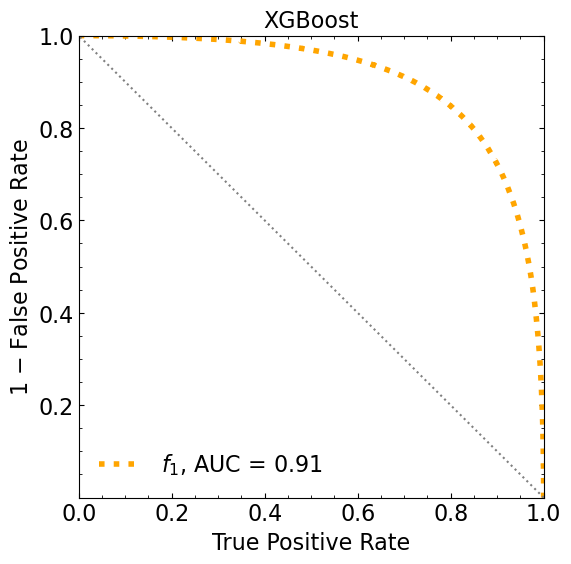

Classification score (1 ML):


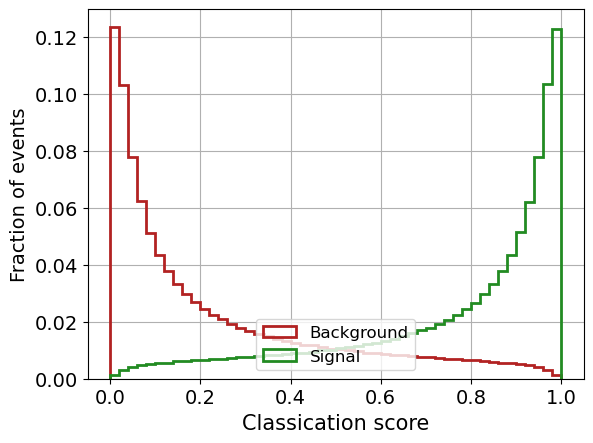

Classification score (10 ML):


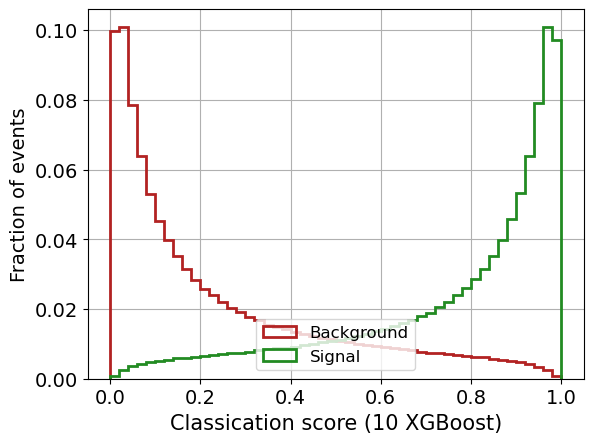

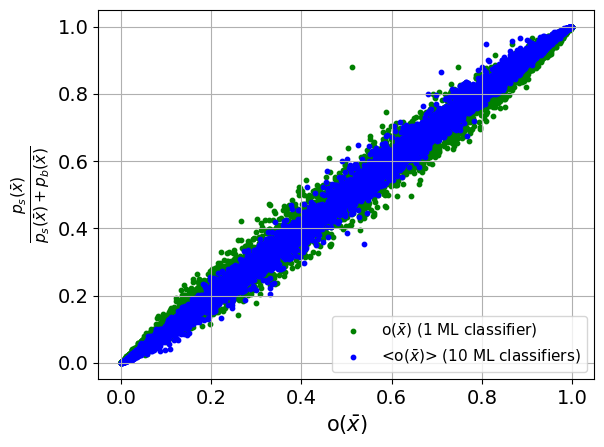


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979

 ----------------------------------------- 



In [37]:
dim=10

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0. * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7, signal_X_8, signal_X_9, signal_X_10 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7, background_X_8, background_X_9, background_X_10 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))
dim8 = np.concatenate((background_X_8,signal_X_8))
dim9 = np.concatenate((background_X_9,signal_X_9))
dim10 = np.concatenate((background_X_10,signal_X_10))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['dim8'] = dim8.reshape(-1)
df['dim9'] = dim9.reshape(-1)
df['dim10'] = dim10.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7','dim8','dim9','dim10']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)





print('\n ----------------------------------------- \n')

 BINNED CLASSIFIER OUTPUT


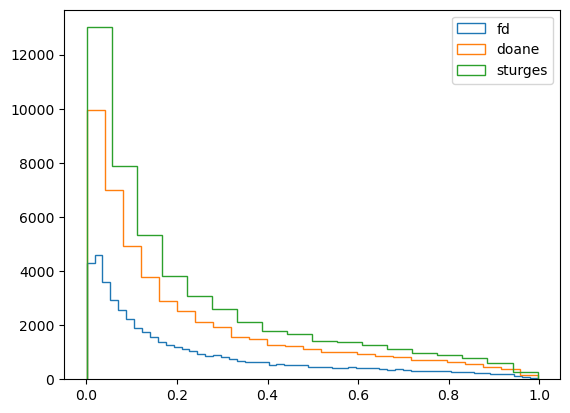

fd 57
doane 25
sturges 18
 
ok j_it= 0
ok j_it= 1
ok j_it= 2
 
doing Nbin:  57


/tmp/ipykernel_32608/3694700868.py:210: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:211: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
/tmp/ipykernel_32608/3694700868.py:280: RuntimeWarning: divide by zero encountered in double_scalars
  aux_chi2_N = aux_chi2 / j_it
/tmp/ipykernel_32608/3694700868.py:281: RuntimeWarning: divide by zero encountered in double_scalars
  aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it


doing Nbin:  25
doing Nbin:  18


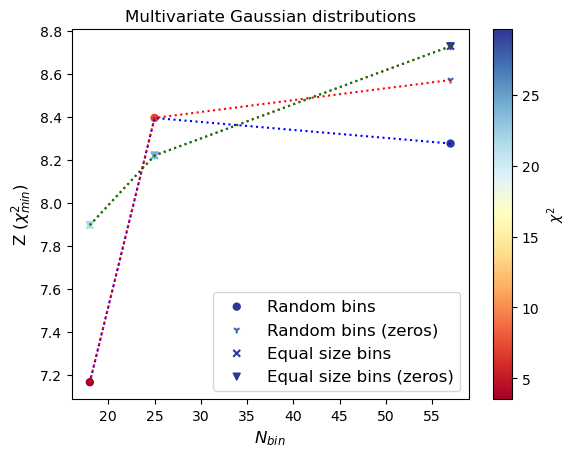

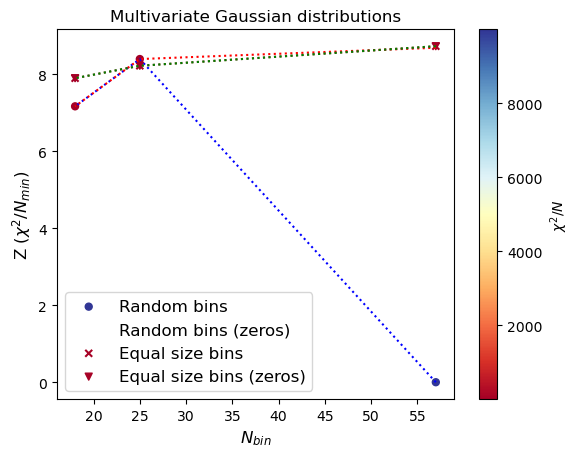

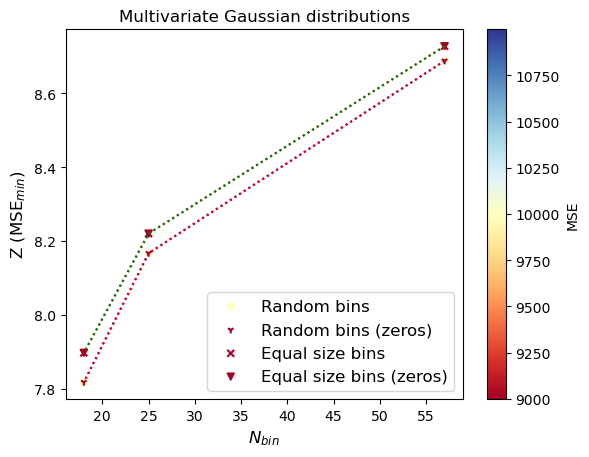

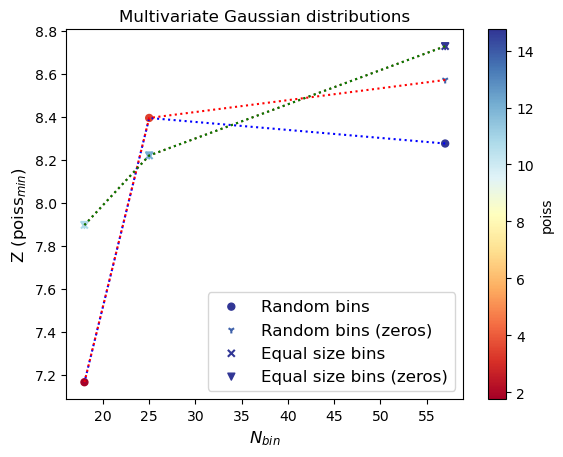

In [38]:
############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

divs_B = int(len(pred_XG_SM)/B_expected)

B_1 = []
B_2 = []
B_3 = []

for it in range(divs_B):
    datB_grid_SM = pred_XG_SM[(B_expected*it):(B_expected*(it+1))]
    datB_grid_NP = pred_XG_NP[:B_expected]

    B_hist1 = np.histogram_bin_edges(datB_grid_SM, bins = 'fd')
    B_hist2 = np.histogram_bin_edges(datB_grid_SM, bins = 'doane')
    B_hist3 = np.histogram_bin_edges(datB_grid_SM, bins = 'sturges')
    
    B_1.append(len(B_hist1))
    B_2.append(len(B_hist2))
    B_3.append(len(B_hist3))



B_1_mean = int(np.mean(B_1))
B_2_mean = int(np.mean(B_2))
B_3_mean = int(np.mean(B_3))


B_hist1 = plt.hist(datB_grid_SM, bins = B_1_mean, histtype = 'step', label = 'fd')
B_hist2 = plt.hist(datB_grid_SM, bins = B_2_mean, histtype = 'step', label = 'doane')
B_hist3 = plt.hist(datB_grid_SM, bins = B_3_mean, histtype = 'step', label = 'sturges')
plt.legend()
plt.show()


print('fd', B_1_mean)
print('doane', B_2_mean)
print('sturges', B_3_mean)
print(' ')

B_bins_mean = [B_1_mean, B_2_mean, B_3_mean]








###############################
# EQ SIZE CROSS-VAL FOR Nbins #
###############################


# Les't find the number of possible ensembles
N_ensembles_back = len(pred_XG_SM) / B_expected
N_ensembles_sig = len(pred_XG_NP) / S_expected

Z_bins_XG_CV = []
Z_bins_XG_CV_zeros = []

for j_it in range(len(B_bins_mean)):
    
    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd([pred_XG_SM], bins=(B_bins_mean[j_it]), range = [[min(pred_XG_SM),max(pred_XG_SM)]])
    bin_edges = binedges_back[0]
    
    if min(hist_back) >= 5*N_ensembles_back:
        print('ok j_it=', j_it)
        
        # now divide by the number of possible ensembles
        back_prom = hist_back/N_ensembles_back

        # same for signal
        hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
        sig_prom = hist_sig/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_CV_aux = ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5

    else:
        print('NO ok j_it=', j_it)
        Z_bins_XG_CV_aux = 0
        
    Z_bins_XG_CV.append(Z_bins_XG_CV_aux)
    
    
    # REPLACE the zeros
    hist_back_noceros = []
    for i in range(len(hist_back)):
        if hist_back[i]!=0:
            hist_back_noceros.append(hist_back[i])

    min_back = min(hist_back_noceros)

    # replace the zeros
    for i in range(len(hist_back)):
        if hist_back[i]==0:
            hist_back[i] = min_back

    # now divide by the number of possible ensembles
    back_prom = hist_back/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd([pred_XG_NP], bins=[bin_edges])
    sig_prom = hist_sig/N_ensembles_sig
    
    Z_bins_XG_CV_zeros.append( ( 2* sum( ( back_prom * np.log( back_prom / (sig_prom+back_prom) ) ) + sig_prom ) )**0.5 )

    
Z_bins_XG_CV0.append(Z_bins_XG_CV[0])
Z_bins_XG_CV1.append(Z_bins_XG_CV[1])
Z_bins_XG_CV2.append(Z_bins_XG_CV[2])

Z_bins_XG_CV0_zeros.append(Z_bins_XG_CV_zeros[0])
Z_bins_XG_CV1_zeros.append(Z_bins_XG_CV_zeros[1])
Z_bins_XG_CV2_zeros.append(Z_bins_XG_CV_zeros[2])

print(' ')







########################################################################
# RANDOM BINNING with CROSS-VAL FOR Nbins and CROSS-VAL for the random #
########################################################################

num_SM = int(len(pred_XG_SM)/6)
num_NP = int(len(pred_XG_NP)/6)

numdat = min(num_SM, num_NP)

data_grid_SM_0 = pred_XG_SM[(0*numdat):(1*numdat)]
data_grid_NP_0 = pred_XG_NP[(0*numdat):(1*numdat)]

data_grid_SM_1 = pred_XG_SM[(1*numdat):(2*numdat)]
data_grid_NP_1 = pred_XG_NP[(1*numdat):(2*numdat)]
                            
data_grid_SM_2 = pred_XG_SM[(2*numdat):(3*numdat)]
data_grid_NP_2 = pred_XG_NP[(2*numdat):(3*numdat)]
                          
data_grid_SM_3 = pred_XG_SM[(3*numdat):(4*numdat)]
data_grid_NP_3 = pred_XG_NP[(3*numdat):(4*numdat)]
                                                        
data_grid_SM_4 = pred_XG_SM[(4*numdat):(5*numdat)]
data_grid_NP_4 = pred_XG_NP[(4*numdat):(5*numdat)]

data_grid_SM_5 = pred_XG_SM[(5*numdat):(6*numdat)]
data_grid_NP_5 = pred_XG_NP[(5*numdat):(6*numdat)]




Z_bins_XG_CV_rd = []

chi2 = []
chi2_N = []
MSE = []
poiss = []


Z_bins_XG_CV_rd_zeros = []

chi2_zeros = []
chi2_N_zeros = []
MSE_zeros = []
poiss_zeros = []


# Les't find the number of possible ensembles
N_ensembles_back = len(data_grid_SM_0) / B_expected
N_ensembles_sig = len(data_grid_NP_0) / S_expected



for j_it in range(len(B_bins_mean)):
    
    print('doing Nbin: ', B_bins_mean[j_it])

    for i_it in range(ntrials):
        
        if i_it == 0:
            # bin the parameter space of all background events
            bin_edges = np.linspace( min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]+1) )
            
        else:
            bin_edges = np.hstack( (min(pred_XG_SM), np.sort( np.random.uniform(min(pred_XG_SM), max(pred_XG_SM), (B_bins_mean[j_it]-1)) ), max(pred_XG_SM) ) )
            
        hist_SM_0, _ = np.histogramdd([data_grid_SM_0], bins = [bin_edges])
        hist_SM_1, _ = np.histogramdd([data_grid_SM_1], bins = [bin_edges])
        hist_SM_2, _ = np.histogramdd([data_grid_SM_2], bins = [bin_edges])
        hist_SM_3, _ = np.histogramdd([data_grid_SM_3], bins = [bin_edges])
        
        mean = (hist_SM_0 + hist_SM_1 + hist_SM_2 + hist_SM_3 )/4

        if min(mean)>= 5*N_ensembles_back:
            
            ##################
            # COMPUTE METRIC #
            ##################
            hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
            
            aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
            aux_chi2_N = aux_chi2 / j_it
            aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
            aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )

            
            #############
            # COMPUTE Z #
            #############
            # bin the parameter space of all background events
            hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
            
            # now divide by the number of possible ensembles
            back_prom_5 = hist_SM_5/N_ensembles_back

            # same for signal
            hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])
            
            sig_prom_5 = hist_NP_5/N_ensembles_sig

            # then the signif Z^binned-Asimov:
            Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5
            
      
        else:
            Z_bins_XG_aux = 0
            aux_chi2 = 9999
            aux_chi2_N = 9999
            aux_chi2_sin = 9999
            aux_poiss = 9999
            
        Z_bins_XG_CV_rd.append(Z_bins_XG_aux)
        chi2.append(aux_chi2)
        chi2_N.append(aux_chi2_N)
        MSE.append(aux_chi2_sin)
        poiss.append(aux_poiss)
        
        
        
        # REPLACE the zeros
        mean_noceros = []
        for i in range(len(mean)):
            if mean[i]!=0:
                mean_noceros.append(mean[i])
        
        min_mean = min(mean_noceros)
        
        # replace the zeros
        for i in range(len(mean)):
            if mean[i]==0:
                mean[i] = min_mean
                
        
        ##################
        # COMPUTE METRIC #
        ##################
        hist_SM_4, _ = np.histogramdd([data_grid_SM_4], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]!=0:
                hist_back_noceros.append(hist_SM_4[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_4)):
            if hist_SM_4[i]==0:
                hist_SM_4[i] = min_back

        aux_chi2 = sum( ((hist_SM_4 - mean))**2 / mean )
        aux_chi2_N = aux_chi2 / j_it
        aux_MSE = sum( ((hist_SM_4 - mean))**2 ) / j_it
        aux_poiss = sum( mean - (hist_SM_4*np.log(mean)) + (hist_SM_4*np.log(hist_SM_4)) - hist_SM_4 )


        #############
        # COMPUTE Z #
        #############
        # bin the parameter space of all background events
        hist_SM_5, _ = np.histogramdd([data_grid_SM_5], bins = [bin_edges])
        
        hist_back_noceros = []
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]!=0:
                hist_back_noceros.append(hist_SM_5[i])

        min_back = min(hist_back_noceros)

        # replace the zeros
        for i in range(len(hist_SM_5)):
            if hist_SM_5[i]==0:
                hist_SM_5[i] = min_back

        # now divide by the number of possible ensembles
        back_prom_5 = hist_SM_5/N_ensembles_back

        # same for signal
        hist_NP_5, _ = np.histogramdd([data_grid_NP_5], bins = [bin_edges])

        sig_prom_5 = hist_NP_5/N_ensembles_sig

        # then the signif Z^binned-Asimov:
        Z_bins_XG_aux = ( 2* sum( ( back_prom_5 * np.log( back_prom_5 / (sig_prom_5+back_prom_5) ) ) + sig_prom_5 ) )**0.5

        
        Z_bins_XG_CV_rd_zeros.append(Z_bins_XG_aux)
        chi2_zeros.append(aux_chi2)
        chi2_N_zeros.append(aux_chi2_N)
        MSE_zeros.append(aux_chi2_sin)
        poiss_zeros.append(aux_poiss)
        


        
################################################
# SELECT THE BINNING with MINIMUM METRIC VALUE #
################################################

# the value of the metric
chi2_per_bin = []
chi2_N_per_bin = []
MSE_per_bin = []
poiss_per_bin = []

chi2_per_bin_eqsize = []
chi2_N_per_bin_eqsize = []
MSE_per_bin_eqsize = []
poiss_per_bin_eqsize = []

for i in range(len(B_bins_mean)):
    chi2_per_bin.append( np.min(chi2[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin.append( np.min(chi2_N[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin.append( np.min(MSE[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin.append( np.min(poiss[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize.append( chi2[ntrials*i] )
    chi2_N_per_bin_eqsize.append( chi2_N[ntrials*i] )
    MSE_per_bin_eqsize.append( MSE[ntrials*i] )
    poiss_per_bin_eqsize.append( poiss[ntrials*i] )
    
    
CV0_chi2.append(chi2_per_bin[0])
CV1_chi2.append(chi2_per_bin[1])
CV2_chi2.append(chi2_per_bin[2])

CV0_chi2_N.append(chi2_N_per_bin[0])
CV1_chi2_N.append(chi2_N_per_bin[1])
CV2_chi2_N.append(chi2_N_per_bin[2])

CV0_MSE.append(MSE_per_bin[0])
CV1_MSE.append(MSE_per_bin[1])
CV2_MSE.append(MSE_per_bin[2])

CV0_poiss.append(poiss_per_bin[0])
CV1_poiss.append(poiss_per_bin[1])
CV2_poiss.append(poiss_per_bin[2])



CV0_chi2_eqsize.append(chi2_per_bin_eqsize[0])
CV1_chi2_eqsize.append(chi2_per_bin_eqsize[1])
CV2_chi2_eqsize.append(chi2_per_bin_eqsize[2])

CV0_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[0])
CV1_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[1])
CV2_chi2_N_eqsize.append(chi2_N_per_bin_eqsize[2])

CV0_MSE_eqsize.append(MSE_per_bin_eqsize[0])
CV1_MSE_eqsize.append(MSE_per_bin_eqsize[1])
CV2_MSE_eqsize.append(MSE_per_bin_eqsize[2])

CV0_poiss_eqsize.append(poiss_per_bin_eqsize[0])
CV1_poiss_eqsize.append(poiss_per_bin_eqsize[1])
CV2_poiss_eqsize.append(poiss_per_bin_eqsize[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin = []
Z_chi2_N_per_bin = []
Z_MSE_per_bin = []
Z_poiss_per_bin = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin.append( Z_bins_XG_CV_rd[np.argmin(chi2_N[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin.append( Z_bins_XG_CV_rd[np.argmin(MSE[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin.append( Z_bins_XG_CV_rd[np.argmin(poiss[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2.append(Z_chi2_per_bin[0])
Z_bins_XG_CV1_chi2.append(Z_chi2_per_bin[1])
Z_bins_XG_CV2_chi2.append(Z_chi2_per_bin[2])

Z_bins_XG_CV0_chi2_N.append(Z_chi2_N_per_bin[0])
Z_bins_XG_CV1_chi2_N.append(Z_chi2_N_per_bin[1])
Z_bins_XG_CV2_chi2_N.append(Z_chi2_N_per_bin[2])

Z_bins_XG_CV0_MSE.append(Z_MSE_per_bin[0])
Z_bins_XG_CV1_MSE.append(Z_MSE_per_bin[1])
Z_bins_XG_CV2_MSE.append(Z_MSE_per_bin[2])

Z_bins_XG_CV0_poiss.append(Z_poiss_per_bin[0])
Z_bins_XG_CV1_poiss.append(Z_poiss_per_bin[1])
Z_bins_XG_CV2_poiss.append(Z_poiss_per_bin[2])




# SAME for replacing the zeros in the binning
# the value of the metric
chi2_per_bin_zeros = []
chi2_N_per_bin_zeros = []
MSE_per_bin_zeros = []
poiss_per_bin_zeros = []

chi2_per_bin_eqsize_zeros = []
chi2_N_per_bin_eqsize_zeros = []
MSE_per_bin_eqsize_zeros = []
poiss_per_bin_eqsize_zeros = []

for i in range(len(B_bins_mean)):
    chi2_per_bin_zeros.append( np.min(chi2_zeros[ntrials*i:ntrials*(i+1)]) )
    chi2_N_per_bin_zeros.append( np.min(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) )
    MSE_per_bin_zeros.append( np.min(MSE_zeros[ntrials*i:ntrials*(i+1)]) )
    poiss_per_bin_zeros.append( np.min(poiss_zeros[ntrials*i:ntrials*(i+1)]) )
    
    chi2_per_bin_eqsize_zeros.append( chi2_zeros[ntrials*i] )
    chi2_N_per_bin_eqsize_zeros.append( chi2_N_zeros[ntrials*i] )
    MSE_per_bin_eqsize_zeros.append( MSE_zeros[ntrials*i] )
    poiss_per_bin_eqsize_zeros.append( poiss_zeros[ntrials*i] )
    
    
CV0_chi2_zeros.append(chi2_per_bin_zeros[0])
CV1_chi2_zeros.append(chi2_per_bin_zeros[1])
CV2_chi2_zeros.append(chi2_per_bin_zeros[2])

CV0_chi2_N_zeros.append(chi2_N_per_bin_zeros[0])
CV1_chi2_N_zeros.append(chi2_N_per_bin_zeros[1])
CV2_chi2_N_zeros.append(chi2_N_per_bin_zeros[2])

CV0_MSE_zeros.append(MSE_per_bin_zeros[0])
CV1_MSE_zeros.append(MSE_per_bin_zeros[1])
CV2_MSE_zeros.append(MSE_per_bin_zeros[2])

CV0_poiss_zeros.append(poiss_per_bin_zeros[0])
CV1_poiss_zeros.append(poiss_per_bin_zeros[1])
CV2_poiss_zeros.append(poiss_per_bin_zeros[2])



CV0_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[0])
CV1_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[1])
CV2_chi2_eqsize_zeros.append(chi2_per_bin_eqsize_zeros[2])

CV0_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[0])
CV1_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[1])
CV2_chi2_N_eqsize_zeros.append(chi2_N_per_bin_eqsize_zeros[2])

CV0_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[0])
CV1_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[1])
CV2_MSE_eqsize_zeros.append(MSE_per_bin_eqsize_zeros[2])

CV0_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[0])
CV1_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[1])
CV2_poiss_eqsize_zeros.append(poiss_per_bin_eqsize_zeros[2])



    
# Z for the minimum of the metric
Z_chi2_per_bin_zeros = []
Z_chi2_N_per_bin_zeros = []
Z_MSE_per_bin_zeros = []
Z_poiss_per_bin_zeros = []

for i in range(len(B_bins_mean)):
    Z_chi2_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_chi2_N_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(chi2_N_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_MSE_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(MSE_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )
    Z_poiss_per_bin_zeros.append( Z_bins_XG_CV_rd_zeros[np.argmin(poiss_zeros[ntrials*i:ntrials*(i+1)]) + ntrials*i] )   
    
    
    
Z_bins_XG_CV0_chi2_zeros.append(Z_chi2_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_zeros.append(Z_chi2_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_zeros.append(Z_chi2_per_bin_zeros[2])

Z_bins_XG_CV0_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[0])
Z_bins_XG_CV1_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[1])
Z_bins_XG_CV2_chi2_N_zeros.append(Z_chi2_N_per_bin_zeros[2])

Z_bins_XG_CV0_MSE_zeros.append(Z_MSE_per_bin_zeros[0])
Z_bins_XG_CV1_MSE_zeros.append(Z_MSE_per_bin_zeros[1])
Z_bins_XG_CV2_MSE_zeros.append(Z_MSE_per_bin_zeros[2])

Z_bins_XG_CV0_poiss_zeros.append(Z_poiss_per_bin_zeros[0])
Z_bins_XG_CV1_poiss_zeros.append(Z_poiss_per_bin_zeros[1])
Z_bins_XG_CV2_poiss_zeros.append(Z_poiss_per_bin_zeros[2])







#########
# PLOTS #
#########

cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_per_bin, c=chi2_per_bin, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_per_bin_zeros, c=chi2_per_bin_zeros, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_per_bin), vmax=max(chi2_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_chi2_N_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_chi2_N_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_chi2_N_per_bin, c=chi2_N_per_bin, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_chi2_N_per_bin_zeros, c=chi2_N_per_bin_zeros, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=chi2_per_bin_eqsize, vmin=min(chi2_N_per_bin), vmax=max(chi2_N_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='$\chi^2/N$')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z ($\chi^2/N_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_MSE_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_MSE_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_MSE_per_bin, c=MSE_per_bin, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_MSE_per_bin_zeros, c=MSE_per_bin_zeros, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=MSE_per_bin_eqsize, vmin=min(MSE_per_bin), vmax=max(MSE_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='MSE')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (MSE$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()



cm = plt.colormaps['RdYlBu']
plt.plot(B_bins_mean,Z_poiss_per_bin, ':', color = 'blue')
plt.plot(B_bins_mean,Z_poiss_per_bin_zeros, ':', color = 'red')
plt.plot(B_bins_mean,Z_bins_XG_CV, ':', color = 'brown')
plt.plot(B_bins_mean,Z_bins_XG_CV_zeros, ':', color = 'green')
sc = plt.scatter(B_bins_mean, Z_poiss_per_bin, c=poiss_per_bin, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), s=25, cmap=cm, label='Random bins')
plt.scatter(B_bins_mean, Z_poiss_per_bin_zeros, c=poiss_per_bin_zeros, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker='1', s=25, cmap=cm, label='Random bins (zeros)')
plt.scatter(B_bins_mean, Z_bins_XG_CV, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'x', s=25, cmap=cm, label='Equal size bins')
plt.scatter(B_bins_mean, Z_bins_XG_CV_zeros, c=poiss_per_bin_eqsize, vmin=min(poiss_per_bin), vmax=max(poiss_per_bin), marker = 'v', s=25, cmap=cm, label='Equal size bins (zeros)')

plt.title('Multivariate Gaussian distributions')
plt.colorbar(sc, label='poiss')
plt.xlabel('$N_{bin}$', fontsize = 12)
plt.ylabel('Z (poiss$_{min}$)', fontsize = 12)
#plt.ylim([5.6,6.8])
plt.legend(fontsize = 12)
#plt.savefig(rootir+'random-10k.pdf')
plt.show()

In [39]:
print(store_AUC)

# eq size with cross-val method to determine Nbin
print(Z_bins_XG_CV0)
print(Z_bins_XG_CV1)
print(Z_bins_XG_CV2)


# cross-val method to determine the random binning
print(CV0_chi2)
print(CV1_chi2)
print(CV2_chi2)

print(CV0_chi2_N)
print(CV1_chi2_N)
print(CV2_chi2_N)

print(CV0_MSE)
print(CV1_MSE)
print(CV2_MSE)

print(CV0_poiss)
print(CV1_poiss)
print(CV2_poiss)


print(CV0_chi2_eqsize)
print(CV1_chi2_eqsize)
print(CV2_chi2_eqsize)

print(CV0_chi2_N_eqsize)
print(CV1_chi2_N_eqsize)
print(CV2_chi2_N_eqsize)

print(CV0_MSE_eqsize)
print(CV1_MSE_eqsize)
print(CV2_MSE_eqsize)

print(CV0_poiss_eqsize)
print(CV1_poiss_eqsize)
print(CV2_poiss_eqsize)


# random with cross-val method to determine Nbin and cross-val method to determine the random binning
print(Z_bins_XG_CV0_chi2)
print(Z_bins_XG_CV1_chi2)
print(Z_bins_XG_CV2_chi2)

print(Z_bins_XG_CV0_chi2_N)
print(Z_bins_XG_CV1_chi2_N)
print(Z_bins_XG_CV2_chi2_N)

print(Z_bins_XG_CV0_MSE)
print(Z_bins_XG_CV1_MSE)
print(Z_bins_XG_CV2_MSE)

print(Z_bins_XG_CV0_poiss)
print(Z_bins_XG_CV1_poiss)
print(Z_bins_XG_CV2_poiss)




# SAME but replacing the zeros in the binning
# eq size with cross-val method to determine Nbin
print(Z_bins_XG_CV0_zeros)
print(Z_bins_XG_CV1_zeros)
print(Z_bins_XG_CV2_zeros)


# cross-val method to determine the random binning
print(CV0_chi2_zeros)
print(CV1_chi2_zeros)
print(CV2_chi2_zeros)

print(CV0_chi2_N_zeros)
print(CV1_chi2_N_zeros)
print(CV2_chi2_N_zeros)

print(CV0_MSE_zeros)
print(CV1_MSE_zeros)
print(CV2_MSE_zeros)

print(CV0_poiss_zeros)
print(CV1_poiss_zeros)
print(CV2_poiss_zeros)


print(CV0_chi2_eqsize_zeros)
print(CV1_chi2_eqsize_zeros)
print(CV2_chi2_eqsize_zeros)

print(CV0_chi2_N_eqsize_zeros)
print(CV1_chi2_N_eqsize_zeros)
print(CV2_chi2_N_eqsize_zeros)

print(CV0_MSE_eqsize_zeros)
print(CV1_MSE_eqsize_zeros)
print(CV2_MSE_eqsize_zeros)

print(CV0_poiss_eqsize_zeros)
print(CV1_poiss_eqsize_zeros)
print(CV2_poiss_eqsize_zeros)


# random with cross-val method to determine Nbin and cross-val method to determine the random binning
print(Z_bins_XG_CV0_chi2_zeros)
print(Z_bins_XG_CV1_chi2_zeros)
print(Z_bins_XG_CV2_chi2_zeros)

print(Z_bins_XG_CV0_chi2_N_zeros)
print(Z_bins_XG_CV1_chi2_N_zeros)
print(Z_bins_XG_CV2_chi2_N_zeros)

print(Z_bins_XG_CV0_MSE_zeros)
print(Z_bins_XG_CV1_MSE_zeros)
print(Z_bins_XG_CV2_MSE_zeros)

print(Z_bins_XG_CV0_poiss_zeros)
print(Z_bins_XG_CV1_poiss_zeros)
print(Z_bins_XG_CV2_poiss_zeros)

[0.6647132107631666, 0.725499685581228, 0.7683589514386998, 0.8008299705115126, 0.8275470364763523, 0.8499039911290753, 0.8677982882006565, 0.8834090495481527, 0.8972033874821841, 0.9090729377047223]
[0, 0, 3.7182447848191447, 4.327194372426958, 4.988646408539537, 5.675118835536233, 6.452325814028654, 7.201221116188537, 8.06800236204347, 8.72779634129595]
[2.655632678525797, 3.14224537672469, 3.6989398092815744, 4.2896500009816725, 4.92818599620377, 5.564594307877631, 6.225929945562896, 6.923063788273408, 7.610969249165872, 8.219967858836714]
[2.6541374187191455, 3.1377277764616496, 3.6845342093757054, 4.26504531779635, 4.8901922472444825, 5.464289138677563, 6.088138496854797, 6.739618499884234, 7.35403170630249, 7.896829533317791]
[60.48782852790706, 51.98227688340182, 41.15434924094364, 37.63841540327883, 39.802036921199864, 39.49487079192087, 39.72777892147025, 44.959514411904244, 44.13836285758563, 29.63708271239358]
[6.839754237114139, 8.634780766081704, 10.571656902690293, 9.7623

In [40]:
with open('03-dim-m03-chi2-v6.txt', 'a') as f:

    # eq size with cross-val method to determine Nbin
    for i in Z_bins_XG_CV0:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2:
        f.write(f"{i} ")
    f.write('\n')


    # cross-val method to determine the random binning
    for i in CV0_chi2:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_chi2_N:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_N:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_N:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_MSE:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_MSE:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_MSE:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_poiss:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_poiss:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_poiss:
        f.write(f"{i} ")
    f.write('\n')


    for i in CV0_chi2_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_eqsize:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_chi2_N_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_N_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_N_eqsize:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_MSE_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_MSE_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_MSE_eqsize:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_poiss_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_poiss_eqsize:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_poiss_eqsize:
        f.write(f"{i} ")
    f.write('\n')


    # random with cross-val method to determine Nbin and cross-val method to determine the random binning
    for i in Z_bins_XG_CV0_chi2:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_chi2:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_chi2:
        f.write(f"{i} ")
    f.write('\n')

    for i in Z_bins_XG_CV0_chi2_N:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_chi2_N:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_chi2_N:
        f.write(f"{i} ")
    f.write('\n')

    for i in Z_bins_XG_CV0_MSE:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_MSE:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_MSE:
        f.write(f"{i} ")
    f.write('\n')

    for i in Z_bins_XG_CV0_poiss:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_poiss:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_poiss:
        f.write(f"{i} ")
    f.write('\n')




    # SAME but replacing the zeros in the binning
    # eq size with cross-val method to determine Nbin
    for i in Z_bins_XG_CV0_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_zeros:
        f.write(f"{i} ")
    f.write('\n')


    # cross-val method to determine the random binning
    for i in CV0_chi2_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_chi2_N_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_N_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_N_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_MSE_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_MSE_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_MSE_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_poiss_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_poiss_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_poiss_zeros:
        f.write(f"{i} ")
    f.write('\n')


    for i in CV0_chi2_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_chi2_N_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_chi2_N_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_chi2_N_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_MSE_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_MSE_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_MSE_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in CV0_poiss_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV1_poiss_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in CV2_poiss_eqsize_zeros:
        f.write(f"{i} ")
    f.write('\n')


    # random with cross-val method to determine Nbin and cross-val method to determine the random binning
    for i in Z_bins_XG_CV0_chi2_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_chi2_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_chi2_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in Z_bins_XG_CV0_chi2_N_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_chi2_N_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_chi2_N_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in Z_bins_XG_CV0_MSE_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_MSE_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_MSE_zeros:
        f.write(f"{i} ")
    f.write('\n')

    for i in Z_bins_XG_CV0_poiss_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV1_poiss_zeros:
        f.write(f"{i} ")
    f.write('\n')
    for i in Z_bins_XG_CV2_poiss_zeros:
        f.write(f"{i} ")
    f.write('\n')

In [6]:
data_loaded = np.loadtxt('03-dim-m03-chi2-v6.txt')
data_loaded.shape

(78, 10)

In [7]:
# eq size with cross-val method to determine Nbin
Z_bins_XG_CV0 = data_loaded[0]
Z_bins_XG_CV1 = data_loaded[1]
Z_bins_XG_CV2 = data_loaded[2]


# cross-val method to determine the random binning
CV0_chi2 = data_loaded[3]
CV1_chi2 = data_loaded[4]
CV2_chi2 = data_loaded[5]

CV0_chi2_N = data_loaded[6]
CV1_chi2_N = data_loaded[7]
CV2_chi2_N = data_loaded[8]

CV0_MSE = data_loaded[9]
CV1_MSE = data_loaded[10]
CV2_MSE = data_loaded[11]

CV0_poiss = data_loaded[12]
CV1_poiss = data_loaded[13]
CV2_poiss = data_loaded[14]


CV0_chi2_eqsize = data_loaded[15]
CV1_chi2_eqsize = data_loaded[16]
CV2_chi2_eqsize = data_loaded[17]

CV0_chi2_N_eqsize = data_loaded[18]
CV1_chi2_N_eqsize = data_loaded[19]
CV2_chi2_N_eqsize = data_loaded[20]

CV0_MSE_eqsize = data_loaded[21]
CV1_MSE_eqsize = data_loaded[22]
CV2_MSE_eqsize = data_loaded[23]

CV0_poiss_eqsize = data_loaded[24]
CV1_poiss_eqsize = data_loaded[25]
CV2_poiss_eqsize = data_loaded[26]


# random with cross-val method to determine Nbin and cross-val method to determine the random binning
Z_bins_XG_CV0_chi2 = data_loaded[27]
Z_bins_XG_CV1_chi2 = data_loaded[28]
Z_bins_XG_CV2_chi2 = data_loaded[29]

Z_bins_XG_CV0_chi2_N = data_loaded[30]
Z_bins_XG_CV1_chi2_N = data_loaded[31]
Z_bins_XG_CV2_chi2_N = data_loaded[32]

Z_bins_XG_CV0_MSE = data_loaded[33]
Z_bins_XG_CV1_MSE = data_loaded[34]
Z_bins_XG_CV2_MSE = data_loaded[35]

Z_bins_XG_CV0_poiss = data_loaded[36]
Z_bins_XG_CV1_poiss = data_loaded[37]
Z_bins_XG_CV2_poiss = data_loaded[38]




# SAME but replacing the zeros in the binning
# eq size with cross-val method to determine Nbin
Z_bins_XG_CV0_zeros = data_loaded[39]
Z_bins_XG_CV1_zeros = data_loaded[40]
Z_bins_XG_CV2_zeros = data_loaded[41]


# cross-val method to determine the random binning
CV0_chi2_zeros = data_loaded[42]
CV1_chi2_zeros = data_loaded[43]
CV2_chi2_zeros = data_loaded[44]

CV0_chi2_N_zeros = data_loaded[45]
CV1_chi2_N_zeros = data_loaded[46]
CV2_chi2_N_zeros = data_loaded[47]

CV0_MSE_zeros = data_loaded[48]
CV1_MSE_zeros = data_loaded[49]
CV2_MSE_zeros = data_loaded[50]

CV0_poiss_zeros = data_loaded[51]
CV1_poiss_zeros = data_loaded[52]
CV2_poiss_zeros = data_loaded[53]


CV0_chi2_eqsize_zeros = data_loaded[54]
CV1_chi2_eqsize_zeros = data_loaded[55]
CV2_chi2_eqsize_zeros = data_loaded[56]

CV0_chi2_N_eqsize_zeros = data_loaded[57]
CV1_chi2_N_eqsize_zeros = data_loaded[58]
CV2_chi2_N_eqsize_zeros = data_loaded[59]

CV0_MSE_eqsize_zeros = data_loaded[60]
CV1_MSE_eqsize_zeros = data_loaded[61]
CV2_MSE_eqsize_zeros = data_loaded[62]

CV0_poiss_eqsize_zeros = data_loaded[63]
CV1_poiss_eqsize_zeros = data_loaded[64]
CV2_poiss_eqsize_zeros = data_loaded[65]


# random with cross-val method to determine Nbin and cross-val method to determine the random binning
Z_bins_XG_CV0_chi2_zeros = data_loaded[66]
Z_bins_XG_CV1_chi2_zeros = data_loaded[67]
Z_bins_XG_CV2_chi2_zeros = data_loaded[68]

Z_bins_XG_CV0_chi2_N_zeros = data_loaded[69]
Z_bins_XG_CV1_chi2_N_zeros = data_loaded[70]
Z_bins_XG_CV2_chi2_N_zeros = data_loaded[71]

Z_bins_XG_CV0_MSE_zeros = data_loaded[72]
Z_bins_XG_CV1_MSE_zeros = data_loaded[73]
Z_bins_XG_CV2_MSE_zeros = data_loaded[74]

Z_bins_XG_CV0_poiss_zeros = data_loaded[75]
Z_bins_XG_CV1_poiss_zeros = data_loaded[76]
Z_bins_XG_CV2_poiss_zeros = data_loaded[77]

In [8]:
store_AUC = [0.6640547895769904, 0.7267974345373993, 0.7683512105938551, 0.8013857933952694, 0.8277878191595984, 0.849035239955999, 0.8679384856919206, 0.8836243193140713, 0.8969270754428155, 0.9086737604844592]

store_Z_bins_XG_10bins_1ML = [2.6417266096507976, 3.127256173861559, 3.6186182377219027, 4.176035162741282, 4.660390826388115, 5.1704153512498685, 5.656744093485991, 6.155894288660288, 6.577314070013948, 7.0478325252342815]
store_Z_bins_XG_25bins_1ML = [2.6602534832103997, 3.1603969647572003, 3.684451018207055, 4.339277741551528, 4.899357656695719, 5.5621327739289095, 6.260730445762053, 6.901790709822784, 7.487959882792887, 8.13882096560863]
store_Z_bins_XG_50bins_1ML = [2.6633391507956055, 3.1665998078382493, 3.699278919634694, 4.36880691412018, 4.968508071289059, 5.65027343509079, 6.451226239213228, 7.166756016270591, 7.865538528542508, 8.576076919390607]
store_Z_bins_XG_100bins_1ML = [2.665271432503644, 3.169263004226458, 3.704341377272036, 4.381895194220259, 5.010463484741467, 5.711426014439749, 6.496526434042713, 7.2381028465781885, 8.04426528480163, 8.744154511004437]

store_Z_bins_XG_10bins_eq_1ML = [2.608668051279477, 2.9786146625898646, 3.315274204014894, 3.645525516962761, 3.9370617003304536, 4.194668380290204, 4.471454611860138, 4.703552239297094, 4.922943019439316, 5.092982887212296]
store_Z_bins_XG_25bins_eq_1ML = [2.6381664605115014, 3.0723570930912936, 3.481771392644934, 3.921266619805339, 4.327588186033238, 4.713263097397533, 5.123215266980122, 5.512247681875036, 5.850060909543849, 6.1663884711430015]
store_Z_bins_XG_50bins_eq_1ML = [2.649306912232729, 3.111430197890423, 3.564518119983484, 4.067548014015153, 4.552883445339372, 5.012206197927772, 5.509418117456146, 6.013131112185583, 6.465190376995463, 6.884977872735692]
store_Z_bins_XG_100bins_eq_1ML = [2.656631213297154, 3.1344187813492432, 3.6226621975719664, 4.178055444088994, 4.701700116407922, 5.230392686568209, 5.821994387329506, 6.4058030613640815, 6.9679169214863315, 7.464884764890919]

store_Z_bins_XG_10bins = [2.641394226772603, 3.127008761301311, 3.6317971790738617, 4.194509764415176, 4.696246349720171, 5.232634363914122, 5.719965127659056, 6.248488073992465, 6.715341074739137, 7.236744771544328]
store_Z_bins_XG_25bins = [2.6598978017151262, 3.1632042727504666, 3.6909200773652944, 4.36463446148186, 4.949552822596091, 5.628817420871836, 6.316902290416277, 6.976191014078722, 7.6707271873012255, 8.297640995519123]
store_Z_bins_XG_50bins = [2.6629668350440068, 3.1698087291809154, 3.7101433606390652, 4.394428972391493, 5.007025259384875, 5.720516203289839, 6.4909933776390485, 7.213159740698417, 8.01022631993649, 8.657340754003434]
store_Z_bins_XG_100bins = [2.6645211766212955, 3.1729035462054873, 3.7157498288285735, 4.403647069609455, 5.029011051718, 5.678670560417235, 6.550144117547985, 7.305117083546187, 8.114553494350798, 8.844926191014832]

store_Z_bins_XG_10bins_eq = [2.608333098992056, 2.979540076824839, 3.3161193903381267, 3.6473957170376563, 3.941220069775295, 4.205160368301365, 4.483933560497661, 4.714398815095263, 4.939326526387225, 5.103352962789307]
store_Z_bins_XG_25bins_eq = [2.6378995922620216, 3.072683903955418, 3.4865936421504546, 3.9277289183792576, 4.3333976183059635, 4.734760326749989, 5.136396386930267, 5.527651195590223, 5.8792566071349865, 6.194574320963936]
store_Z_bins_XG_50bins_eq = [2.649364663042598, 3.111430249737402, 3.5690364251625515, 4.074225398966449, 4.567425361557609, 5.034351837444014, 5.530719804474754, 6.029743792953416, 6.503868061366378, 6.910951113601046]
store_Z_bins_XG_100bins_eq = [2.6564592406713112, 3.136040746726077, 3.6296237076865596, 4.183677737750608, 4.714365409482607, 5.25209294633809, 5.834560782395992, 6.4250881549127445, 7.006269884769962, 7.484061173391551]

#store_muhat_mean_gaussian = [0.11685085673730103, 0.07904288755956607, 0.12176822467808983, 0.07981344418533914, 0.11790023319476832, 0.09449457568691068, 0.06261786474703437, 0.0794687214843354, 0.06007300010138903, 0.07789719152387714]
#store_Z_gaussian = [2.8716479207266135, 3.5228059607744817, 3.7125694172592456, 4.52905318279023, 4.883007366491196, 5.617478777958667, 6.699366903373773, 7.222255752230113, 8.170962937022681, 8.692737396440467]
store_muhat_mean_gaussian = [0.15927650817719052, 0.13918553016354382, 0.08512942705512835, 0.11429654500162463, 0.06862341600779812, 0.03633705187912921, 0.12573378100292432, 0.058529188779378315, 0.054391855301635435, 0.08919094552149898]
store_Z_gaussian = [2.6836838149656628, 3.428059607744817, 3.9028886837608395, 4.605175812917423, 5.313856565917145, 6.102777827440886, 6.70604278494062, 7.560929593753468, 8.307278071205841, 9.120797567762677]
store_Z_gaussian_mu0 = [2.8716479207266135, 3.428059607744817, 3.7140944816905868, 4.52905318279023, 4.87101483319213, 5.615171031059931, 6.69813875898595, 7.217424636946165, 8.169352905208163, 8.67809824192856]

store_muhat_mean_MLL_KDE = [0.14761735780188584, 0.10365000506945149, 0.0609855013687519, 0.05823278921220725, 0.06136064077866775, 0.0556879245665619, 0.04702930142958532, 0.03972422183919701, 0.039156443272837876, 0.03738720470445098]
store_Z_MLL_KDE = [2.6949144608956317, 3.356690481027089, 4.002493383384613, 4.693621023338206, 5.209005219310739, 5.939953278097014, 6.723939741751156, 7.489616001001936, 8.253426003616976, 8.99131317398871]
store_Z_MLL_KDE_mu0 = [2.6949144608956317, 3.356690481027089, 4.02493383384613, 4.693621023338206, 5.209076263291725, 5.939953278097014, 6.723939741751156, 7.489616001001936, 8.253664767252355, 8.992592426446693]

store_muhat_mean_MLL_KDE_1ML = [0.04029706985704147, 0.4598093886241509, 0.08256108689039847, 0.06009834735881578, 0.059277096218189204, 0.05575382743587145, 0.04782013586129981, 0.04504714589881375, 0.038999290276792054, 0.03555206326675454]
store_Z_MLL_KDE_1ML = [2.657584445428654, 3.356690481027089, 3.934037231597511, 4.67065113279329, 5.216105483108124, 5.907676420716397, 6.683856066034372, 7.367425661749616, 8.264951509111475, 8.96485510346065]
store_Z_MLL_KDE_mu0_1ML = [2.6543357702550173, 3.356690481027089, 3.934037231597511, 4.67065113279329, 5.216105483108124, 5.907676420716397, 6.684411213058231, 7.368134241132425, 8.265340059208611, 8.965974294372547]

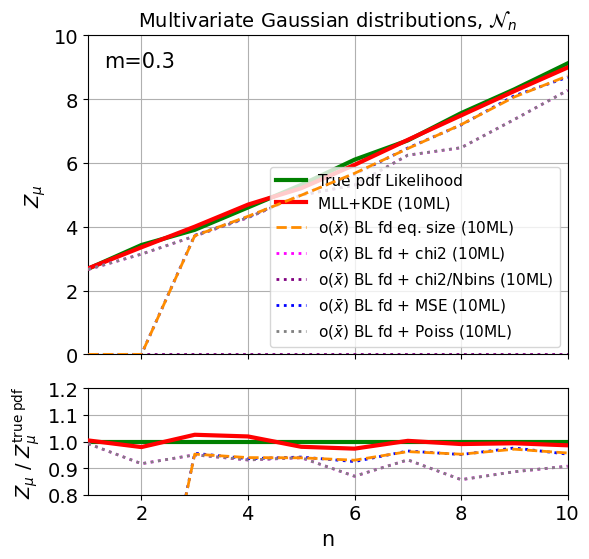

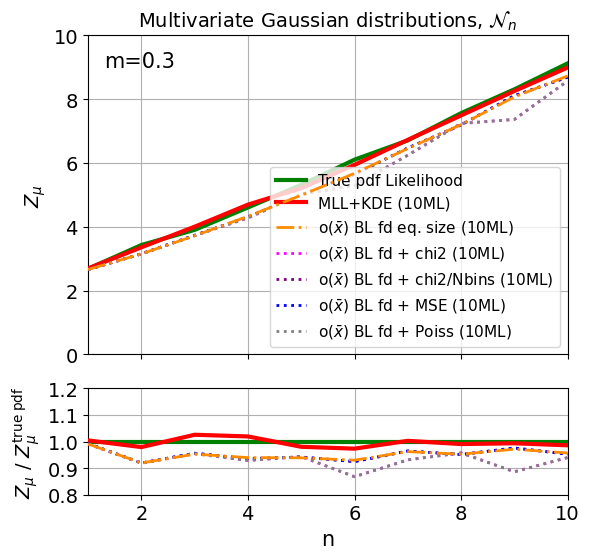

In [43]:
dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
#axs[0].plot(dim, store_Z_MLL_KDE_1ML, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
#axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.8,1.2])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1,1.2])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m03.pdf', format="pdf", bbox_inches="tight")
plt.show()








dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
#axs[0].plot(dim, store_Z_MLL_KDE_1ML, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
#axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size (10ML)' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2 (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss (10ML)' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.8,1.2])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1,1.2])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m03.pdf', format="pdf", bbox_inches="tight")
plt.show()

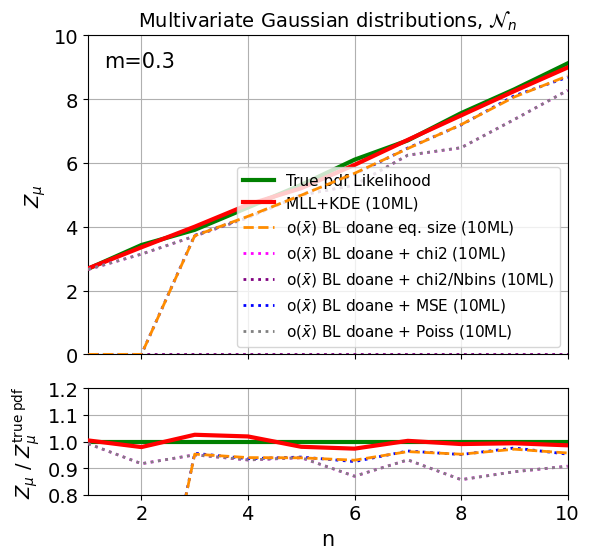

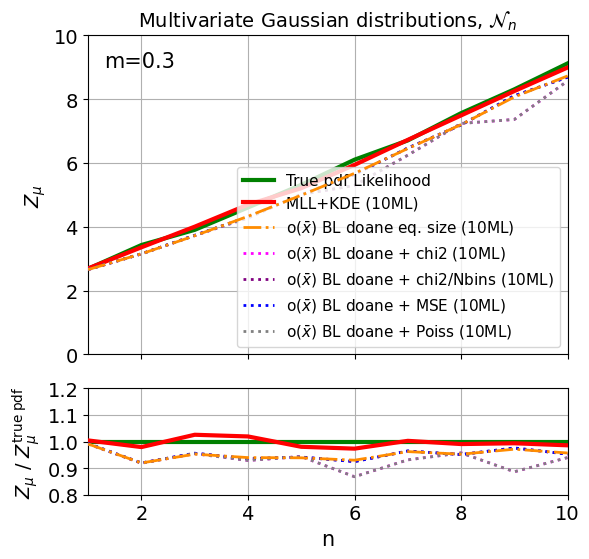

In [44]:
dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
#axs[0].plot(dim, store_Z_MLL_KDE_1ML, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
#axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.8,1.2])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1,1.2])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m03.pdf', format="pdf", bbox_inches="tight")
plt.show()








dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
#axs[0].plot(dim, store_Z_MLL_KDE_1ML, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
#axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL doane eq. size (10ML)' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL doane + chi2 (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL doane + chi2/Nbins (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL doane + MSE (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL doane + Poiss (10ML)' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.8,1.2])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1,1.2])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m03.pdf', format="pdf", bbox_inches="tight")
plt.show()

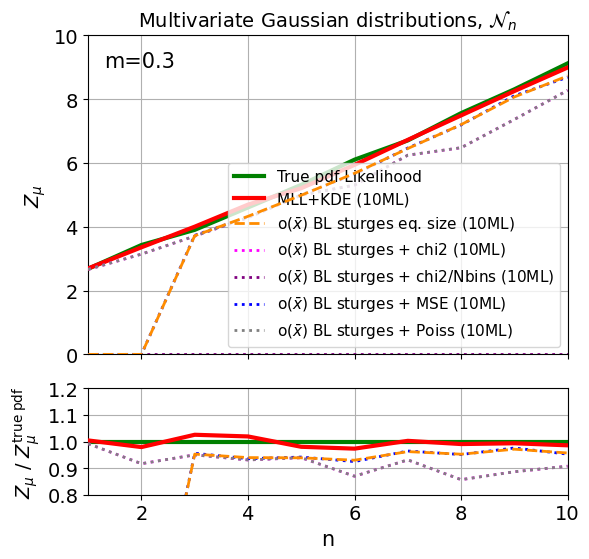

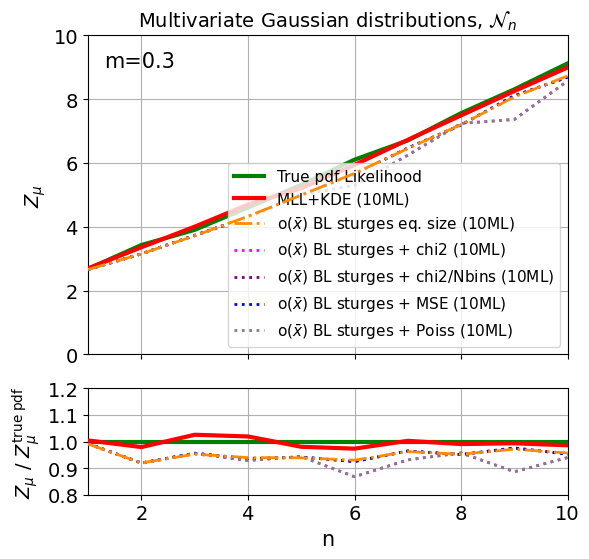

In [45]:
dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
#axs[0].plot(dim, store_Z_MLL_KDE_1ML, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
#axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.8,1.2])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1,1.2])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m03.pdf', format="pdf", bbox_inches="tight")
plt.show()








dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
#axs[0].plot(dim, store_Z_MLL_KDE_1ML, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
#axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
#axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, '-.', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins) (10ML)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins) (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL sturges eq. size (10ML)' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2 (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL sturges + chi2/Nbins (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL sturges + MSE (10ML)' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL sturges + Poiss (10ML)' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.8,1.2])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1,1.2])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m03.pdf', format="pdf", bbox_inches="tight")
plt.show()

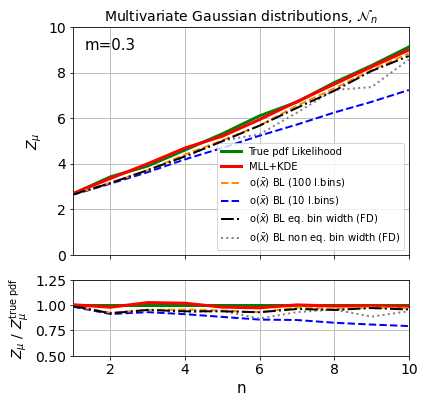

In [9]:

dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE', zorder=5 )
# axs[0].plot(dim, store_Z_MLL_KDE_1ML, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
# axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV0_zeros, '-.', color='black', lw=2, label=r'o$(\bar{x})$ BL eq. bin width (FD)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV0_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV0_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL non eq. bin width (FD)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV0_norm = [ a/b for a, b in zip(Z_bins_XG_CV0,store_Z_gaussian)]
Z_bins_XG_CV0_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV0_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV0_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV0_zeros_norm, '-.', color='black', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV0_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV0_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.5,1.25])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.5,0.75,1,1.25])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=10)
#axs[0].text(1.3, 0.4, 'Binning\nmethod:\n    FD', fontsize = 12)
plt.tight_layout()
plt.savefig('images/' + '2gaussian-Z-dims-m03-FD.pdf', format="pdf", bbox_inches="tight")
plt.show()

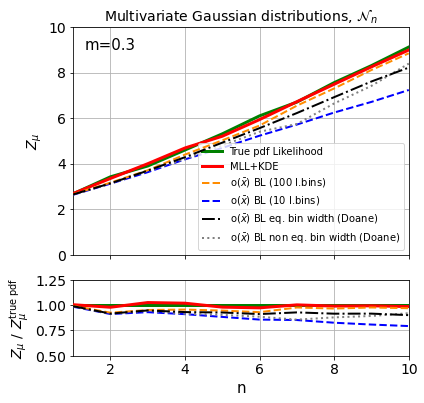

In [10]:

dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE', zorder=5 )
# axs[0].plot(dim, store_Z_MLL_KDE_1ML, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
# axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV1_zeros, '-.', color='black', lw=2, label=r'o$(\bar{x})$ BL eq. bin width (Doane)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV1_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV1_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV1_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL non eq. bin width (Doane)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV1_norm = [ a/b for a, b in zip(Z_bins_XG_CV1,store_Z_gaussian)]
Z_bins_XG_CV1_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_zeros,store_Z_gaussian)]
Z_bins_XG_CV1_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_chi2,store_Z_gaussian)]
Z_bins_XG_CV1_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV1_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_MSE,store_Z_gaussian)]
Z_bins_XG_CV1_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_poiss,store_Z_gaussian)]
Z_bins_XG_CV1_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV1_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV1_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV1_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV1_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV1_zeros_norm, '-.', color='black', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV1_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV1_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV1_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.5,1.25])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.5,0.75,1,1.25])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=10)
#axs[0].text(1.3, 0.4, 'Binning\nmethod:\n Doane', fontsize = 12)
plt.tight_layout()
plt.savefig('images/' + '2gaussian-Z-dims-m03-doane.pdf', format="pdf", bbox_inches="tight")
plt.show()

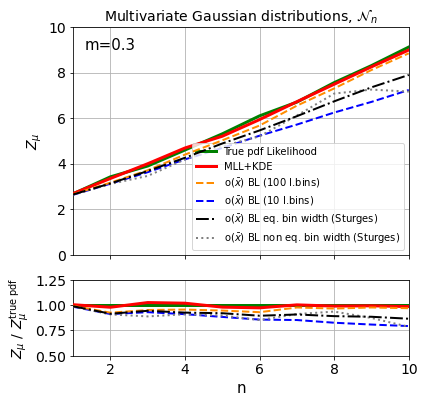

In [11]:

dim = [1,2,3,4,5,6,7,8,9,10]


fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE', zorder=5 )
# axs[0].plot(dim, store_Z_MLL_KDE_1ML, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
# axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
axs[0].plot(dim, Z_bins_XG_CV2_zeros, '-.', color='black', lw=2, label=r'o$(\bar{x})$ BL eq. bin width (Sturges)' ,zorder=10)
# axs[0].plot(dim, Z_bins_XG_CV2_chi2, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2_chi2_N, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2_MSE, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2_poiss, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2_chi2_zeros, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2_chi2_N_zeros, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[0].plot(dim, Z_bins_XG_CV2_MSE_zeros, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
axs[0].plot(dim, Z_bins_XG_CV2_poiss_zeros, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL non eq. bin width (Sturges)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
Z_bins_XG_CV2_norm = [ a/b for a, b in zip(Z_bins_XG_CV2,store_Z_gaussian)]
Z_bins_XG_CV2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_zeros,store_Z_gaussian)]
Z_bins_XG_CV2_chi2_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_chi2,store_Z_gaussian)]
Z_bins_XG_CV2_chi2_N_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_chi2_N,store_Z_gaussian)]
Z_bins_XG_CV2_MSE_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_MSE,store_Z_gaussian)]
Z_bins_XG_CV2_poiss_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_poiss,store_Z_gaussian)]
Z_bins_XG_CV2_chi2_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_chi2_zeros,store_Z_gaussian)]
Z_bins_XG_CV2_chi2_N_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_chi2_N_zeros,store_Z_gaussian)]
Z_bins_XG_CV2_MSE_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_MSE_zeros,store_Z_gaussian)]
Z_bins_XG_CV2_poiss_zeros_norm = [ a/b for a, b in zip(Z_bins_XG_CV2_poiss_zeros,store_Z_gaussian)]

dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE', zorder=5 )
# axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
axs[1].plot(dim, Z_bins_XG_CV2_zeros_norm, '-.', color='black', lw=2, label=r'o$(\bar{x})$ BL fd eq. size' ,zorder=10)
# axs[1].plot(dim, Z_bins_XG_CV2_chi2_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_chi2_N_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_MSE_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_poiss_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_chi2_zeros_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL fd + chi2' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_chi2_N_zeros_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL fd + chi2/Nbins' ,zorder=5)
# axs[1].plot(dim, Z_bins_XG_CV2_MSE_zeros_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL fd + MSE' ,zorder=5)
axs[1].plot(dim, Z_bins_XG_CV2_poiss_zeros_norm, ':', color='gray', lw=2, label=r'o$(\bar{x})$ BL fd + Poiss' ,zorder=5)



axs[0].text(1.3, 9, 'm=0.3', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([0, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.5,1.25])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.5,0.75,1,1.25])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=10)
#axs[0].text(1.3, 0.4, 'Binning\nmethod:\nSturges', fontsize = 12)
plt.tight_layout()
plt.savefig('images/' + '2gaussian-Z-dims-m03-sturges.pdf', format="pdf", bbox_inches="tight")
plt.show()